In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.linear_model import Lasso, LogisticRegression, Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, accuracy_score, log_loss
from sklearn.dummy import DummyRegressor, DummyClassifier
from yellowbrick.classifier import ROCAUC
from sklearn.metrics import confusion_matrix, precision_score, recall_score, auc
from sklearn.metrics import f1_score, classification_report, roc_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
from sklearn.model_selection import cross_val_score

In [2]:
def processing_and_merge(listings, reviews):

  amenities = listings['amenities'].str.split(',', expand=True)
  amenities = amenities.loc[amenities[77].notnull()]
  amenities_list = amenities.iloc[0]
  amenities_list = amenities_list.to_list()

  listings.loc[listings['amenities'].str.contains('Hot Water|Shower gel|Hair dryer|Bathtub|Shampoo|Essentials|Bidet|Conditioner|Body soap|Baby bath'),
              'bath-products'] = 1
  listings.loc[listings['amenities'].str.contains('Bluetooth sound system|Ethernet connection|Heating|Pocket wifi|Cable TV|Wifi'),
              'electric-system'] = 1
  listings.loc[listings['amenities'].str.contains('Breakfast'),
              'food-services'] = 1
  listings.loc[listings['amenities'].str.contains('Outdoor furniture|Dining table|Hangers|High chair|Crib|Clothing storage: wardrobe|Dedicated workspace|Drying rack for clothing|Bed linens|Extra pillows and blankets'),
              'house-furniture'] = 1
  listings.loc[listings['amenities'].str.contains('Cleaning before checkout|Luggage dropoff allowed|Long term stays allowed'),
              'house-rules'] = 1
  listings.loc[listings['amenities'].str.contains('Oven|Hot water kettle|Kitchen|Cooking basics|Microwave|Fire pit|Dishes and silverware|Barbecue utensils|Cleaning products|Baking sheet|Free washer|Free dryer|Iron|Dishwasher|Freezer|Coffee maker|Refrigerator|Toaster|dinnerware|BBQ grill|Stove|Wine glasses'),
                            'kitchen-appliances'] = 1
  listings.loc[listings['amenities'].str.contains('Free parking on premises|Free street parking'),
              'parking'] = 1
  listings.loc[listings['amenities'].str.contains('Board games|Indoor fireplace|Bikes|Shared patio or balcony|Private fenced garden or backyard|crib|books and toys|Outdoor dining area|Private gym in building|Piano|HDTV with Netflix|premium cable|standard cable'),
              'recreation'] = 1
  listings.loc[listings['amenities'].str.contains('Fire extinguisher|Carbon monoxide alarm|Window guards|Fireplace guards|First aid kit|Baby monitor|Private entrance|Lockbox|Smoke alarm|Room-darkening shades|Baby safety gates'),
              'safety'] = 1

  host_verification = listings['host_verifications'].str.split(',', expand=True)

  listings.loc[listings['host_verifications'].str.contains('email'),
              'host_email'] = 1
  listings.loc[listings['host_verifications'].str.contains('phone'),
              'host_phone'] = 1
  listings.loc[listings['host_verifications'].str.contains('work_email'),
              'host_work_email'] = 1

  new_feature_cols = listings.iloc[:,75:].columns
  listings[new_feature_cols] = listings[new_feature_cols].fillna(0)
  listings = listings.merge(reviews, how='inner', left_on='id', right_on='listing_id')

  return listings

In [3]:
def plot_nas(df: pd.DataFrame):
    if df.isnull().sum().sum() != 0:
        na_df = (df.isnull().sum() / len(df)) * 100
        na_df = na_df.drop(na_df[na_df == 0].index).sort_values(ascending=False)
        missing_data = pd.DataFrame({'NaN %' :na_df})
        missing_data.plot(kind = "bar")
        plt.show()
    else:
        print('No NAs found')

In [4]:
def drop_useless_cols(listings):
  not_needed_columns = [
    'id','listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
    'picture_url', 'host_id', 'host_url', 'host_name', 'host_location',
    'host_about', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
    'neighbourhood', 'neighbourhood_group_cleansed',
    'calendar_updated', 'first_review', 'last_review', 'license',
    'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes',
    'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms',
    'description', 'neighborhood_overview', 'host_verifications','host_since',
    'bathrooms', 'bathrooms_text', 'amenities', 'availability_30',
    'availability_60', 'availability_90', 'availability_365', 'calendar_last_scraped',
    'number_of_reviews_ltm', 'number_of_reviews_l30d', 'host_has_profile_pic', 'property_type',
    'minimum_minimum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm',
    'minimum_maximum_nights', 'maximum_minimum_nights', 'maximum_nights_avg_ntm'
    ]

  listings.drop(not_needed_columns, axis = 1, inplace = True)
  listings = listings.dropna()

  imputation_cols = ['bedrooms', 'beds']
  for i in imputation_cols:
      listings.loc[listings.loc[:,i].isnull(),i] = listings.loc[:,i].median()

  return listings

In [5]:
def plot_price_box(listings):
  # Step 1: Clean the `price` column
  listings['price'] = listings['price'].astype(str).str.replace('$', '').str.replace(',', '')
  listings['price'] = pd.to_numeric(listings['price'])

  # Step 2: Clean the `host_response_rate` and `host_acceptance_rate` columns
  listings['host_response_rate'] = listings["host_response_rate"].str.replace("%","")
  listings['host_response_rate'] = pd.to_numeric(listings['host_response_rate'])
  listings['host_acceptance_rate'] = listings["host_acceptance_rate"].str.replace("%","")
  listings['host_acceptance_rate'] = pd.to_numeric(listings['host_acceptance_rate'])

  # Step 3: Plot the initial price boxplot
  plt.figure(figsize=(10, 5))
  listings[['price']].plot(kind='box', title='Price BoxPlot')
  plt.ylim(0, 1600)
  plt.show()

  # Step 4: Filter the `price` column data
  listings_filtered = listings[(listings.price > 50) & (listings.price <= 300)]

  # Step 5: Plot the filtered price boxplot
  plt.figure(figsize=(10, 5))
  listings_filtered[['price']].plot(kind='box', title='Filtered Price BoxPlot')
  plt.show()

  listings_filtered.head()

  # Plot the distribution of host_response_rate
  plt.figure(figsize=(10, 6))
  listings['host_response_rate'].plot(kind='hist', bins=20, edgecolor='black', alpha=0.7)
  plt.title('Distribution of Host Response Rate')
  plt.xlabel('Host Response Rate (%)')
  plt.ylabel('Frequency')
  plt.grid(axis='y', linestyle='--', alpha=0.7)
  plt.show()

  return listings

In [6]:
def plot_review_cols(listings):
  # Convert review scores to numeric and fill NaNs with the mean value of each column
  review_score_columns = [
    'review_scores_accuracy',
    'review_scores_checkin',
    'review_scores_cleanliness',
    'review_scores_communication',
    'review_scores_location',
    'review_scores_rating',
    'review_scores_value'
  ]

  # Ensure all columns are numeric and fill NaNs with the mean value
  for col in review_score_columns:
      listings[col] = pd.to_numeric(listings[col], errors='coerce')
      listings[col].fillna(listings[col].mean(), inplace=True)

  # Plot the distribution of each review score column
  fig, axes = plt.subplots(3, 3, figsize=(18, 18))

  # Define positions to leave a gap in the grid
  positions = [1, 2, 3, 4, 5, 6, 8]  # Subplot positions in a 3x3 grid

  for i, (col, pos) in enumerate(zip(review_score_columns, positions)):
      ax = plt.subplot(3, 3, pos)
      listings[col].plot(kind='hist', bins=20, edgecolor='black', alpha=0.7, ax=ax)
      ax.set_title(f'Distribution of {col}')
      ax.set_xlabel(f'{col}')
      ax.set_ylabel('Frequency')
      ax.grid(axis='y', linestyle='--', alpha=0.7)

  plt.tight_layout()
  plt.show()


In [7]:
def plot_neighborhood(listings):
  # Calculate the number of listings in each neighborhood
  neighbourhood_DF = listings.groupby('neighbourhood_cleansed').host_response_time.count().reset_index()
  neighbourhood_DF = neighbourhood_DF.rename(columns={'host_response_time': 'Number_Of_Listings'})

  # Sort by the number of listings
  neighbourhood_DF = neighbourhood_DF.sort_values(by='Number_Of_Listings', ascending=False)

  # Plot the bar chart
  plt.figure(figsize=(18, 8))
  plt.bar(neighbourhood_DF['neighbourhood_cleansed'], neighbourhood_DF['Number_Of_Listings'])
  plt.title('Dublin Neighborhood Frequency')
  plt.xlabel('Neighborhood')
  plt.ylabel('Number of Listings')
  plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
  plt.show()


In [8]:
def statics_review_score(listings):
  # Define the list of review score columns
  review_score_columns = [
      'review_scores_accuracy',
      'review_scores_checkin',
      'review_scores_cleanliness',
      'review_scores_communication',
      'review_scores_location',
      'review_scores_rating',
      'review_scores_value'
  ]

  # Calculate and print statistics for each review score column
  for col in review_score_columns:
      print(f"{col} statistics:")
      print(f"Mean: {listings[col].mean()}")
      print(f"Median: {listings[col].median()}")
      print(f"Mode: {listings[col].mode()[0]}")
      print(f"Min: {listings[col].min()}")
      print(f"Max: {listings[col].max()}")
      print("\n")


In [9]:
def plot_Kernel_Density_Estimate(listings):
  plt.figure(figsize=(18, 18))

  # Define the list of review score columns and their subplot positions
  review_score_columns = [
      'review_scores_accuracy',
      'review_scores_checkin',
      'review_scores_cleanliness',
      'review_scores_communication',
      'review_scores_location',
      'review_scores_rating',
      'review_scores_value'
  ]

  positions = [1, 2, 3, 4, 5, 6, 8]  # Subplot positions in a 3x3 grid

  for col, pos in zip(review_score_columns, positions):
      plt.subplot(3, 3, pos)
      density = sns.kdeplot(listings[col], color="b", label=f'{col} - density')
      x = density.lines[0].get_xdata()
      y = density.lines[0].get_ydata()
      mean = listings[col].mean()
      height = np.interp(mean, x, y)
      density.vlines(mean, 0, height, color='b', ls=':')
      density.fill_between(x, 0, y, facecolor='b', alpha=0.2)
      plt.legend()

  plt.tight_layout()
  plt.show()

In [10]:
def minmax(X):
    X_std = (X - X.min()) / (X.max() - X.min())
    X_scaled = X_std * (X.max() - X.min()) + X.min()
    return X_scaled

In [11]:
def scaling_data(listings):
  scaling_data = ['host_response_rate', 'host_acceptance_rate', 'bedrooms', 'beds',
                'host_listings_count', 'host_total_listings_count',
                'latitude', 'longitude', 'accommodates', 'price',
                'minimum_nights', 'maximum_nights', 'number_of_reviews', 'num_cmt', #'avg_senti',
                'review_scores_rating', 'review_scores_accuracy',
                'review_scores_cleanliness', 'review_scores_checkin',
                'review_scores_communication', 'review_scores_location',
                'review_scores_value', 'reviews_per_month','bath-products','electric-system',
                'food-services','house-furniture','house-rules',
                'kitchen-appliances','parking','recreation','safety',
                'host_email','host_work_email']

  for i in scaling_data:
    listings[i] = minmax(listings[i])

  listings.dropna(axis = 1, inplace = True)
  label_encoder = preprocessing.LabelEncoder()
  listings.host_response_time     = label_encoder.fit_transform(listings.host_response_time)
  listings.host_is_superhost      = label_encoder.fit_transform(listings.host_is_superhost)
  listings.host_identity_verified = label_encoder.fit_transform(listings.host_identity_verified)
  listings.instant_bookable       = label_encoder.fit_transform(listings.instant_bookable)
  listings.room_type              = label_encoder.fit_transform(listings.room_type)
  listings.neighbourhood_cleansed = label_encoder.fit_transform(listings.neighbourhood_cleansed)
  listings.has_availability       = label_encoder.fit_transform(listings.has_availability)

  test_corr = listings.corr()
  test_corr.to_csv("test_corr.csv")

  return listings

In [12]:
def plot_confusion_matrix(y_test, y_pred, title):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

In [13]:
def ROCAUC_visualizer(model, bin_count, X, y):
    y = y['rating_bin_ep'].astype(int)
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
    y_train = y_train.astype(int)
    y_test = y_test.astype(int)

    visualizer = ROCAUC(model, classes=list(range(bin_count)), macro=False, micro=False)
    visualizer.fit(x_train, y_train)
    visualizer.score(x_test, y_test)
    visualizer.show()

In [14]:
def bin_column(listings, col, n_bins):
  X = listings[
                ['host_response_time', 'host_response_rate', 'host_acceptance_rate',
                 'bedrooms', 'beds','neighbourhood_cleansed',
                 'host_is_superhost', 'host_listings_count', 'host_total_listings_count',
                 'host_identity_verified', 'room_type',
                 'accommodates','price', 'minimum_nights', 'maximum_nights',
                 'bath-products','electric-system',
                 'food-services','house-furniture','house-rules',
                 'kitchen-appliances','parking','recreation','safety',
                 'host_email','host_work_email'] + list(reviews.columns[2:])
  ]

  y = listings[[col]]
  y = (y/y.max())*100

  y = y.assign(
      rating_bin_ep = pd.qcut(
          y[col],
          q=n_bins,
          duplicates='drop',
          labels=list(range(n_bins))
      )
  )

  y.groupby('rating_bin_ep').min()
  y.groupby('rating_bin_ep').max()

  return X , y

In [15]:
def select_important_features(X, y, threshold=0.05):

    correlations = X.corrwith(y).abs().sort_values(ascending=False)
    selected_features = correlations[correlations > threshold].index

    plt.figure(figsize=(10, 6))
    sns.barplot(x=selected_features, y=correlations[selected_features], palette="viridis")
    plt.axhline(y=threshold, color='r', linestyle='--', label=f'Threshold ({threshold})')
    plt.xlabel('Features')
    plt.ylabel('Correlation with target')
    plt.title('Selected Features and Their Correlations')
    plt.xticks(rotation=90)
    plt.legend()
    plt.show()

    return selected_features, correlations

In [16]:
def check_bins(y):
  y1 = y['rating_bin_ep']
  cnt_plt = sns.countplot(y1)
  cnt_plt.bar_label(cnt_plt.containers[0])
  plt.show()

In [17]:
def evaluate_logistic_regression(X, y, c_range, degree_range=[1], bin_count=2):

    y1 = y['rating_bin_ep']
    for i in degree_range:
        trans = PolynomialFeatures(degree=i)
        x_poly = trans.fit_transform(X)
        x_train, x_test, y_train, y_test = train_test_split(x_poly, y1, test_size=0.2, random_state=1)
        mean_error = []
        std_error = []
        for c in c_range:
            log_reg = LogisticRegression(C=c, random_state=0, solver='newton-cg', multi_class='multinomial')
            log_reg.fit(x_train, y_train)
            y_pred = log_reg.predict(x_test)

            cnf_mtx = confusion_matrix(y_test, y_pred)
            f1_score = metrics.f1_score(y_test, y_pred, average='weighted')

            scores = cross_val_score(log_reg, x_test, y_test, cv=5, scoring='accuracy')
            mean_error.append(np.array(scores).mean())
            std_error.append(np.array(scores).std())

            print(" Logistic Regression")
            print(" For Degree = ", i)
            print(" For C = ", c)
            print(" Confusion Matrix - \n", cnf_mtx)
            print(' Train accuracy score: ', log_reg.score(x_train, y_train))
            print(' Test accuracy score: ', log_reg.score(x_test, y_test))
            print(" F1 Score = ", f1_score)
            print(" Mean Squared Error = ", mean_squared_error(y_test, y_pred))
            print(" Classification Report\n", classification_report(y_test, y_pred))
            print("\n")

            title = f"Logistic Regression Confusion Matrix\nFor Degree = {i} and C = {c}"
            plot_confusion_matrix(y_test, y_pred, title)

        plt.errorbar(c_range, mean_error, yerr=std_error, linewidth=3)
        plt.xlabel('C', fontsize=25)
        plt.ylabel('Accuracy Score', fontsize=25)
        title_cv = f"Logistic Regression - Cross Validation \nFor Degree = {i}"
        plt.title(title_cv, fontsize=25)
        plt.show()

        ROCAUC_visualizer(log_reg, bin_count, x_poly, y)

In [18]:
def evaluate_knn(X, y, nn_range, bin_count=2):
    y1 = y['rating_bin_ep']
    x_train, x_test, y_train, y_test = train_test_split(X, y1, test_size=0.2, random_state=1)
    merr = []
    serr = []

    for nn in nn_range:
        knn_model = KNeighborsClassifier(n_neighbors=nn, weights='uniform')
        knn_model.fit(x_train, y_train)
        y_pred_nn = knn_model.predict(x_test)

        cnf_mtx = confusion_matrix(y_test, y_pred_nn)
        f1_score = metrics.f1_score(y_test, y_pred_nn, average='weighted')

        scores_knn = cross_val_score(knn_model, x_test, y_test, cv=5, scoring='accuracy')
        merr.append(np.array(scores_knn).mean())
        serr.append(np.array(scores_knn).std())

        print(" K Neighbors Classifier")
        print(" For NN = ", nn)
        print(" Confusion Matrix - \n", cnf_mtx)
        print(' Train accuracy score: ', knn_model.score(x_train, y_train))
        print(' Test accuracy score: ', knn_model.score(x_test, y_test))
        print(" F1 Score = ", f1_score)
        print(" Mean Squared Error = ", mean_squared_error(y_test, y_pred_nn))
        print(" Classification Report\n", classification_report(y_test, y_pred_nn))
        print("\n")

        title = f"k-NN Confusion Matrix\nFor NN = {nn}"
        plot_confusion_matrix(y_test, y_pred_nn, title)

    plt.errorbar(nn_range, merr, yerr=serr, linewidth=3)
    plt.xlabel('NN', fontsize=25)
    plt.ylabel('Accuracy Score', fontsize=25)
    title_cv = f"k-NN - Cross Validation"
    plt.title(title_cv, fontsize=25)
    plt.show()

    ROCAUC_visualizer(knn_model, bin_count, X, y)

In [19]:
def evaluate_decision_tree(X, y, depth_range, bin_count=2):
    y1 = y['rating_bin_ep']
    x_train, x_test, y_train, y_test = train_test_split(X, y1, test_size=0.2, random_state=1)
    merr_dt = []
    serr_dt = []

    for depth in depth_range:
        dt_model = DecisionTreeClassifier(max_depth=depth, random_state=1)
        dt_model.fit(x_train, y_train)
        y_pred_dt = dt_model.predict(x_test)

        cnf_mtx = confusion_matrix(y_test, y_pred_dt)
        f1_score = metrics.f1_score(y_test, y_pred_dt, average='weighted')

        scores_dt = cross_val_score(dt_model, x_test, y_test, cv=5, scoring='accuracy')
        merr_dt.append(np.array(scores_dt).mean())
        serr_dt.append(np.array(scores_dt).std())

        print(" Decision Tree Classifier")
        print(" For Depth = ", depth)
        print(" Confusion Matrix - \n", cnf_mtx)
        print(' Train accuracy score: ', dt_model.score(x_train, y_train))
        print(' Test accuracy score: ', dt_model.score(x_test, y_test))
        print(" F1 Score = ", f1_score)
        print(" Mean Squared Error = ", mean_squared_error(y_test, y_pred_dt))
        print(" Classification Report\n", classification_report(y_test, y_pred_dt))
        print("\n")

        title = f"Decision Tree Confusion Matrix\nFor Depth = {depth}"
        plot_confusion_matrix(y_test, y_pred_dt, title)


    plt.errorbar(depth_range, merr_dt, yerr=serr_dt, linewidth=3)
    plt.xlabel('Depth', fontsize=25)
    plt.ylabel('Accuracy Score', fontsize=25)
    title_cv = f"Decision Tree - Cross Validation"
    plt.title(title_cv, fontsize=25)
    plt.show()

    ROCAUC_visualizer(dt_model, bin_count, X, y)

In [20]:
def plot_kde_by_bin(X, y, feature, bin_column, bins=3, ylim=(0, 19), xlim=(-0.25, 1)):
    test = pd.concat([X, y], axis=1)
    colors = ['r', 'g', 'b']
    labels = [f'{feature}, bin={i}' for i in range(bins)]

    for i in range(bins):
        sns.kdeplot(test.loc[test[bin_column] == i, feature], color=colors[i], label=labels[i]).set(ylim=ylim, xlim=xlim)
        plt.legend()

    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.title(f'KDE of {feature} by {bin_column}')
    plt.show()

In [21]:
def plot_super_host(X, y):
  test = pd.concat([X, y], axis=1)
  test = test.groupby(['host_is_superhost', 'rating_bin_ep']).size().unstack()

  plt.figure(figsize=(18, 6))

  plt.subplot(1, 2, 1)
  for j in range(3):
      plt.bar(j, test.loc[1, j], label=f'Bin {j}', alpha=0.7)
  plt.title("Host is a Super Host")
  plt.legend()
  plt.xlabel('Review Bin', fontweight='bold', fontsize=15)
  plt.ylabel('# Records', fontweight='bold', fontsize=15)

  plt.subplot(1, 2, 2)
  for j in range(3):
      plt.bar(j, test.loc[0, j], label=f'Bin {j}', alpha=0.7)
  plt.title("Host is not a Super Host")
  plt.legend()
  plt.xlabel('Review Bin', fontweight='bold', fontsize=15)
  plt.ylabel('# Records', fontweight='bold', fontsize=15)

  plt.show()

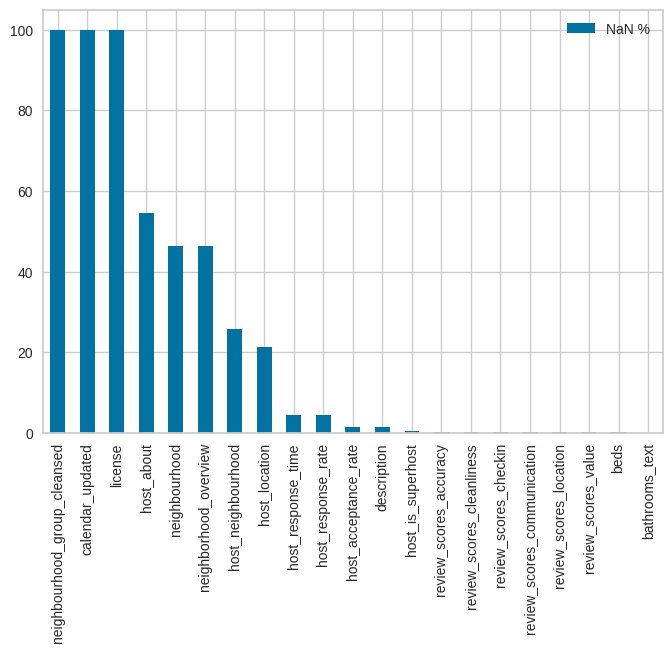

In [24]:
listings = pd.read_csv("listings.csv")
reviews = pd.read_csv("reviews_final.csv")

listings = processing_and_merge(listings, reviews)
plot_nas(listings)
listings = drop_useless_cols(listings)


<Figure size 1000x500 with 0 Axes>

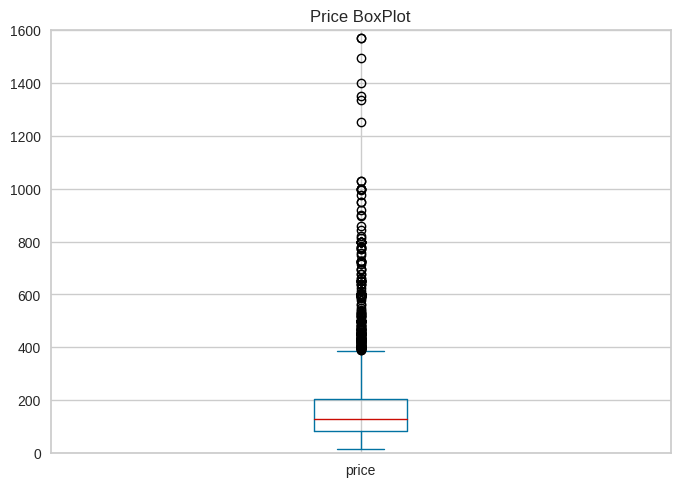

<Figure size 1000x500 with 0 Axes>

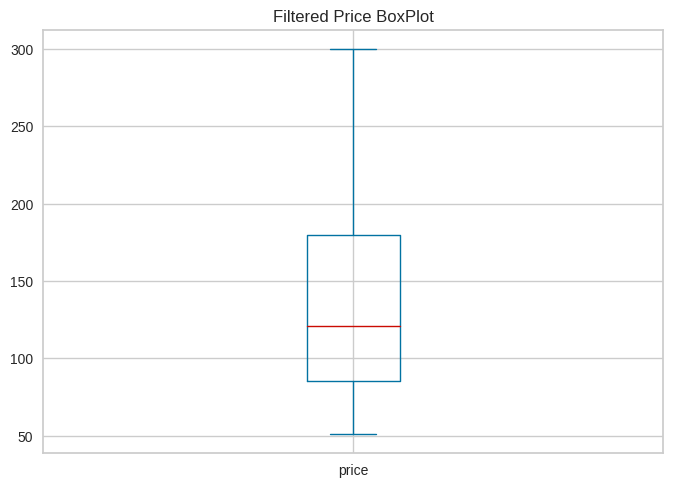

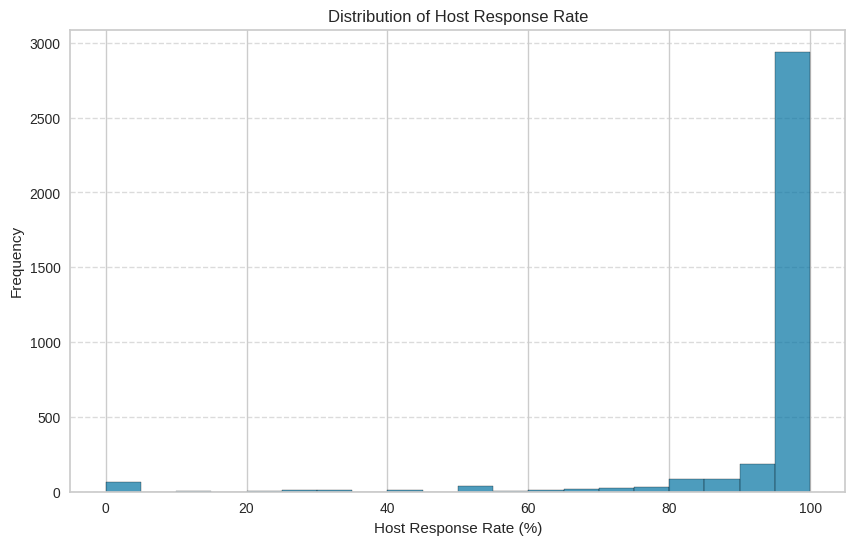

In [25]:
listings = plot_price_box(listings)

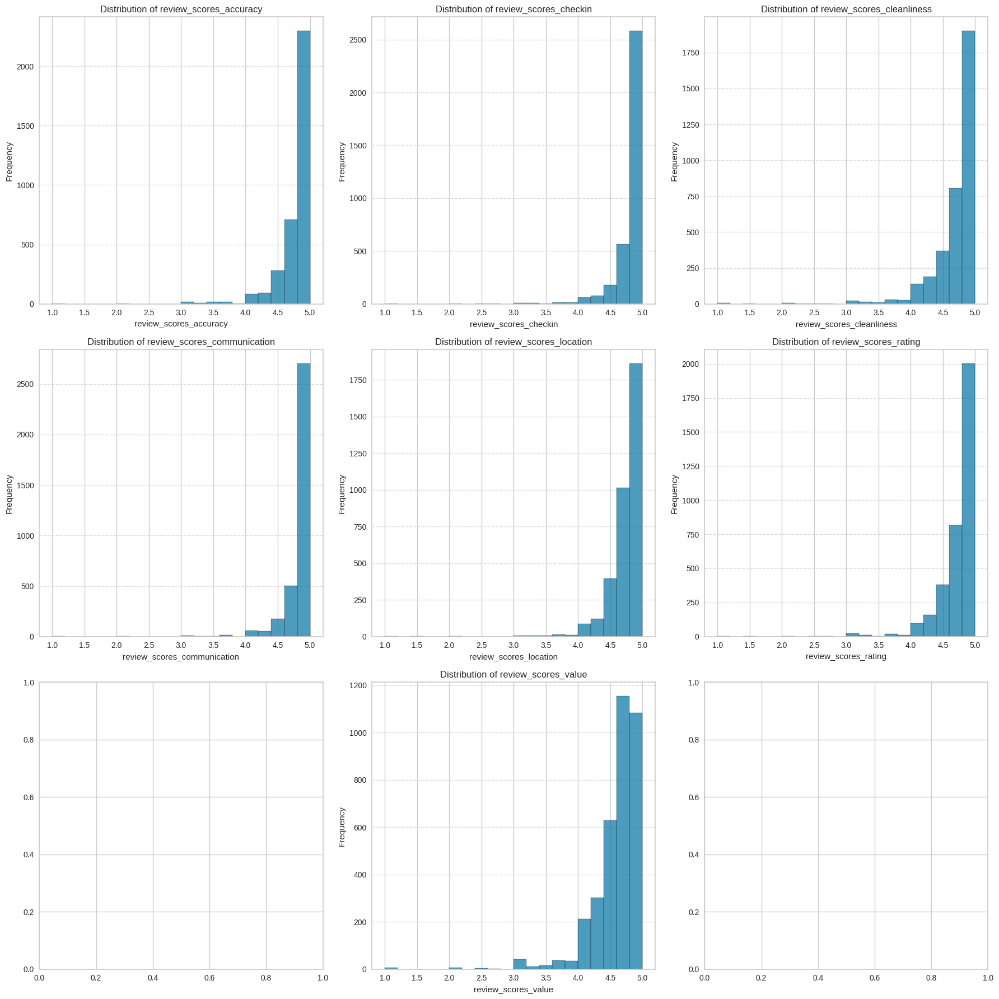

In [26]:
plot_review_cols(listings)

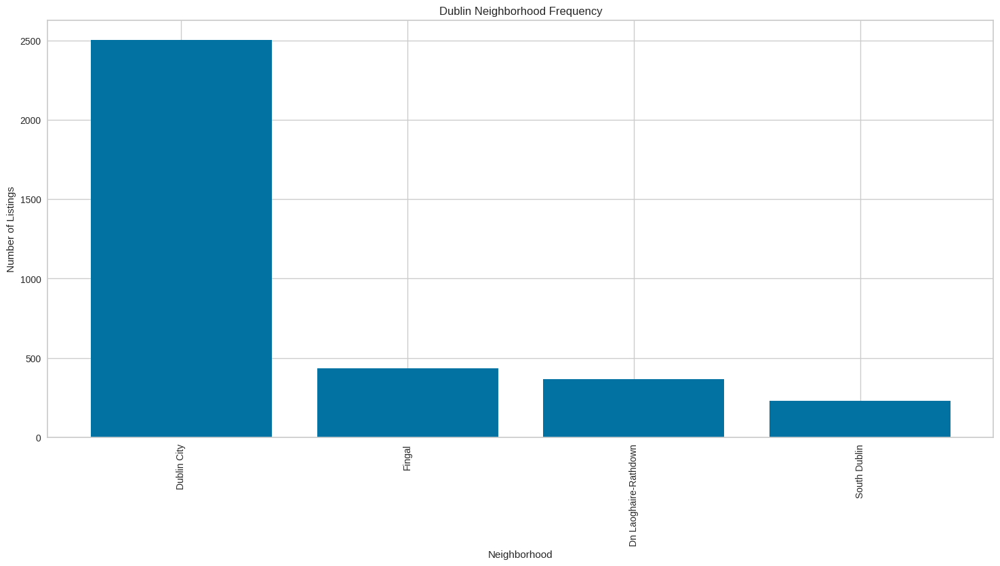

In [27]:
plot_neighborhood(listings)

In [28]:
statics_review_score(listings)

review_scores_accuracy statistics:
Mean: 4.7867335972850675
Median: 4.88
Mode: 5.0
Min: 1.0
Max: 5.0


review_scores_checkin statistics:
Mean: 4.825353506787329
Median: 4.92
Mode: 5.0
Min: 1.0
Max: 5.0


review_scores_cleanliness statistics:
Mean: 4.712415158371041
Median: 4.83
Mode: 5.0
Min: 1.0
Max: 5.0


review_scores_communication statistics:
Mean: 4.8513404977375565
Median: 4.94
Mode: 5.0
Min: 1.0
Max: 5.0


review_scores_location statistics:
Mean: 4.753696266968325
Median: 4.82
Mode: 5.0
Min: 1.0
Max: 5.0


review_scores_rating statistics:
Mean: 4.748371040723981
Median: 4.85
Mode: 5.0
Min: 1.0
Max: 5.0


review_scores_value statistics:
Mean: 4.603701923076923
Median: 4.69
Mode: 5.0
Min: 1.0
Max: 5.0




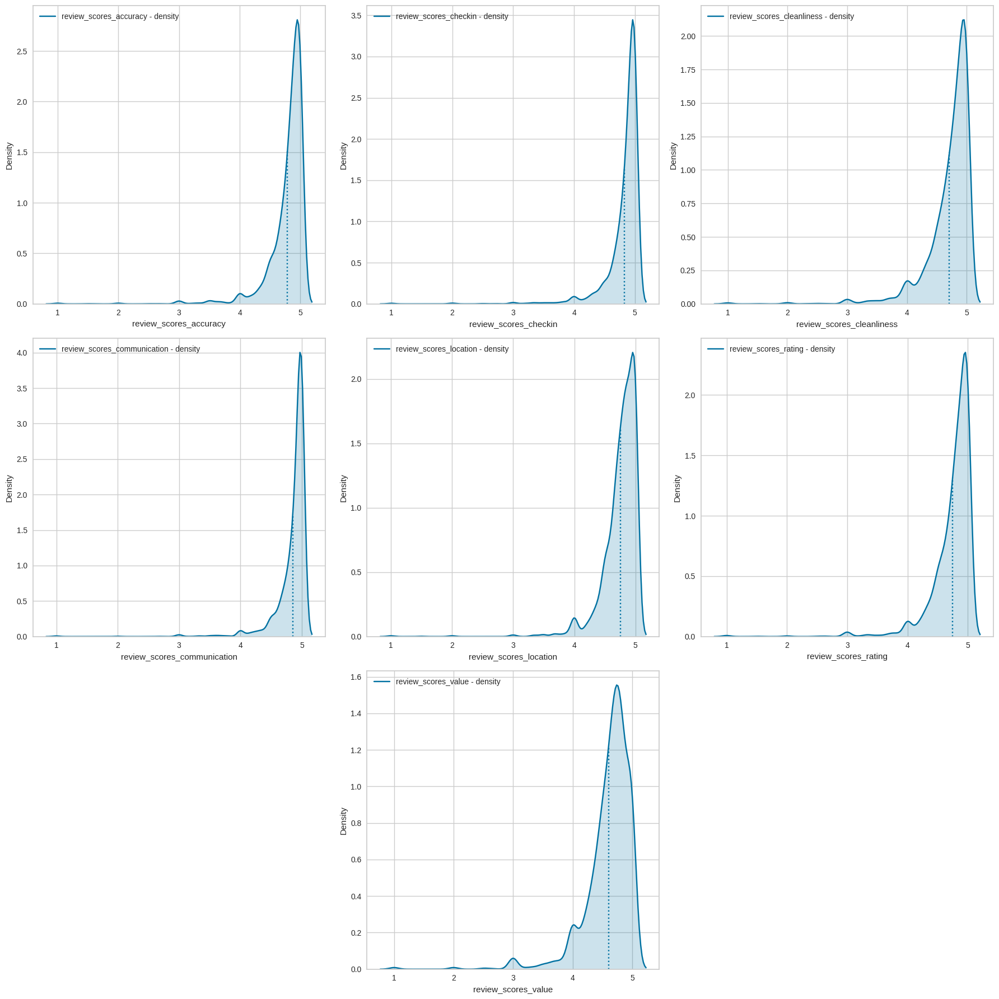

In [29]:
plot_Kernel_Density_Estimate(listings)

In [30]:
listings = scaling_data(listings)
c_range = [0.001, 0.1, 1, 10, 100, 1000]
degree_range = [1, 2]
nn_range = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19]
depth_range = [3, 5, 7, 9, 11, 13, 15, 17, 19]

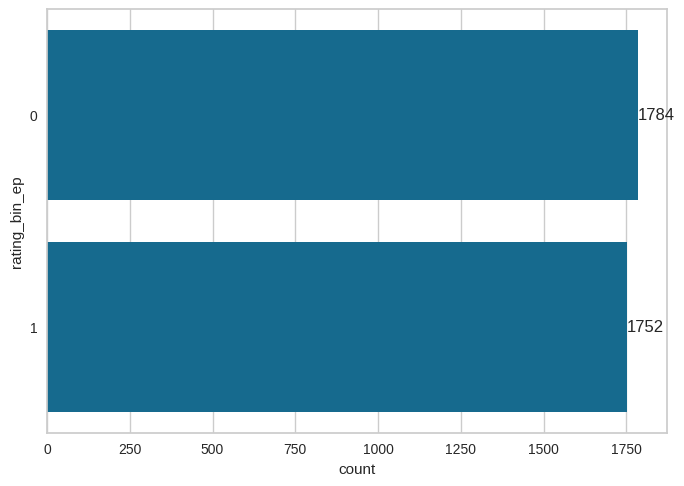

In [31]:
X,y = bin_column(listings, 'review_scores_checkin', 2)
check_bins(y)

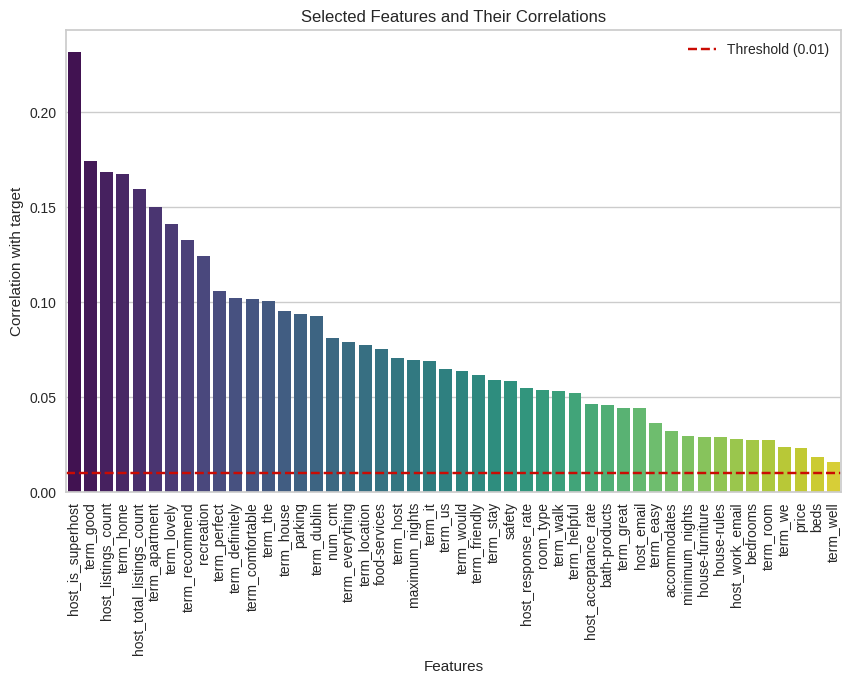

(Index(['host_is_superhost', 'term_good', 'host_listings_count', 'term_home',
        'host_total_listings_count', 'term_apartment', 'term_lovely',
        'term_recommend', 'recreation', 'term_perfect', 'term_definitely',
        'term_comfortable', 'term_the', 'term_house', 'parking', 'term_dublin',
        'num_cmt', 'term_everything', 'term_location', 'food-services',
        'term_host', 'maximum_nights', 'term_it', 'term_us', 'term_would',
        'term_friendly', 'term_stay', 'safety', 'host_response_rate',
        'room_type', 'term_walk', 'term_helpful', 'host_acceptance_rate',
        'bath-products', 'term_great', 'host_email', 'term_easy',
        'accommodates', 'minimum_nights', 'house-furniture', 'house-rules',
        'host_work_email', 'bedrooms', 'term_room', 'term_we', 'price', 'beds',
        'term_well'],
       dtype='object'),
 host_is_superhost            0.231603
 term_good                    0.174162
 host_listings_count          0.168480
 term_home           

In [32]:
yy = listings['review_scores_checkin']
select_important_features(X, yy, threshold=0.01)

 Logistic Regression
 For Degree =  1
 For C =  0.001
 Confusion Matrix - 
 [[230 125]
 [140 213]]
 Train accuracy score:  0.6364922206506365
 Test accuracy score:  0.6257062146892656
 F1 Score =  0.6255156963694807
 Mean Squared Error =  0.3742937853107345
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.65      0.63       355
           1       0.63      0.60      0.62       353

    accuracy                           0.63       708
   macro avg       0.63      0.63      0.63       708
weighted avg       0.63      0.63      0.63       708





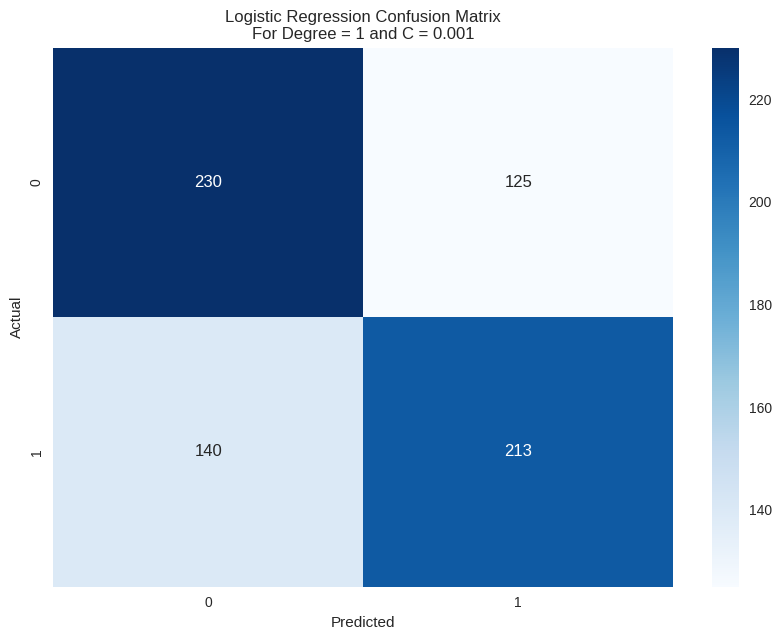

 Logistic Regression
 For Degree =  1
 For C =  0.1
 Confusion Matrix - 
 [[247 108]
 [131 222]]
 Train accuracy score:  0.6782178217821783
 Test accuracy score:  0.6624293785310734
 F1 Score =  0.6620416678106849
 Mean Squared Error =  0.3375706214689266
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.70      0.67       355
           1       0.67      0.63      0.65       353

    accuracy                           0.66       708
   macro avg       0.66      0.66      0.66       708
weighted avg       0.66      0.66      0.66       708





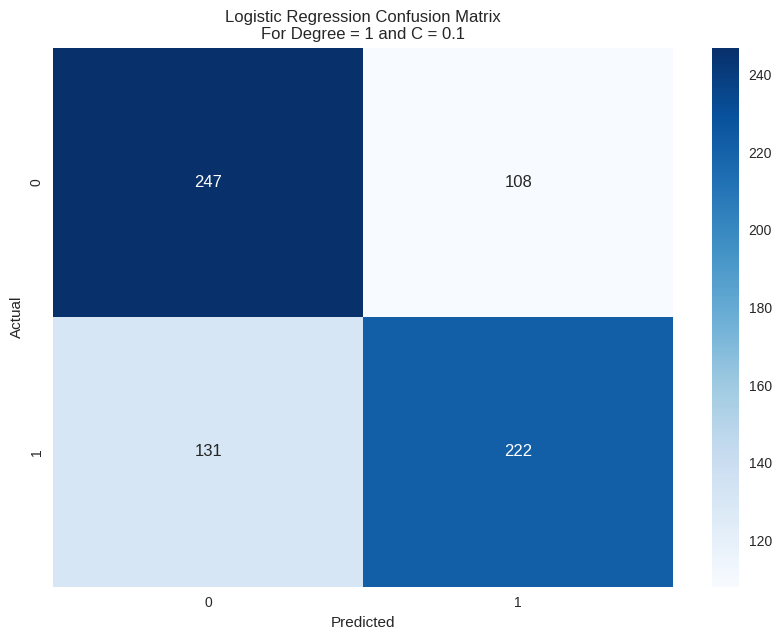

 Logistic Regression
 For Degree =  1
 For C =  1
 Confusion Matrix - 
 [[250 105]
 [127 226]]
 Train accuracy score:  0.6867043847241867
 Test accuracy score:  0.672316384180791
 F1 Score =  0.671970825770858
 Mean Squared Error =  0.327683615819209
 Classification Report
               precision    recall  f1-score   support

           0       0.66      0.70      0.68       355
           1       0.68      0.64      0.66       353

    accuracy                           0.67       708
   macro avg       0.67      0.67      0.67       708
weighted avg       0.67      0.67      0.67       708





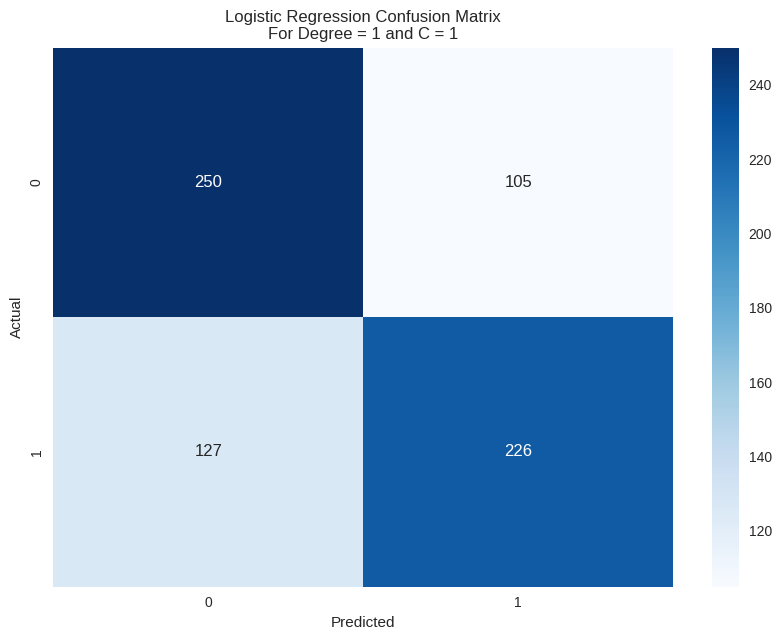

 Logistic Regression
 For Degree =  1
 For C =  10
 Confusion Matrix - 
 [[252 103]
 [120 233]]
 Train accuracy score:  0.6888260254596889
 Test accuracy score:  0.6850282485875706
 F1 Score =  0.6848251436436869
 Mean Squared Error =  0.3149717514124294
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.71      0.69       355
           1       0.69      0.66      0.68       353

    accuracy                           0.69       708
   macro avg       0.69      0.68      0.68       708
weighted avg       0.69      0.69      0.68       708





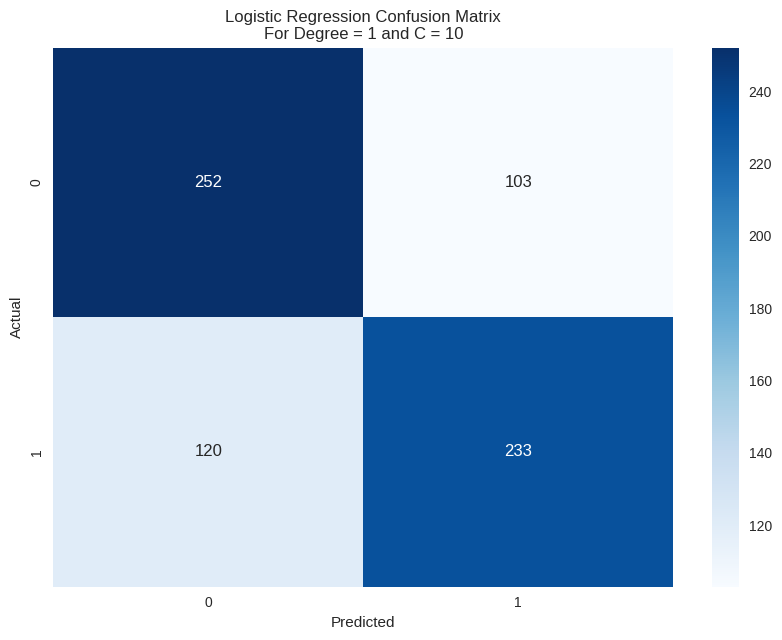

 Logistic Regression
 For Degree =  1
 For C =  100
 Confusion Matrix - 
 [[252 103]
 [119 234]]
 Train accuracy score:  0.6888260254596889
 Test accuracy score:  0.6864406779661016
 F1 Score =  0.6862604067065781
 Mean Squared Error =  0.3135593220338983
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.71      0.69       355
           1       0.69      0.66      0.68       353

    accuracy                           0.69       708
   macro avg       0.69      0.69      0.69       708
weighted avg       0.69      0.69      0.69       708





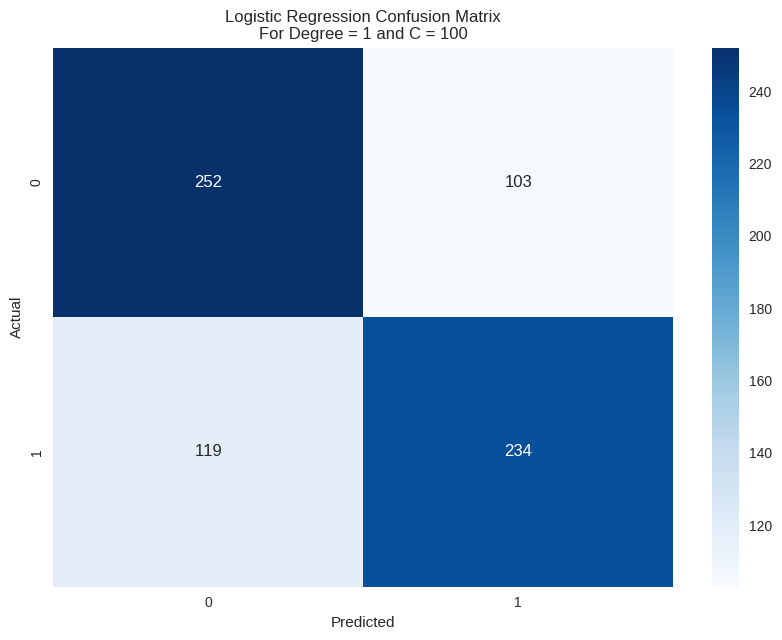

 Logistic Regression
 For Degree =  1
 For C =  1000
 Confusion Matrix - 
 [[252 103]
 [119 234]]
 Train accuracy score:  0.6884724186704385
 Test accuracy score:  0.6864406779661016
 F1 Score =  0.6862604067065781
 Mean Squared Error =  0.3135593220338983
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.71      0.69       355
           1       0.69      0.66      0.68       353

    accuracy                           0.69       708
   macro avg       0.69      0.69      0.69       708
weighted avg       0.69      0.69      0.69       708





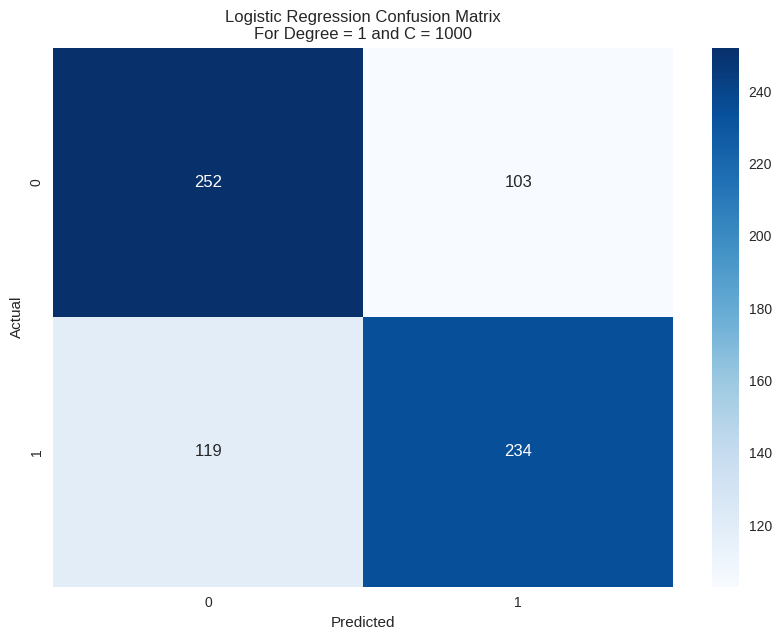

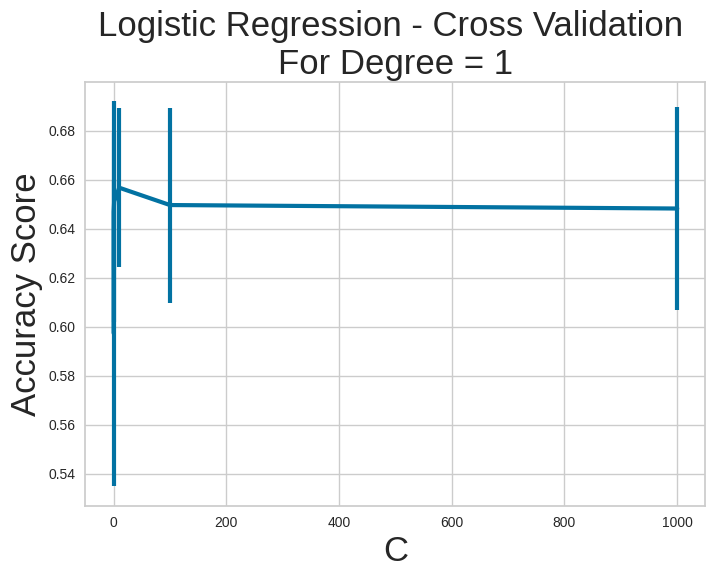

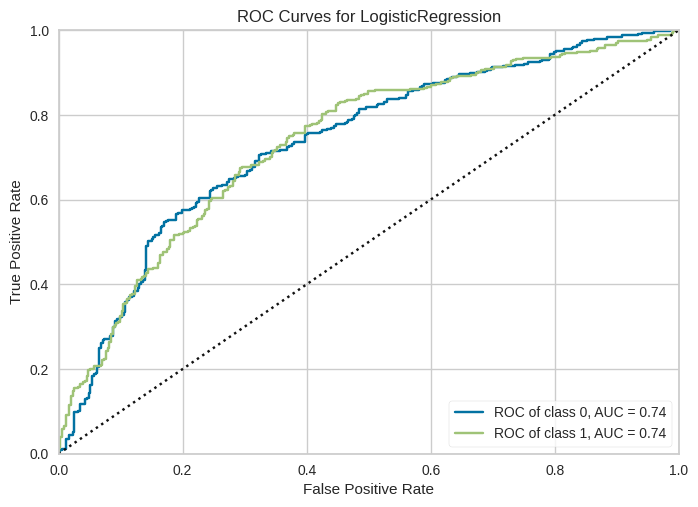

 Logistic Regression
 For Degree =  2
 For C =  0.001
 Confusion Matrix - 
 [[244 111]
 [119 234]]
 Train accuracy score:  0.7496463932107497
 Test accuracy score:  0.6751412429378532
 F1 Score =  0.6750893862590713
 Mean Squared Error =  0.3248587570621469
 Classification Report
               precision    recall  f1-score   support

           0       0.67      0.69      0.68       355
           1       0.68      0.66      0.67       353

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





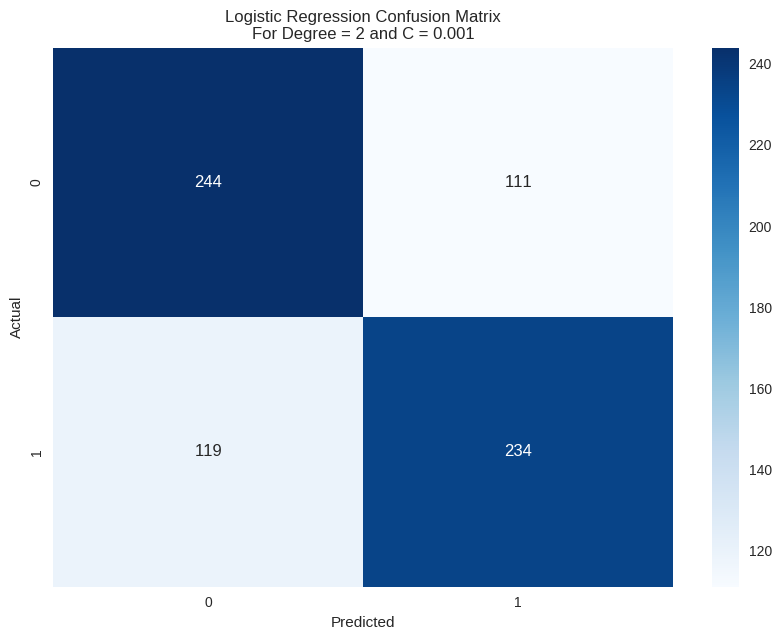

 Logistic Regression
 For Degree =  2
 For C =  0.1
 Confusion Matrix - 
 [[244 111]
 [114 239]]
 Train accuracy score:  0.7503536067892503
 Test accuracy score:  0.6822033898305084
 F1 Score =  0.6821938794988054
 Mean Squared Error =  0.3177966101694915
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.69      0.68       355
           1       0.68      0.68      0.68       353

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





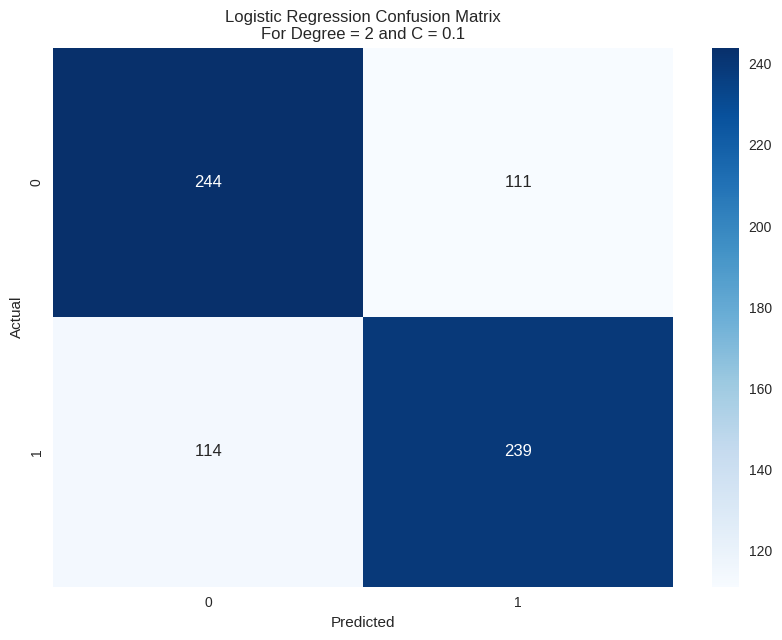

 Logistic Regression
 For Degree =  2
 For C =  1
 Confusion Matrix - 
 [[241 114]
 [118 235]]
 Train accuracy score:  0.751060820367751
 Test accuracy score:  0.672316384180791
 F1 Score =  0.672300693902555
 Mean Squared Error =  0.327683615819209
 Classification Report
               precision    recall  f1-score   support

           0       0.67      0.68      0.68       355
           1       0.67      0.67      0.67       353

    accuracy                           0.67       708
   macro avg       0.67      0.67      0.67       708
weighted avg       0.67      0.67      0.67       708





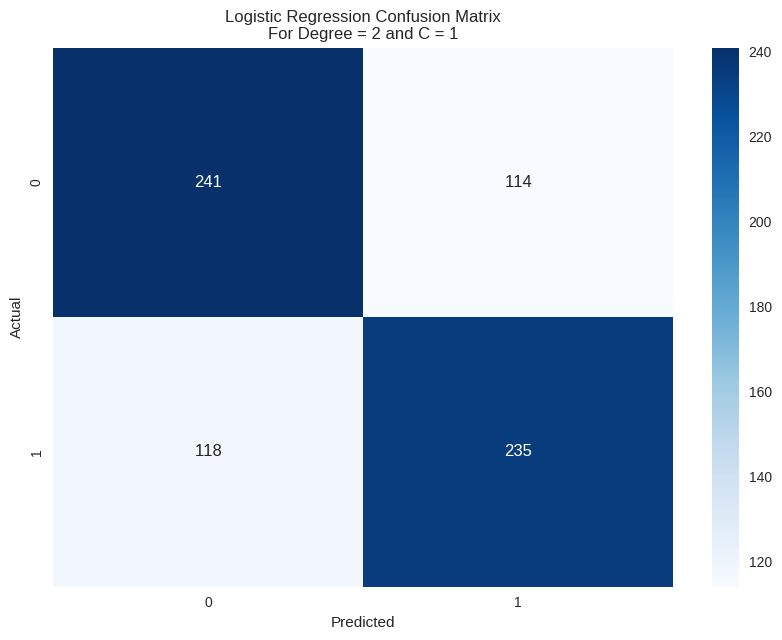

 Logistic Regression
 For Degree =  2
 For C =  10
 Confusion Matrix - 
 [[246 109]
 [117 236]]
 Train accuracy score:  0.7521216407355021
 Test accuracy score:  0.6807909604519774
 F1 Score =  0.6807400056284788
 Mean Squared Error =  0.3192090395480226
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.69      0.69       355
           1       0.68      0.67      0.68       353

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





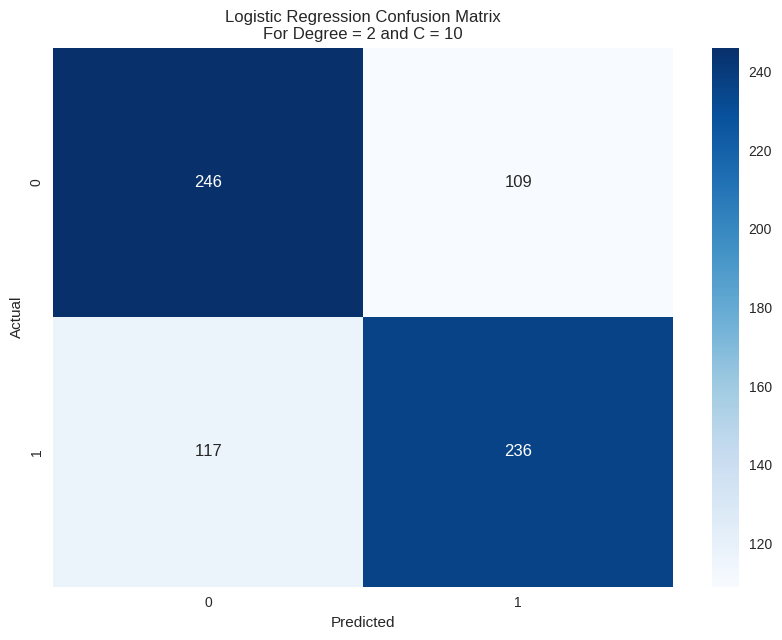

 Logistic Regression
 For Degree =  2
 For C =  100
 Confusion Matrix - 
 [[244 111]
 [119 234]]
 Train accuracy score:  0.75
 Test accuracy score:  0.6751412429378532
 F1 Score =  0.6750893862590713
 Mean Squared Error =  0.3248587570621469
 Classification Report
               precision    recall  f1-score   support

           0       0.67      0.69      0.68       355
           1       0.68      0.66      0.67       353

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





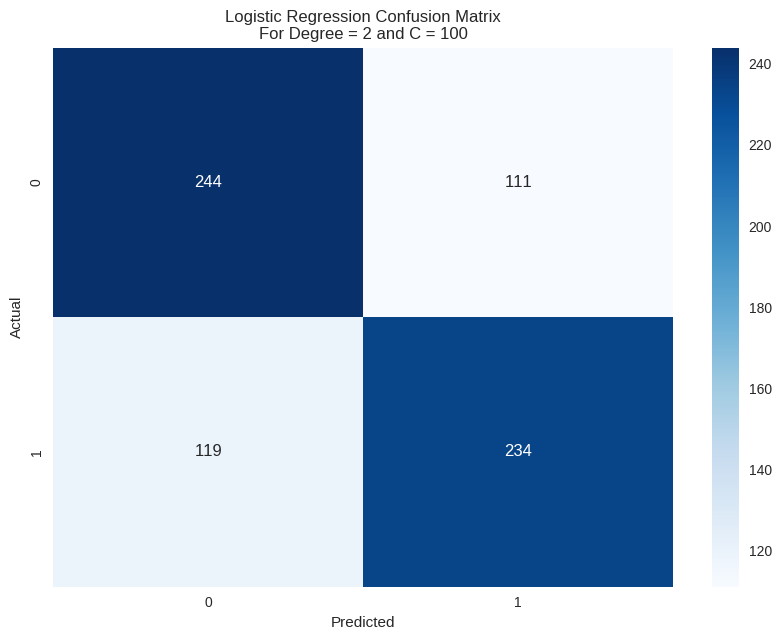

 Logistic Regression
 For Degree =  2
 For C =  1000
 Confusion Matrix - 
 [[242 113]
 [117 236]]
 Train accuracy score:  0.7524752475247525
 Test accuracy score:  0.6751412429378532
 F1 Score =  0.6751256879206364
 Mean Squared Error =  0.3248587570621469
 Classification Report
               precision    recall  f1-score   support

           0       0.67      0.68      0.68       355
           1       0.68      0.67      0.67       353

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





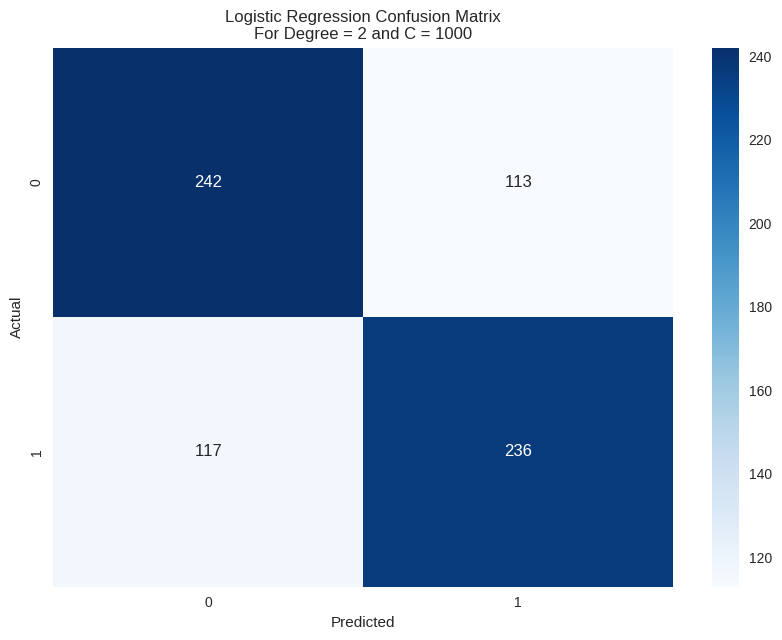

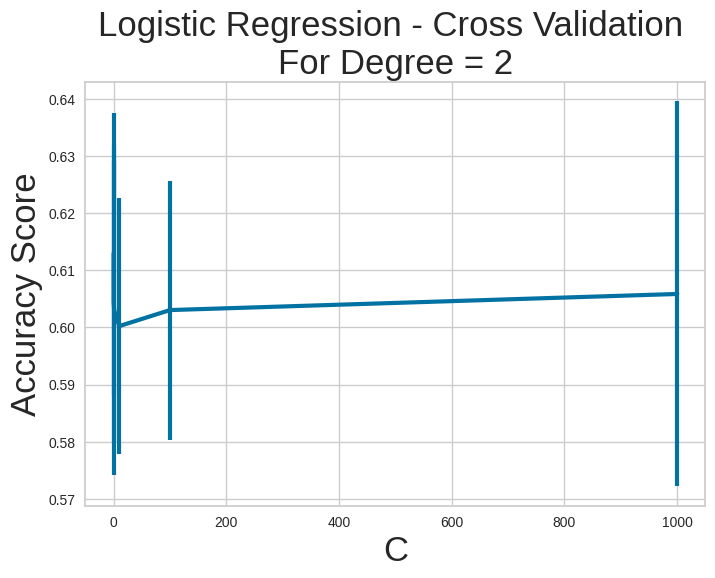

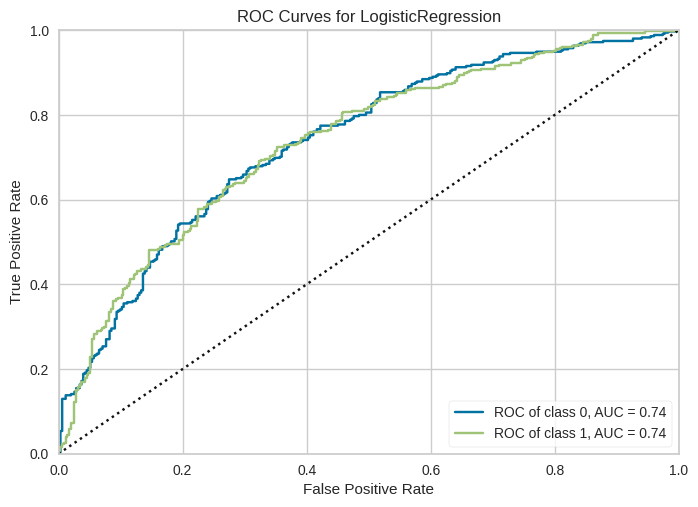

In [ ]:
evaluate_logistic_regression(X, y, c_range, degree_range, 2)

 K Neighbors Classifier
 For NN =  1
 Confusion Matrix - 
 [[207 148]
 [166 187]]
 Train accuracy score:  1.0
 Test accuracy score:  0.556497175141243
 F1 Score =  0.5561784039439734
 Mean Squared Error =  0.4435028248587571
 Classification Report
               precision    recall  f1-score   support

           0       0.55      0.58      0.57       355
           1       0.56      0.53      0.54       353

    accuracy                           0.56       708
   macro avg       0.56      0.56      0.56       708
weighted avg       0.56      0.56      0.56       708





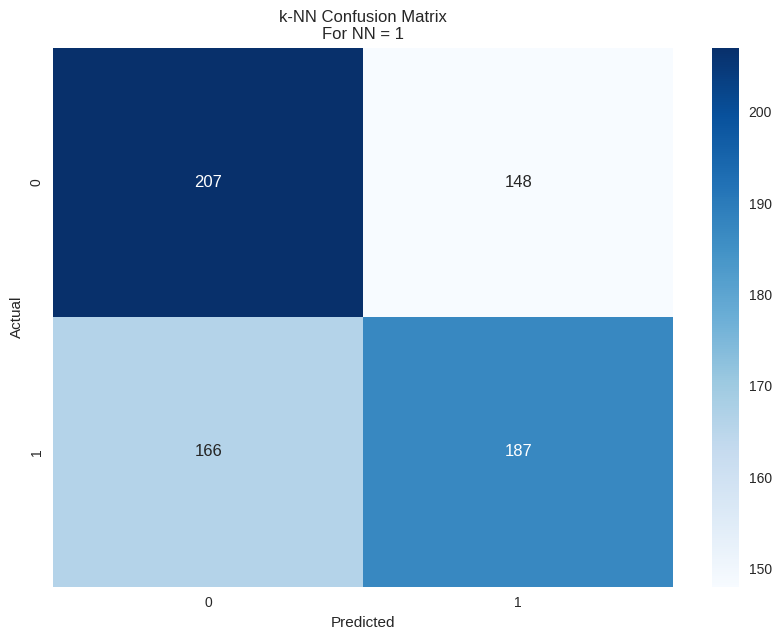

 K Neighbors Classifier
 For NN =  3
 Confusion Matrix - 
 [[210 145]
 [161 192]]
 Train accuracy score:  0.795968882602546
 Test accuracy score:  0.5677966101694916
 F1 Score =  0.5675481281631212
 Mean Squared Error =  0.4322033898305085
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.59      0.58       355
           1       0.57      0.54      0.56       353

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.57       708
weighted avg       0.57      0.57      0.57       708





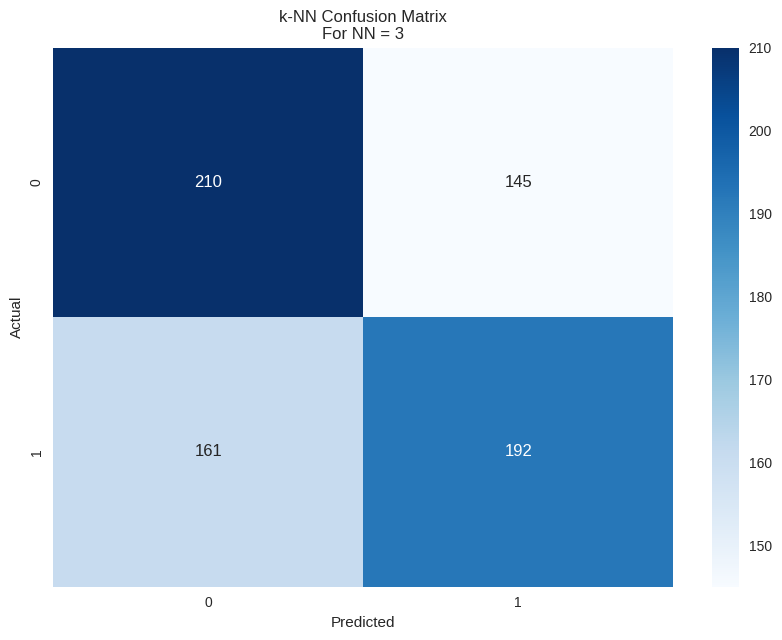

 K Neighbors Classifier
 For NN =  5
 Confusion Matrix - 
 [[215 140]
 [155 198]]
 Train accuracy score:  0.7256011315417256
 Test accuracy score:  0.5833333333333334
 F1 Score =  0.5831212469018746
 Mean Squared Error =  0.4166666666666667
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.61      0.59       355
           1       0.59      0.56      0.57       353

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.58      0.58      0.58       708





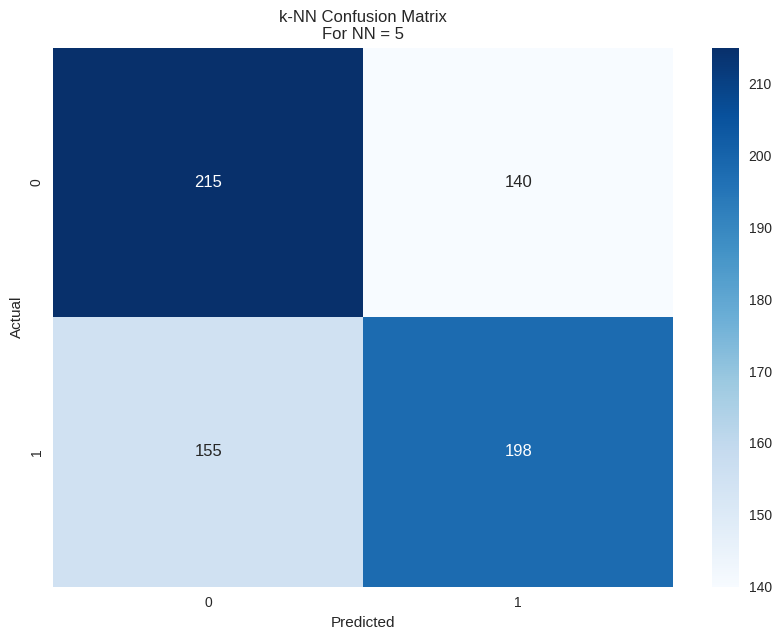

 K Neighbors Classifier
 For NN =  7
 Confusion Matrix - 
 [[211 144]
 [143 210]]
 Train accuracy score:  0.7054455445544554
 Test accuracy score:  0.594632768361582
 F1 Score =  0.5946335770532899
 Mean Squared Error =  0.4053672316384181
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.59      0.60       355
           1       0.59      0.59      0.59       353

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.59      0.59       708





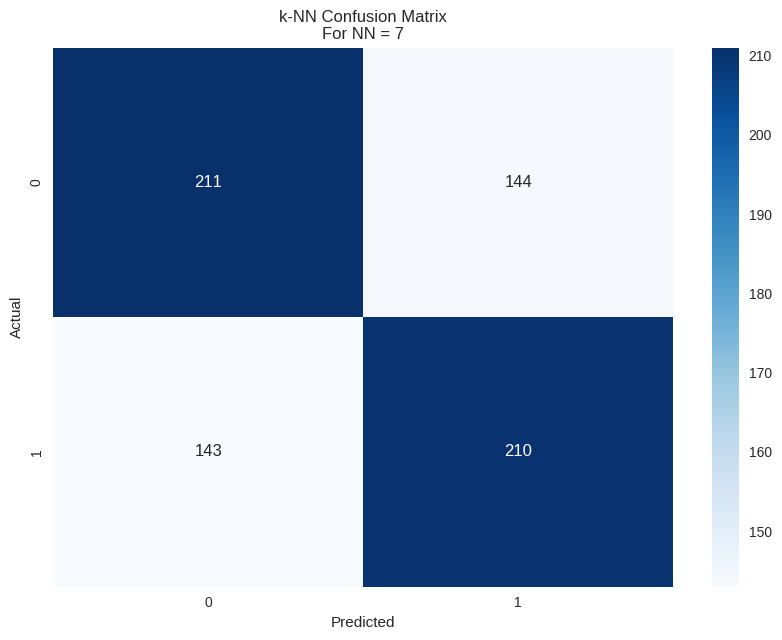

 K Neighbors Classifier
 For NN =  9
 Confusion Matrix - 
 [[199 156]
 [145 208]]
 Train accuracy score:  0.7004950495049505
 Test accuracy score:  0.5748587570621468
 F1 Score =  0.5747747777910007
 Mean Squared Error =  0.4251412429378531
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.56      0.57       355
           1       0.57      0.59      0.58       353

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.57       708
weighted avg       0.57      0.57      0.57       708





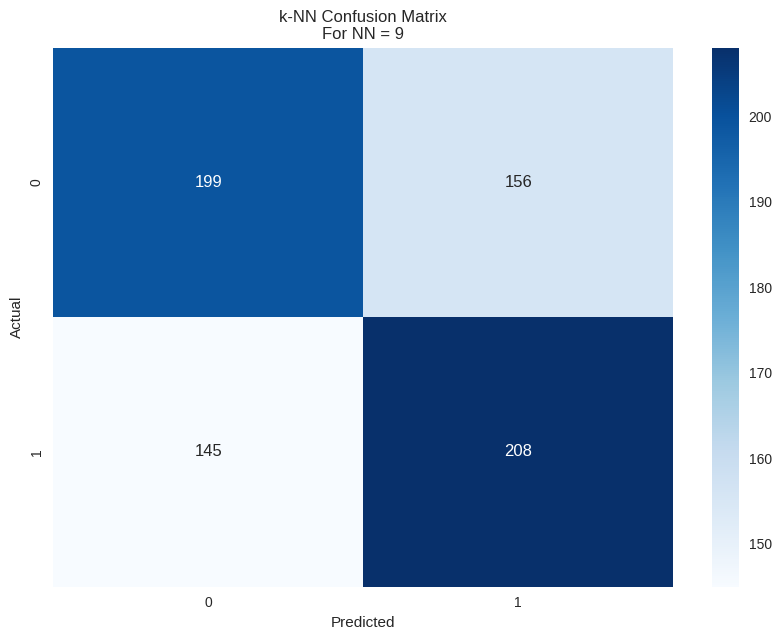

 K Neighbors Classifier
 For NN =  11
 Confusion Matrix - 
 [[201 154]
 [141 212]]
 Train accuracy score:  0.6973125884016973
 Test accuracy score:  0.5833333333333334
 F1 Score =  0.5832144384603463
 Mean Squared Error =  0.4166666666666667
 Classification Report
               precision    recall  f1-score   support

           0       0.59      0.57      0.58       355
           1       0.58      0.60      0.59       353

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.58      0.58      0.58       708





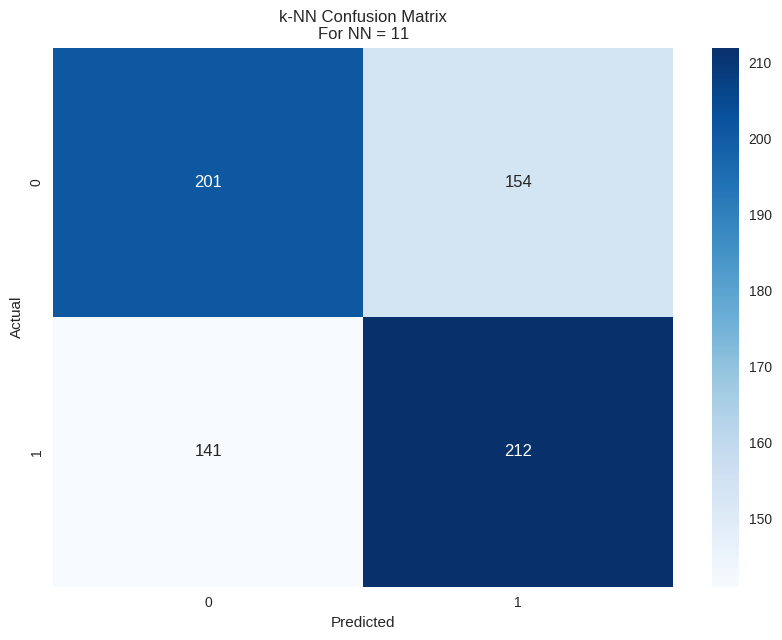

 K Neighbors Classifier
 For NN =  13
 Confusion Matrix - 
 [[206 149]
 [156 197]]
 Train accuracy score:  0.6835219236209336
 Test accuracy score:  0.5692090395480226
 F1 Score =  0.5691548880095457
 Mean Squared Error =  0.4307909604519774
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.58      0.57       355
           1       0.57      0.56      0.56       353

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.57       708
weighted avg       0.57      0.57      0.57       708





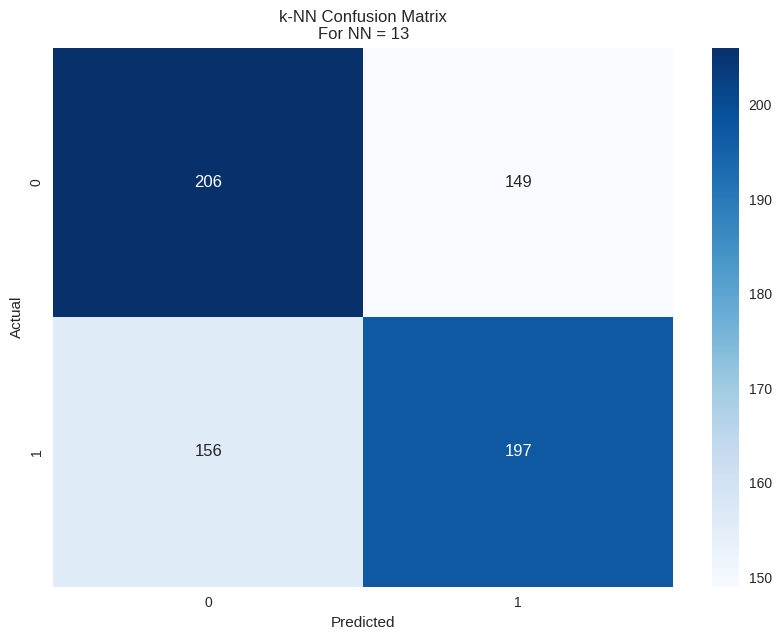

 K Neighbors Classifier
 For NN =  15
 Confusion Matrix - 
 [[197 158]
 [142 211]]
 Train accuracy score:  0.675035360678925
 Test accuracy score:  0.576271186440678
 F1 Score =  0.5760817605459146
 Mean Squared Error =  0.423728813559322
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.55      0.57       355
           1       0.57      0.60      0.58       353

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.58      0.58      0.58       708





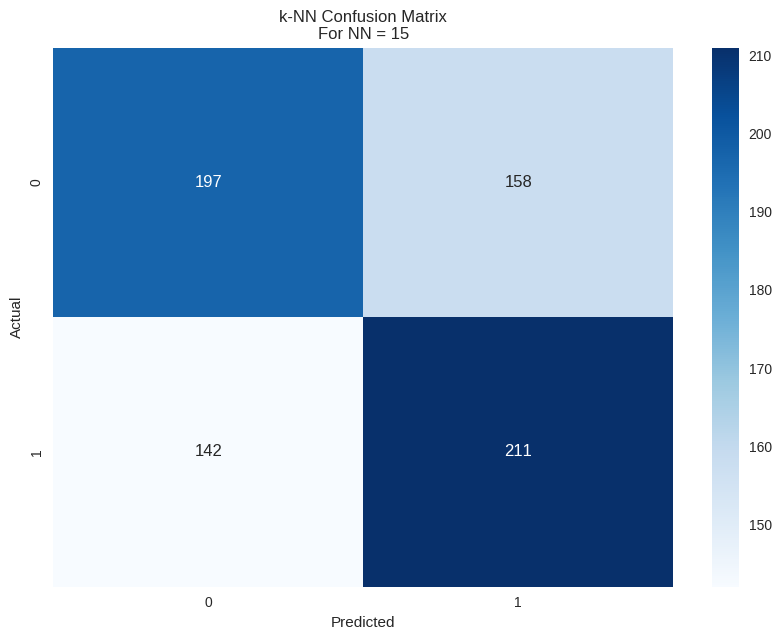

 K Neighbors Classifier
 For NN =  17
 Confusion Matrix - 
 [[198 157]
 [130 223]]
 Train accuracy score:  0.6775106082036775
 Test accuracy score:  0.594632768361582
 F1 Score =  0.594086221086288
 Mean Squared Error =  0.4053672316384181
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.56      0.58       355
           1       0.59      0.63      0.61       353

    accuracy                           0.59       708
   macro avg       0.60      0.59      0.59       708
weighted avg       0.60      0.59      0.59       708





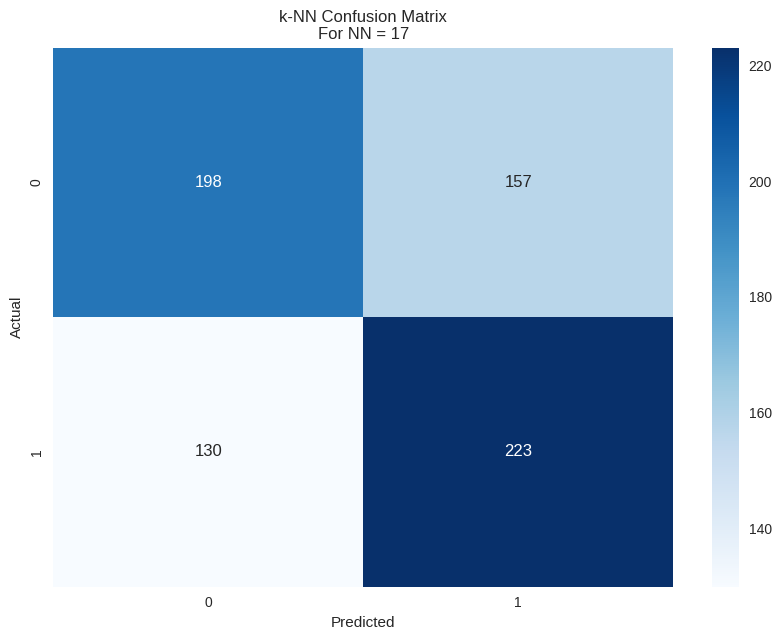

 K Neighbors Classifier
 For NN =  19
 Confusion Matrix - 
 [[207 148]
 [130 223]]
 Train accuracy score:  0.6672560113154172
 Test accuracy score:  0.6073446327683616
 F1 Score =  0.6071189183171698
 Mean Squared Error =  0.3926553672316384
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.58      0.60       355
           1       0.60      0.63      0.62       353

    accuracy                           0.61       708
   macro avg       0.61      0.61      0.61       708
weighted avg       0.61      0.61      0.61       708





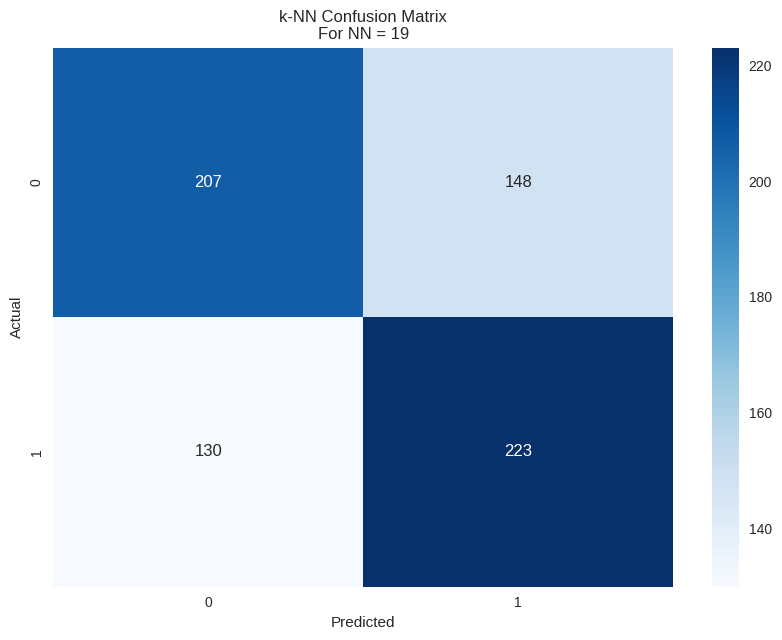

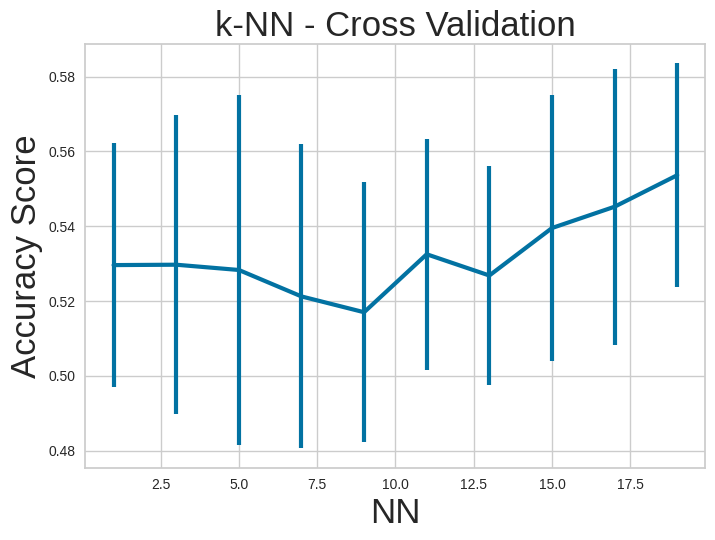

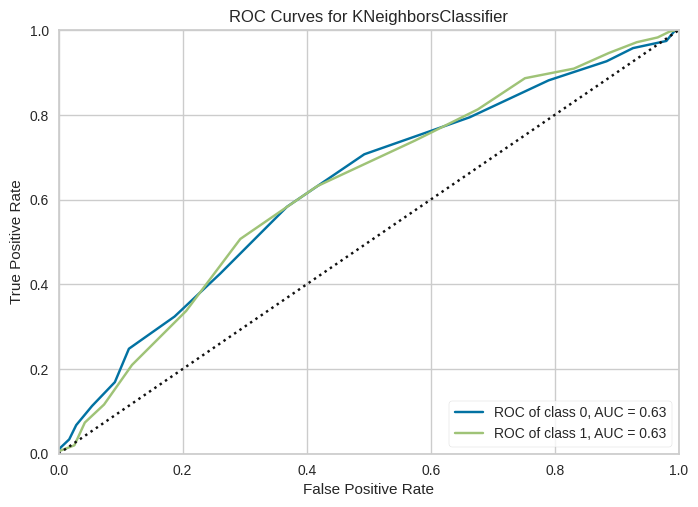

In [ ]:
evaluate_knn(X, y, nn_range, 2)

 Decision Tree Classifier
 For Depth =  3
 Confusion Matrix - 
 [[265  90]
 [143 210]]
 Train accuracy score:  0.6849363507779349
 Test accuracy score:  0.6709039548022598
 F1 Score =  0.6689785435603631
 Mean Squared Error =  0.3290960451977401
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.75      0.69       355
           1       0.70      0.59      0.64       353

    accuracy                           0.67       708
   macro avg       0.67      0.67      0.67       708
weighted avg       0.67      0.67      0.67       708





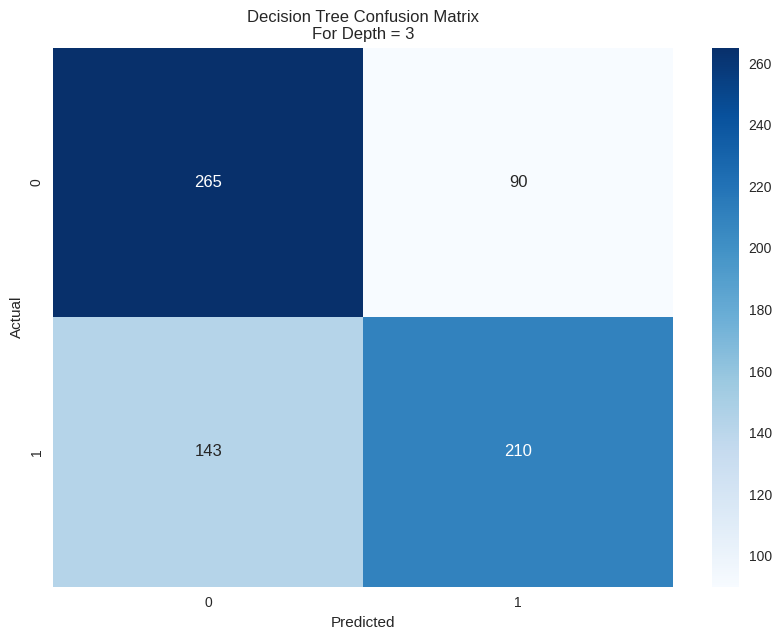

 Decision Tree Classifier
 For Depth =  5
 Confusion Matrix - 
 [[237 118]
 [ 97 256]]
 Train accuracy score:  0.7372701555869873
 Test accuracy score:  0.6963276836158192
 F1 Score =  0.6960857899672739
 Mean Squared Error =  0.3036723163841808
 Classification Report
               precision    recall  f1-score   support

           0       0.71      0.67      0.69       355
           1       0.68      0.73      0.70       353

    accuracy                           0.70       708
   macro avg       0.70      0.70      0.70       708
weighted avg       0.70      0.70      0.70       708





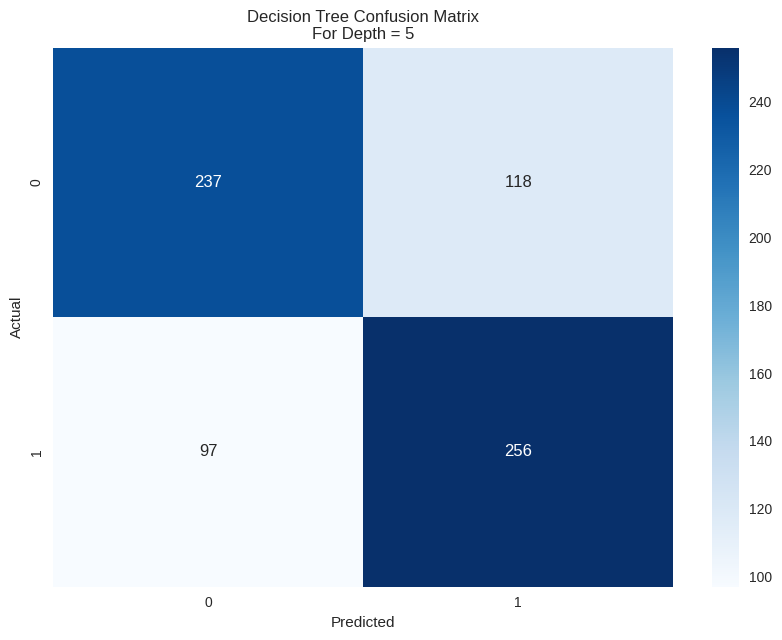

 Decision Tree Classifier
 For Depth =  7
 Confusion Matrix - 
 [[245 110]
 [129 224]]
 Train accuracy score:  0.8171852899575672
 Test accuracy score:  0.6624293785310734
 F1 Score =  0.662160439848213
 Mean Squared Error =  0.3375706214689266
 Classification Report
               precision    recall  f1-score   support

           0       0.66      0.69      0.67       355
           1       0.67      0.63      0.65       353

    accuracy                           0.66       708
   macro avg       0.66      0.66      0.66       708
weighted avg       0.66      0.66      0.66       708





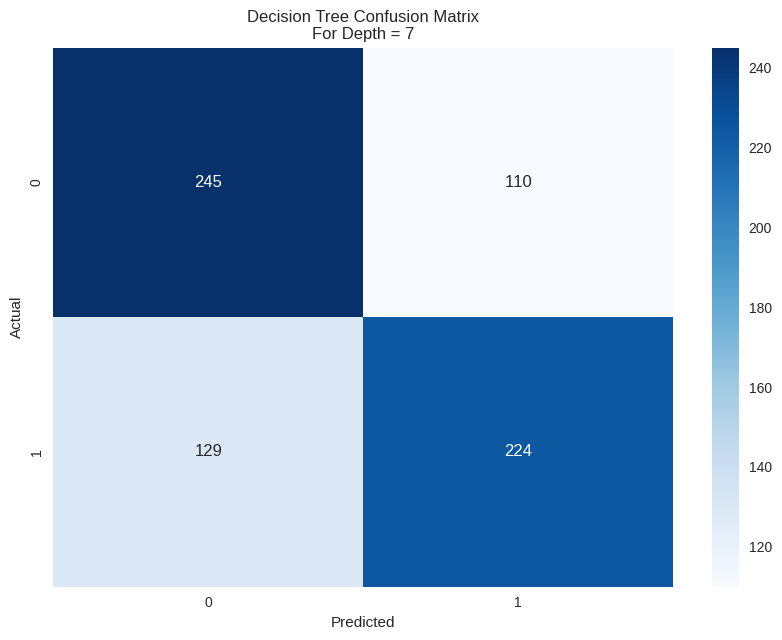

 Decision Tree Classifier
 For Depth =  9
 Confusion Matrix - 
 [[248 107]
 [131 222]]
 Train accuracy score:  0.8988684582743989
 Test accuracy score:  0.6638418079096046
 F1 Score =  0.6634227752682619
 Mean Squared Error =  0.3361581920903955
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.70      0.68       355
           1       0.67      0.63      0.65       353

    accuracy                           0.66       708
   macro avg       0.66      0.66      0.66       708
weighted avg       0.66      0.66      0.66       708





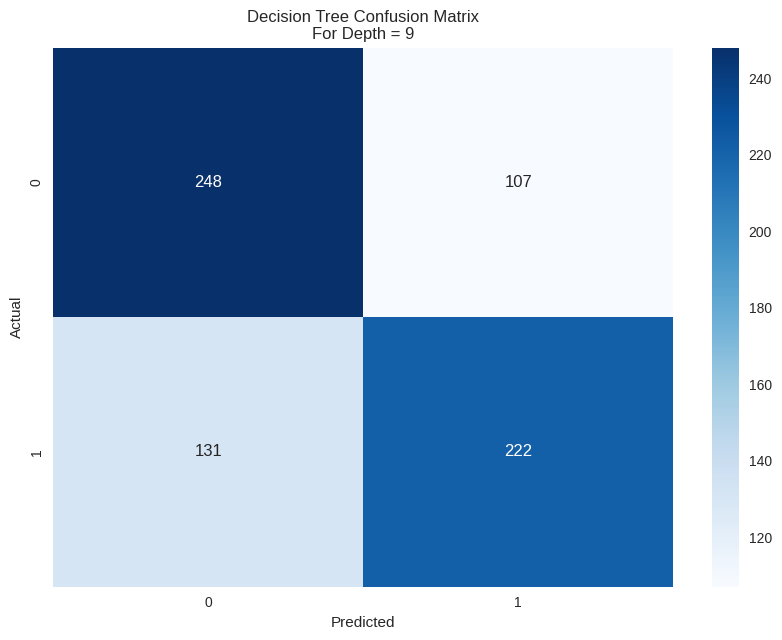

 Decision Tree Classifier
 For Depth =  11
 Confusion Matrix - 
 [[236 119]
 [117 236]]
 Train accuracy score:  0.9547383309759547
 Test accuracy score:  0.6666666666666666
 F1 Score =  0.6666666666666667
 Mean Squared Error =  0.3333333333333333
 Classification Report
               precision    recall  f1-score   support

           0       0.67      0.66      0.67       355
           1       0.66      0.67      0.67       353

    accuracy                           0.67       708
   macro avg       0.67      0.67      0.67       708
weighted avg       0.67      0.67      0.67       708





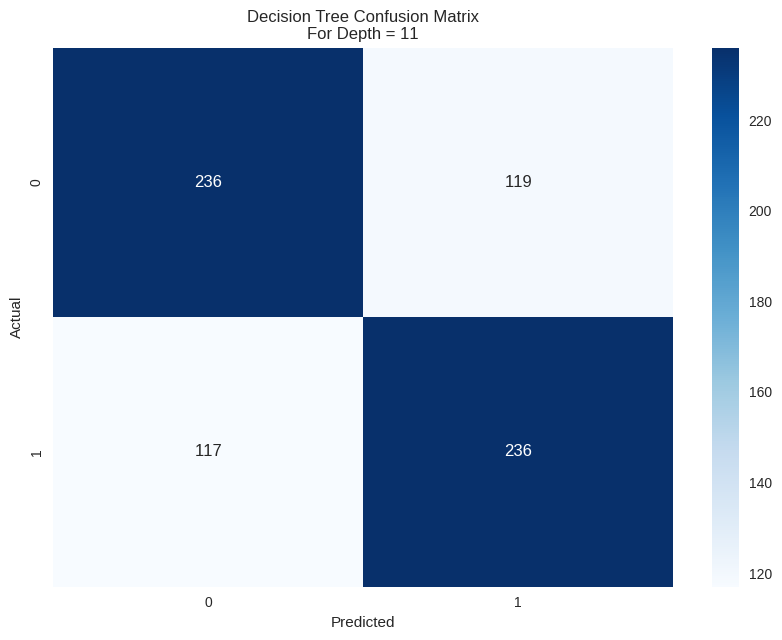

 Decision Tree Classifier
 For Depth =  13
 Confusion Matrix - 
 [[233 122]
 [131 222]]
 Train accuracy score:  0.9773691654879774
 Test accuracy score:  0.6426553672316384
 F1 Score =  0.6425847743696329
 Mean Squared Error =  0.3573446327683616
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.66      0.65       355
           1       0.65      0.63      0.64       353

    accuracy                           0.64       708
   macro avg       0.64      0.64      0.64       708
weighted avg       0.64      0.64      0.64       708





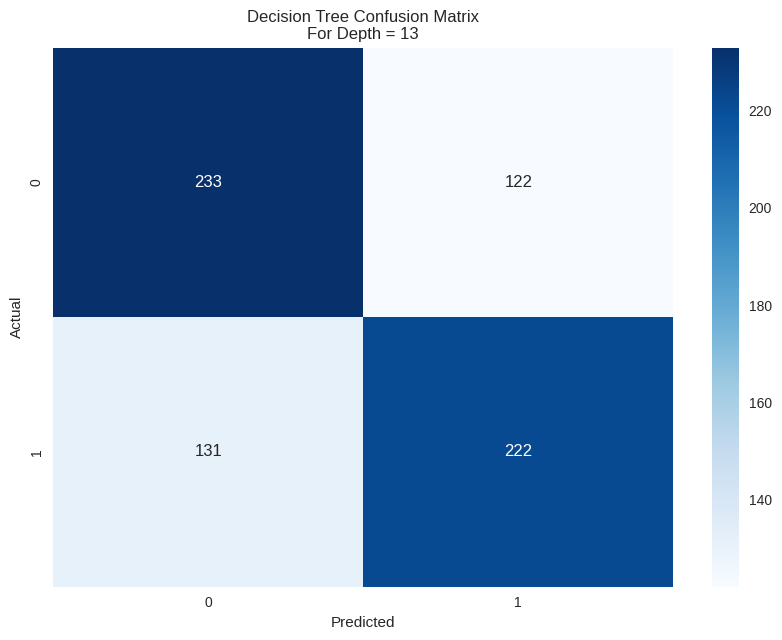

 Decision Tree Classifier
 For Depth =  15
 Confusion Matrix - 
 [[228 127]
 [128 225]]
 Train accuracy score:  0.9869165487977369
 Test accuracy score:  0.6398305084745762
 F1 Score =  0.6398283528681992
 Mean Squared Error =  0.3601694915254237
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.64      0.64       355
           1       0.64      0.64      0.64       353

    accuracy                           0.64       708
   macro avg       0.64      0.64      0.64       708
weighted avg       0.64      0.64      0.64       708





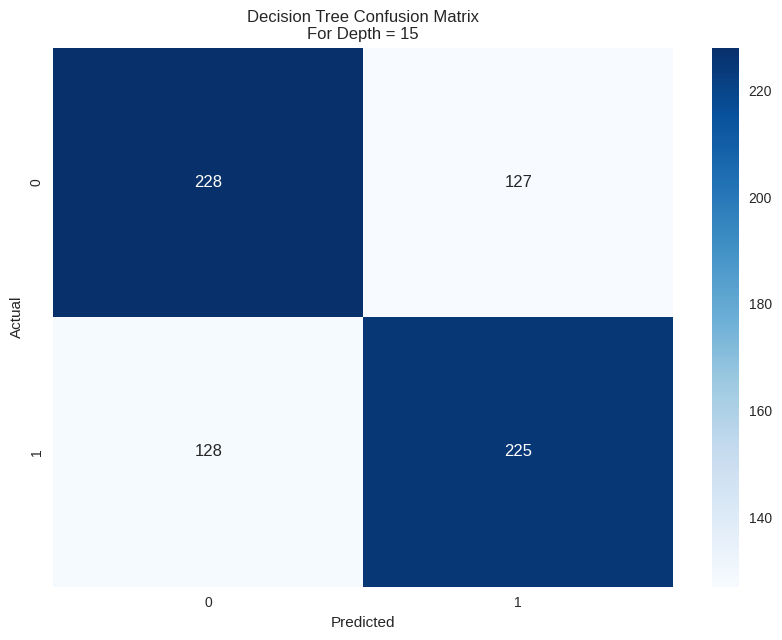

 Decision Tree Classifier
 For Depth =  17
 Confusion Matrix - 
 [[233 122]
 [132 221]]
 Train accuracy score:  0.987977369165488
 Test accuracy score:  0.6412429378531074
 F1 Score =  0.6411570285949303
 Mean Squared Error =  0.3587570621468927
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.66      0.65       355
           1       0.64      0.63      0.64       353

    accuracy                           0.64       708
   macro avg       0.64      0.64      0.64       708
weighted avg       0.64      0.64      0.64       708





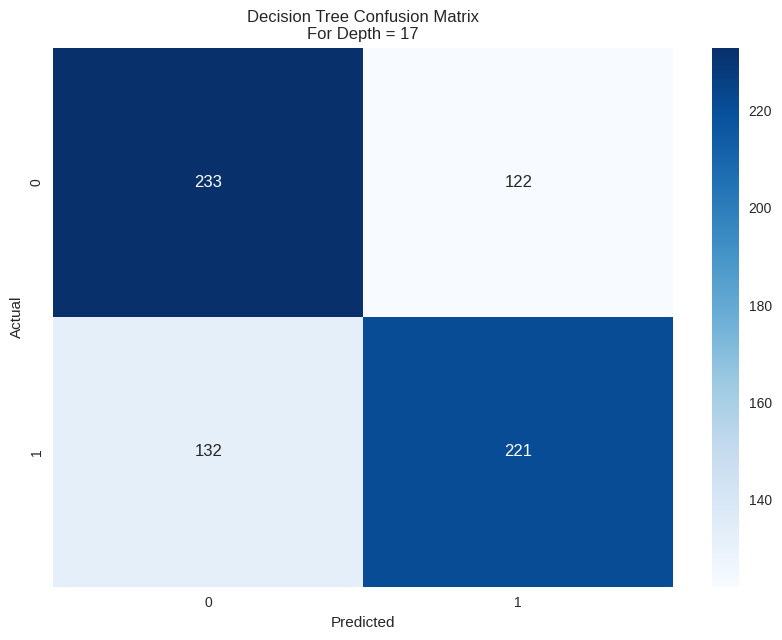

 Decision Tree Classifier
 For Depth =  19
 Confusion Matrix - 
 [[223 132]
 [129 224]]
 Train accuracy score:  0.9893917963224894
 Test accuracy score:  0.6313559322033898
 F1 Score =  0.631353725912075
 Mean Squared Error =  0.3686440677966102
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.63      0.63       355
           1       0.63      0.63      0.63       353

    accuracy                           0.63       708
   macro avg       0.63      0.63      0.63       708
weighted avg       0.63      0.63      0.63       708





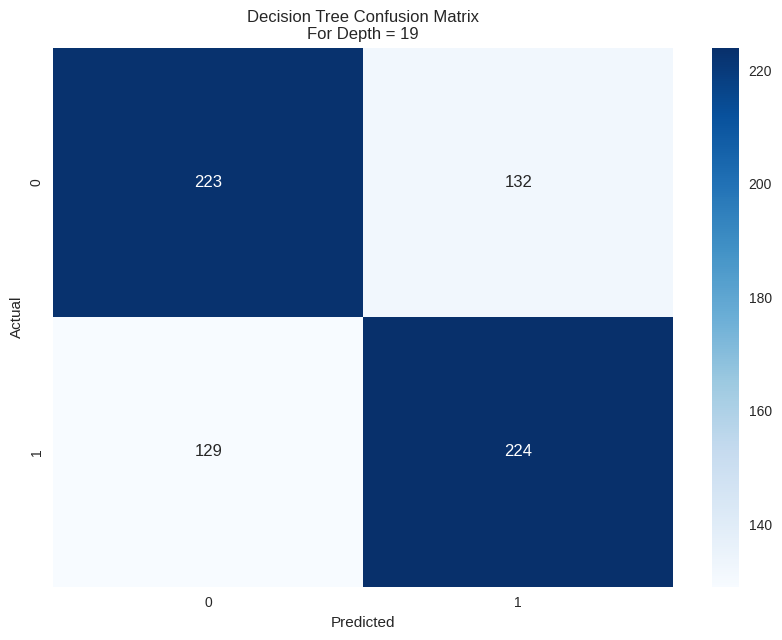

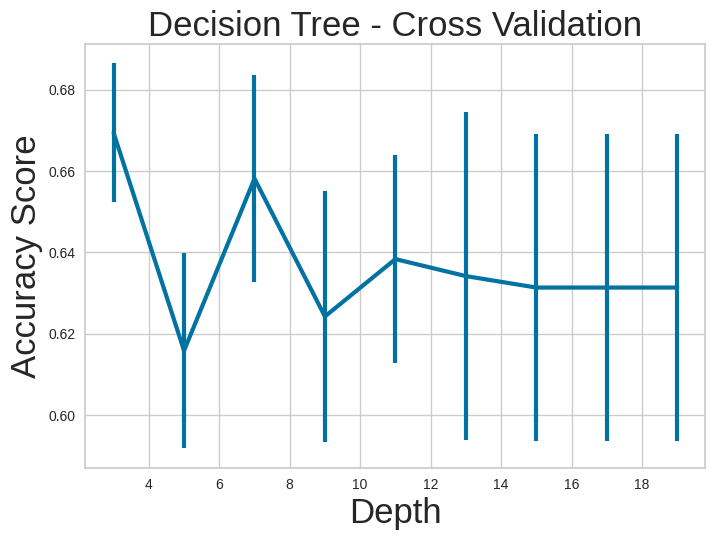

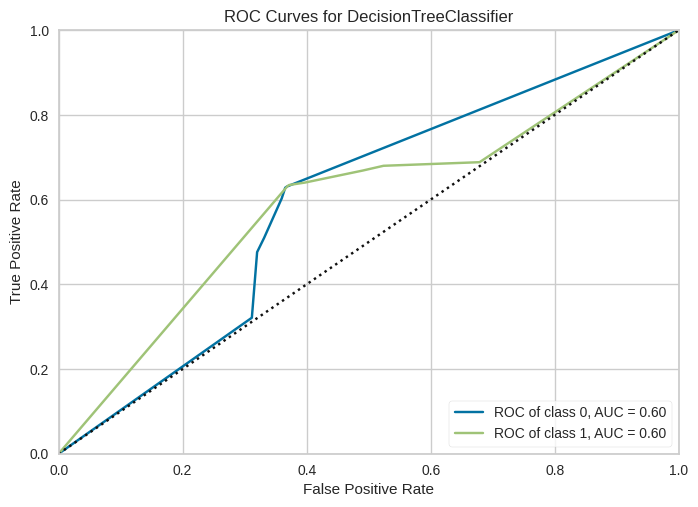

In [ ]:
evaluate_decision_tree(X, y, depth_range, 2)

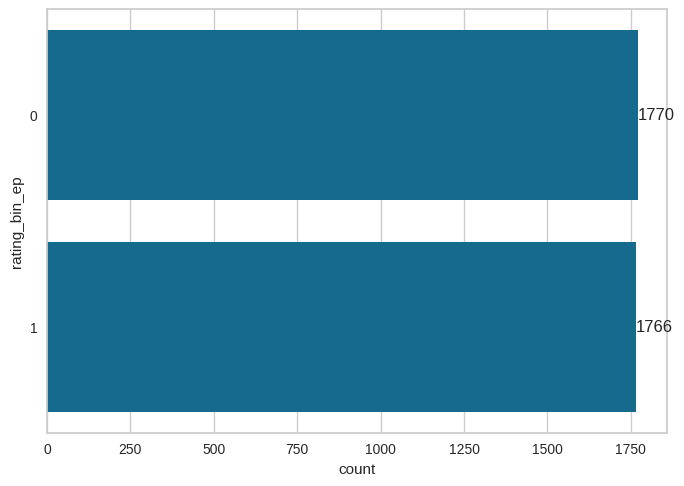

In [33]:
X,y = bin_column(listings, 'review_scores_communication', 2)
check_bins(y)

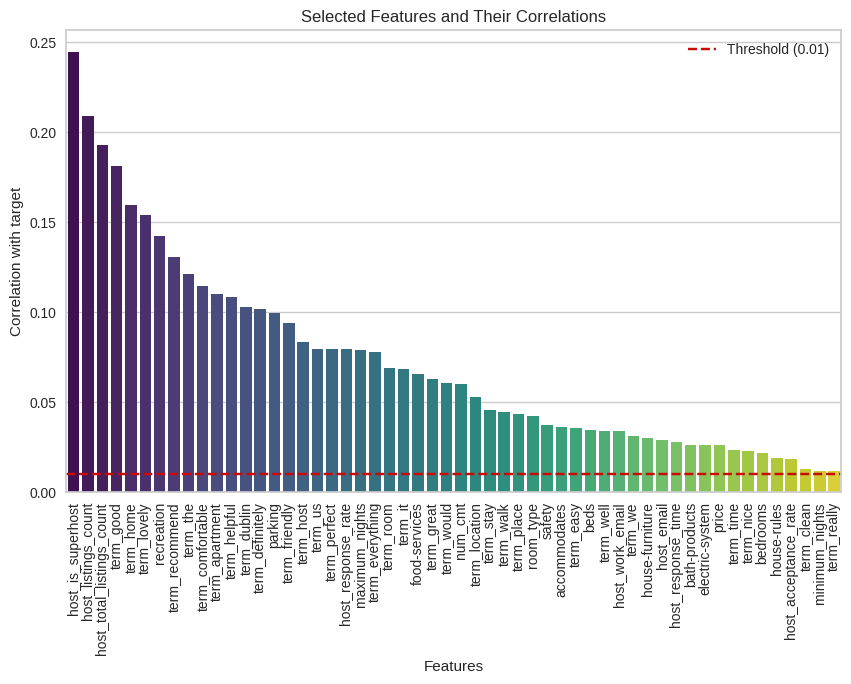

(Index(['host_is_superhost', 'host_listings_count', 'host_total_listings_count',
        'term_good', 'term_home', 'term_lovely', 'recreation', 'term_recommend',
        'term_the', 'term_comfortable', 'term_apartment', 'term_helpful',
        'term_dublin', 'term_definitely', 'parking', 'term_friendly',
        'term_host', 'term_us', 'term_perfect', 'host_response_rate',
        'maximum_nights', 'term_everything', 'term_room', 'term_it',
        'food-services', 'term_great', 'term_would', 'num_cmt', 'term_location',
        'term_stay', 'term_walk', 'term_place', 'room_type', 'safety',
        'accommodates', 'term_easy', 'beds', 'term_well', 'host_work_email',
        'term_we', 'house-furniture', 'host_email', 'host_response_time',
        'bath-products', 'electric-system', 'price', 'term_time', 'term_nice',
        'bedrooms', 'house-rules', 'host_acceptance_rate', 'term_clean',
        'minimum_nights', 'term_really'],
       dtype='object'),
 host_is_superhost            0.24

In [34]:
yy = listings['review_scores_communication']
select_important_features(X, yy, threshold=0.01)

 Logistic Regression
 For Degree =  1
 For C =  0.001
 Confusion Matrix - 
 [[224 128]
 [121 235]]
 Train accuracy score:  0.655940594059406
 Test accuracy score:  0.6483050847457628
 F1 Score =  0.6482510472585095
 Mean Squared Error =  0.3516949152542373
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.64      0.64       352
           1       0.65      0.66      0.65       356

    accuracy                           0.65       708
   macro avg       0.65      0.65      0.65       708
weighted avg       0.65      0.65      0.65       708





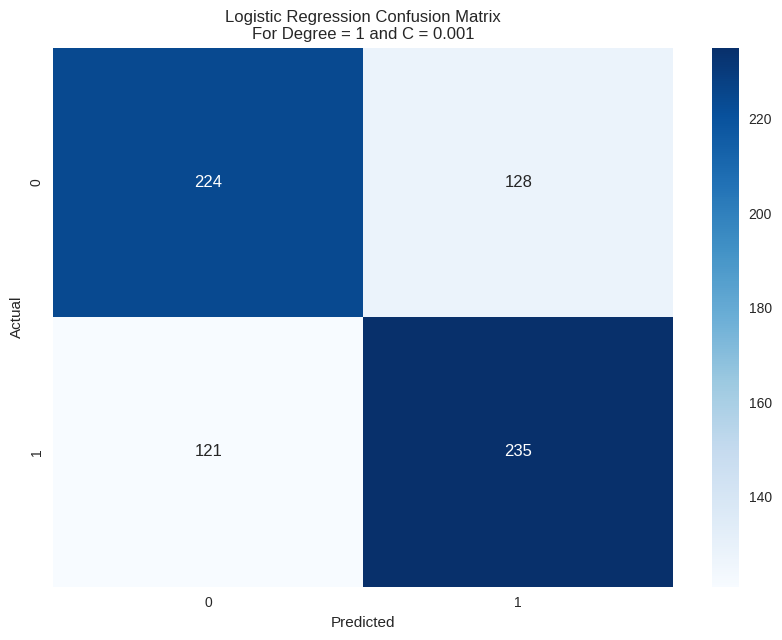

 Logistic Regression
 For Degree =  1
 For C =  0.1
 Confusion Matrix - 
 [[253  99]
 [110 246]]
 Train accuracy score:  0.6976661951909476
 Test accuracy score:  0.7048022598870056
 F1 Score =  0.7047569096361379
 Mean Squared Error =  0.2951977401129944
 Classification Report
               precision    recall  f1-score   support

           0       0.70      0.72      0.71       352
           1       0.71      0.69      0.70       356

    accuracy                           0.70       708
   macro avg       0.71      0.70      0.70       708
weighted avg       0.71      0.70      0.70       708





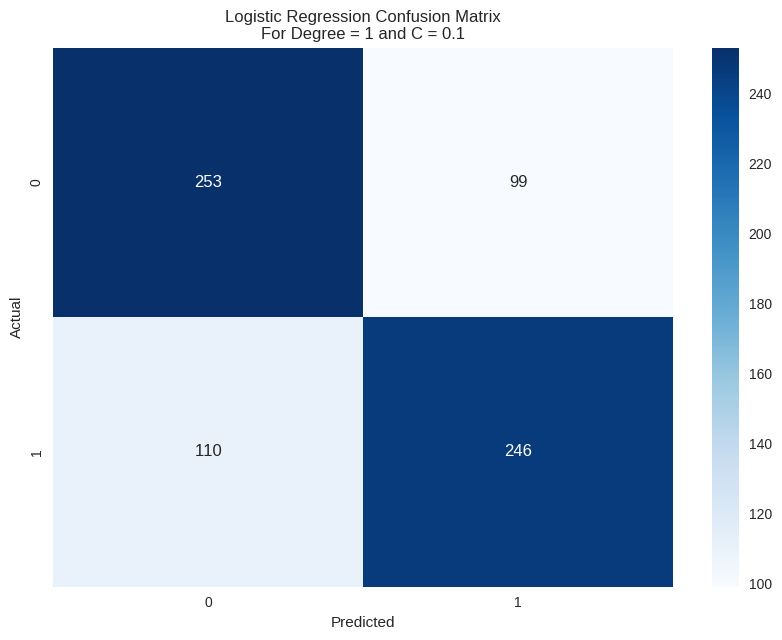

 Logistic Regression
 For Degree =  1
 For C =  1
 Confusion Matrix - 
 [[255  97]
 [107 249]]
 Train accuracy score:  0.7050919377652051
 Test accuracy score:  0.711864406779661
 F1 Score =  0.7118299152197457
 Mean Squared Error =  0.288135593220339
 Classification Report
               precision    recall  f1-score   support

           0       0.70      0.72      0.71       352
           1       0.72      0.70      0.71       356

    accuracy                           0.71       708
   macro avg       0.71      0.71      0.71       708
weighted avg       0.71      0.71      0.71       708





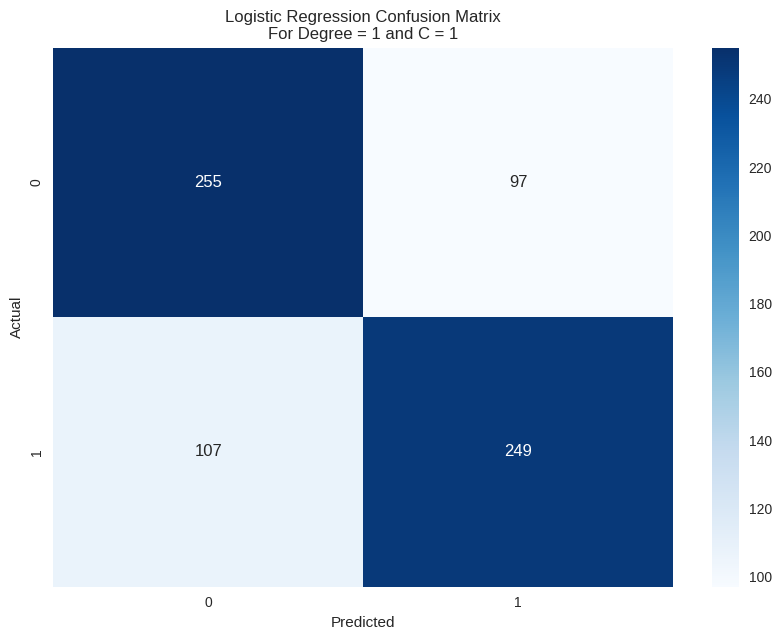

 Logistic Regression
 For Degree =  1
 For C =  10
 Confusion Matrix - 
 [[255  97]
 [107 249]]
 Train accuracy score:  0.7054455445544554
 Test accuracy score:  0.711864406779661
 F1 Score =  0.7118299152197457
 Mean Squared Error =  0.288135593220339
 Classification Report
               precision    recall  f1-score   support

           0       0.70      0.72      0.71       352
           1       0.72      0.70      0.71       356

    accuracy                           0.71       708
   macro avg       0.71      0.71      0.71       708
weighted avg       0.71      0.71      0.71       708





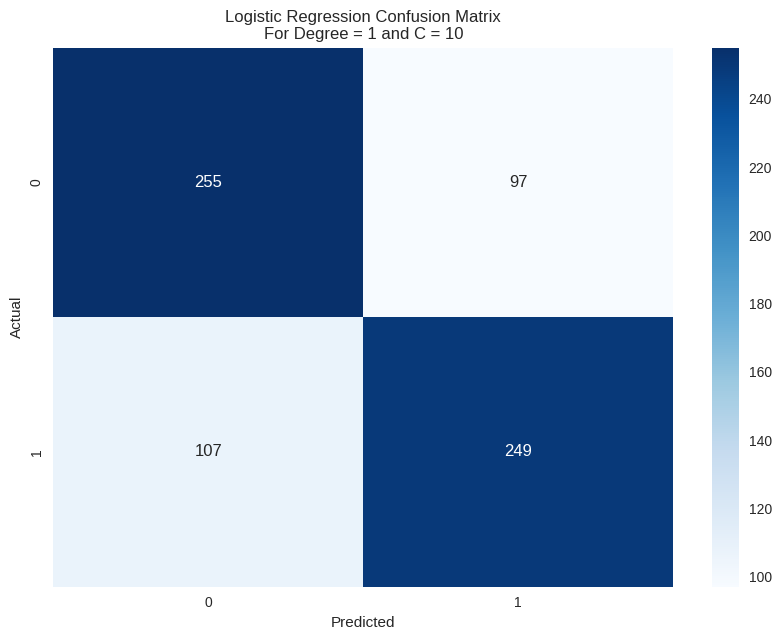

 Logistic Regression
 For Degree =  1
 For C =  100
 Confusion Matrix - 
 [[254  98]
 [106 250]]
 Train accuracy score:  0.7057991513437057
 Test accuracy score:  0.711864406779661
 F1 Score =  0.7118460120150274
 Mean Squared Error =  0.288135593220339
 Classification Report
               precision    recall  f1-score   support

           0       0.71      0.72      0.71       352
           1       0.72      0.70      0.71       356

    accuracy                           0.71       708
   macro avg       0.71      0.71      0.71       708
weighted avg       0.71      0.71      0.71       708





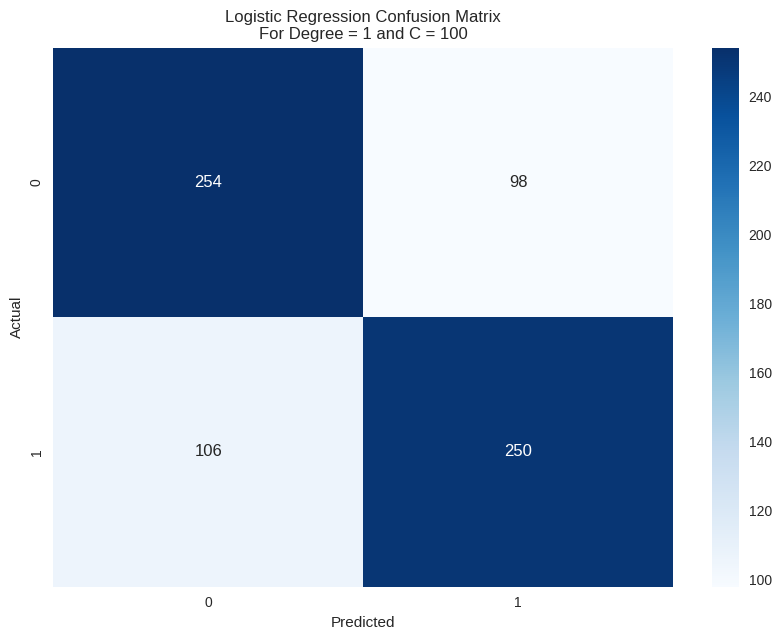

 Logistic Regression
 For Degree =  1
 For C =  1000
 Confusion Matrix - 
 [[254  98]
 [106 250]]
 Train accuracy score:  0.7061527581329562
 Test accuracy score:  0.711864406779661
 F1 Score =  0.7118460120150274
 Mean Squared Error =  0.288135593220339
 Classification Report
               precision    recall  f1-score   support

           0       0.71      0.72      0.71       352
           1       0.72      0.70      0.71       356

    accuracy                           0.71       708
   macro avg       0.71      0.71      0.71       708
weighted avg       0.71      0.71      0.71       708





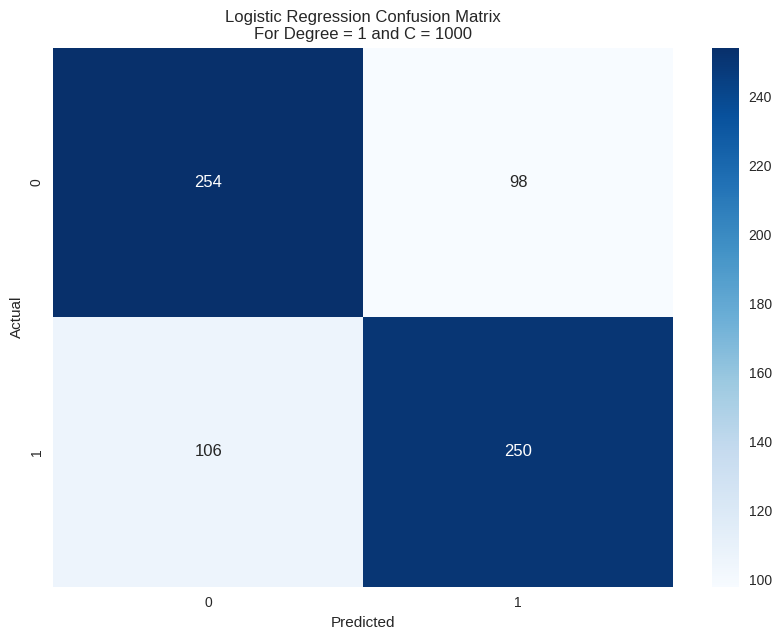

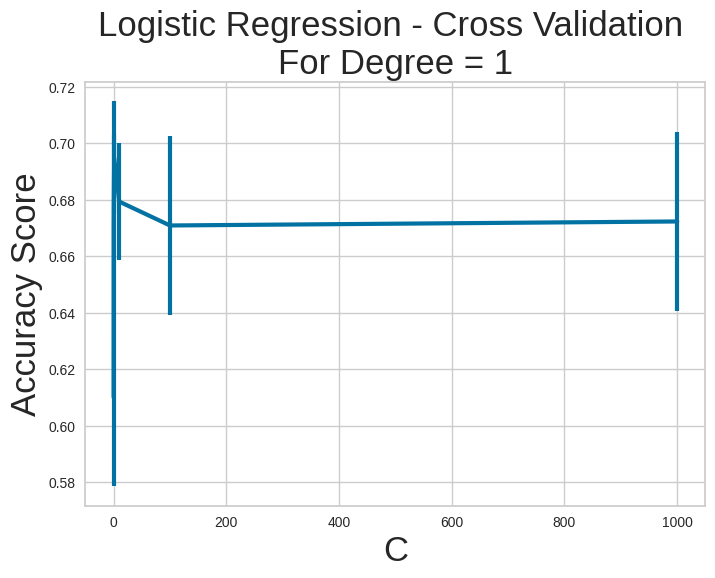

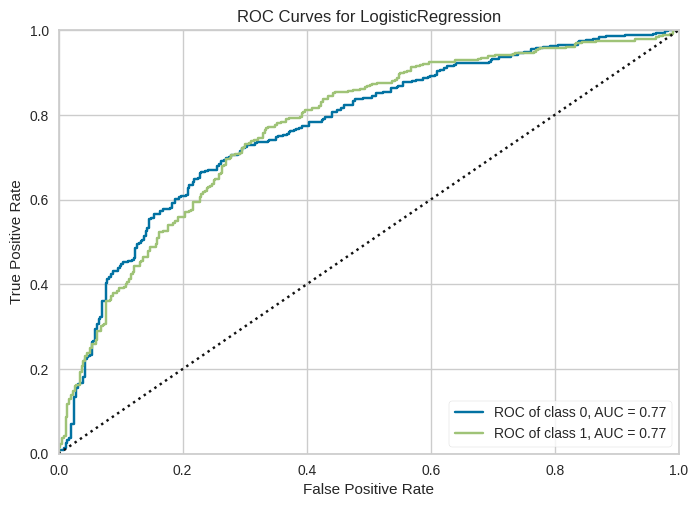

 Logistic Regression
 For Degree =  2
 For C =  0.001
 Confusion Matrix - 
 [[240 112]
 [114 242]]
 Train accuracy score:  0.7758132956152758
 Test accuracy score:  0.6807909604519774
 F1 Score =  0.6807935077052156
 Mean Squared Error =  0.3192090395480226
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.68      0.68       352
           1       0.68      0.68      0.68       356

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





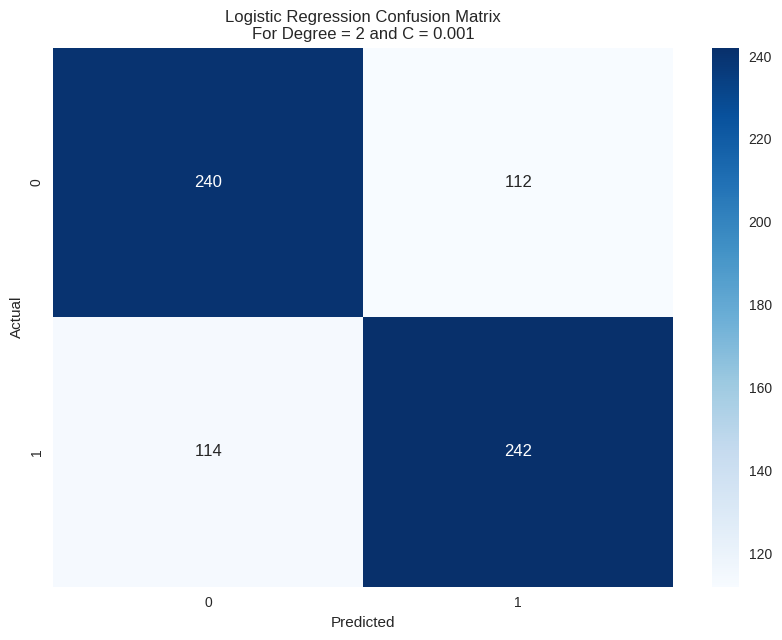

 Logistic Regression
 For Degree =  2
 For C =  0.1
 Confusion Matrix - 
 [[240 112]
 [116 240]]
 Train accuracy score:  0.7733380480905233
 Test accuracy score:  0.6779661016949152
 F1 Score =  0.6779661016949152
 Mean Squared Error =  0.3220338983050847
 Classification Report
               precision    recall  f1-score   support

           0       0.67      0.68      0.68       352
           1       0.68      0.67      0.68       356

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





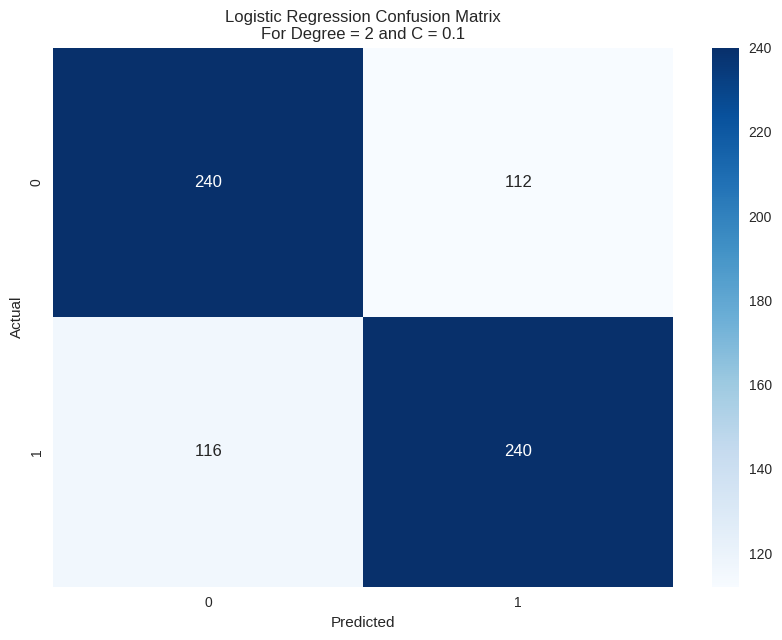

 Logistic Regression
 For Degree =  2
 For C =  1
 Confusion Matrix - 
 [[242 110]
 [111 245]]
 Train accuracy score:  0.7758132956152758
 Test accuracy score:  0.6878531073446328
 F1 Score =  0.6878549755368263
 Mean Squared Error =  0.3121468926553672
 Classification Report
               precision    recall  f1-score   support

           0       0.69      0.69      0.69       352
           1       0.69      0.69      0.69       356

    accuracy                           0.69       708
   macro avg       0.69      0.69      0.69       708
weighted avg       0.69      0.69      0.69       708





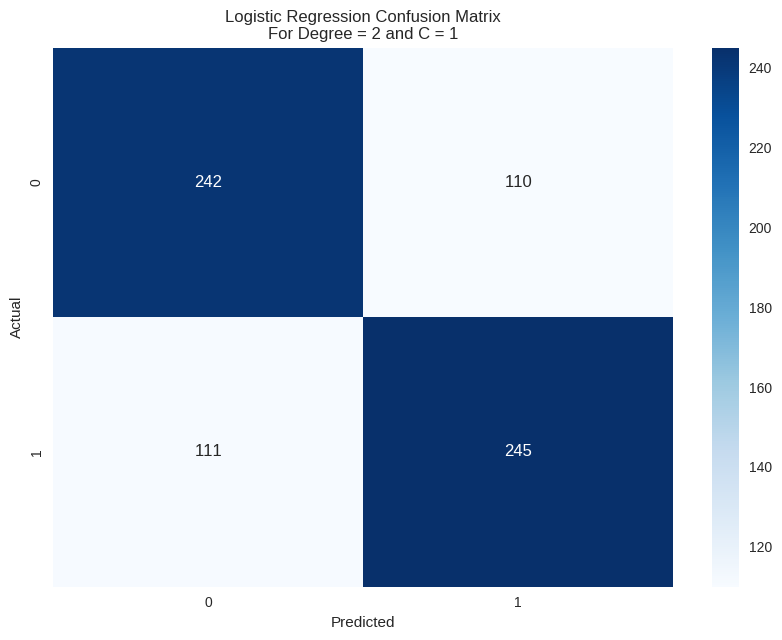

 Logistic Regression
 For Degree =  2
 For C =  10
 Confusion Matrix - 
 [[240 112]
 [114 242]]
 Train accuracy score:  0.7726308345120226
 Test accuracy score:  0.6807909604519774
 F1 Score =  0.6807935077052156
 Mean Squared Error =  0.3192090395480226
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.68      0.68       352
           1       0.68      0.68      0.68       356

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





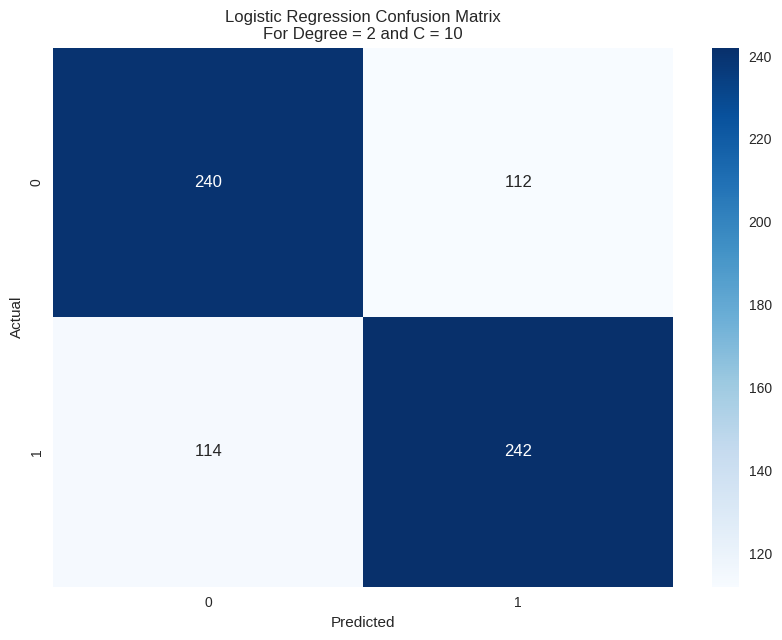

 Logistic Regression
 For Degree =  2
 For C =  100
 Confusion Matrix - 
 [[241 111]
 [113 243]]
 Train accuracy score:  0.7747524752475248
 Test accuracy score:  0.6836158192090396
 F1 Score =  0.6836183439202137
 Mean Squared Error =  0.3163841807909605
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.68      0.68       352
           1       0.69      0.68      0.68       356

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





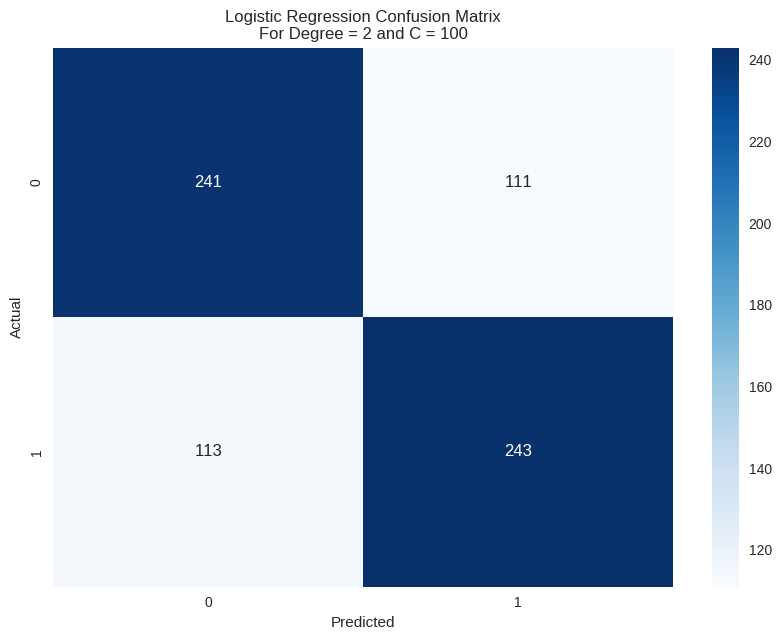

 Logistic Regression
 For Degree =  2
 For C =  1000
 Confusion Matrix - 
 [[239 113]
 [115 241]]
 Train accuracy score:  0.772984441301273
 Test accuracy score:  0.6779661016949152
 F1 Score =  0.6779686714902176
 Mean Squared Error =  0.3220338983050847
 Classification Report
               precision    recall  f1-score   support

           0       0.68      0.68      0.68       352
           1       0.68      0.68      0.68       356

    accuracy                           0.68       708
   macro avg       0.68      0.68      0.68       708
weighted avg       0.68      0.68      0.68       708





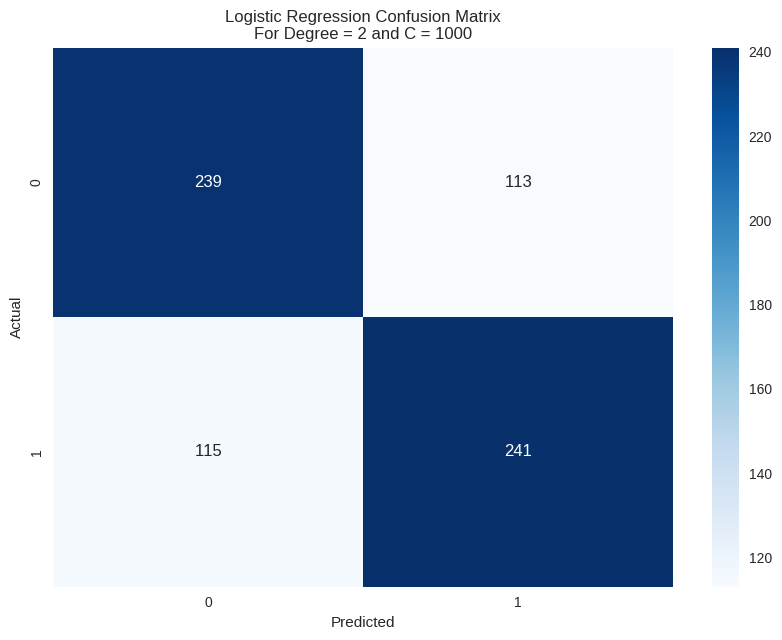

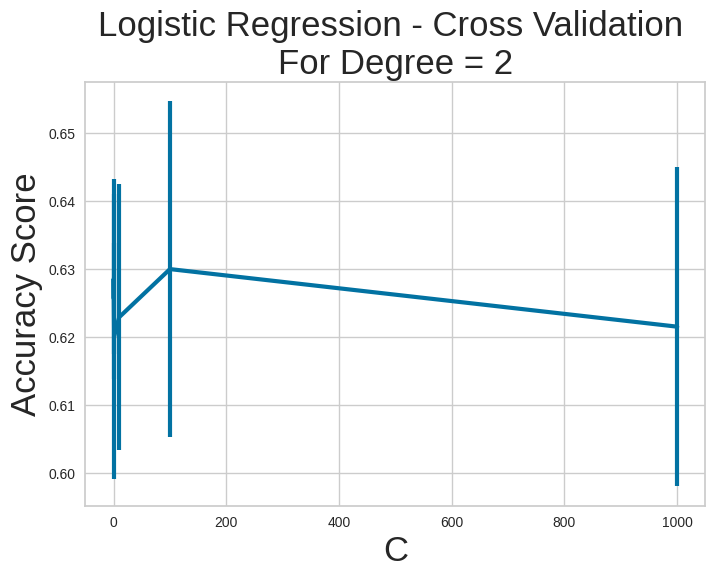

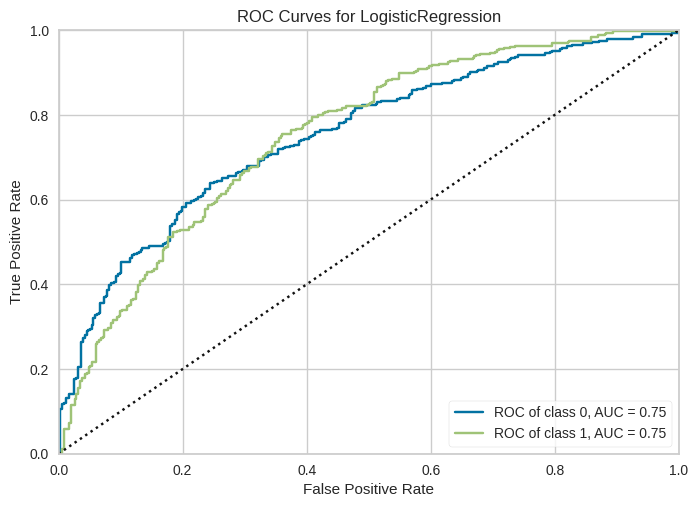

In [ ]:
evaluate_logistic_regression(X, y, c_range, degree_range, 2)

 K Neighbors Classifier
 For NN =  1
 Confusion Matrix - 
 [[200 152]
 [148 208]]
 Train accuracy score:  1.0
 Test accuracy score:  0.576271186440678
 F1 Score =  0.5762441327255265
 Mean Squared Error =  0.423728813559322
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.57      0.57       352
           1       0.58      0.58      0.58       356

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.58      0.58      0.58       708





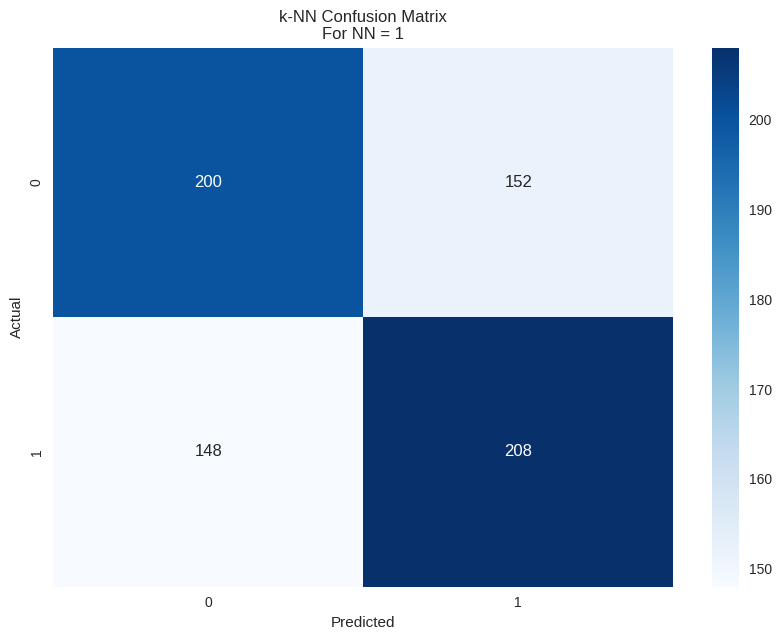

 K Neighbors Classifier
 For NN =  3
 Confusion Matrix - 
 [[205 147]
 [124 232]]
 Train accuracy score:  0.8051626591230552
 Test accuracy score:  0.617231638418079
 F1 Score =  0.616756748245479
 Mean Squared Error =  0.3827683615819209
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.58      0.60       352
           1       0.61      0.65      0.63       356

    accuracy                           0.62       708
   macro avg       0.62      0.62      0.62       708
weighted avg       0.62      0.62      0.62       708





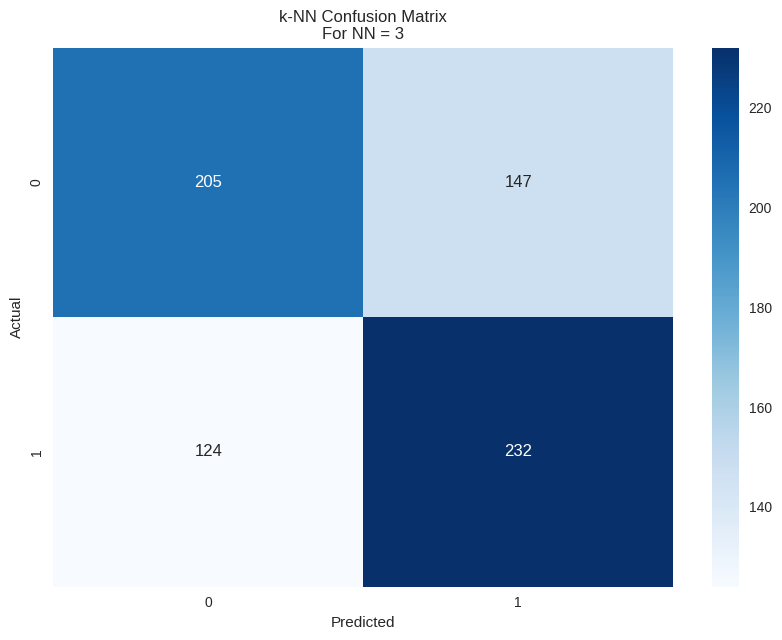

 K Neighbors Classifier
 For NN =  5
 Confusion Matrix - 
 [[205 147]
 [124 232]]
 Train accuracy score:  0.75
 Test accuracy score:  0.617231638418079
 F1 Score =  0.616756748245479
 Mean Squared Error =  0.3827683615819209
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.58      0.60       352
           1       0.61      0.65      0.63       356

    accuracy                           0.62       708
   macro avg       0.62      0.62      0.62       708
weighted avg       0.62      0.62      0.62       708





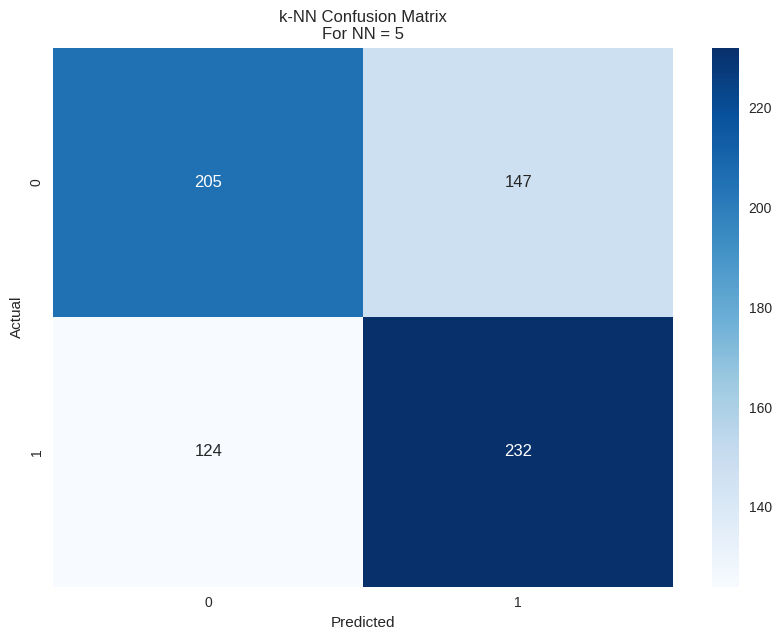

 K Neighbors Classifier
 For NN =  7
 Confusion Matrix - 
 [[206 146]
 [131 225]]
 Train accuracy score:  0.7316124469589816
 Test accuracy score:  0.6087570621468926
 F1 Score =  0.6085344556995602
 Mean Squared Error =  0.3912429378531073
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.59      0.60       352
           1       0.61      0.63      0.62       356

    accuracy                           0.61       708
   macro avg       0.61      0.61      0.61       708
weighted avg       0.61      0.61      0.61       708





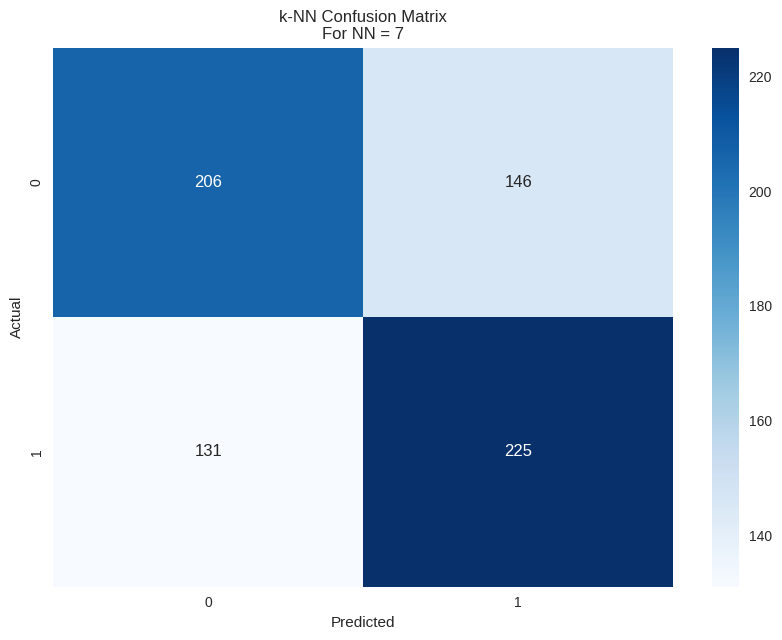

 K Neighbors Classifier
 For NN =  9
 Confusion Matrix - 
 [[203 149]
 [132 224]]
 Train accuracy score:  0.7171145685997171
 Test accuracy score:  0.6031073446327684
 F1 Score =  0.60282442895604
 Mean Squared Error =  0.3968926553672316
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.58      0.59       352
           1       0.60      0.63      0.61       356

    accuracy                           0.60       708
   macro avg       0.60      0.60      0.60       708
weighted avg       0.60      0.60      0.60       708





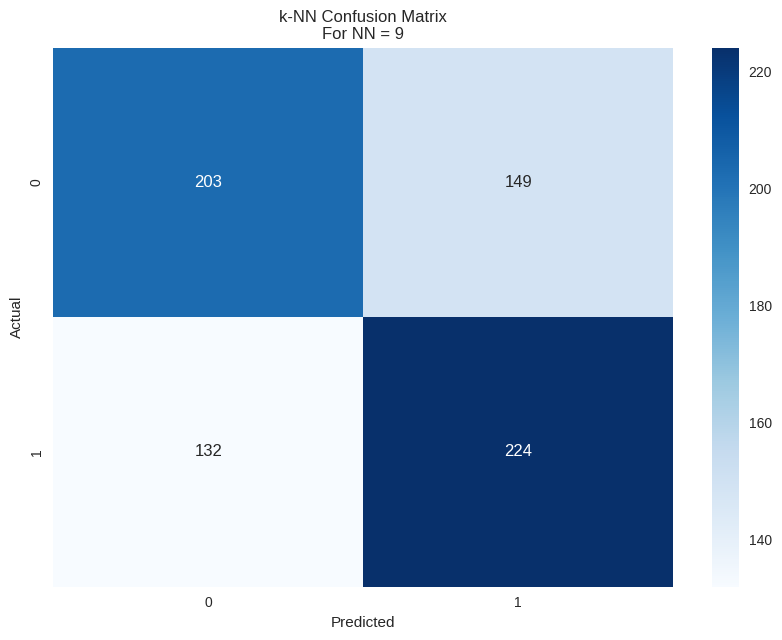

 K Neighbors Classifier
 For NN =  11
 Confusion Matrix - 
 [[196 156]
 [129 227]]
 Train accuracy score:  0.7008486562942009
 Test accuracy score:  0.597457627118644
 F1 Score =  0.5967841792958214
 Mean Squared Error =  0.4025423728813559
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.56      0.58       352
           1       0.59      0.64      0.61       356

    accuracy                           0.60       708
   macro avg       0.60      0.60      0.60       708
weighted avg       0.60      0.60      0.60       708





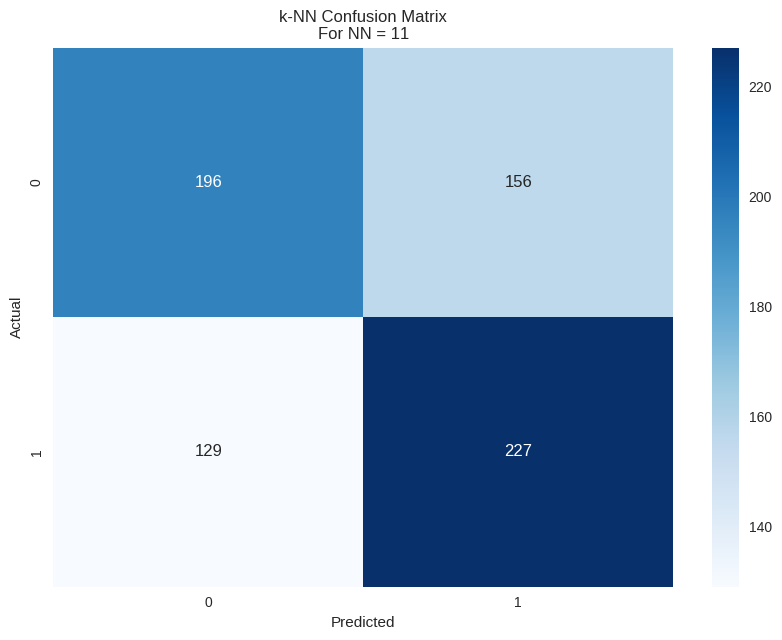

 K Neighbors Classifier
 For NN =  13
 Confusion Matrix - 
 [[197 155]
 [126 230]]
 Train accuracy score:  0.6913012729844413
 Test accuracy score:  0.6031073446327684
 F1 Score =  0.6023479578757605
 Mean Squared Error =  0.3968926553672316
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.56      0.58       352
           1       0.60      0.65      0.62       356

    accuracy                           0.60       708
   macro avg       0.60      0.60      0.60       708
weighted avg       0.60      0.60      0.60       708





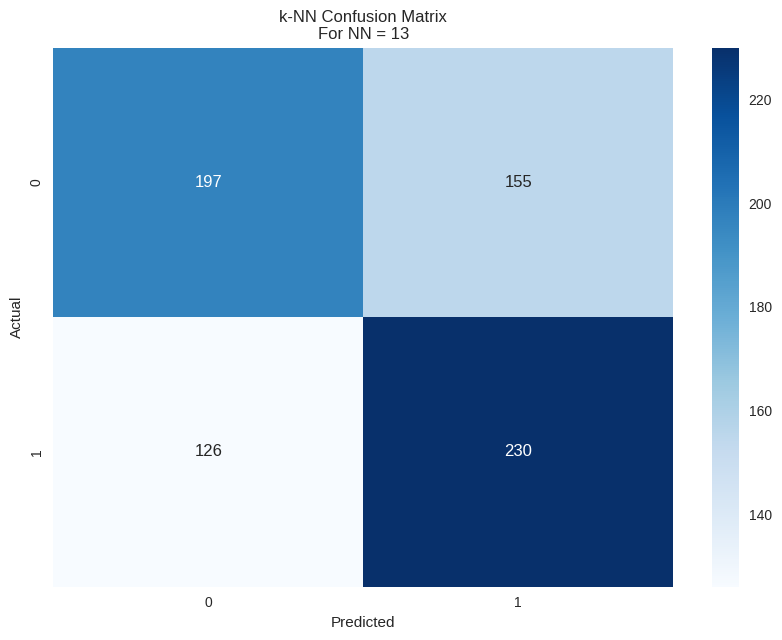

 K Neighbors Classifier
 For NN =  15
 Confusion Matrix - 
 [[199 153]
 [123 233]]
 Train accuracy score:  0.693069306930693
 Test accuracy score:  0.6101694915254238
 F1 Score =  0.6093744090259554
 Mean Squared Error =  0.3898305084745763
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.57      0.59       352
           1       0.60      0.65      0.63       356

    accuracy                           0.61       708
   macro avg       0.61      0.61      0.61       708
weighted avg       0.61      0.61      0.61       708





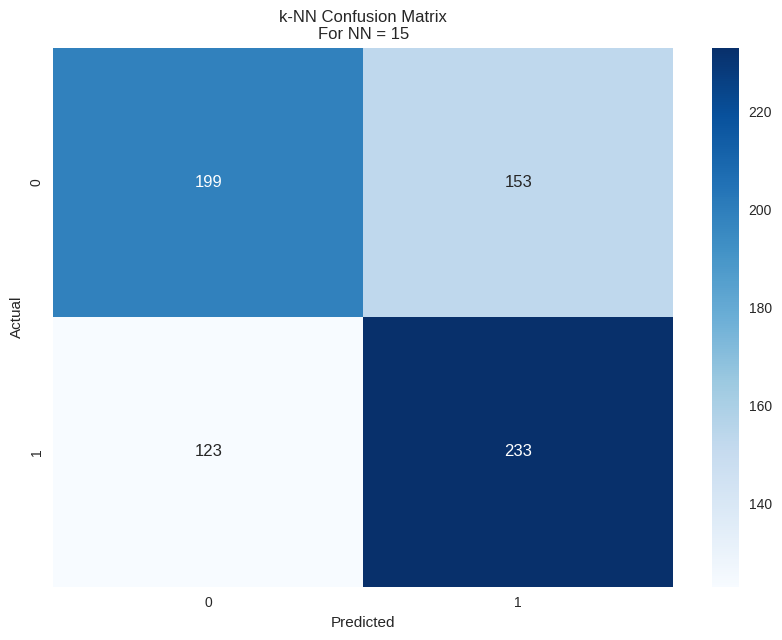

 K Neighbors Classifier
 For NN =  17
 Confusion Matrix - 
 [[195 157]
 [122 234]]
 Train accuracy score:  0.6842291371994342
 Test accuracy score:  0.6059322033898306
 F1 Score =  0.6048558450569017
 Mean Squared Error =  0.3940677966101695
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.55      0.58       352
           1       0.60      0.66      0.63       356

    accuracy                           0.61       708
   macro avg       0.61      0.61      0.60       708
weighted avg       0.61      0.61      0.60       708





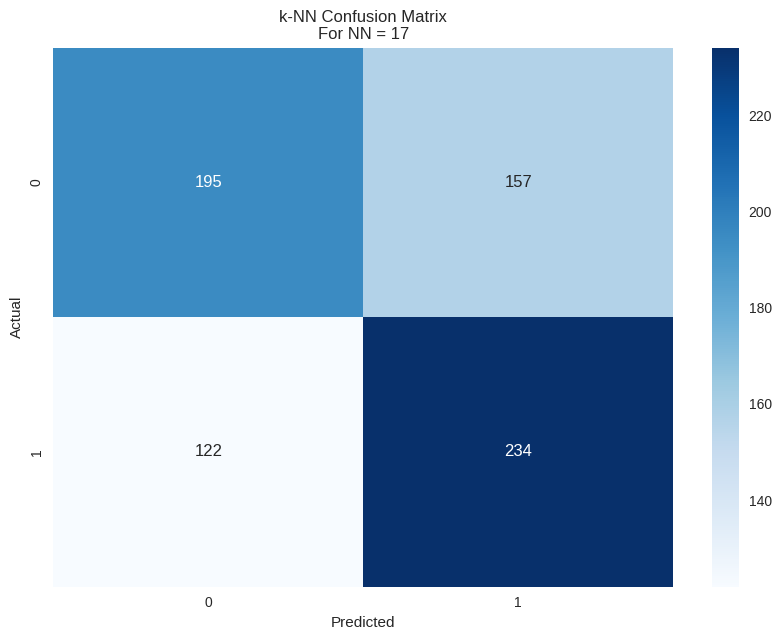

 K Neighbors Classifier
 For NN =  19
 Confusion Matrix - 
 [[200 152]
 [129 227]]
 Train accuracy score:  0.6714992927864215
 Test accuracy score:  0.6031073446327684
 F1 Score =  0.6026149308375631
 Mean Squared Error =  0.3968926553672316
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.57      0.59       352
           1       0.60      0.64      0.62       356

    accuracy                           0.60       708
   macro avg       0.60      0.60      0.60       708
weighted avg       0.60      0.60      0.60       708





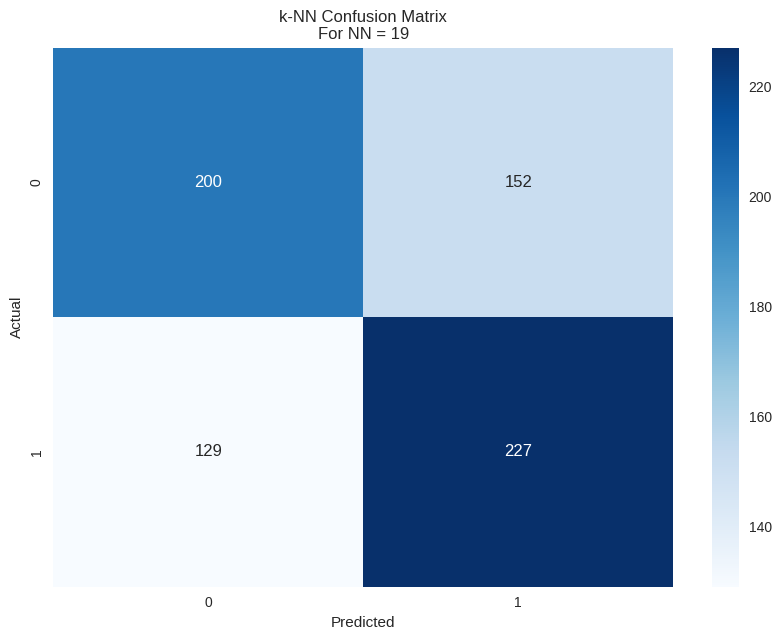

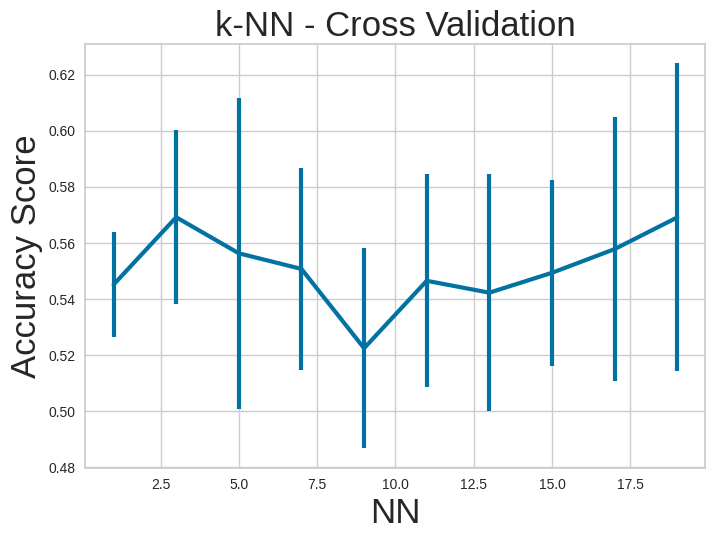

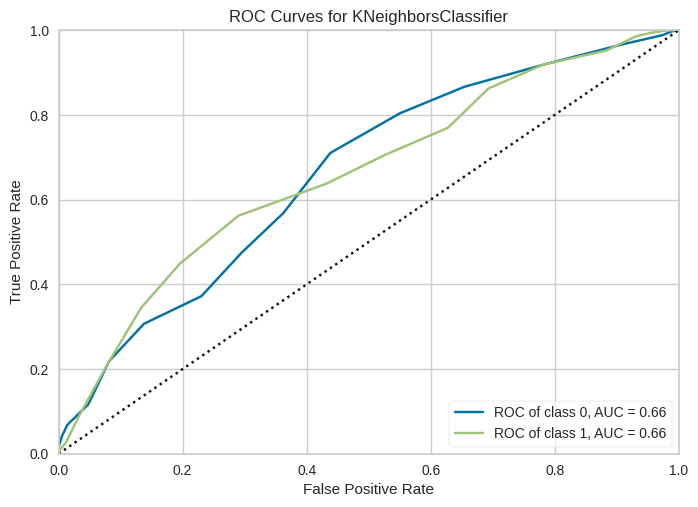

In [ ]:
evaluate_knn(X, y, nn_range, 2)

 Decision Tree Classifier
 For Depth =  3
 Confusion Matrix - 
 [[275  77]
 [182 174]]
 Train accuracy score:  0.6803394625176803
 Test accuracy score:  0.634180790960452
 F1 Score =  0.6262805567504537
 Mean Squared Error =  0.365819209039548
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.78      0.68       352
           1       0.69      0.49      0.57       356

    accuracy                           0.63       708
   macro avg       0.65      0.64      0.63       708
weighted avg       0.65      0.63      0.63       708





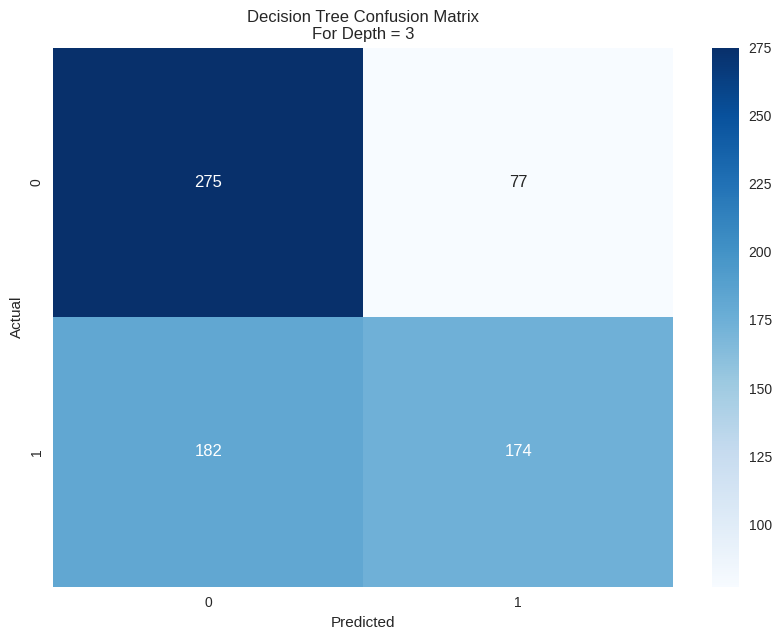

 Decision Tree Classifier
 For Depth =  5
 Confusion Matrix - 
 [[240 112]
 [123 233]]
 Train accuracy score:  0.7591937765205092
 Test accuracy score:  0.6680790960451978
 F1 Score =  0.6680281041363273
 Mean Squared Error =  0.3319209039548023
 Classification Report
               precision    recall  f1-score   support

           0       0.66      0.68      0.67       352
           1       0.68      0.65      0.66       356

    accuracy                           0.67       708
   macro avg       0.67      0.67      0.67       708
weighted avg       0.67      0.67      0.67       708





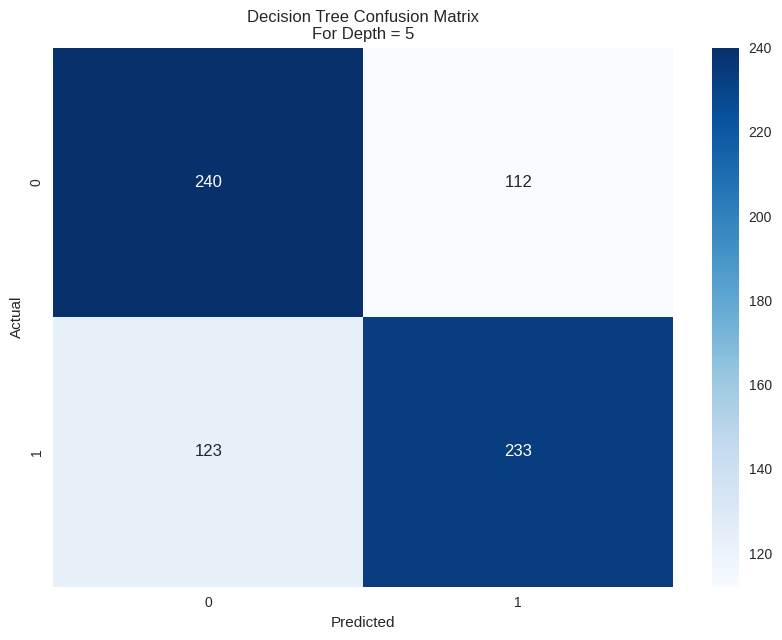

 Decision Tree Classifier
 For Depth =  7
 Confusion Matrix - 
 [[240 112]
 [136 220]]
 Train accuracy score:  0.8235502121640735
 Test accuracy score:  0.6497175141242938
 F1 Score =  0.6493818230120949
 Mean Squared Error =  0.3502824858757062
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.68      0.66       352
           1       0.66      0.62      0.64       356

    accuracy                           0.65       708
   macro avg       0.65      0.65      0.65       708
weighted avg       0.65      0.65      0.65       708





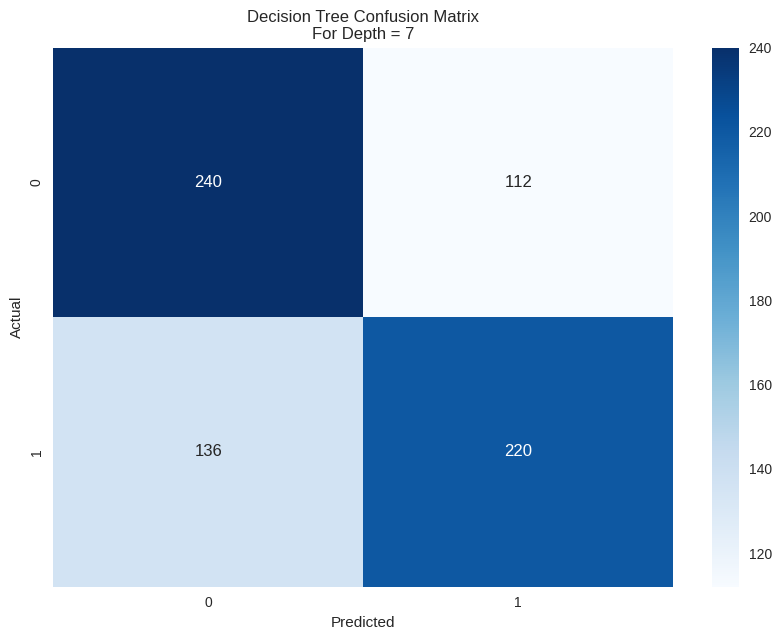

 Decision Tree Classifier
 For Depth =  9
 Confusion Matrix - 
 [[229 123]
 [127 229]]
 Train accuracy score:  0.9087694483734088
 Test accuracy score:  0.6468926553672316
 F1 Score =  0.6468926553672316
 Mean Squared Error =  0.3531073446327684
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.65      0.65       352
           1       0.65      0.64      0.65       356

    accuracy                           0.65       708
   macro avg       0.65      0.65      0.65       708
weighted avg       0.65      0.65      0.65       708





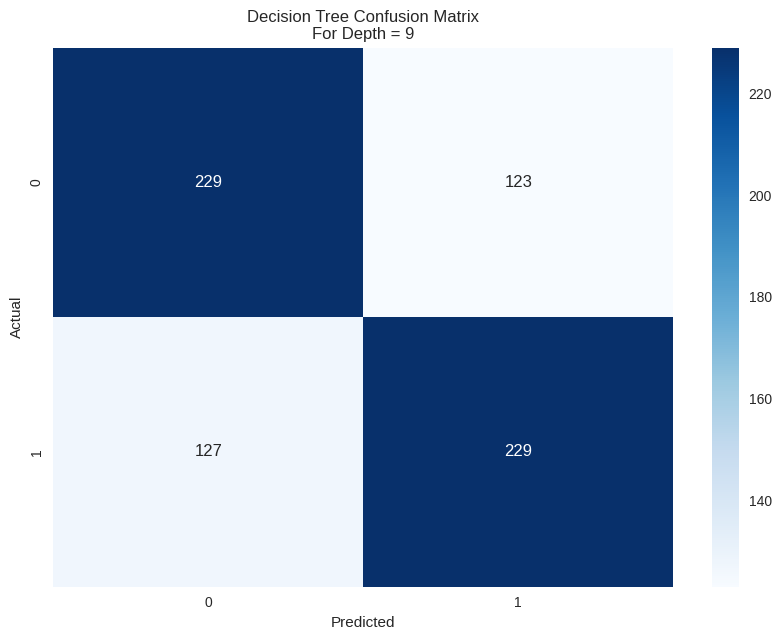

 Decision Tree Classifier
 For Depth =  11
 Confusion Matrix - 
 [[238 114]
 [132 224]]
 Train accuracy score:  0.96004243281471
 Test accuracy score:  0.652542372881356
 F1 Score =  0.6523676274934368
 Mean Squared Error =  0.3474576271186441
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.68      0.66       352
           1       0.66      0.63      0.65       356

    accuracy                           0.65       708
   macro avg       0.65      0.65      0.65       708
weighted avg       0.65      0.65      0.65       708





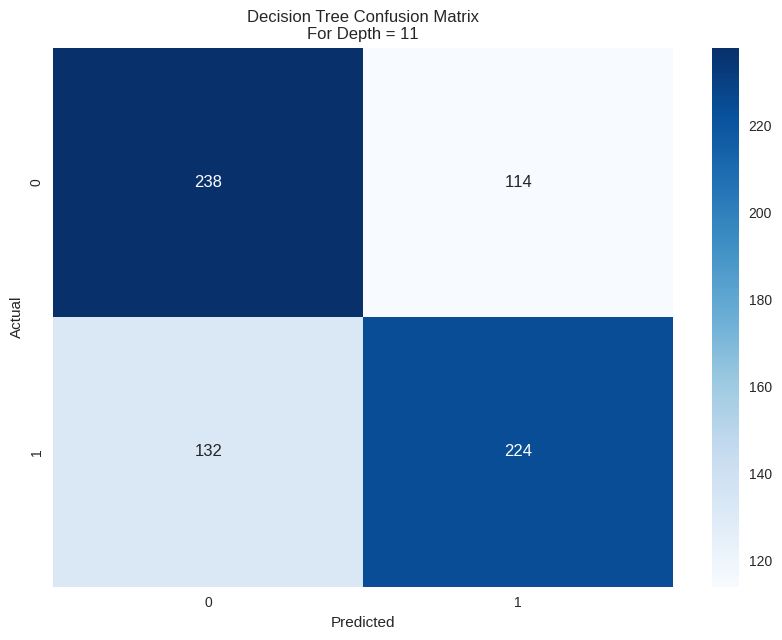

 Decision Tree Classifier
 For Depth =  13
 Confusion Matrix - 
 [[241 111]
 [128 228]]
 Train accuracy score:  0.9855021216407355
 Test accuracy score:  0.6624293785310734
 F1 Score =  0.6622804983639502
 Mean Squared Error =  0.3375706214689266
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.68      0.67       352
           1       0.67      0.64      0.66       356

    accuracy                           0.66       708
   macro avg       0.66      0.66      0.66       708
weighted avg       0.66      0.66      0.66       708





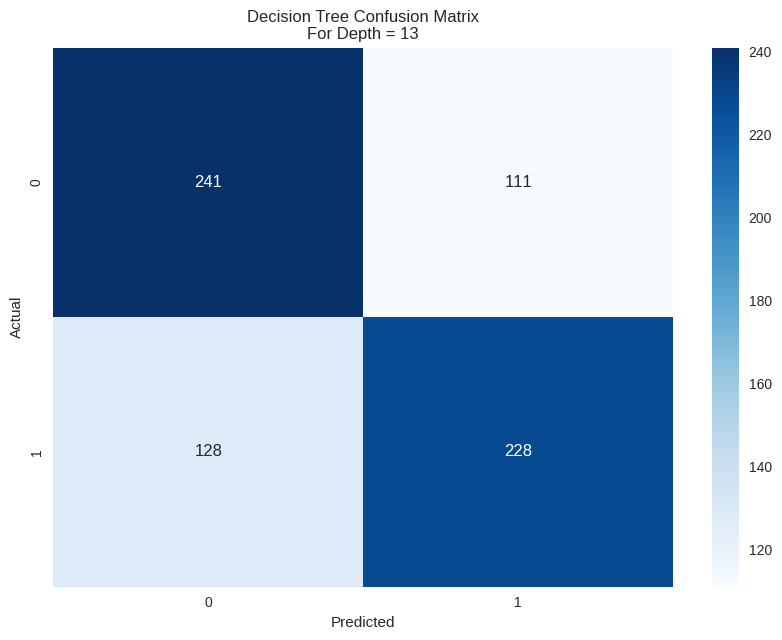

 Decision Tree Classifier
 For Depth =  15
 Confusion Matrix - 
 [[238 114]
 [122 234]]
 Train accuracy score:  0.9978783592644979
 Test accuracy score:  0.6666666666666666
 F1 Score =  0.6666453864487573
 Mean Squared Error =  0.3333333333333333
 Classification Report
               precision    recall  f1-score   support

           0       0.66      0.68      0.67       352
           1       0.67      0.66      0.66       356

    accuracy                           0.67       708
   macro avg       0.67      0.67      0.67       708
weighted avg       0.67      0.67      0.67       708





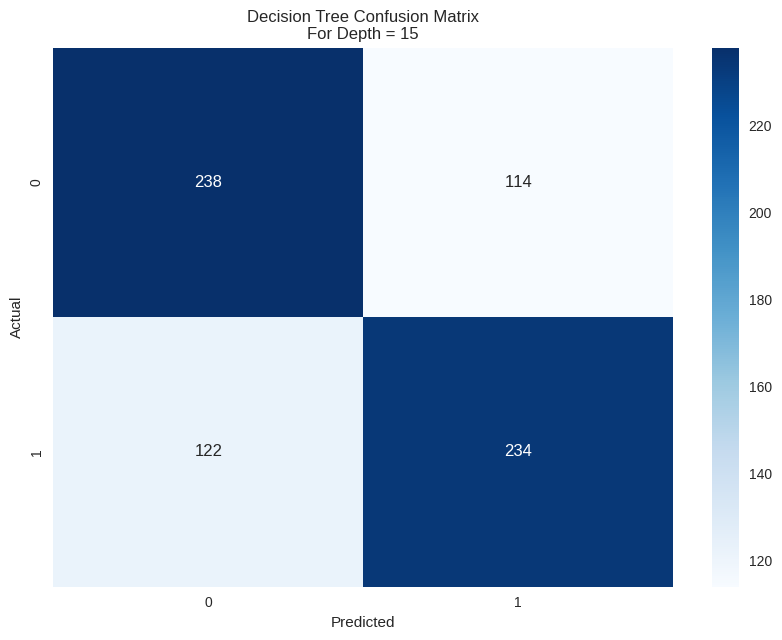

 Decision Tree Classifier
 For Depth =  17
 Confusion Matrix - 
 [[244 108]
 [125 231]]
 Train accuracy score:  0.9992927864214993
 Test accuracy score:  0.6709039548022598
 F1 Score =  0.6707588122125538
 Mean Squared Error =  0.3290960451977401
 Classification Report
               precision    recall  f1-score   support

           0       0.66      0.69      0.68       352
           1       0.68      0.65      0.66       356

    accuracy                           0.67       708
   macro avg       0.67      0.67      0.67       708
weighted avg       0.67      0.67      0.67       708





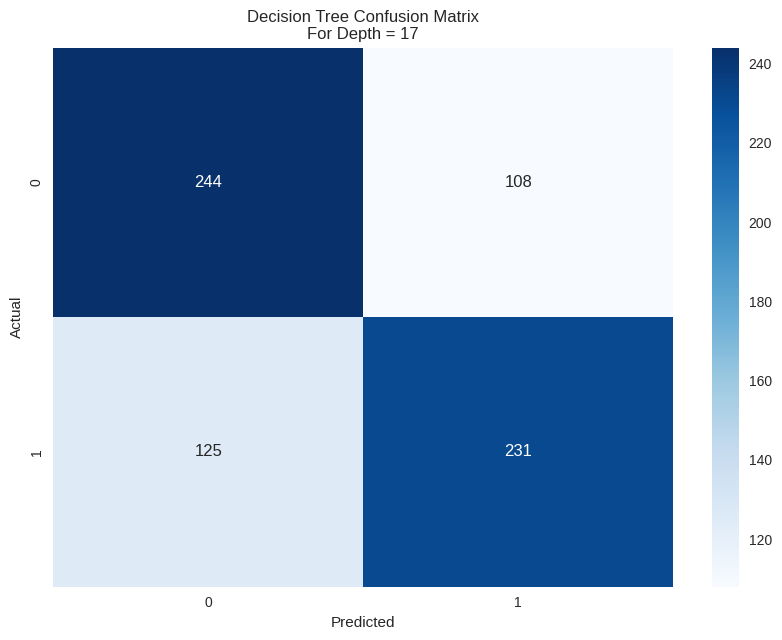

 Decision Tree Classifier
 For Depth =  19
 Confusion Matrix - 
 [[237 115]
 [121 235]]
 Train accuracy score:  1.0
 Test accuracy score:  0.6666666666666666
 F1 Score =  0.6666586867759912
 Mean Squared Error =  0.3333333333333333
 Classification Report
               precision    recall  f1-score   support

           0       0.66      0.67      0.67       352
           1       0.67      0.66      0.67       356

    accuracy                           0.67       708
   macro avg       0.67      0.67      0.67       708
weighted avg       0.67      0.67      0.67       708





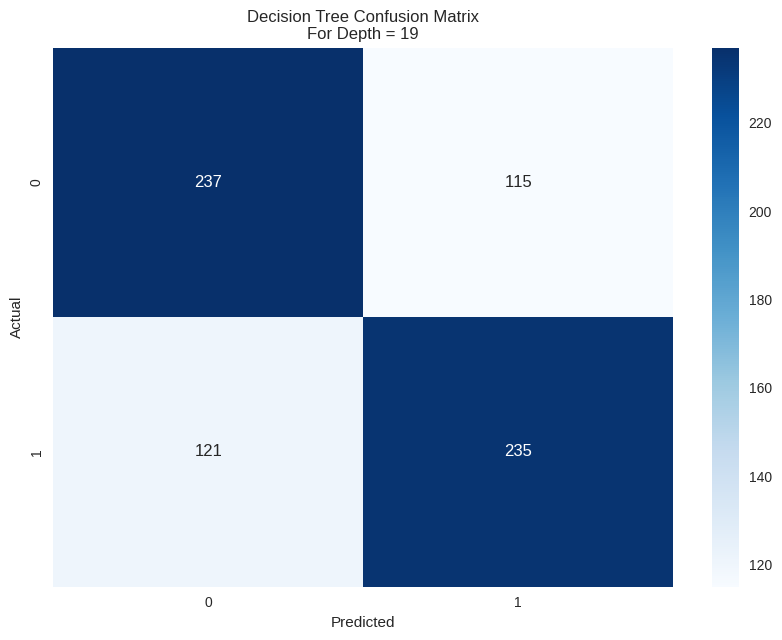

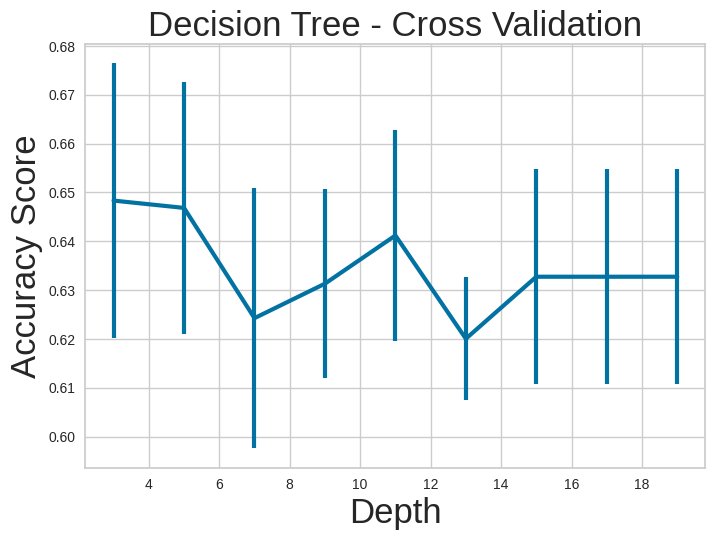

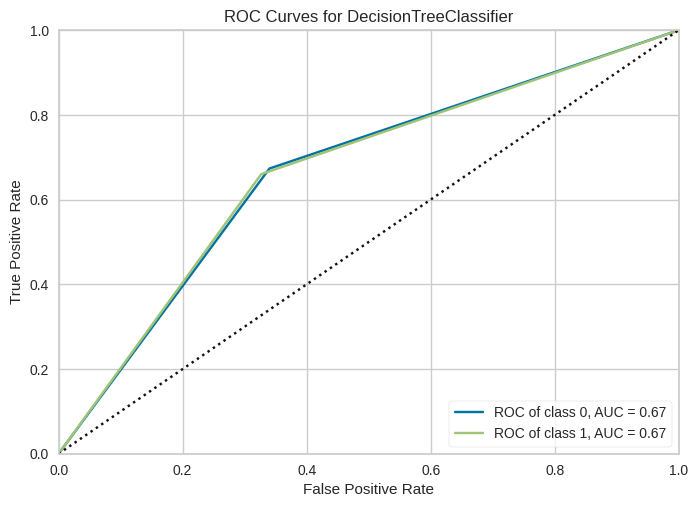

In [ ]:
evaluate_decision_tree(X, y, depth_range, 2)

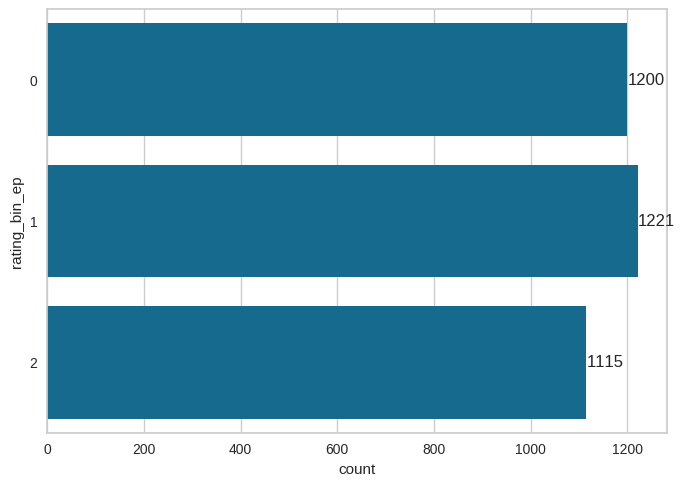

In [35]:
X,y = bin_column(listings, 'review_scores_cleanliness', 3)
check_bins(y)

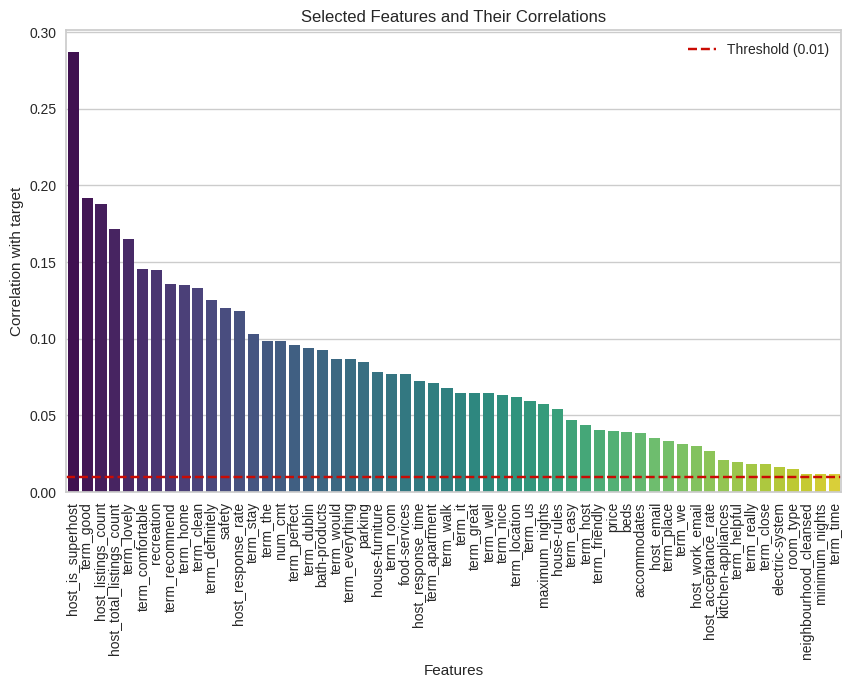

(Index(['host_is_superhost', 'term_good', 'host_listings_count',
        'host_total_listings_count', 'term_lovely', 'term_comfortable',
        'recreation', 'term_recommend', 'term_home', 'term_clean',
        'term_definitely', 'safety', 'host_response_rate', 'term_stay',
        'term_the', 'num_cmt', 'term_perfect', 'term_dublin', 'bath-products',
        'term_would', 'term_everything', 'parking', 'house-furniture',
        'term_room', 'food-services', 'host_response_time', 'term_apartment',
        'term_walk', 'term_it', 'term_great', 'term_well', 'term_nice',
        'term_location', 'term_us', 'maximum_nights', 'house-rules',
        'term_easy', 'term_host', 'term_friendly', 'price', 'beds',
        'accommodates', 'host_email', 'term_place', 'term_we',
        'host_work_email', 'host_acceptance_rate', 'kitchen-appliances',
        'term_helpful', 'term_really', 'term_close', 'electric-system',
        'room_type', 'neighbourhood_cleansed', 'minimum_nights', 'term_time'],


In [36]:
yy = listings['review_scores_cleanliness']
select_important_features(X, yy, threshold=0.01)

 Logistic Regression
 For Degree =  1
 For C =  0.001
 Confusion Matrix - 
 [[123  49  58]
 [ 54 108  87]
 [ 55  63 111]]
 Train accuracy score:  0.5081329561527581
 Test accuracy score:  0.4830508474576271
 F1 Score =  0.48300309237819833
 Mean Squared Error =  0.9957627118644068
 Classification Report
               precision    recall  f1-score   support

           0       0.53      0.53      0.53       230
           1       0.49      0.43      0.46       249
           2       0.43      0.48      0.46       229

    accuracy                           0.48       708
   macro avg       0.48      0.48      0.48       708
weighted avg       0.49      0.48      0.48       708





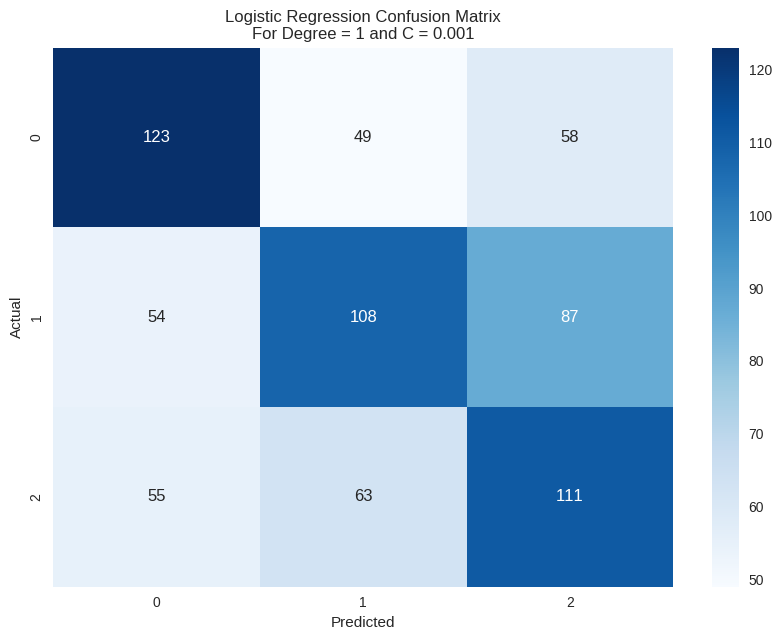

 Logistic Regression
 For Degree =  1
 For C =  0.1
 Confusion Matrix - 
 [[173  29  28]
 [ 82 102  65]
 [ 73  60  96]]
 Train accuracy score:  0.5601131541725601
 Test accuracy score:  0.5240112994350282
 F1 Score =  0.5130629164851203
 Mean Squared Error =  0.903954802259887
 Classification Report
               precision    recall  f1-score   support

           0       0.53      0.75      0.62       230
           1       0.53      0.41      0.46       249
           2       0.51      0.42      0.46       229

    accuracy                           0.52       708
   macro avg       0.52      0.53      0.51       708
weighted avg       0.52      0.52      0.51       708





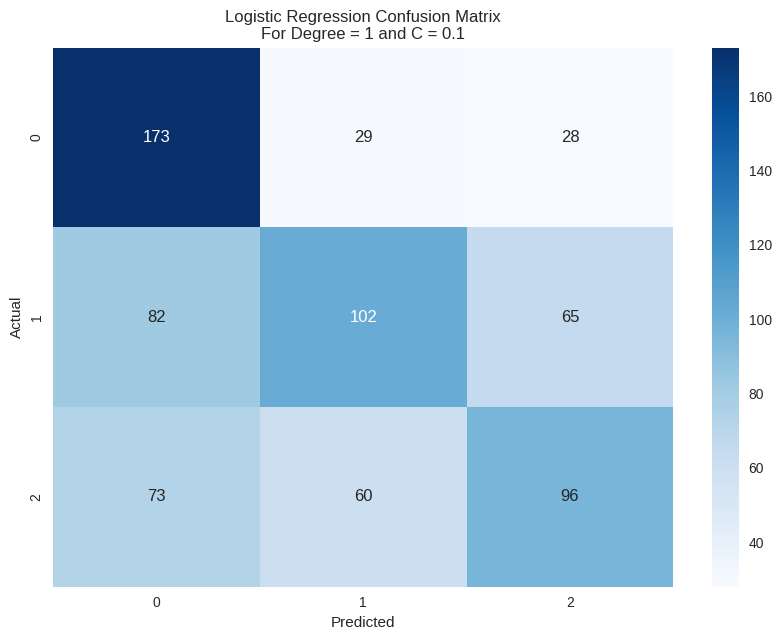

 Logistic Regression
 For Degree =  1
 For C =  1
 Confusion Matrix - 
 [[175  29  26]
 [ 72 107  70]
 [ 59  69 101]]
 Train accuracy score:  0.5735502121640735
 Test accuracy score:  0.5409604519774012
 F1 Score =  0.5312760814648819
 Mean Squared Error =  0.8192090395480226
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.76      0.65       230
           1       0.52      0.43      0.47       249
           2       0.51      0.44      0.47       229

    accuracy                           0.54       708
   macro avg       0.54      0.54      0.53       708
weighted avg       0.54      0.54      0.53       708





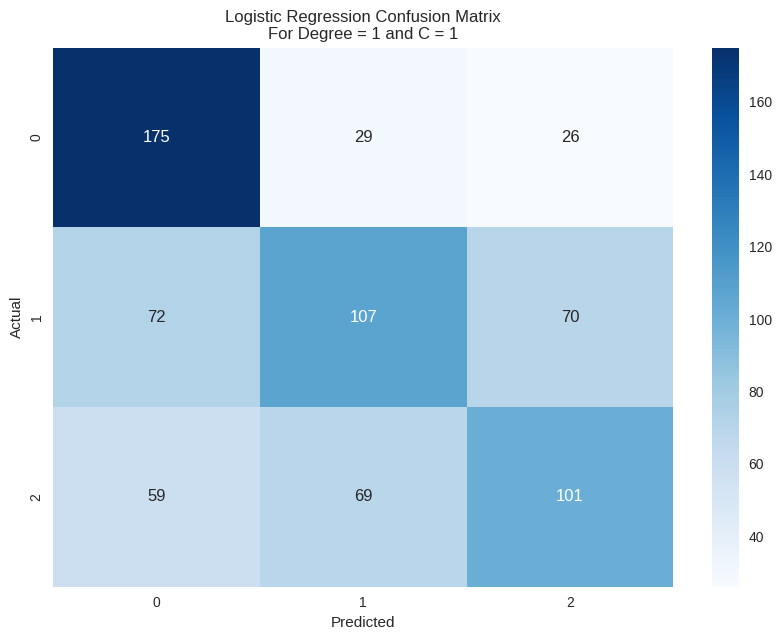

 Logistic Regression
 For Degree =  1
 For C =  10
 Confusion Matrix - 
 [[171  30  29]
 [ 72 111  66]
 [ 57  73  99]]
 Train accuracy score:  0.5792079207920792
 Test accuracy score:  0.538135593220339
 F1 Score =  0.5296575034280039
 Mean Squared Error =  0.826271186440678
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.74      0.65       230
           1       0.52      0.45      0.48       249
           2       0.51      0.43      0.47       229

    accuracy                           0.54       708
   macro avg       0.53      0.54      0.53       708
weighted avg       0.53      0.54      0.53       708





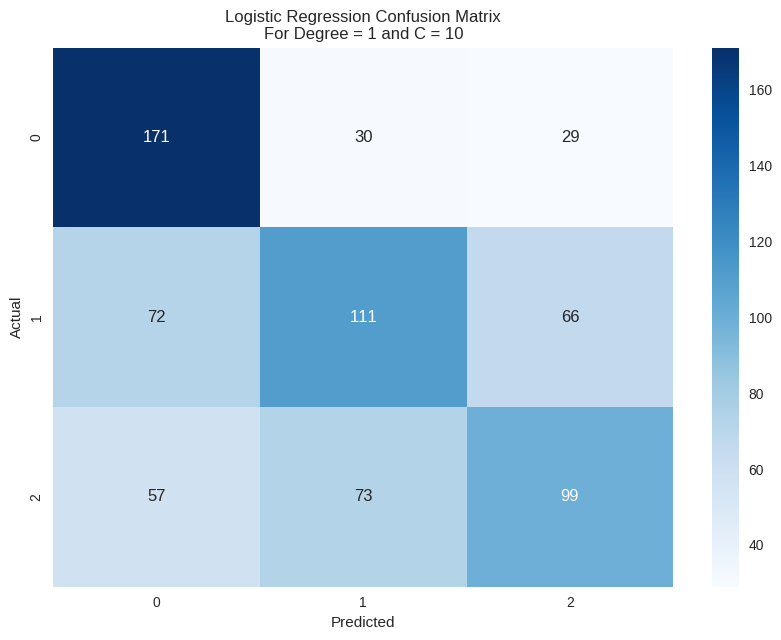

 Logistic Regression
 For Degree =  1
 For C =  100
 Confusion Matrix - 
 [[170  30  30]
 [ 72 112  65]
 [ 57  74  98]]
 Train accuracy score:  0.5795615275813296
 Test accuracy score:  0.536723163841808
 F1 Score =  0.5284387904332706
 Mean Squared Error =  0.8319209039548022
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.74      0.64       230
           1       0.52      0.45      0.48       249
           2       0.51      0.43      0.46       229

    accuracy                           0.54       708
   macro avg       0.53      0.54      0.53       708
weighted avg       0.53      0.54      0.53       708





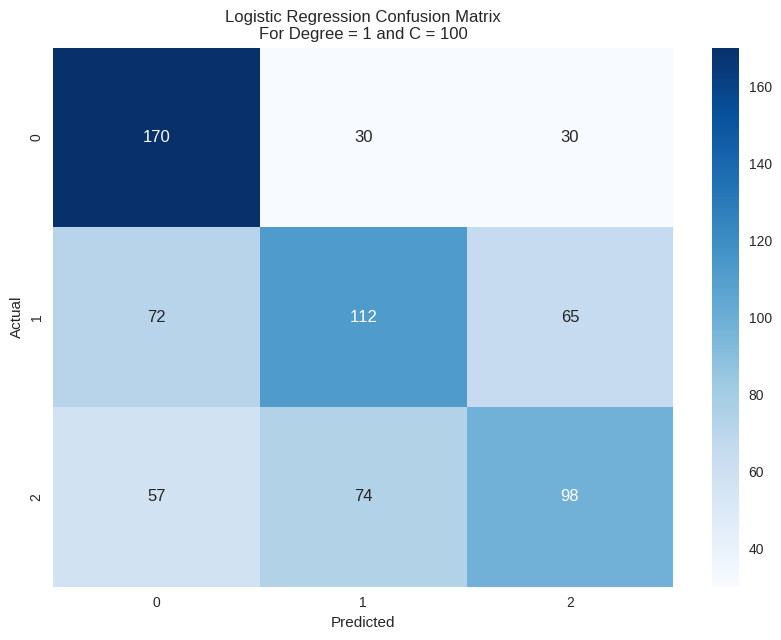

 Logistic Regression
 For Degree =  1
 For C =  1000
 Confusion Matrix - 
 [[170  30  30]
 [ 72 112  65]
 [ 57  74  98]]
 Train accuracy score:  0.57991513437058
 Test accuracy score:  0.536723163841808
 F1 Score =  0.5284387904332706
 Mean Squared Error =  0.8319209039548022
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.74      0.64       230
           1       0.52      0.45      0.48       249
           2       0.51      0.43      0.46       229

    accuracy                           0.54       708
   macro avg       0.53      0.54      0.53       708
weighted avg       0.53      0.54      0.53       708





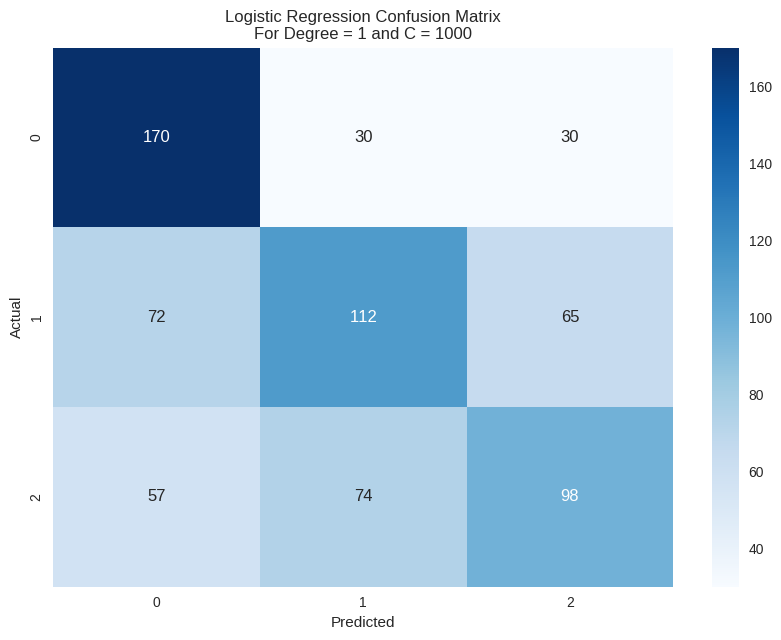

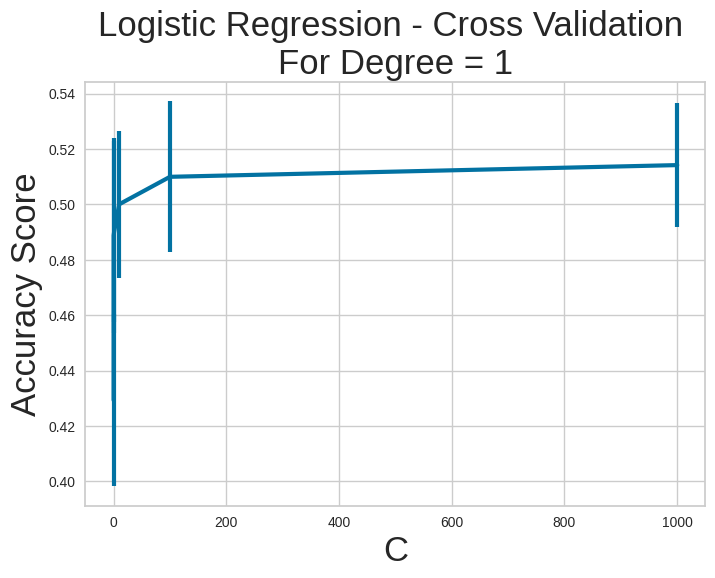

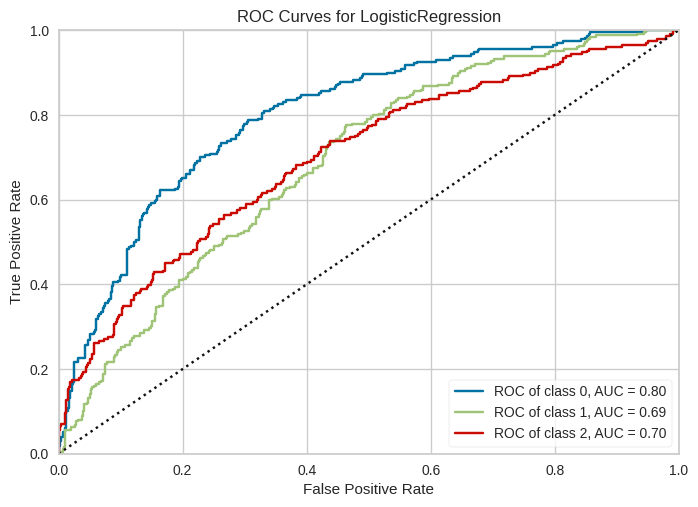

 Logistic Regression
 For Degree =  2
 For C =  0.001
 Confusion Matrix - 
 [[155  36  39]
 [ 61 104  84]
 [ 48  55 126]]
 Train accuracy score:  0.6371994342291372
 Test accuracy score:  0.5437853107344632
 F1 Score =  0.5391365337953671
 Mean Squared Error =  0.8248587570621468
 Classification Report
               precision    recall  f1-score   support

           0       0.59      0.67      0.63       230
           1       0.53      0.42      0.47       249
           2       0.51      0.55      0.53       229

    accuracy                           0.54       708
   macro avg       0.54      0.55      0.54       708
weighted avg       0.54      0.54      0.54       708





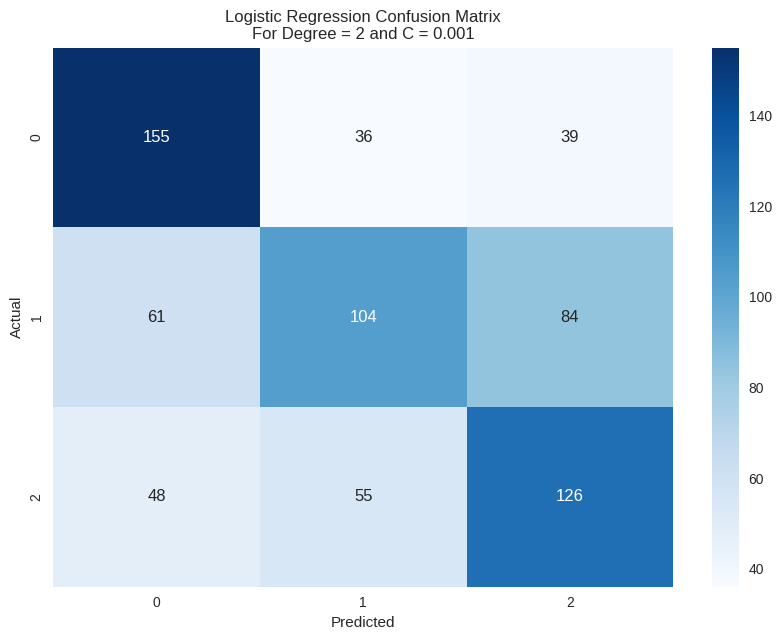

 Logistic Regression
 For Degree =  2
 For C =  0.1
 Confusion Matrix - 
 [[157  35  38]
 [ 64 102  83]
 [ 49  54 126]]
 Train accuracy score:  0.6326025459688827
 Test accuracy score:  0.5437853107344632
 F1 Score =  0.538306142179522
 Mean Squared Error =  0.8248587570621468
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.68      0.63       230
           1       0.53      0.41      0.46       249
           2       0.51      0.55      0.53       229

    accuracy                           0.54       708
   macro avg       0.54      0.55      0.54       708
weighted avg       0.54      0.54      0.54       708





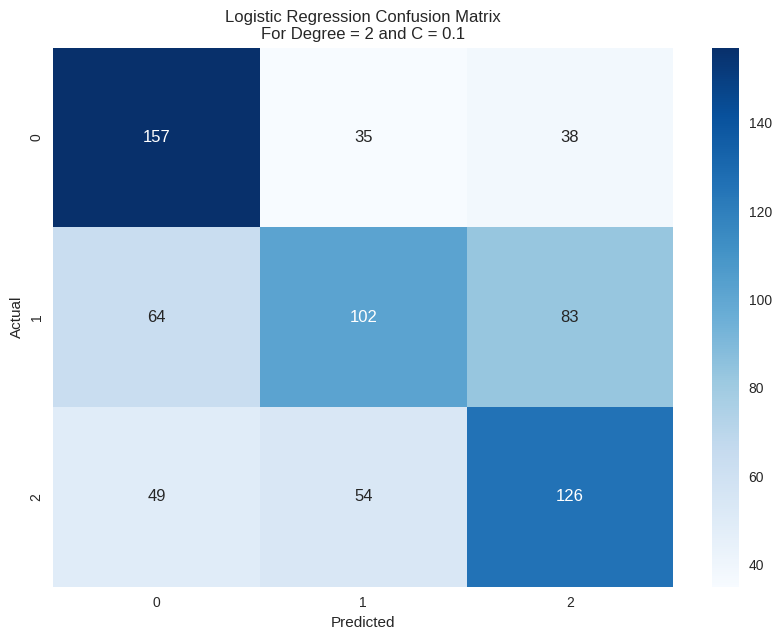

 Logistic Regression
 For Degree =  2
 For C =  1
 Confusion Matrix - 
 [[155  36  39]
 [ 61 104  84]
 [ 49  54 126]]
 Train accuracy score:  0.634016973125884
 Test accuracy score:  0.5437853107344632
 F1 Score =  0.5390966121409969
 Mean Squared Error =  0.8290960451977402
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.67      0.63       230
           1       0.54      0.42      0.47       249
           2       0.51      0.55      0.53       229

    accuracy                           0.54       708
   macro avg       0.54      0.55      0.54       708
weighted avg       0.54      0.54      0.54       708





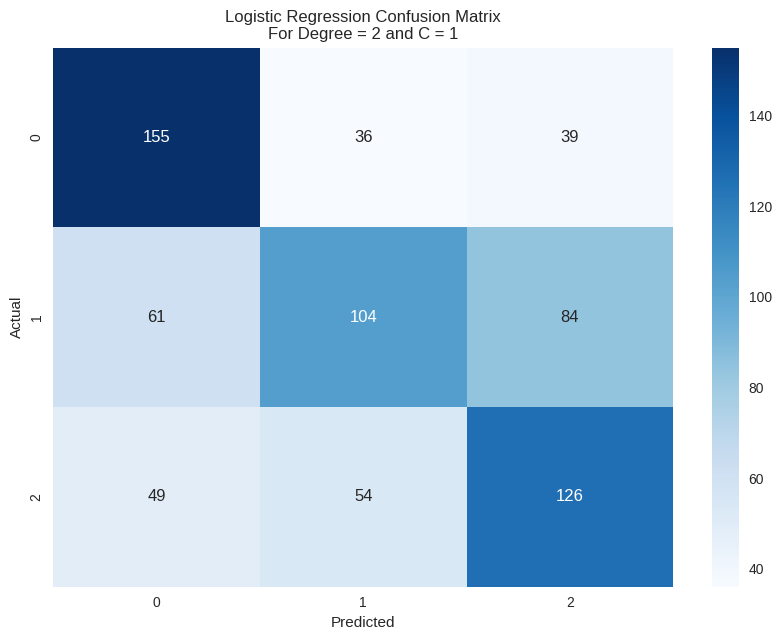

 Logistic Regression
 For Degree =  2
 For C =  10
 Confusion Matrix - 
 [[156  36  38]
 [ 63 101  85]
 [ 49  55 125]]
 Train accuracy score:  0.6272984441301273
 Test accuracy score:  0.53954802259887
 F1 Score =  0.5341409204399197
 Mean Squared Error =  0.8290960451977402
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.68      0.63       230
           1       0.53      0.41      0.46       249
           2       0.50      0.55      0.52       229

    accuracy                           0.54       708
   macro avg       0.54      0.54      0.54       708
weighted avg       0.54      0.54      0.53       708





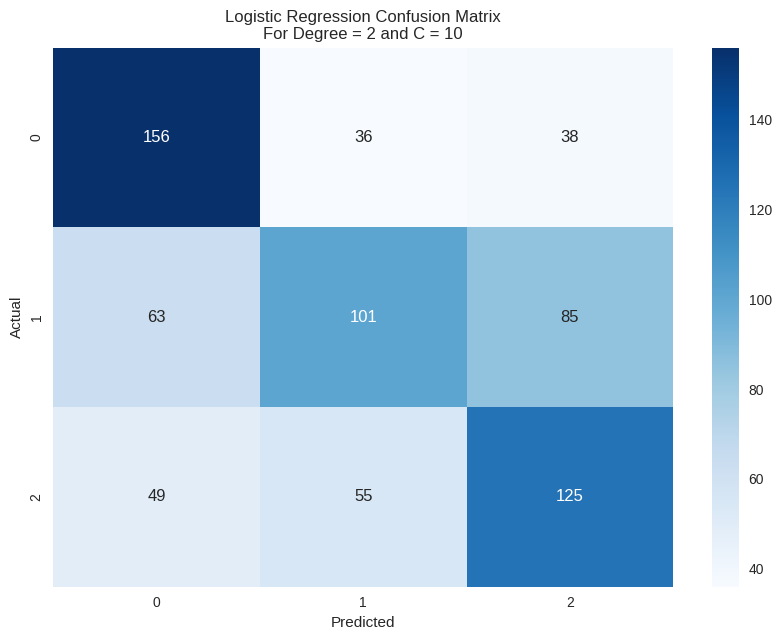

 Logistic Regression
 For Degree =  2
 For C =  100
 Confusion Matrix - 
 [[153  38  39]
 [ 61 104  84]
 [ 48  54 127]]
 Train accuracy score:  0.6371994342291372
 Test accuracy score:  0.5423728813559322
 F1 Score =  0.5379483723939121
 Mean Squared Error =  0.826271186440678
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.67      0.62       230
           1       0.53      0.42      0.47       249
           2       0.51      0.55      0.53       229

    accuracy                           0.54       708
   macro avg       0.54      0.55      0.54       708
weighted avg       0.54      0.54      0.54       708





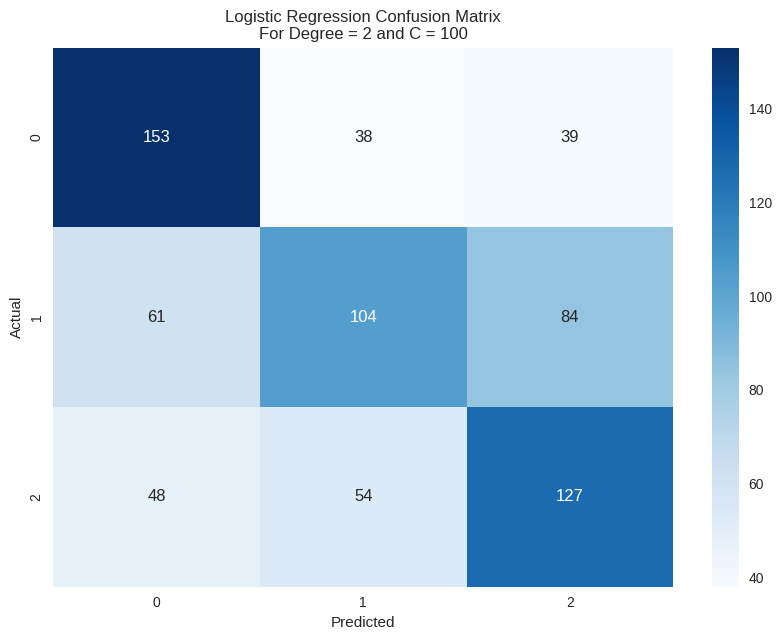

 Logistic Regression
 For Degree =  2
 For C =  1000
 Confusion Matrix - 
 [[155  36  39]
 [ 60 105  84]
 [ 47  56 126]]
 Train accuracy score:  0.6432107496463932
 Test accuracy score:  0.5451977401129944
 F1 Score =  0.5408035100652019
 Mean Squared Error =  0.8192090395480226
 Classification Report
               precision    recall  f1-score   support

           0       0.59      0.67      0.63       230
           1       0.53      0.42      0.47       249
           2       0.51      0.55      0.53       229

    accuracy                           0.55       708
   macro avg       0.54      0.55      0.54       708
weighted avg       0.54      0.55      0.54       708





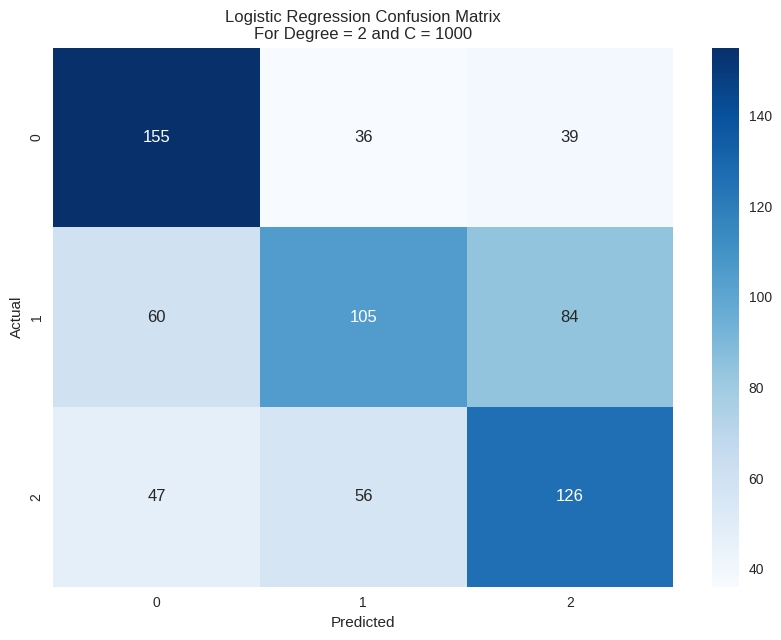

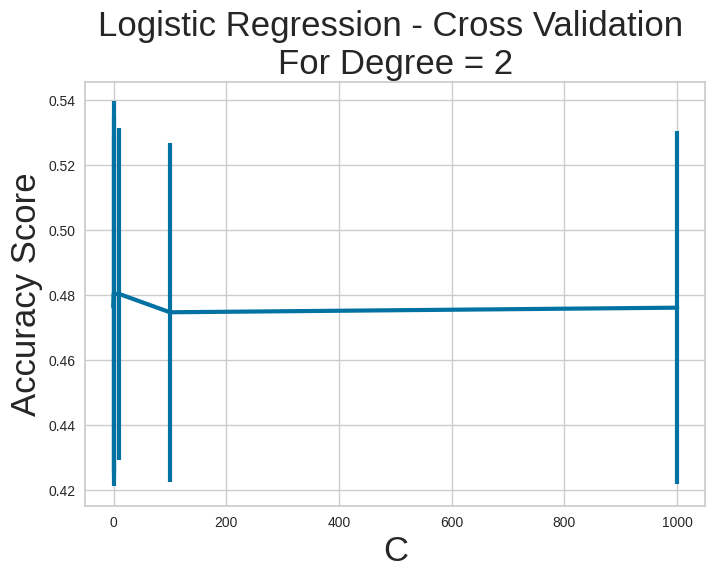

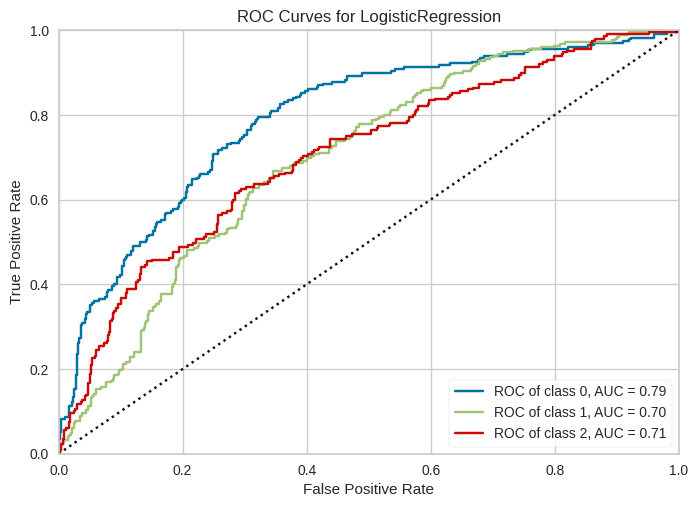

In [ ]:
evaluate_logistic_regression(X, y, c_range, degree_range, 3)

 K Neighbors Classifier
 For NN =  1
 Confusion Matrix - 
 [[ 96  79  55]
 [ 74 102  73]
 [ 62  63 104]]
 Train accuracy score:  1.0
 Test accuracy score:  0.4265536723163842
 F1 Score =  0.426471905021446
 Mean Squared Error =  1.0692090395480225
 Classification Report
               precision    recall  f1-score   support

           0       0.41      0.42      0.42       230
           1       0.42      0.41      0.41       249
           2       0.45      0.45      0.45       229

    accuracy                           0.43       708
   macro avg       0.43      0.43      0.43       708
weighted avg       0.43      0.43      0.43       708





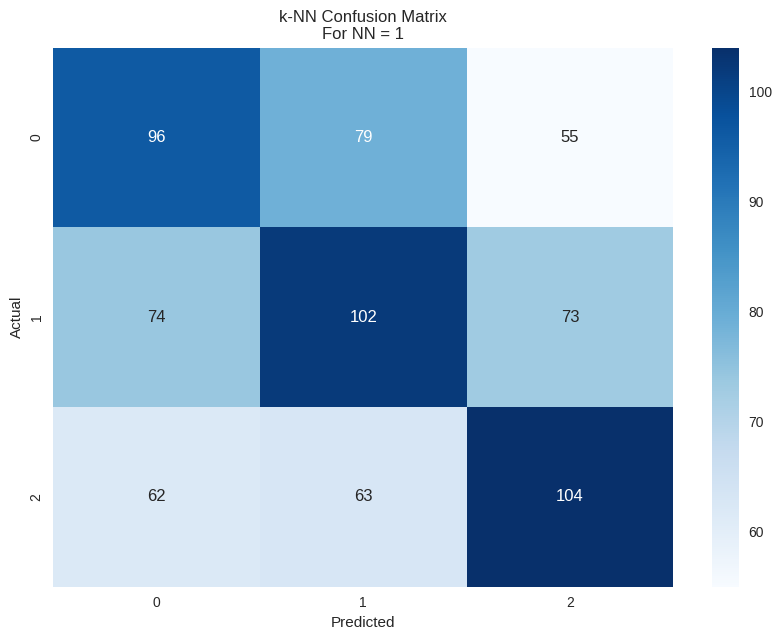

 K Neighbors Classifier
 For NN =  3
 Confusion Matrix - 
 [[125  57  48]
 [109  78  62]
 [ 77  56  96]]
 Train accuracy score:  0.6895332390381895
 Test accuracy score:  0.422316384180791
 F1 Score =  0.4175739241404649
 Mean Squared Error =  1.1073446327683616
 Classification Report
               precision    recall  f1-score   support

           0       0.40      0.54      0.46       230
           1       0.41      0.31      0.35       249
           2       0.47      0.42      0.44       229

    accuracy                           0.42       708
   macro avg       0.43      0.43      0.42       708
weighted avg       0.42      0.42      0.42       708





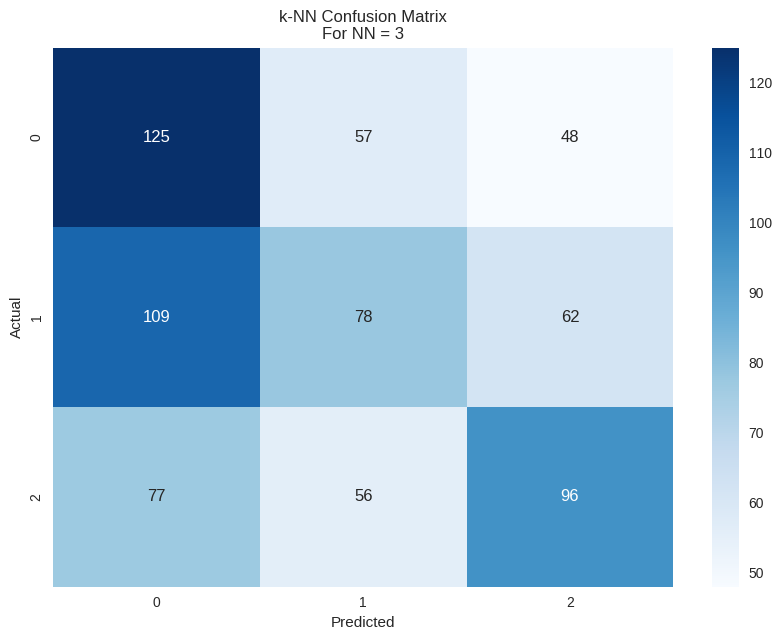

 K Neighbors Classifier
 For NN =  5
 Confusion Matrix - 
 [[117  68  45]
 [ 96  91  62]
 [ 80  59  90]]
 Train accuracy score:  0.6258840169731259
 Test accuracy score:  0.4209039548022599
 F1 Score =  0.4190784722550214
 Mean Squared Error =  1.1087570621468927
 Classification Report
               precision    recall  f1-score   support

           0       0.40      0.51      0.45       230
           1       0.42      0.37      0.39       249
           2       0.46      0.39      0.42       229

    accuracy                           0.42       708
   macro avg       0.42      0.42      0.42       708
weighted avg       0.42      0.42      0.42       708





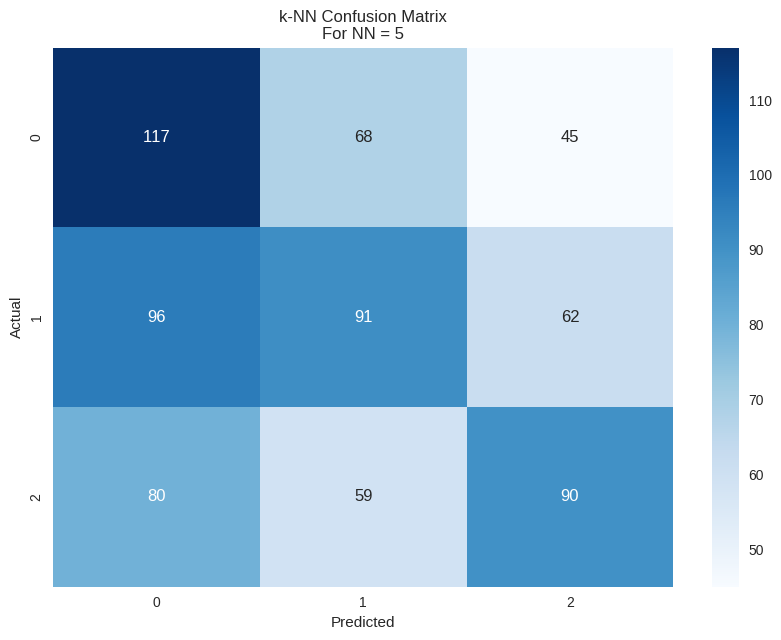

 K Neighbors Classifier
 For NN =  7
 Confusion Matrix - 
 [[101  70  59]
 [ 78 106  65]
 [ 64  61 104]]
 Train accuracy score:  0.6043140028288543
 Test accuracy score:  0.4392655367231638
 F1 Score =  0.4393629329752916
 Mean Squared Error =  1.0819209039548023
 Classification Report
               precision    recall  f1-score   support

           0       0.42      0.44      0.43       230
           1       0.45      0.43      0.44       249
           2       0.46      0.45      0.46       229

    accuracy                           0.44       708
   macro avg       0.44      0.44      0.44       708
weighted avg       0.44      0.44      0.44       708





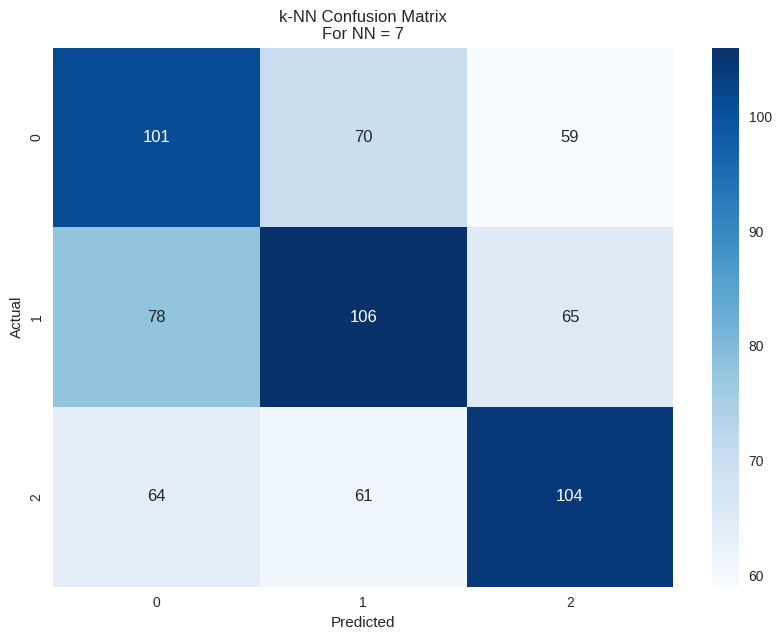

 K Neighbors Classifier
 For NN =  9
 Confusion Matrix - 
 [[101  73  56]
 [ 79 100  70]
 [ 73  67  89]]
 Train accuracy score:  0.5891089108910891
 Test accuracy score:  0.4096045197740113
 F1 Score =  0.4093746797942493
 Mean Squared Error =  1.137005649717514
 Classification Report
               precision    recall  f1-score   support

           0       0.40      0.44      0.42       230
           1       0.42      0.40      0.41       249
           2       0.41      0.39      0.40       229

    accuracy                           0.41       708
   macro avg       0.41      0.41      0.41       708
weighted avg       0.41      0.41      0.41       708





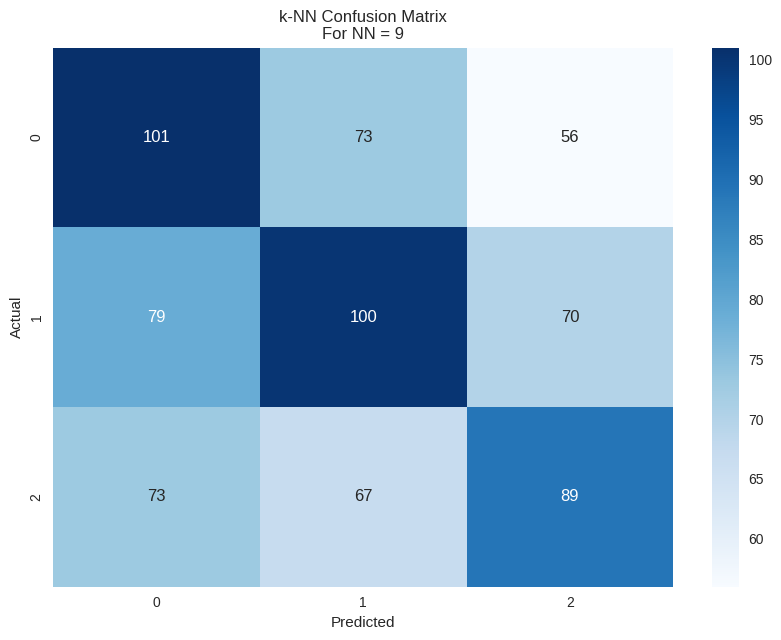

 K Neighbors Classifier
 For NN =  11
 Confusion Matrix - 
 [[108  71  51]
 [ 72 103  74]
 [ 70  66  93]]
 Train accuracy score:  0.5845120226308345
 Test accuracy score:  0.4293785310734463
 F1 Score =  0.4289326216461854
 Mean Squared Error =  1.0833333333333333
 Classification Report
               precision    recall  f1-score   support

           0       0.43      0.47      0.45       230
           1       0.43      0.41      0.42       249
           2       0.43      0.41      0.42       229

    accuracy                           0.43       708
   macro avg       0.43      0.43      0.43       708
weighted avg       0.43      0.43      0.43       708





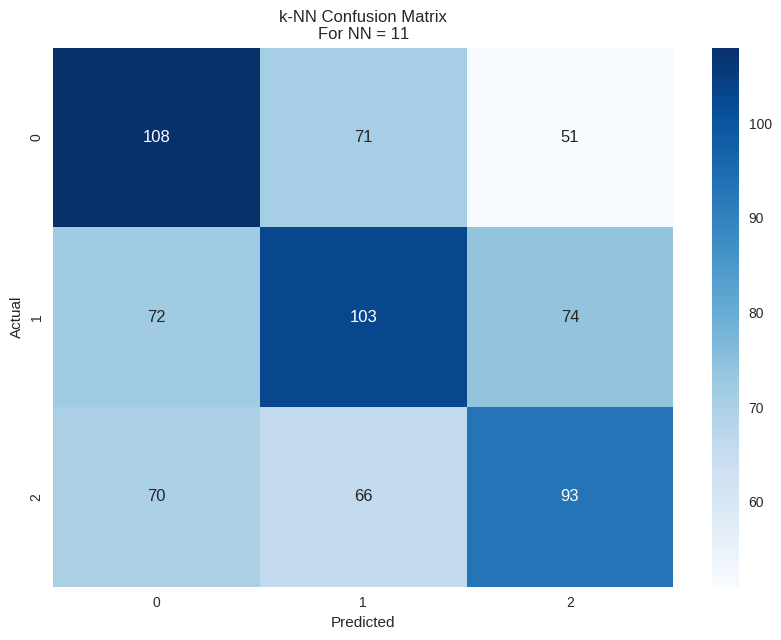

 K Neighbors Classifier
 For NN =  13
 Confusion Matrix - 
 [[103  64  63]
 [ 73 102  74]
 [ 66  69  94]]
 Train accuracy score:  0.5657708628005658
 Test accuracy score:  0.422316384180791
 F1 Score =  0.42220773093668074
 Mean Squared Error =  1.1242937853107344
 Classification Report
               precision    recall  f1-score   support

           0       0.43      0.45      0.44       230
           1       0.43      0.41      0.42       249
           2       0.41      0.41      0.41       229

    accuracy                           0.42       708
   macro avg       0.42      0.42      0.42       708
weighted avg       0.42      0.42      0.42       708





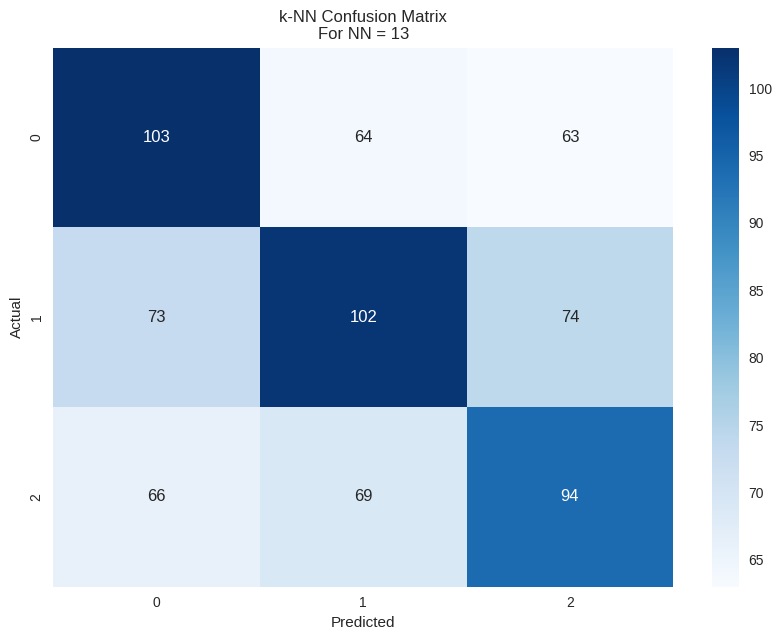

 K Neighbors Classifier
 For NN =  15
 Confusion Matrix - 
 [[104  69  57]
 [ 71 102  76]
 [ 67  67  95]]
 Train accuracy score:  0.557991513437058
 Test accuracy score:  0.4251412429378531
 F1 Score =  0.4249543942125259
 Mean Squared Error =  1.1002824858757063
 Classification Report
               precision    recall  f1-score   support

           0       0.43      0.45      0.44       230
           1       0.43      0.41      0.42       249
           2       0.42      0.41      0.42       229

    accuracy                           0.43       708
   macro avg       0.42      0.43      0.43       708
weighted avg       0.43      0.43      0.42       708





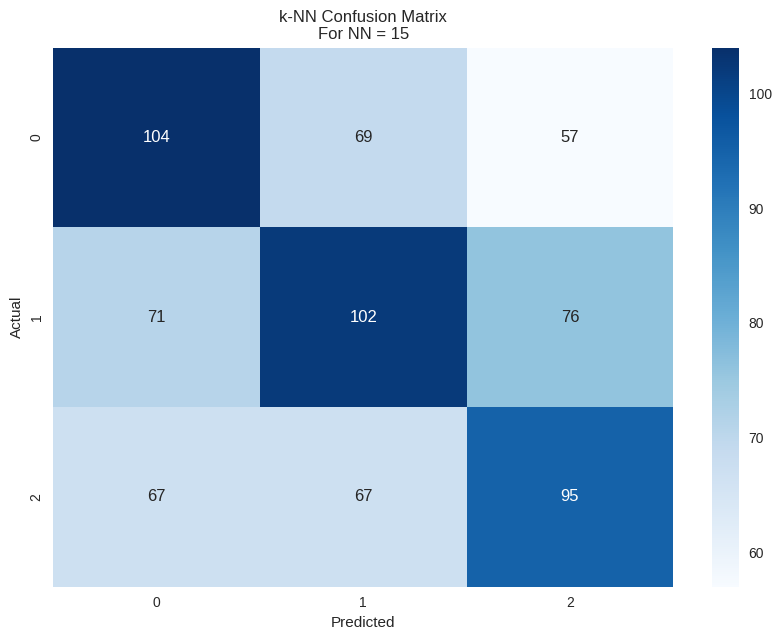

 K Neighbors Classifier
 For NN =  17
 Confusion Matrix - 
 [[ 98  73  59]
 [ 64 110  75]
 [ 68  69  92]]
 Train accuracy score:  0.5533946251768034
 Test accuracy score:  0.423728813559322
 F1 Score =  0.4236552412031961
 Mean Squared Error =  1.1144067796610169
 Classification Report
               precision    recall  f1-score   support

           0       0.43      0.43      0.43       230
           1       0.44      0.44      0.44       249
           2       0.41      0.40      0.40       229

    accuracy                           0.42       708
   macro avg       0.42      0.42      0.42       708
weighted avg       0.42      0.42      0.42       708





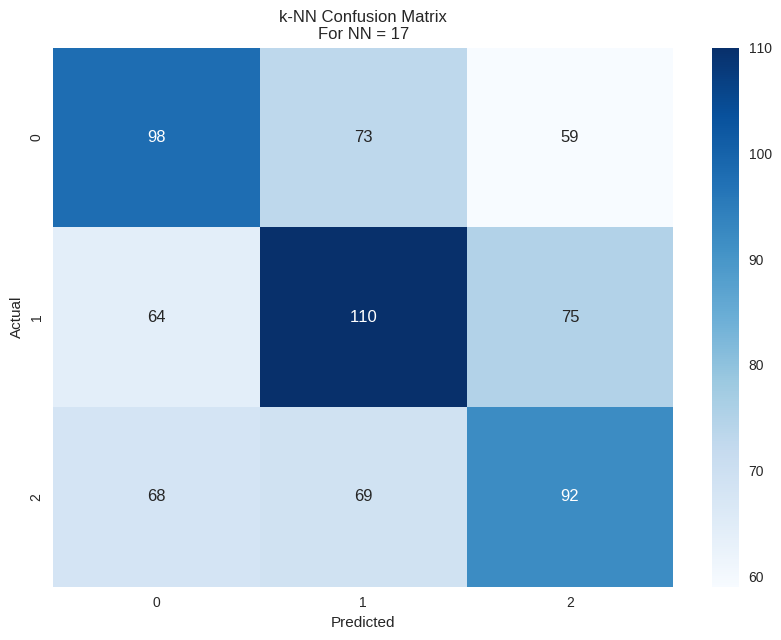

 K Neighbors Classifier
 For NN =  19
 Confusion Matrix - 
 [[101  68  61]
 [ 60 116  73]
 [ 64  70  95]]
 Train accuracy score:  0.545968882602546
 Test accuracy score:  0.4406779661016949
 F1 Score =  0.4406169612979601
 Mean Squared Error =  1.0889830508474576
 Classification Report
               precision    recall  f1-score   support

           0       0.45      0.44      0.44       230
           1       0.46      0.47      0.46       249
           2       0.41      0.41      0.41       229

    accuracy                           0.44       708
   macro avg       0.44      0.44      0.44       708
weighted avg       0.44      0.44      0.44       708





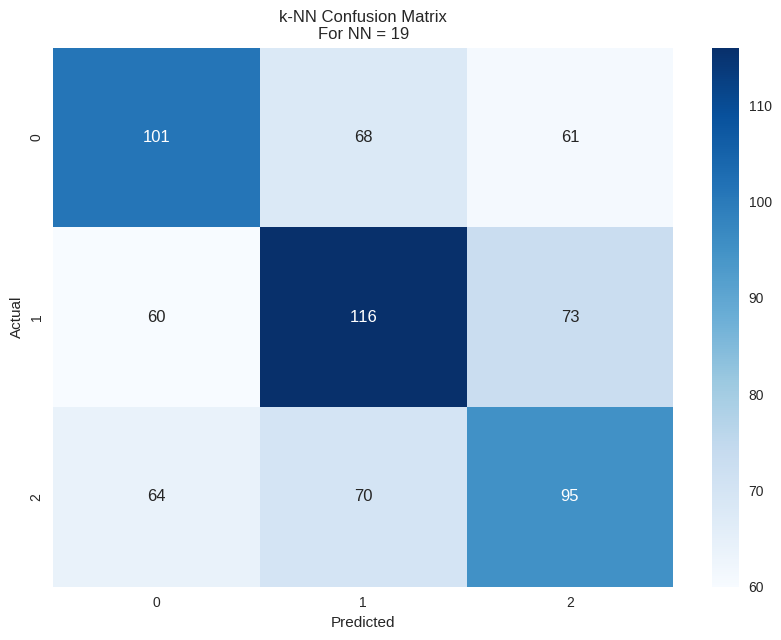

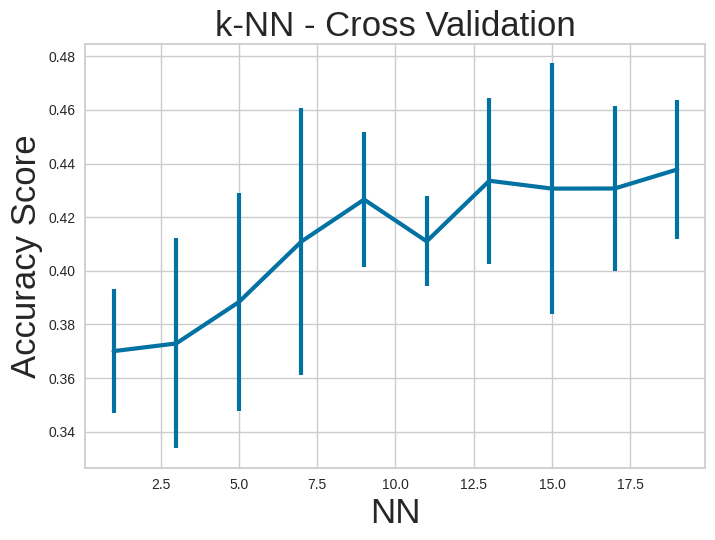

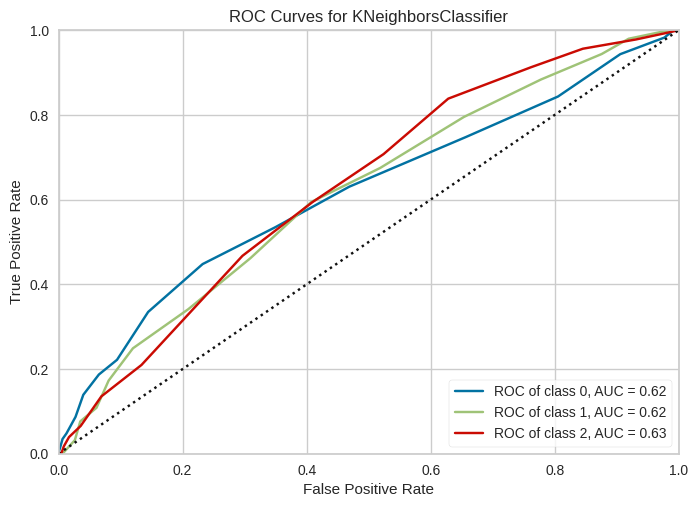

In [ ]:
evaluate_knn(X, y, nn_range, 3)

 Decision Tree Classifier
 For Depth =  3
 Confusion Matrix - 
 [[ 94 101  35]
 [ 34 178  37]
 [ 33 111  85]]
 Train accuracy score:  0.5611739745403111
 Test accuracy score:  0.5042372881355932
 F1 Score =  0.49458497495585596
 Mean Squared Error =  0.7838983050847458
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.41      0.48       230
           1       0.46      0.71      0.56       249
           2       0.54      0.37      0.44       229

    accuracy                           0.50       708
   macro avg       0.53      0.50      0.49       708
weighted avg       0.53      0.50      0.49       708





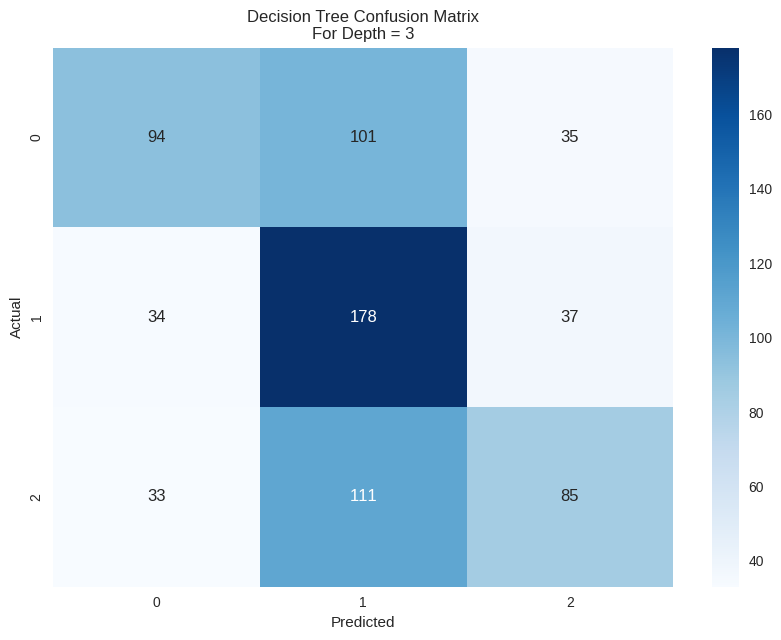

 Decision Tree Classifier
 For Depth =  5
 Confusion Matrix - 
 [[127  79  24]
 [ 49 168  32]
 [ 52 102  75]]
 Train accuracy score:  0.6368458274398868
 Test accuracy score:  0.5225988700564972
 F1 Score =  0.5125389919979594
 Mean Squared Error =  0.7994350282485876
 Classification Report
               precision    recall  f1-score   support

           0       0.56      0.55      0.55       230
           1       0.48      0.67      0.56       249
           2       0.57      0.33      0.42       229

    accuracy                           0.52       708
   macro avg       0.54      0.52      0.51       708
weighted avg       0.54      0.52      0.51       708





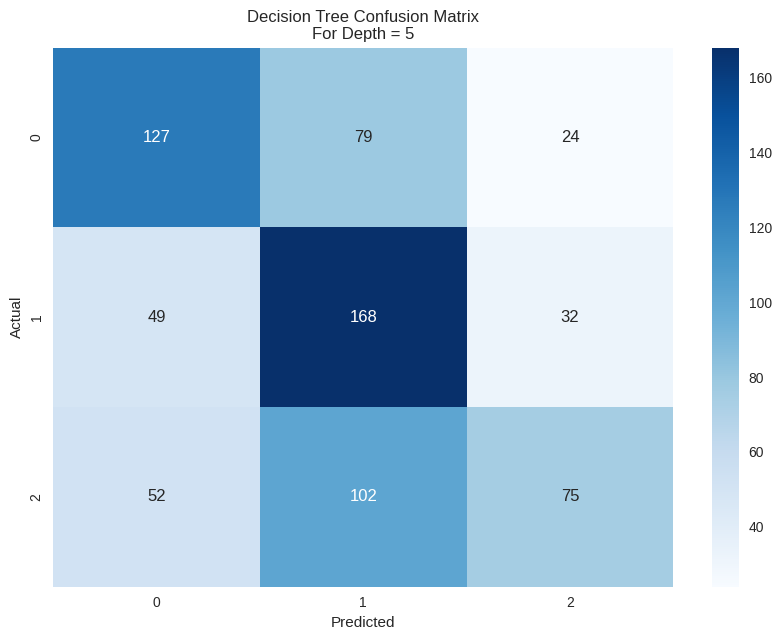

 Decision Tree Classifier
 For Depth =  7
 Confusion Matrix - 
 [[118  83  29]
 [ 48 165  36]
 [ 51  97  81]]
 Train accuracy score:  0.7001414427157001
 Test accuracy score:  0.5141242937853108
 F1 Score =  0.5066286732643234
 Mean Squared Error =  0.8248587570621468
 Classification Report
               precision    recall  f1-score   support

           0       0.54      0.51      0.53       230
           1       0.48      0.66      0.56       249
           2       0.55      0.35      0.43       229

    accuracy                           0.51       708
   macro avg       0.53      0.51      0.51       708
weighted avg       0.52      0.51      0.51       708





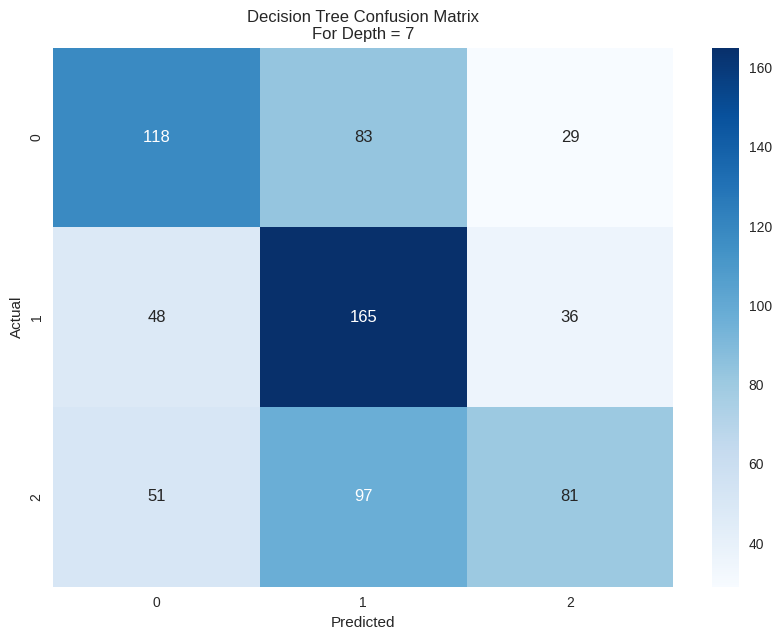

 Decision Tree Classifier
 For Depth =  9
 Confusion Matrix - 
 [[129  70  31]
 [ 54 142  53]
 [ 51  84  94]]
 Train accuracy score:  0.8083451202263083
 Test accuracy score:  0.5155367231638418
 F1 Score =  0.5133063972510162
 Mean Squared Error =  0.8319209039548022
 Classification Report
               precision    recall  f1-score   support

           0       0.55      0.56      0.56       230
           1       0.48      0.57      0.52       249
           2       0.53      0.41      0.46       229

    accuracy                           0.52       708
   macro avg       0.52      0.51      0.51       708
weighted avg       0.52      0.52      0.51       708





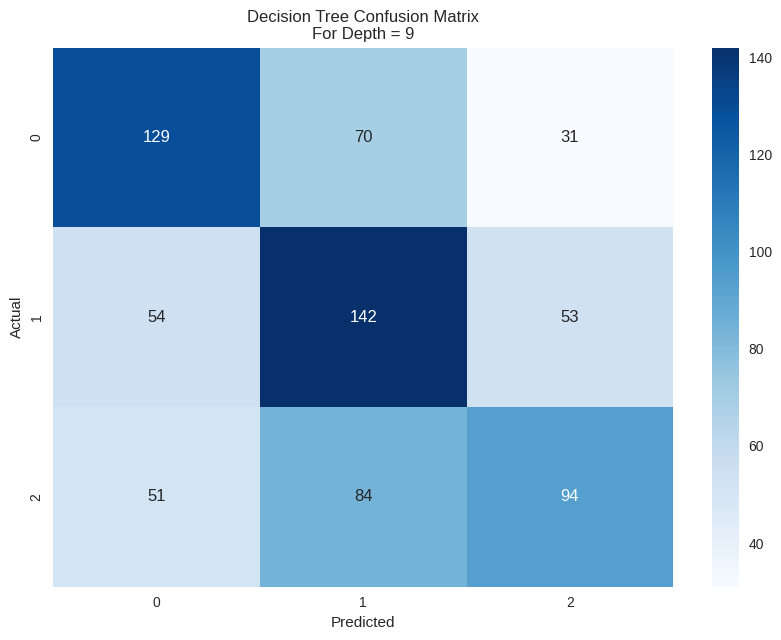

 Decision Tree Classifier
 For Depth =  11
 Confusion Matrix - 
 [[121  66  43]
 [ 53 138  58]
 [ 57  82  90]]
 Train accuracy score:  0.9041725601131542
 Test accuracy score:  0.4929378531073446
 F1 Score =  0.49058821896070587
 Mean Squared Error =  0.9307909604519774
 Classification Report
               precision    recall  f1-score   support

           0       0.52      0.53      0.52       230
           1       0.48      0.55      0.52       249
           2       0.47      0.39      0.43       229

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





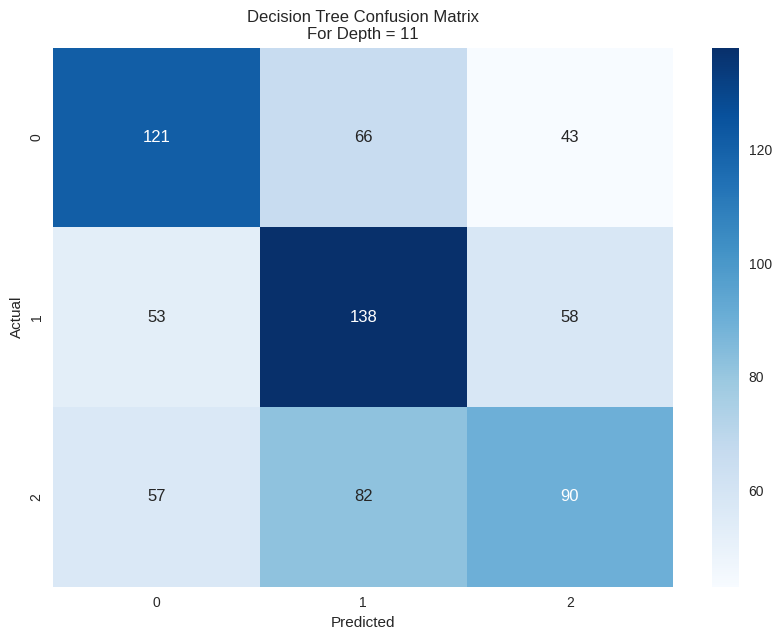

 Decision Tree Classifier
 For Depth =  13
 Confusion Matrix - 
 [[112  74  44]
 [ 60 135  54]
 [ 50  74 105]]
 Train accuracy score:  0.9550919377652051
 Test accuracy score:  0.4971751412429379
 F1 Score =  0.4967145844357741
 Mean Squared Error =  0.9011299435028248
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.49      0.50       230
           1       0.48      0.54      0.51       249
           2       0.52      0.46      0.49       229

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.50      0.50      0.50       708





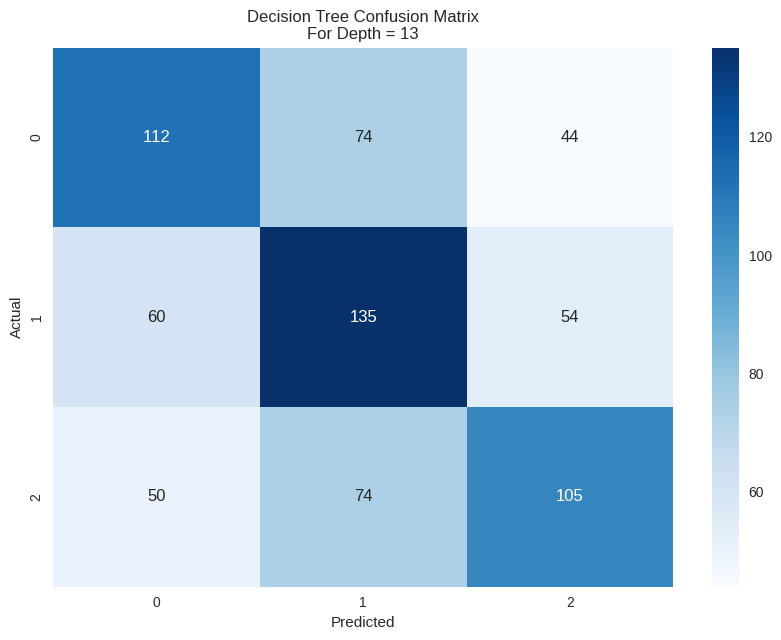

 Decision Tree Classifier
 For Depth =  15
 Confusion Matrix - 
 [[119  68  43]
 [ 63 130  56]
 [ 53  73 103]]
 Train accuracy score:  0.9805516265912305
 Test accuracy score:  0.4971751412429379
 F1 Score =  0.4967130879977718
 Mean Squared Error =  0.9096045197740112
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.52      0.51       230
           1       0.48      0.52      0.50       249
           2       0.51      0.45      0.48       229

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.50      0.50      0.50       708





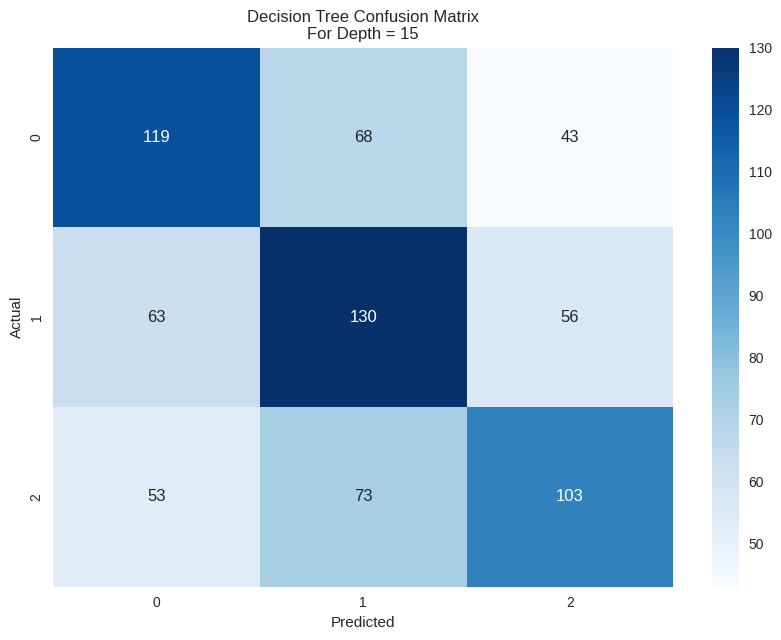

 Decision Tree Classifier
 For Depth =  17
 Confusion Matrix - 
 [[124  62  44]
 [ 64 125  60]
 [ 55  71 103]]
 Train accuracy score:  0.9915134370579916
 Test accuracy score:  0.4971751412429379
 F1 Score =  0.4965681906335324
 Mean Squared Error =  0.922316384180791
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.54      0.52       230
           1       0.48      0.50      0.49       249
           2       0.50      0.45      0.47       229

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.50      0.50      0.50       708





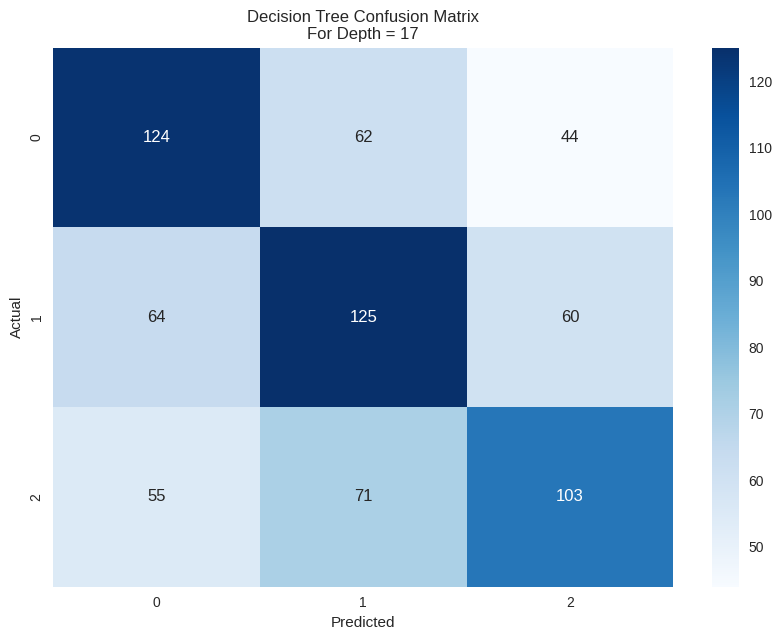

 Decision Tree Classifier
 For Depth =  19
 Confusion Matrix - 
 [[129  60  41]
 [ 68 121  60]
 [ 60  68 101]]
 Train accuracy score:  0.9957567185289957
 Test accuracy score:  0.4957627118644068
 F1 Score =  0.49459773369068905
 Mean Squared Error =  0.9322033898305084
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.56      0.53       230
           1       0.49      0.49      0.49       249
           2       0.50      0.44      0.47       229

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.49       708
weighted avg       0.50      0.50      0.49       708





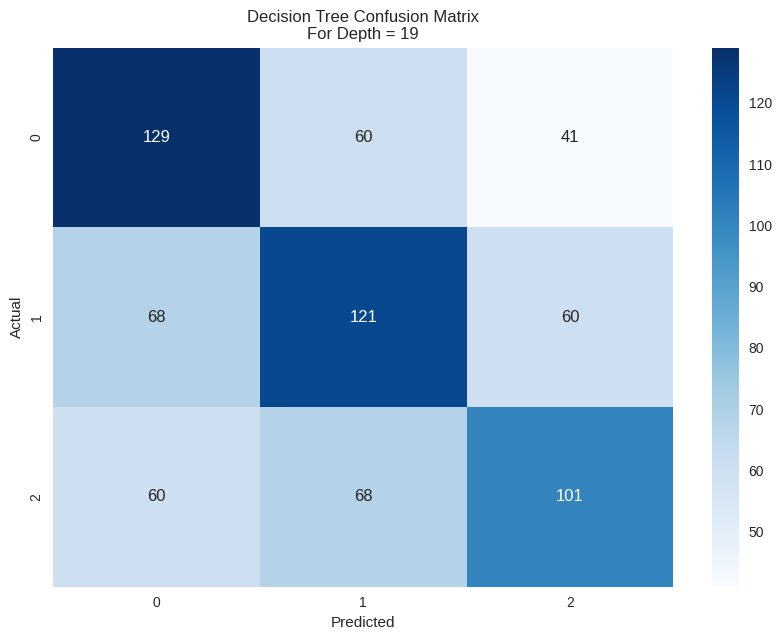

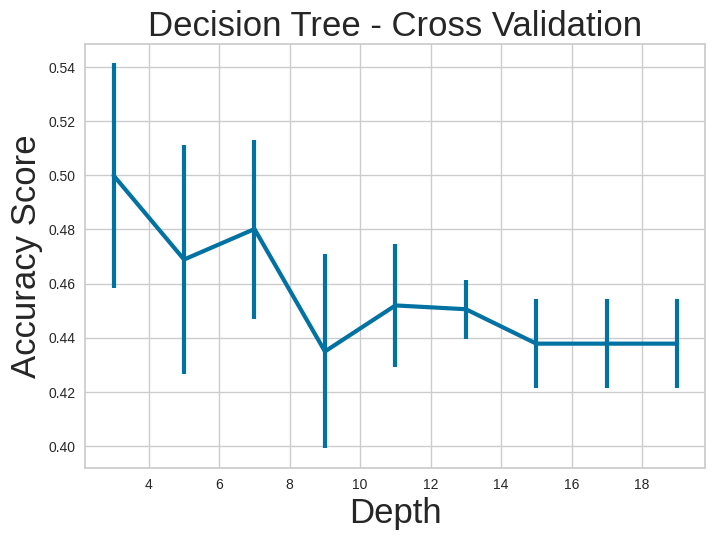

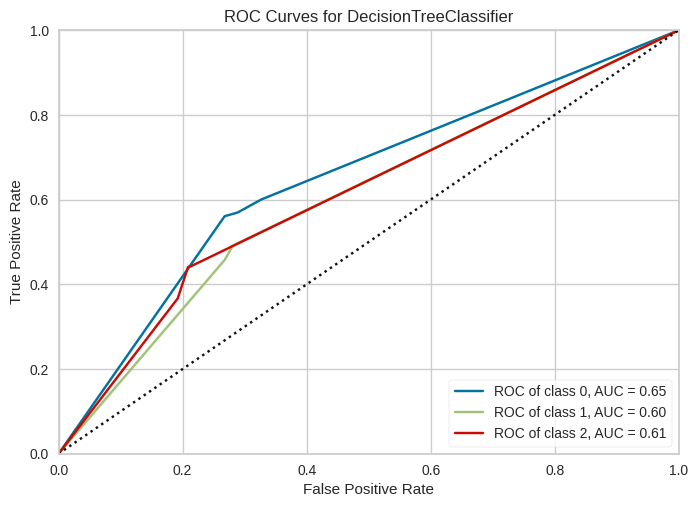

In [ ]:
evaluate_decision_tree(X, y, depth_range, 3)

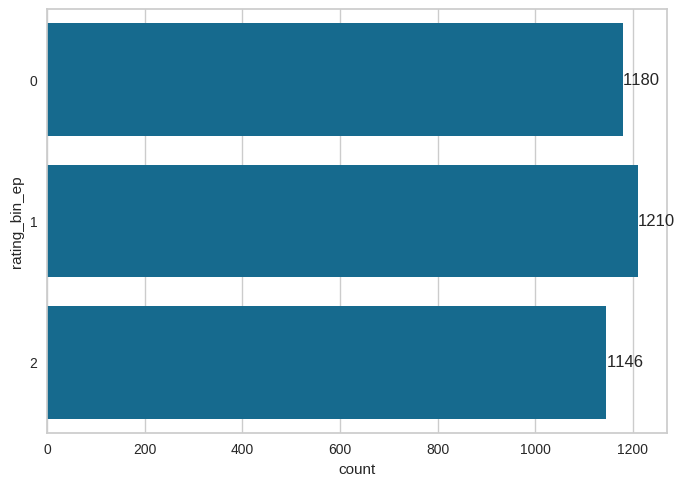

In [37]:
X,y = bin_column(listings, 'review_scores_location', 3)
check_bins(y)

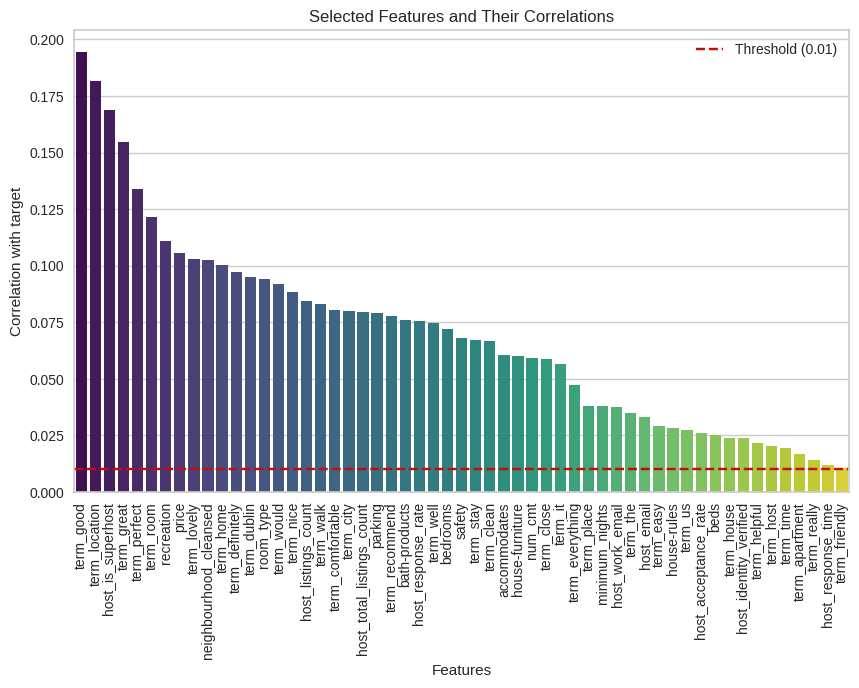

(Index(['term_good', 'term_location', 'host_is_superhost', 'term_great',
        'term_perfect', 'term_room', 'recreation', 'price', 'term_lovely',
        'neighbourhood_cleansed', 'term_home', 'term_definitely', 'term_dublin',
        'room_type', 'term_would', 'term_nice', 'host_listings_count',
        'term_walk', 'term_comfortable', 'term_city',
        'host_total_listings_count', 'parking', 'term_recommend',
        'bath-products', 'host_response_rate', 'term_well', 'bedrooms',
        'safety', 'term_stay', 'term_clean', 'accommodates', 'house-furniture',
        'num_cmt', 'term_close', 'term_it', 'term_everything', 'term_place',
        'minimum_nights', 'host_work_email', 'term_the', 'host_email',
        'term_easy', 'house-rules', 'term_us', 'host_acceptance_rate', 'beds',
        'term_house', 'host_identity_verified', 'term_helpful', 'term_host',
        'term_time', 'term_apartment', 'term_really', 'host_response_time',
        'term_friendly'],
       dtype='object')

In [38]:
yy = listings['review_scores_location']
select_important_features(X, yy, threshold=0.01)

 Logistic Regression
 For Degree =  1
 For C =  0.001
 Confusion Matrix - 
 [[134  56  39]
 [ 87  94  62]
 [ 88  51  97]]
 Train accuracy score:  0.4748939179632249
 Test accuracy score:  0.4590395480225989
 F1 Score =  0.45545102950829774
 Mean Squared Error =  1.07909604519774
 Classification Report
               precision    recall  f1-score   support

           0       0.43      0.59      0.50       229
           1       0.47      0.39      0.42       243
           2       0.49      0.41      0.45       236

    accuracy                           0.46       708
   macro avg       0.46      0.46      0.46       708
weighted avg       0.46      0.46      0.46       708





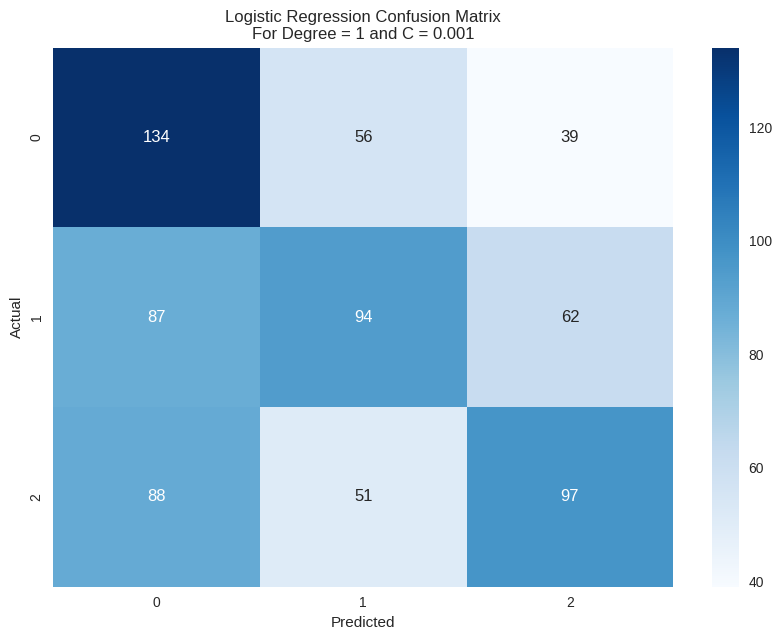

 Logistic Regression
 For Degree =  1
 For C =  0.1
 Confusion Matrix - 
 [[140  61  28]
 [ 76 109  58]
 [ 61  69 106]]
 Train accuracy score:  0.5265205091937766
 Test accuracy score:  0.501412429378531
 F1 Score =  0.4993236273530618
 Mean Squared Error =  0.8757062146892656
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.61      0.55       229
           1       0.46      0.45      0.45       243
           2       0.55      0.45      0.50       236

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.50      0.50      0.50       708





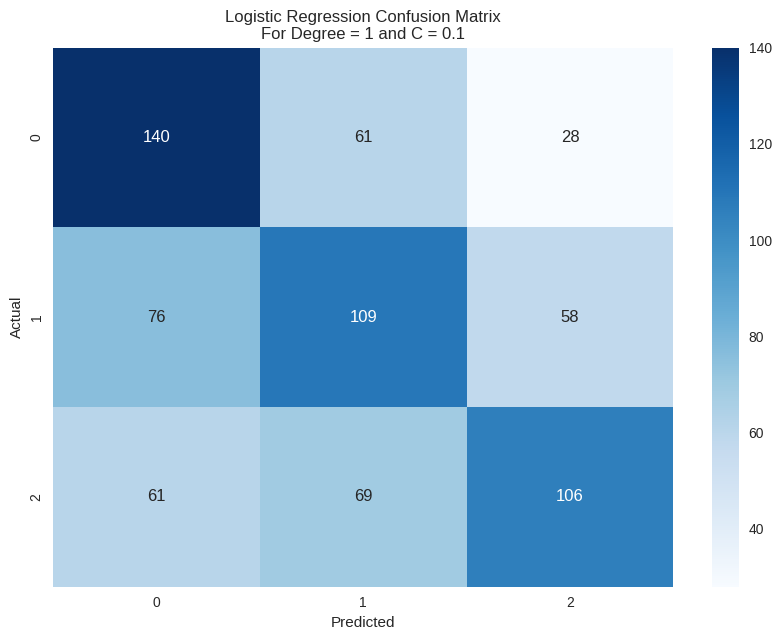

 Logistic Regression
 For Degree =  1
 For C =  1
 Confusion Matrix - 
 [[138  59  32]
 [ 69 110  64]
 [ 49  74 113]]
 Train accuracy score:  0.5618811881188119
 Test accuracy score:  0.5098870056497176
 F1 Score =  0.508719923091069
 Mean Squared Error =  0.8333333333333334
 Classification Report
               precision    recall  f1-score   support

           0       0.54      0.60      0.57       229
           1       0.45      0.45      0.45       243
           2       0.54      0.48      0.51       236

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





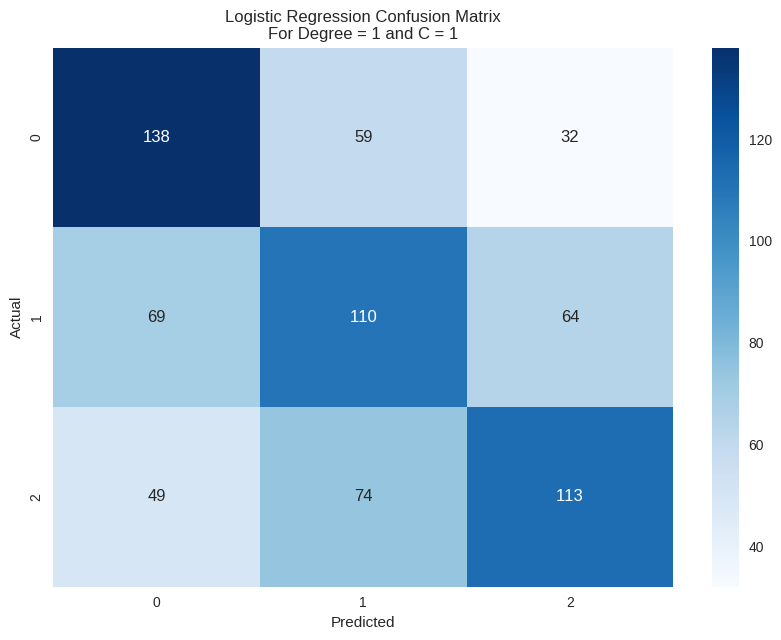

 Logistic Regression
 For Degree =  1
 For C =  10
 Confusion Matrix - 
 [[138  60  31]
 [ 66 113  64]
 [ 42  81 113]]
 Train accuracy score:  0.5703677510608204
 Test accuracy score:  0.5141242937853108
 F1 Score =  0.5136810349173556
 Mean Squared Error =  0.7951977401129944
 Classification Report
               precision    recall  f1-score   support

           0       0.56      0.60      0.58       229
           1       0.44      0.47      0.45       243
           2       0.54      0.48      0.51       236

    accuracy                           0.51       708
   macro avg       0.52      0.52      0.51       708
weighted avg       0.52      0.51      0.51       708





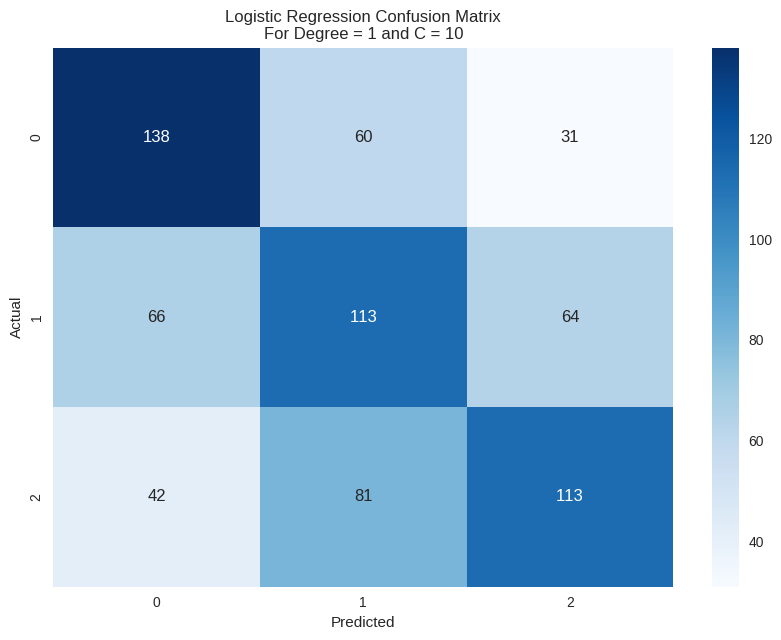

 Logistic Regression
 For Degree =  1
 For C =  100
 Confusion Matrix - 
 [[139  59  31]
 [ 66 113  64]
 [ 42  83 111]]
 Train accuracy score:  0.5710749646393211
 Test accuracy score:  0.5127118644067796
 F1 Score =  0.512082969723602
 Mean Squared Error =  0.7966101694915254
 Classification Report
               precision    recall  f1-score   support

           0       0.56      0.61      0.58       229
           1       0.44      0.47      0.45       243
           2       0.54      0.47      0.50       236

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





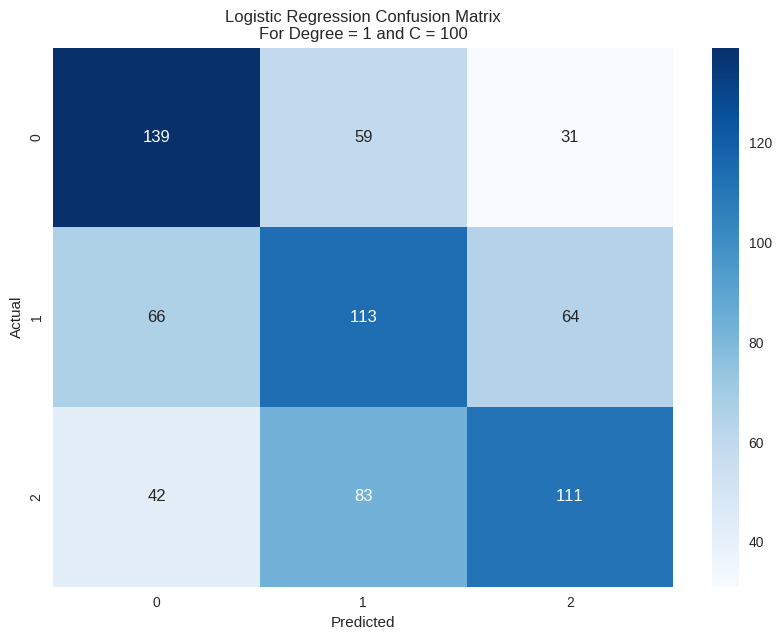

 Logistic Regression
 For Degree =  1
 For C =  1000
 Confusion Matrix - 
 [[139  59  31]
 [ 66 113  64]
 [ 42  84 110]]
 Train accuracy score:  0.5710749646393211
 Test accuracy score:  0.5112994350282486
 F1 Score =  0.5106387514227335
 Mean Squared Error =  0.7980225988700564
 Classification Report
               precision    recall  f1-score   support

           0       0.56      0.61      0.58       229
           1       0.44      0.47      0.45       243
           2       0.54      0.47      0.50       236

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





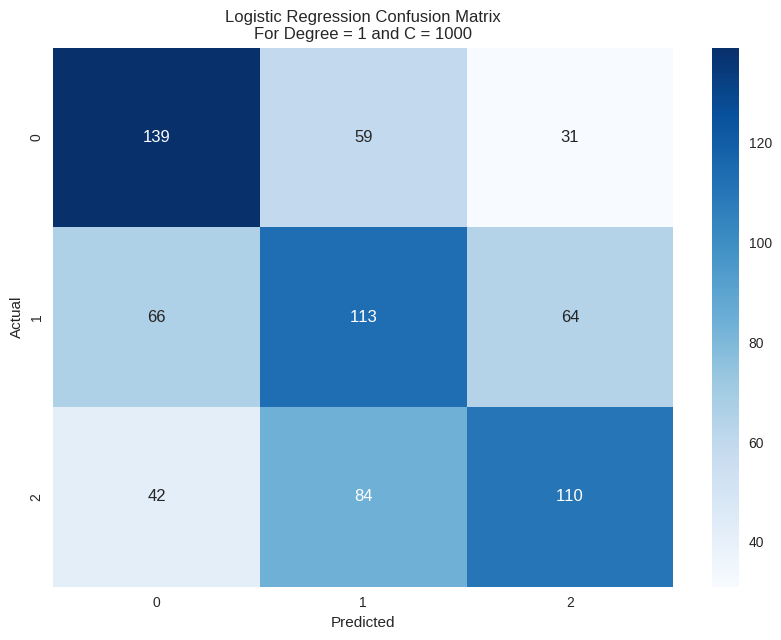

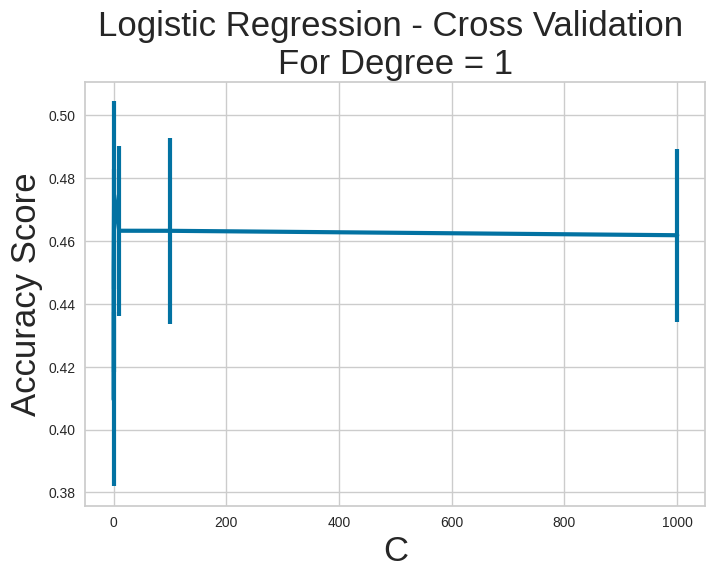

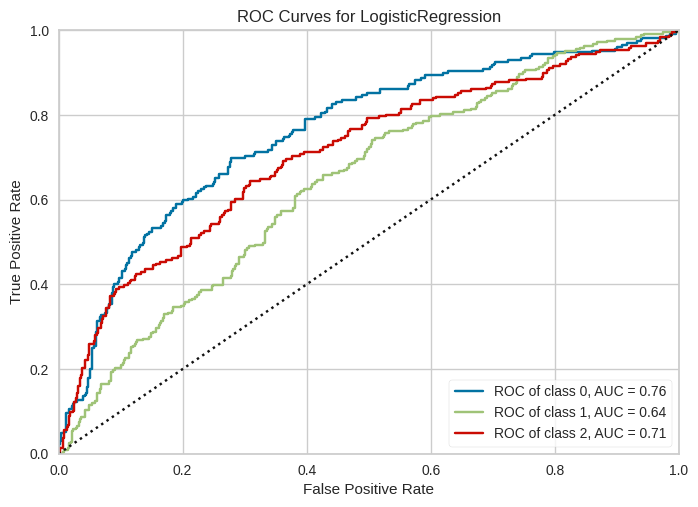

 Logistic Regression
 For Degree =  2
 For C =  0.001
 Confusion Matrix - 
 [[128  68  33]
 [ 63 122  58]
 [ 47  69 120]]
 Train accuracy score:  0.6128005657708628
 Test accuracy score:  0.5225988700564972
 F1 Score =  0.5231019120889719
 Mean Squared Error =  0.8163841807909604
 Classification Report
               precision    recall  f1-score   support

           0       0.54      0.56      0.55       229
           1       0.47      0.50      0.49       243
           2       0.57      0.51      0.54       236

    accuracy                           0.52       708
   macro avg       0.53      0.52      0.52       708
weighted avg       0.53      0.52      0.52       708





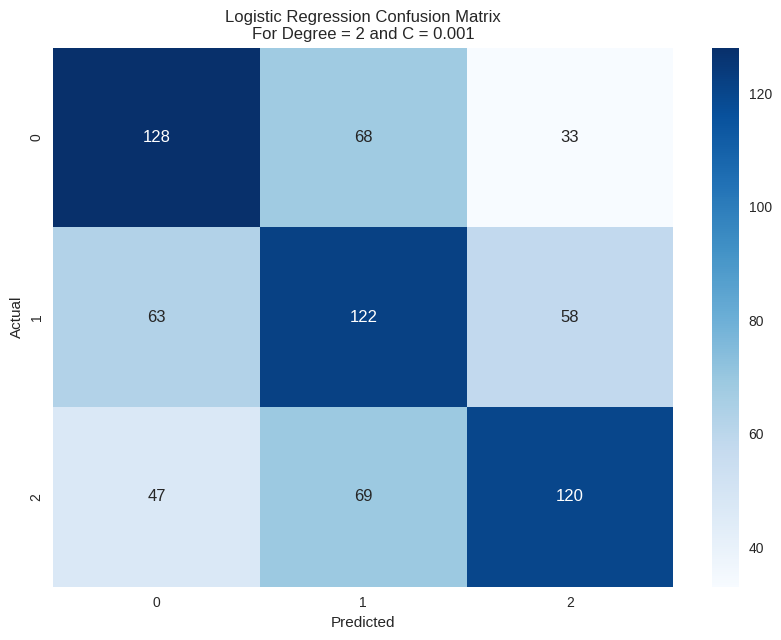

 Logistic Regression
 For Degree =  2
 For C =  0.1
 Confusion Matrix - 
 [[127  70  32]
 [ 61 125  57]
 [ 46  69 121]]
 Train accuracy score:  0.6145685997171145
 Test accuracy score:  0.5268361581920904
 F1 Score =  0.527549161843949
 Mean Squared Error =  0.8036723163841808
 Classification Report
               precision    recall  f1-score   support

           0       0.54      0.55      0.55       229
           1       0.47      0.51      0.49       243
           2       0.58      0.51      0.54       236

    accuracy                           0.53       708
   macro avg       0.53      0.53      0.53       708
weighted avg       0.53      0.53      0.53       708





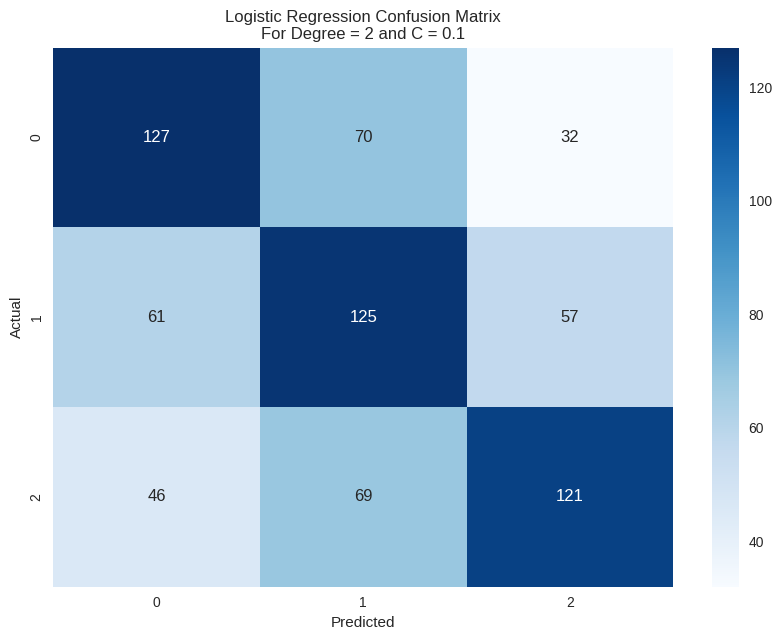

 Logistic Regression
 For Degree =  2
 For C =  1
 Confusion Matrix - 
 [[129  68  32]
 [ 62 124  57]
 [ 46  70 120]]
 Train accuracy score:  0.6142149929278642
 Test accuracy score:  0.5268361581920904
 F1 Score =  0.5274024859704419
 Mean Squared Error =  0.8036723163841808
 Classification Report
               precision    recall  f1-score   support

           0       0.54      0.56      0.55       229
           1       0.47      0.51      0.49       243
           2       0.57      0.51      0.54       236

    accuracy                           0.53       708
   macro avg       0.53      0.53      0.53       708
weighted avg       0.53      0.53      0.53       708





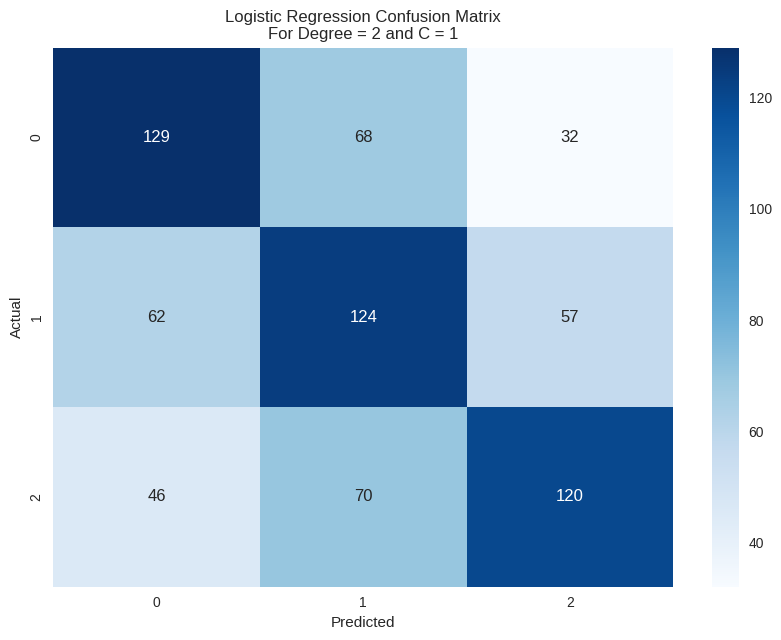

 Logistic Regression
 For Degree =  2
 For C =  10
 Confusion Matrix - 
 [[130  66  33]
 [ 62 126  55]
 [ 44  70 122]]
 Train accuracy score:  0.6092644978783592
 Test accuracy score:  0.5338983050847458
 F1 Score =  0.5344837914076279
 Mean Squared Error =  0.7923728813559322
 Classification Report
               precision    recall  f1-score   support

           0       0.55      0.57      0.56       229
           1       0.48      0.52      0.50       243
           2       0.58      0.52      0.55       236

    accuracy                           0.53       708
   macro avg       0.54      0.53      0.54       708
weighted avg       0.54      0.53      0.53       708





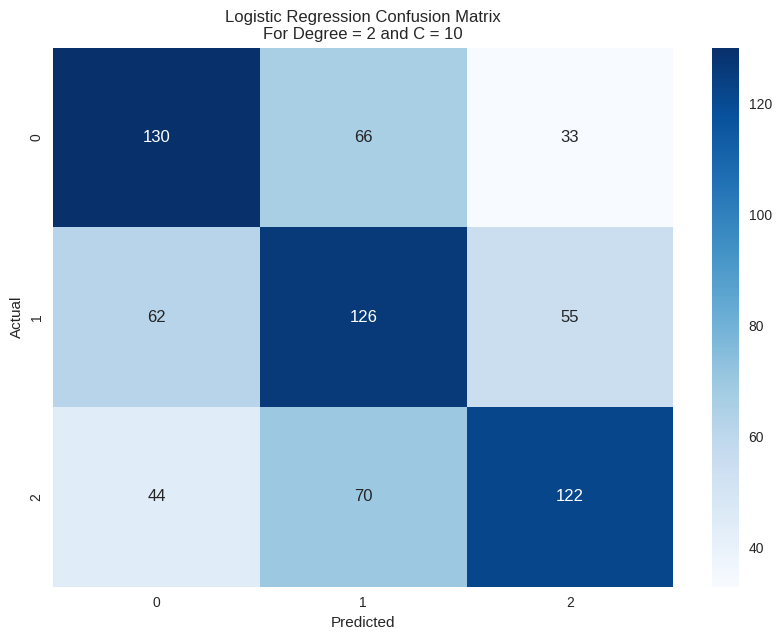

 Logistic Regression
 For Degree =  2
 For C =  100
 Confusion Matrix - 
 [[129  68  32]
 [ 61 127  55]
 [ 47  69 120]]
 Train accuracy score:  0.6212871287128713
 Test accuracy score:  0.5310734463276836
 F1 Score =  0.5316109931776508
 Mean Squared Error =  0.8036723163841808
 Classification Report
               precision    recall  f1-score   support

           0       0.54      0.56      0.55       229
           1       0.48      0.52      0.50       243
           2       0.58      0.51      0.54       236

    accuracy                           0.53       708
   macro avg       0.54      0.53      0.53       708
weighted avg       0.53      0.53      0.53       708





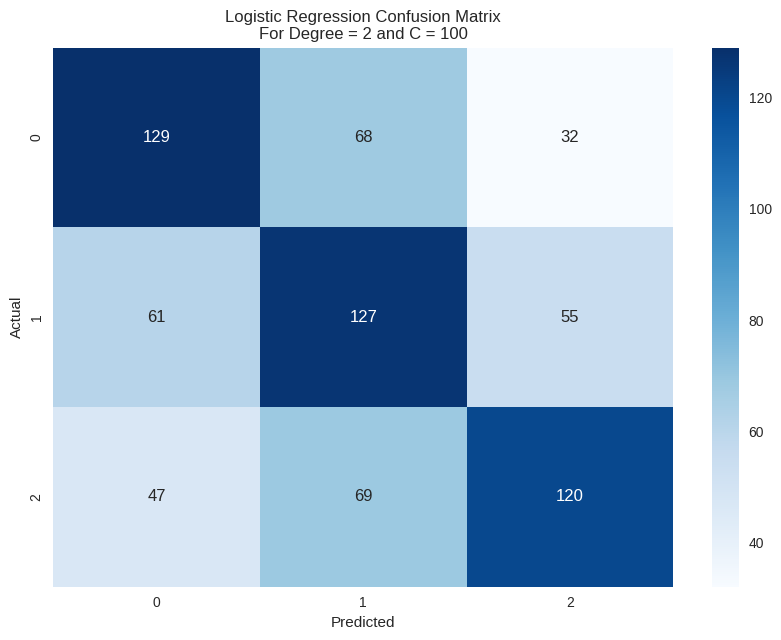

 Logistic Regression
 For Degree =  2
 For C =  1000
 Confusion Matrix - 
 [[128  69  32]
 [ 60 125  58]
 [ 46  69 121]]
 Train accuracy score:  0.611032531824611
 Test accuracy score:  0.5282485875706214
 F1 Score =  0.5288761821021314
 Mean Squared Error =  0.8022598870056498
 Classification Report
               precision    recall  f1-score   support

           0       0.55      0.56      0.55       229
           1       0.48      0.51      0.49       243
           2       0.57      0.51      0.54       236

    accuracy                           0.53       708
   macro avg       0.53      0.53      0.53       708
weighted avg       0.53      0.53      0.53       708





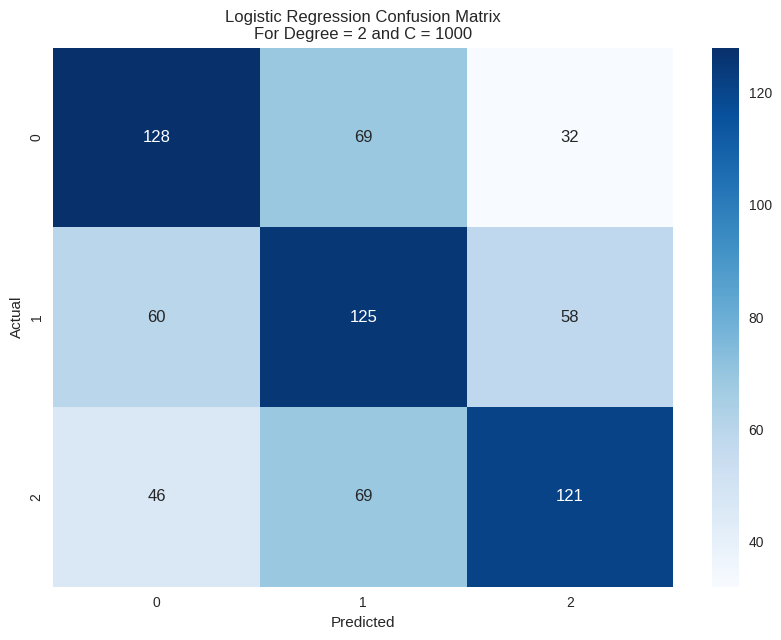

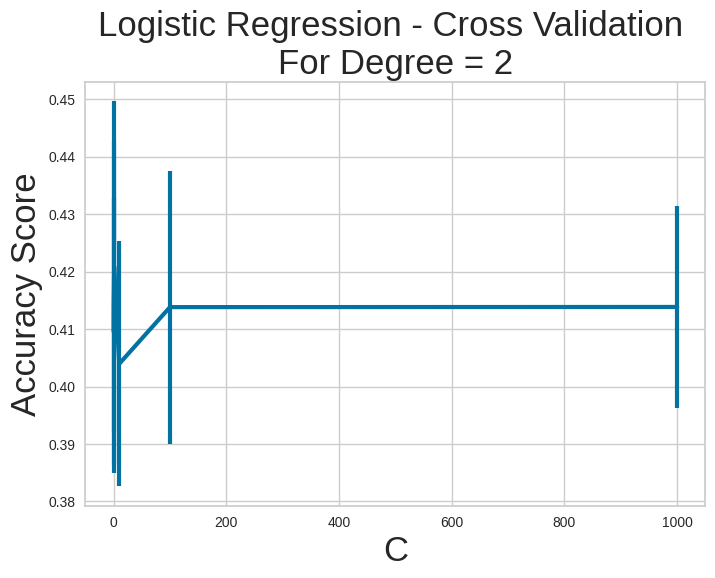

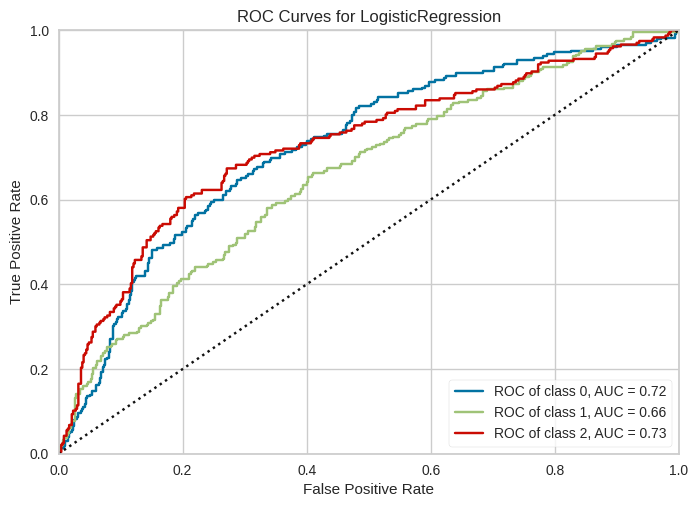

In [ ]:
evaluate_logistic_regression(X, y, c_range, degree_range, 3)

 K Neighbors Classifier
 For NN =  1
 Confusion Matrix - 
 [[105  69  55]
 [ 78  97  68]
 [ 71  60 105]]
 Train accuracy score:  1.0
 Test accuracy score:  0.4336158192090395
 F1 Score =  0.43346264645495186
 Mean Squared Error =  1.1002824858757063
 Classification Report
               precision    recall  f1-score   support

           0       0.41      0.46      0.43       229
           1       0.43      0.40      0.41       243
           2       0.46      0.44      0.45       236

    accuracy                           0.43       708
   macro avg       0.43      0.43      0.43       708
weighted avg       0.43      0.43      0.43       708





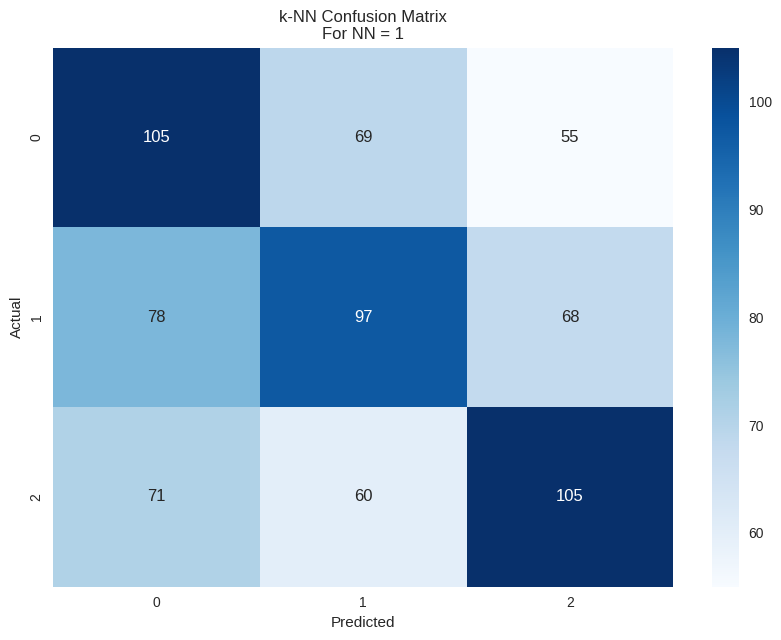

 K Neighbors Classifier
 For NN =  3
 Confusion Matrix - 
 [[122  62  45]
 [103  85  55]
 [101  50  85]]
 Train accuracy score:  0.698019801980198
 Test accuracy score:  0.4124293785310734
 F1 Score =  0.40940784354216864
 Mean Squared Error =  1.2062146892655368
 Classification Report
               precision    recall  f1-score   support

           0       0.37      0.53      0.44       229
           1       0.43      0.35      0.39       243
           2       0.46      0.36      0.40       236

    accuracy                           0.41       708
   macro avg       0.42      0.41      0.41       708
weighted avg       0.42      0.41      0.41       708





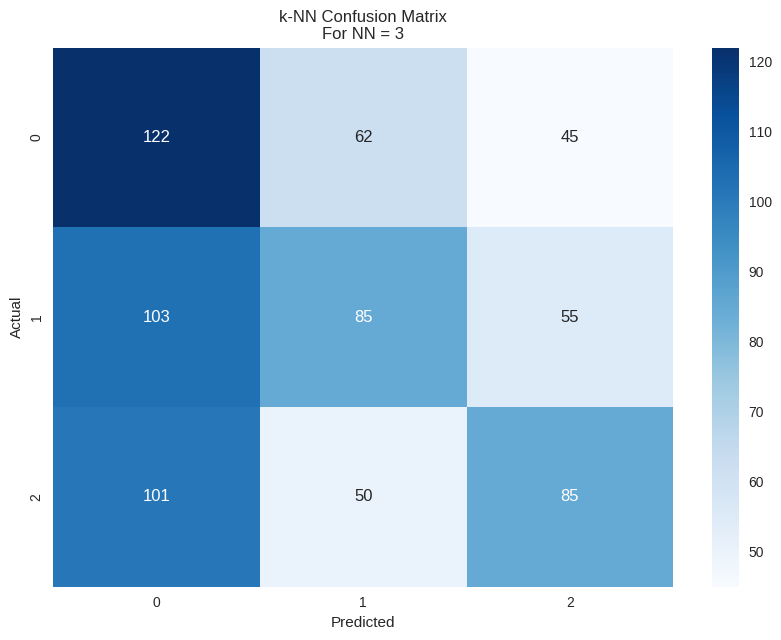

 K Neighbors Classifier
 For NN =  5
 Confusion Matrix - 
 [[123  69  37]
 [ 98  97  48]
 [101  68  67]]
 Train accuracy score:  0.6294200848656294
 Test accuracy score:  0.4053672316384181
 F1 Score =  0.3991171013371931
 Mean Squared Error =  1.1793785310734464
 Classification Report
               precision    recall  f1-score   support

           0       0.38      0.54      0.45       229
           1       0.41      0.40      0.41       243
           2       0.44      0.28      0.35       236

    accuracy                           0.41       708
   macro avg       0.41      0.41      0.40       708
weighted avg       0.41      0.41      0.40       708





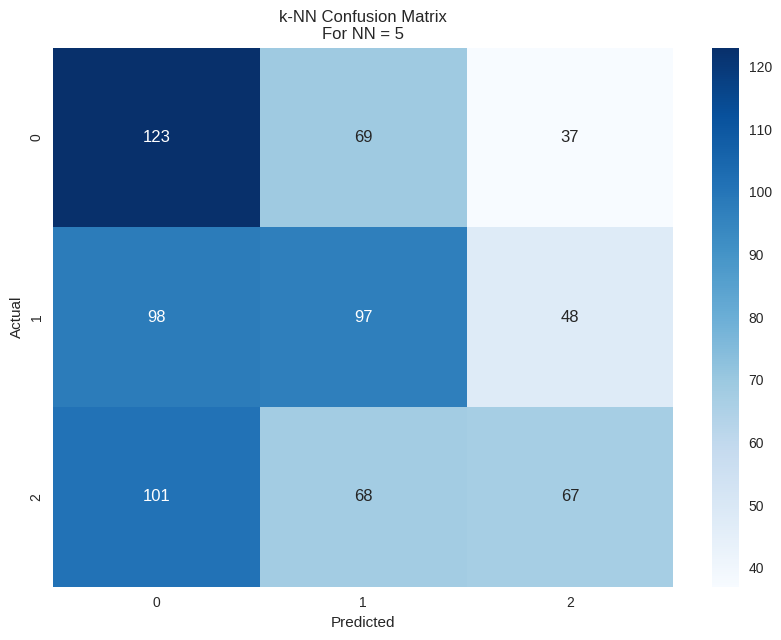

 K Neighbors Classifier
 For NN =  7
 Confusion Matrix - 
 [[116  72  41]
 [ 82 106  55]
 [ 91  59  86]]
 Train accuracy score:  0.6014851485148515
 Test accuracy score:  0.4350282485875706
 F1 Score =  0.4336140599019724
 Mean Squared Error =  1.1242937853107344
 Classification Report
               precision    recall  f1-score   support

           0       0.40      0.51      0.45       229
           1       0.45      0.44      0.44       243
           2       0.47      0.36      0.41       236

    accuracy                           0.44       708
   macro avg       0.44      0.44      0.43       708
weighted avg       0.44      0.44      0.43       708





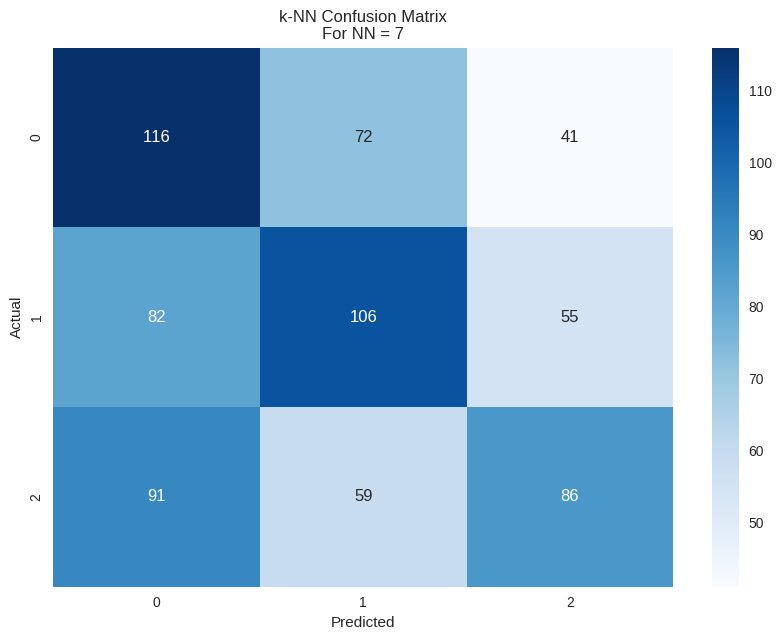

 K Neighbors Classifier
 For NN =  9
 Confusion Matrix - 
 [[115  71  43]
 [ 84 100  59]
 [ 98  45  93]]
 Train accuracy score:  0.5873408769448374
 Test accuracy score:  0.4350282485875706
 F1 Score =  0.4348337578227474
 Mean Squared Error =  1.1624293785310735
 Classification Report
               precision    recall  f1-score   support

           0       0.39      0.50      0.44       229
           1       0.46      0.41      0.44       243
           2       0.48      0.39      0.43       236

    accuracy                           0.44       708
   macro avg       0.44      0.44      0.43       708
weighted avg       0.44      0.44      0.43       708





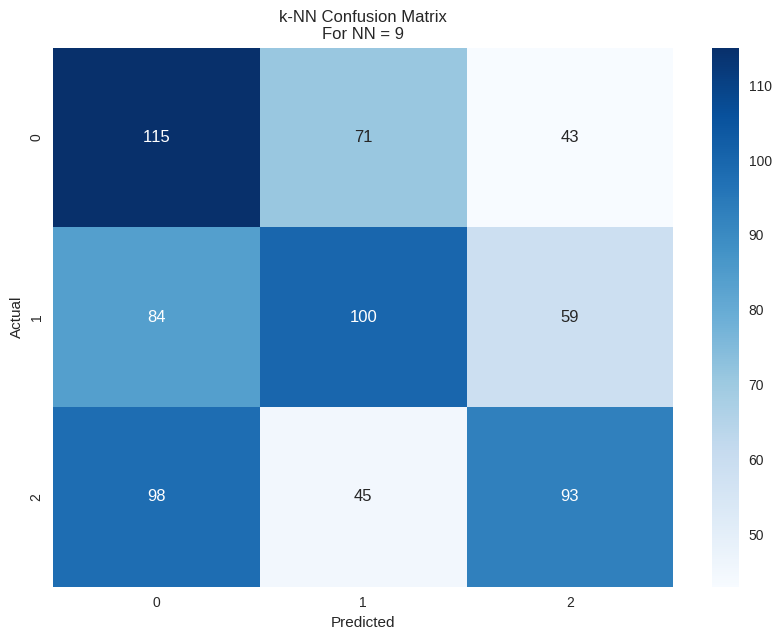

 K Neighbors Classifier
 For NN =  11
 Confusion Matrix - 
 [[106  82  41]
 [ 71 117  55]
 [ 91  53  92]]
 Train accuracy score:  0.5763790664780764
 Test accuracy score:  0.4449152542372881
 F1 Score =  0.4448727601238444
 Mean Squared Error =  1.1144067796610169
 Classification Report
               precision    recall  f1-score   support

           0       0.40      0.46      0.43       229
           1       0.46      0.48      0.47       243
           2       0.49      0.39      0.43       236

    accuracy                           0.44       708
   macro avg       0.45      0.44      0.44       708
weighted avg       0.45      0.44      0.44       708





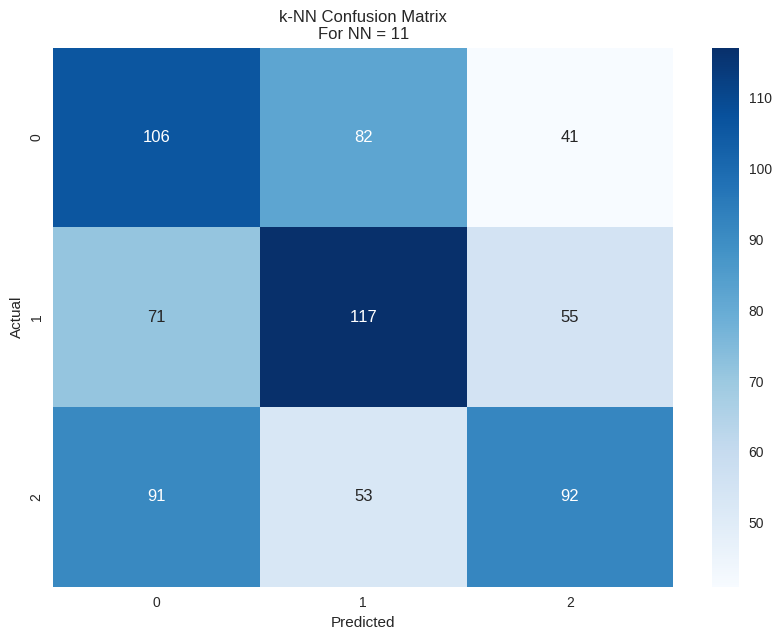

 K Neighbors Classifier
 For NN =  13
 Confusion Matrix - 
 [[ 98  78  53]
 [ 82 103  58]
 [ 93  58  85]]
 Train accuracy score:  0.5562234794908062
 Test accuracy score:  0.403954802259887
 F1 Score =  0.40414618745810704
 Mean Squared Error =  1.2146892655367232
 Classification Report
               precision    recall  f1-score   support

           0       0.36      0.43      0.39       229
           1       0.43      0.42      0.43       243
           2       0.43      0.36      0.39       236

    accuracy                           0.40       708
   macro avg       0.41      0.40      0.40       708
weighted avg       0.41      0.40      0.40       708





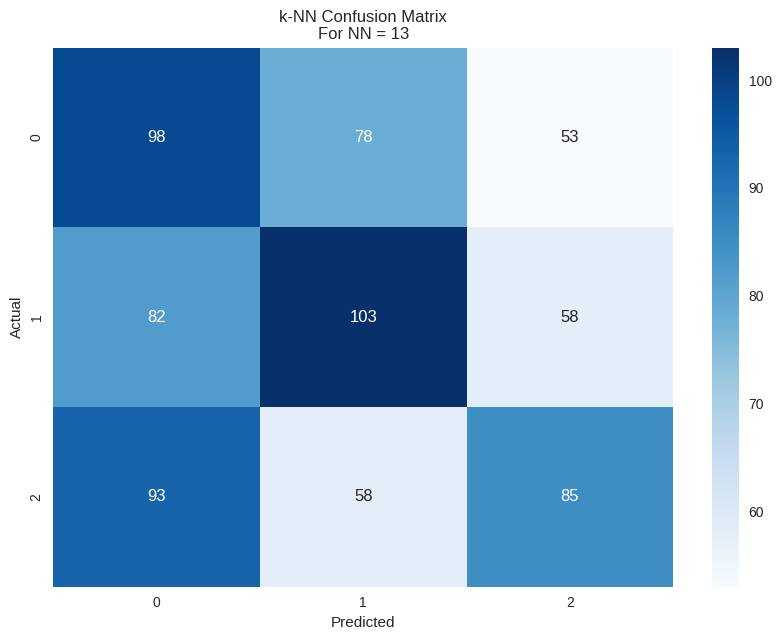

 K Neighbors Classifier
 For NN =  15
 Confusion Matrix - 
 [[102  73  54]
 [ 74 112  57]
 [ 88  59  89]]
 Train accuracy score:  0.5385431400282885
 Test accuracy score:  0.4279661016949153
 F1 Score =  0.42779274728354105
 Mean Squared Error =  1.173728813559322
 Classification Report
               precision    recall  f1-score   support

           0       0.39      0.45      0.41       229
           1       0.46      0.46      0.46       243
           2       0.45      0.38      0.41       236

    accuracy                           0.43       708
   macro avg       0.43      0.43      0.43       708
weighted avg       0.43      0.43      0.43       708





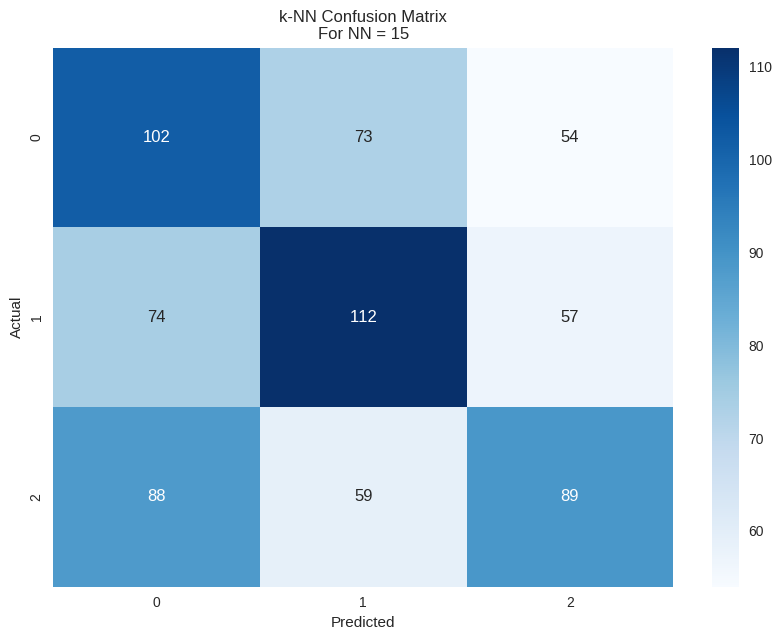

 K Neighbors Classifier
 For NN =  17
 Confusion Matrix - 
 [[103  76  50]
 [ 79 117  47]
 [ 88  62  86]]
 Train accuracy score:  0.5279349363507779
 Test accuracy score:  0.4322033898305085
 F1 Score =  0.43163287946719564
 Mean Squared Error =  1.152542372881356
 Classification Report
               precision    recall  f1-score   support

           0       0.38      0.45      0.41       229
           1       0.46      0.48      0.47       243
           2       0.47      0.36      0.41       236

    accuracy                           0.43       708
   macro avg       0.44      0.43      0.43       708
weighted avg       0.44      0.43      0.43       708





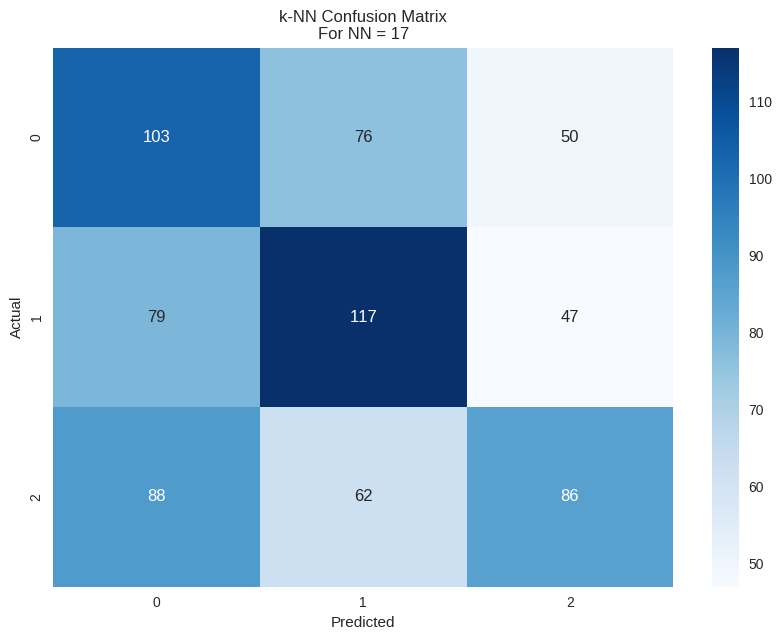

 K Neighbors Classifier
 For NN =  19
 Confusion Matrix - 
 [[102  75  52]
 [ 74 119  50]
 [ 87  64  85]]
 Train accuracy score:  0.5208628005657708
 Test accuracy score:  0.4322033898305085
 F1 Score =  0.4311224307317763
 Mean Squared Error =  1.1567796610169492
 Classification Report
               precision    recall  f1-score   support

           0       0.39      0.45      0.41       229
           1       0.46      0.49      0.48       243
           2       0.45      0.36      0.40       236

    accuracy                           0.43       708
   macro avg       0.43      0.43      0.43       708
weighted avg       0.44      0.43      0.43       708





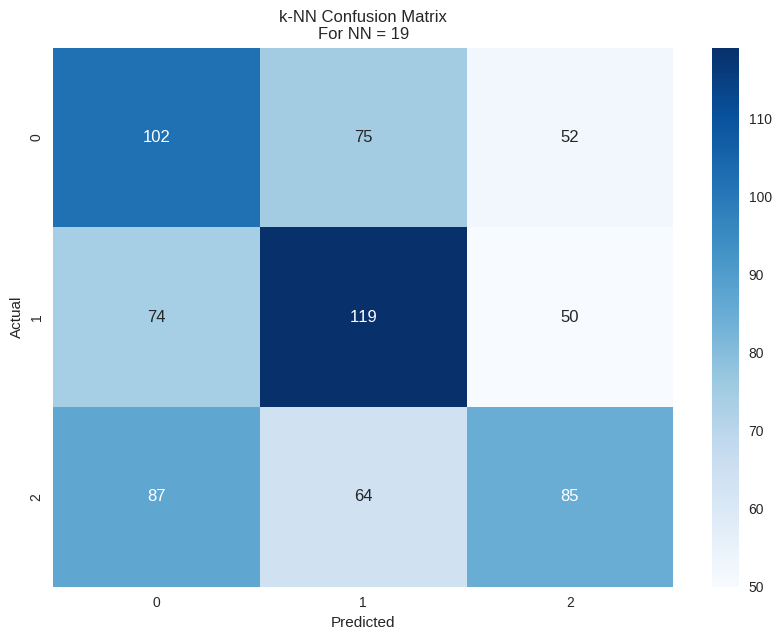

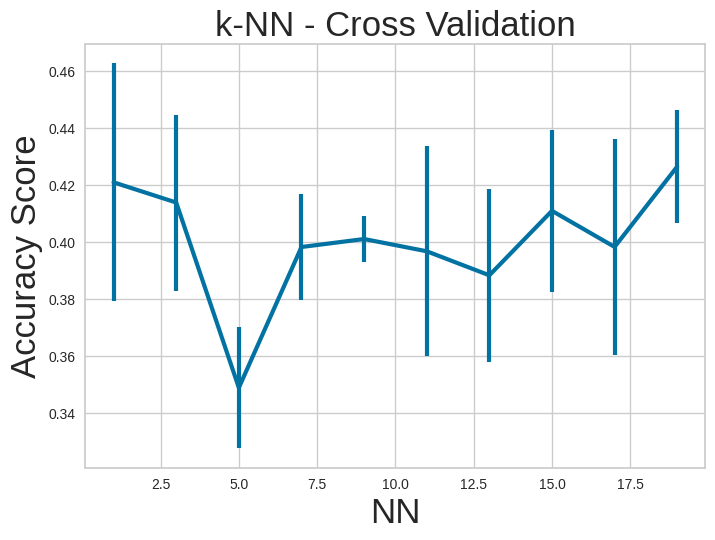

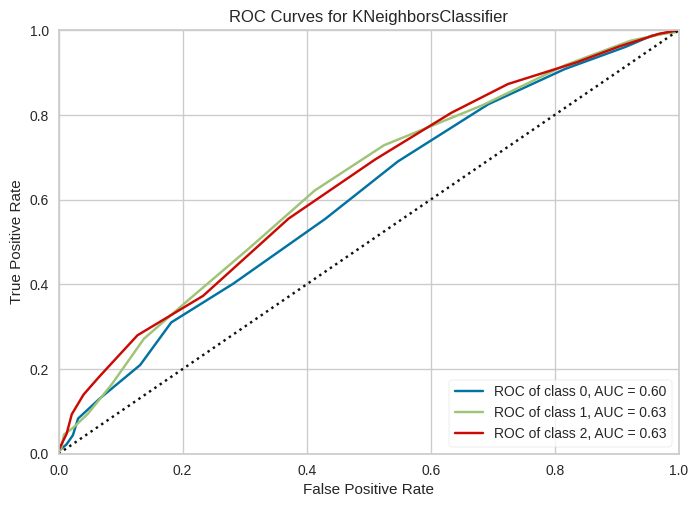

In [ ]:
evaluate_knn(X, y, nn_range, 3)

 Decision Tree Classifier
 For Depth =  3
 Confusion Matrix - 
 [[ 87  94  48]
 [ 38 153  52]
 [ 26  73 137]]
 Train accuracy score:  0.5378359264497878
 Test accuracy score:  0.5324858757062146
 F1 Score =  0.5277441447741748
 Mean Squared Error =  0.7810734463276836
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.38      0.46       229
           1       0.48      0.63      0.54       243
           2       0.58      0.58      0.58       236

    accuracy                           0.53       708
   macro avg       0.54      0.53      0.53       708
weighted avg       0.54      0.53      0.53       708





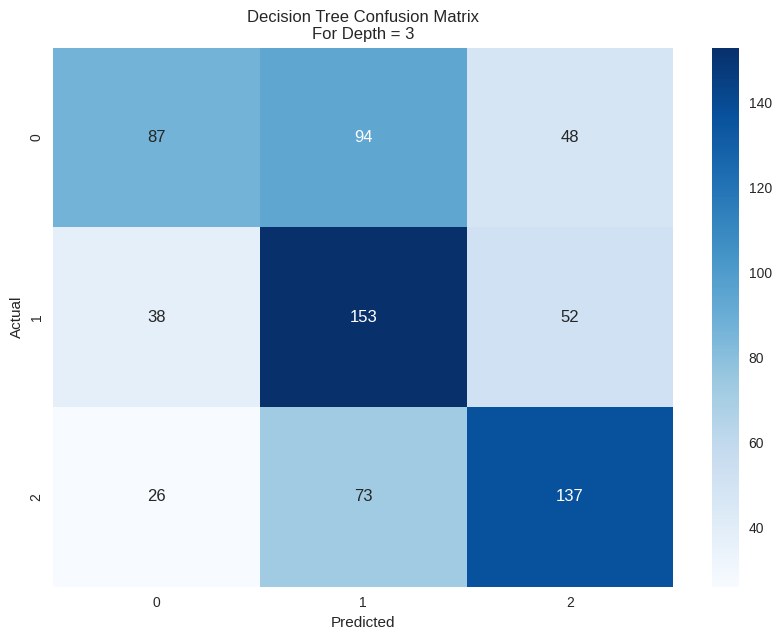

 Decision Tree Classifier
 For Depth =  5
 Confusion Matrix - 
 [[103  97  29]
 [ 60 156  27]
 [ 34  79 123]]
 Train accuracy score:  0.594059405940594
 Test accuracy score:  0.53954802259887
 F1 Score =  0.5402330199844219
 Mean Squared Error =  0.7274011299435028
 Classification Report
               precision    recall  f1-score   support

           0       0.52      0.45      0.48       229
           1       0.47      0.64      0.54       243
           2       0.69      0.52      0.59       236

    accuracy                           0.54       708
   macro avg       0.56      0.54      0.54       708
weighted avg       0.56      0.54      0.54       708





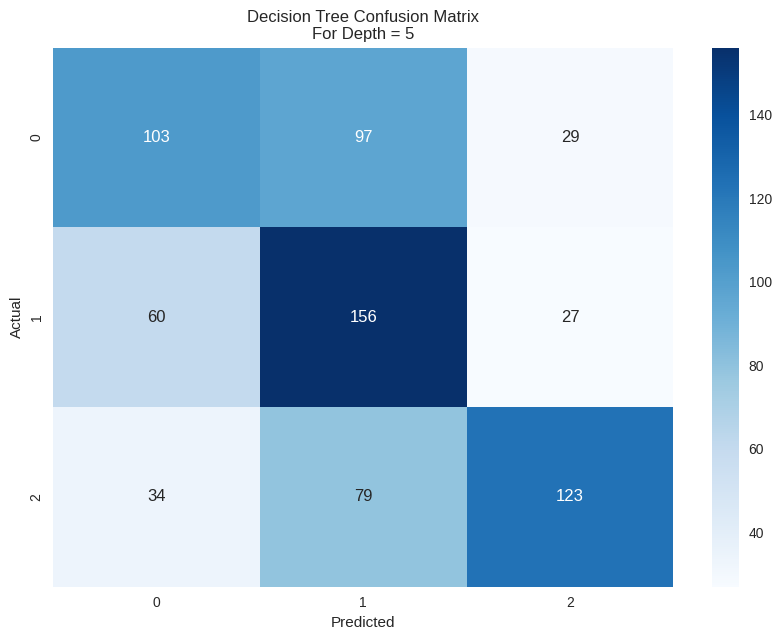

 Decision Tree Classifier
 For Depth =  7
 Confusion Matrix - 
 [[106  84  39]
 [ 66 138  39]
 [ 50  69 117]]
 Train accuracy score:  0.6785714285714286
 Test accuracy score:  0.5098870056497176
 F1 Score =  0.5104105491926181
 Mean Squared Error =  0.867231638418079
 Classification Report
               precision    recall  f1-score   support

           0       0.48      0.46      0.47       229
           1       0.47      0.57      0.52       243
           2       0.60      0.50      0.54       236

    accuracy                           0.51       708
   macro avg       0.52      0.51      0.51       708
weighted avg       0.52      0.51      0.51       708





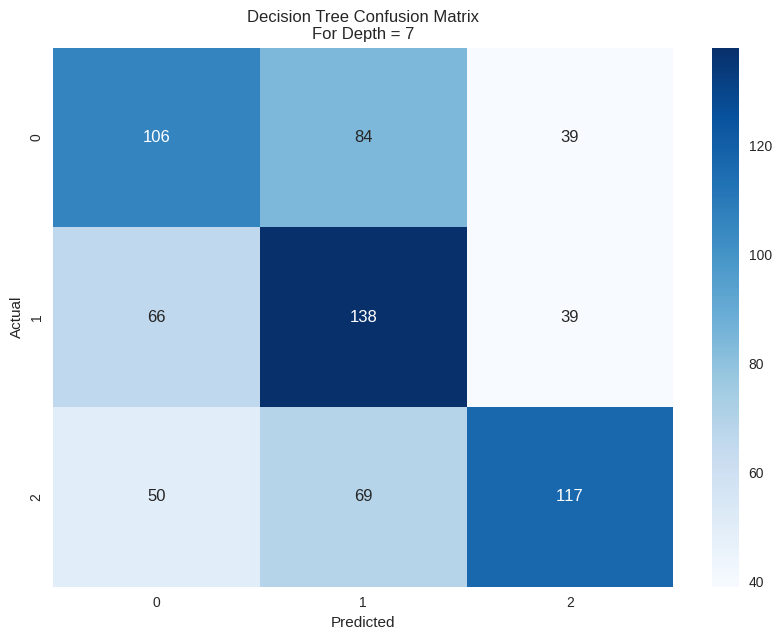

 Decision Tree Classifier
 For Depth =  9
 Confusion Matrix - 
 [[114  79  36]
 [ 77 118  48]
 [ 44  59 133]]
 Train accuracy score:  0.795968882602546
 Test accuracy score:  0.5155367231638418
 F1 Score =  0.5169916387263962
 Mean Squared Error =  0.8234463276836158
 Classification Report
               precision    recall  f1-score   support

           0       0.49      0.50      0.49       229
           1       0.46      0.49      0.47       243
           2       0.61      0.56      0.59       236

    accuracy                           0.52       708
   macro avg       0.52      0.52      0.52       708
weighted avg       0.52      0.52      0.52       708





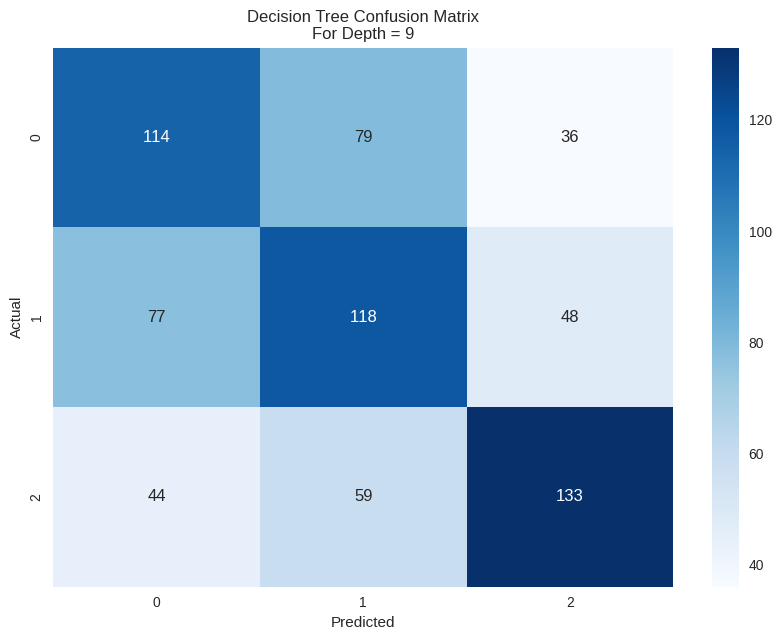

 Decision Tree Classifier
 For Depth =  11
 Confusion Matrix - 
 [[120  67  42]
 [ 82 113  48]
 [ 51  65 120]]
 Train accuracy score:  0.8939179632248939
 Test accuracy score:  0.4985875706214689
 F1 Score =  0.49937471356854385
 Mean Squared Error =  0.8954802259887006
 Classification Report
               precision    recall  f1-score   support

           0       0.47      0.52      0.50       229
           1       0.46      0.47      0.46       243
           2       0.57      0.51      0.54       236

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.50      0.50      0.50       708





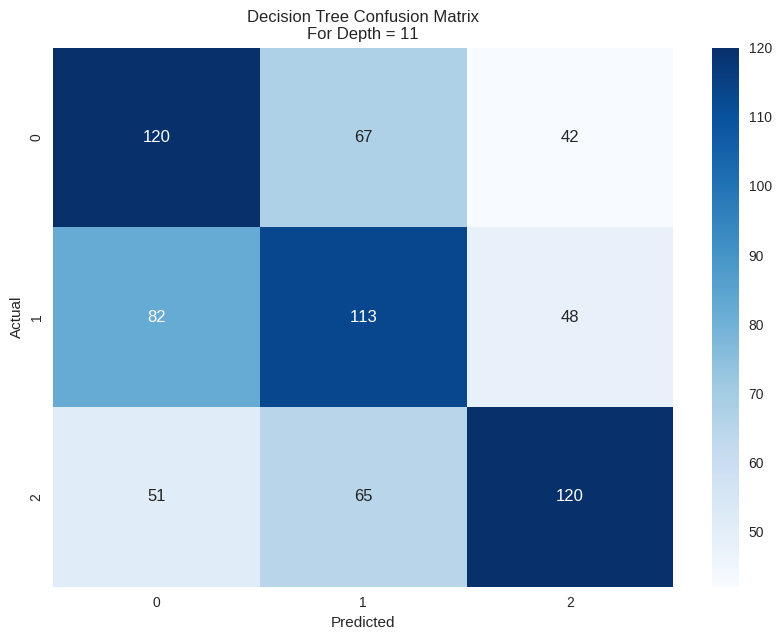

 Decision Tree Classifier
 For Depth =  13
 Confusion Matrix - 
 [[119  68  42]
 [ 74 112  57]
 [ 48  65 123]]
 Train accuracy score:  0.9642857142857143
 Test accuracy score:  0.5
 F1 Score =  0.5003707783357738
 Mean Squared Error =  0.8813559322033898
 Classification Report
               precision    recall  f1-score   support

           0       0.49      0.52      0.51       229
           1       0.46      0.46      0.46       243
           2       0.55      0.52      0.54       236

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.50      0.50      0.50       708





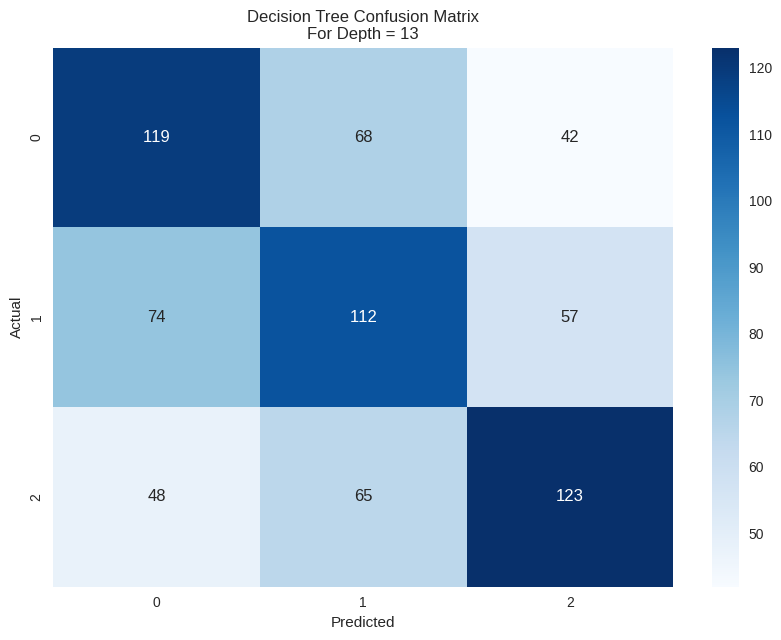

 Decision Tree Classifier
 For Depth =  15
 Confusion Matrix - 
 [[114  68  47]
 [ 72 124  47]
 [ 44  62 130]]
 Train accuracy score:  0.9911598302687411
 Test accuracy score:  0.519774011299435
 F1 Score =  0.5203368242004933
 Mean Squared Error =  0.865819209039548
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.50      0.50       229
           1       0.49      0.51      0.50       243
           2       0.58      0.55      0.57       236

    accuracy                           0.52       708
   macro avg       0.52      0.52      0.52       708
weighted avg       0.52      0.52      0.52       708





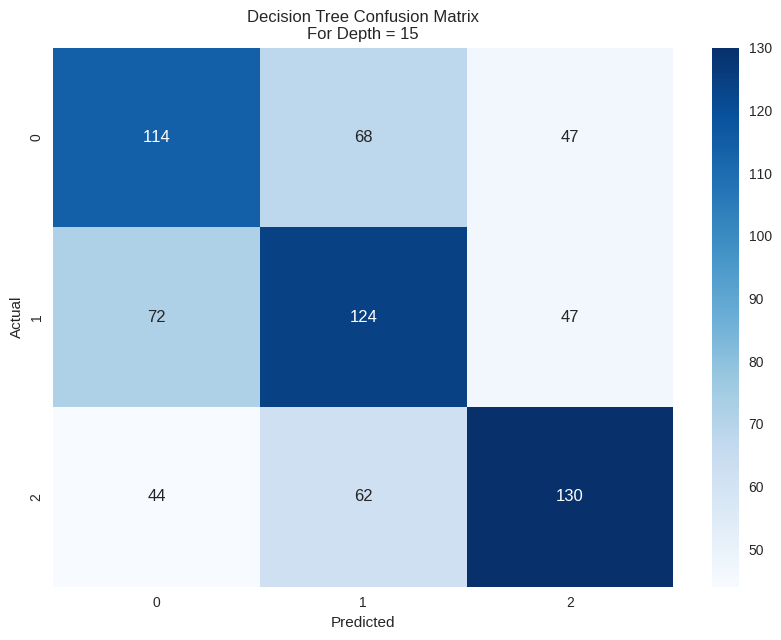

 Decision Tree Classifier
 For Depth =  17
 Confusion Matrix - 
 [[113  71  45]
 [ 67 124  52]
 [ 56  57 123]]
 Train accuracy score:  0.9982319660537482
 Test accuracy score:  0.5084745762711864
 F1 Score =  0.5089832891953695
 Mean Squared Error =  0.9194915254237288
 Classification Report
               precision    recall  f1-score   support

           0       0.48      0.49      0.49       229
           1       0.49      0.51      0.50       243
           2       0.56      0.52      0.54       236

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





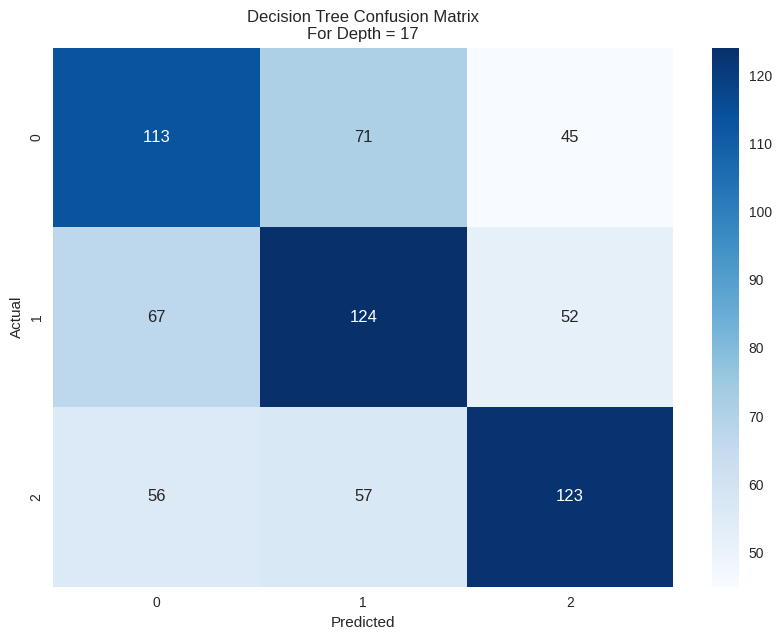

 Decision Tree Classifier
 For Depth =  19
 Confusion Matrix - 
 [[110  73  46]
 [ 62 128  53]
 [ 48  68 120]]
 Train accuracy score:  0.9996463932107497
 Test accuracy score:  0.5056497175141242
 F1 Score =  0.5059158421762702
 Mean Squared Error =  0.8926553672316384
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.48      0.49       229
           1       0.48      0.53      0.50       243
           2       0.55      0.51      0.53       236

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





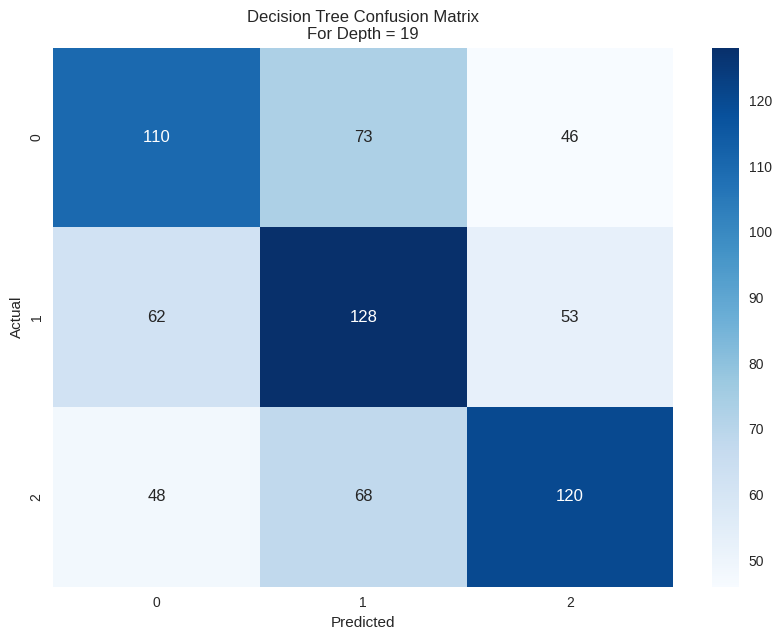

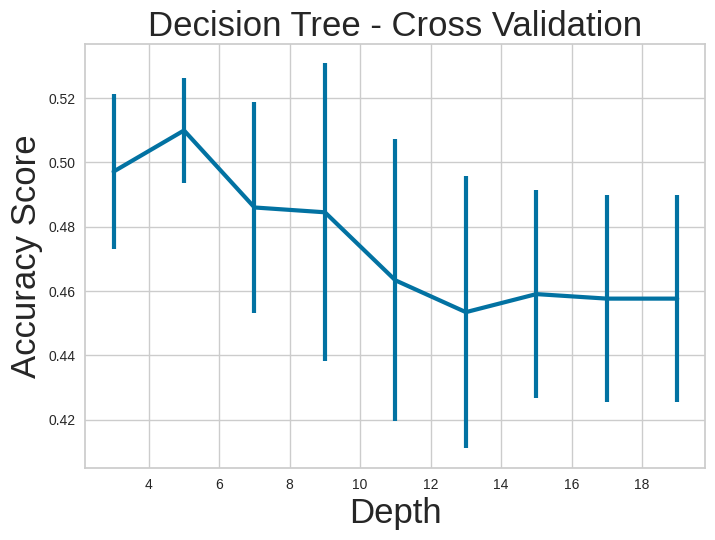

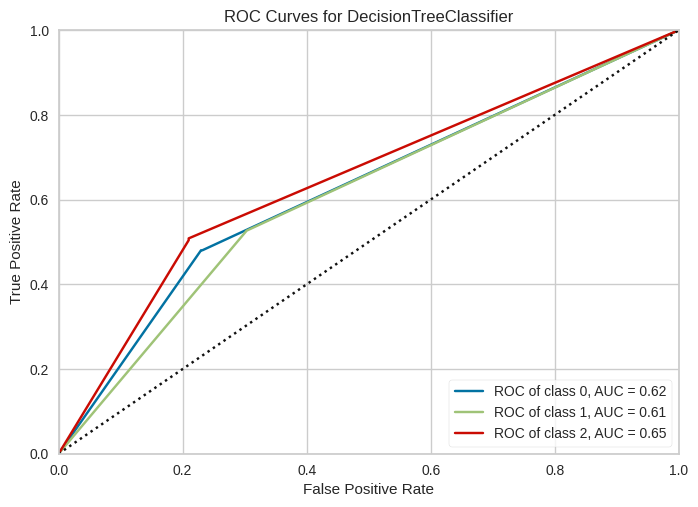

In [ ]:
evaluate_decision_tree(X, y, depth_range, 3)

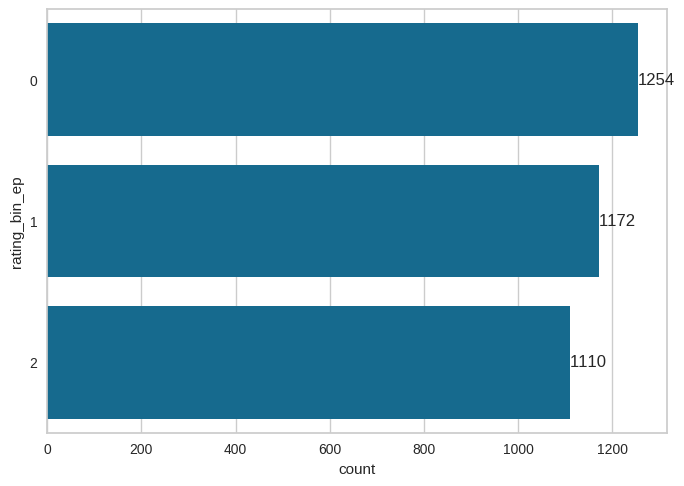

In [39]:
X,y = bin_column(listings, 'review_scores_rating', 3)
check_bins(y)

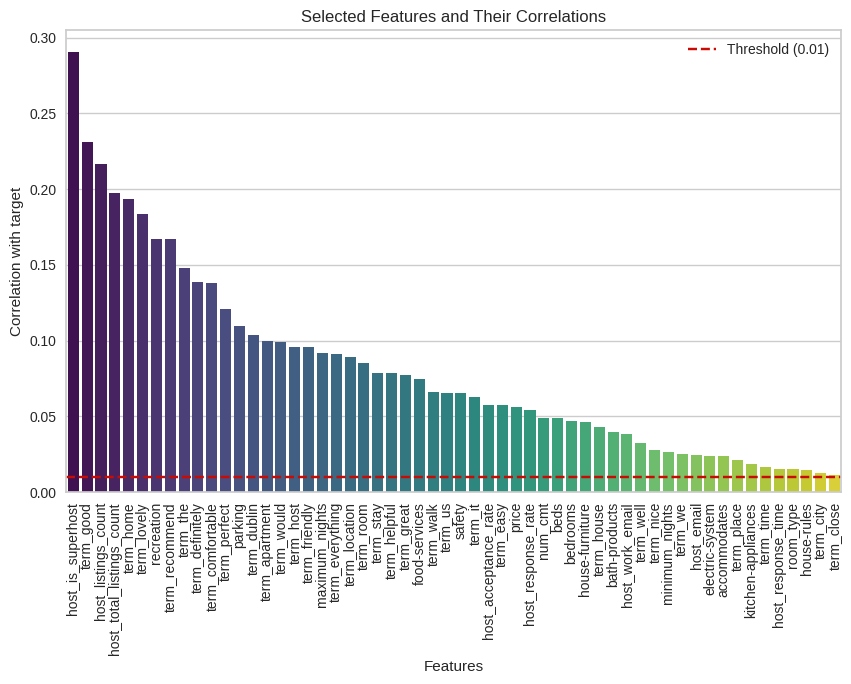

(Index(['host_is_superhost', 'term_good', 'host_listings_count',
        'host_total_listings_count', 'term_home', 'term_lovely', 'recreation',
        'term_recommend', 'term_the', 'term_definitely', 'term_comfortable',
        'term_perfect', 'parking', 'term_dublin', 'term_apartment',
        'term_would', 'term_host', 'term_friendly', 'maximum_nights',
        'term_everything', 'term_location', 'term_room', 'term_stay',
        'term_helpful', 'term_great', 'food-services', 'term_walk', 'term_us',
        'safety', 'term_it', 'host_acceptance_rate', 'term_easy', 'price',
        'host_response_rate', 'num_cmt', 'beds', 'bedrooms', 'house-furniture',
        'term_house', 'bath-products', 'host_work_email', 'term_well',
        'term_nice', 'minimum_nights', 'term_we', 'host_email',
        'electric-system', 'accommodates', 'term_place', 'kitchen-appliances',
        'term_time', 'host_response_time', 'room_type', 'house-rules',
        'term_city', 'term_close'],
       dtype='ob

In [40]:
yy = listings['review_scores_rating']
select_important_features(X, yy, threshold=0.01)

 Logistic Regression
 For Degree =  1
 For C =  0.001
 Confusion Matrix - 
 [[156  32  67]
 [ 56 115  70]
 [ 44  43 125]]
 Train accuracy score:  0.582036775106082
 Test accuracy score:  0.559322033898305
 F1 Score =  0.559487218736318
 Mean Squared Error =  0.9110169491525424
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.61      0.61       255
           1       0.61      0.48      0.53       241
           2       0.48      0.59      0.53       212

    accuracy                           0.56       708
   macro avg       0.56      0.56      0.56       708
weighted avg       0.57      0.56      0.56       708





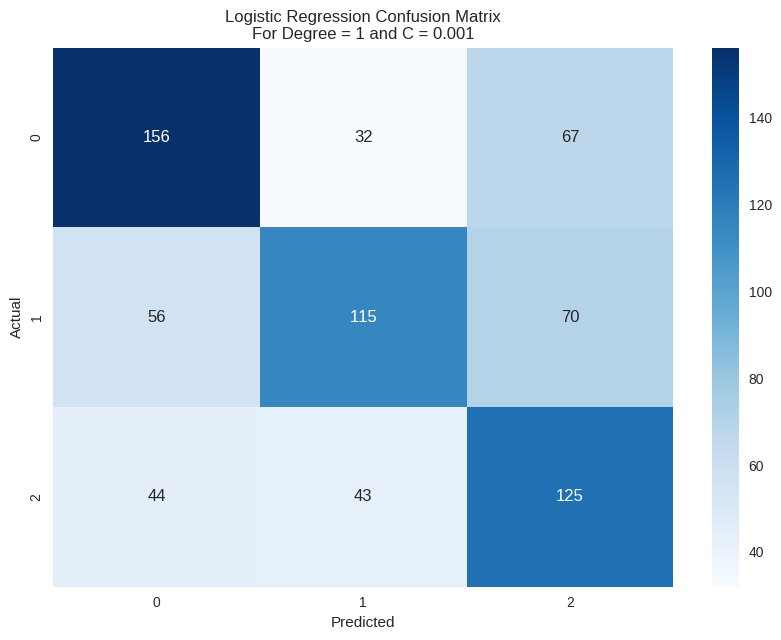

 Logistic Regression
 For Degree =  1
 For C =  0.1
 Confusion Matrix - 
 [[207  22  26]
 [ 71 119  51]
 [ 54  55 103]]
 Train accuracy score:  0.620933521923621
 Test accuracy score:  0.6059322033898306
 F1 Score =  0.5967639065901346
 Mean Squared Error =  0.7330508474576272
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.81      0.71       255
           1       0.61      0.49      0.54       241
           2       0.57      0.49      0.53       212

    accuracy                           0.61       708
   macro avg       0.60      0.60      0.59       708
weighted avg       0.60      0.61      0.60       708





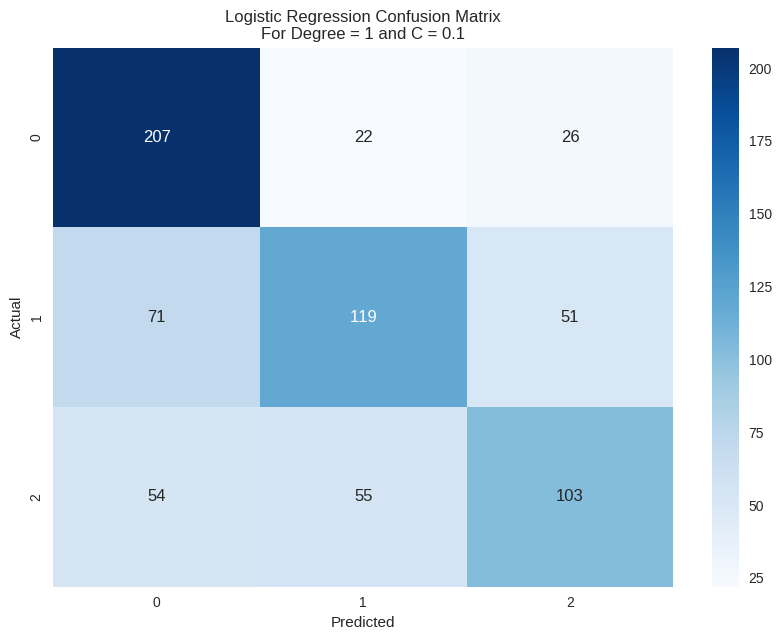

 Logistic Regression
 For Degree =  1
 For C =  1
 Confusion Matrix - 
 [[201  23  31]
 [ 66 121  54]
 [ 52  59 101]]
 Train accuracy score:  0.638967468175389
 Test accuracy score:  0.597457627118644
 F1 Score =  0.589749570592967
 Mean Squared Error =  0.7542372881355932
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.79      0.70       255
           1       0.60      0.50      0.55       241
           2       0.54      0.48      0.51       212

    accuracy                           0.60       708
   macro avg       0.59      0.59      0.58       708
weighted avg       0.59      0.60      0.59       708





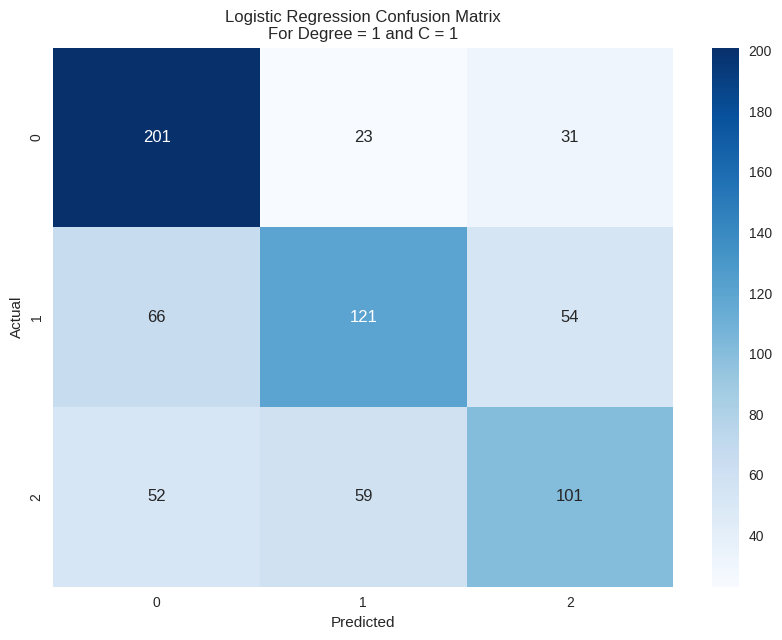

 Logistic Regression
 For Degree =  1
 For C =  10
 Confusion Matrix - 
 [[199  23  33]
 [ 66 125  50]
 [ 53  61  98]]
 Train accuracy score:  0.6432107496463932
 Test accuracy score:  0.596045197740113
 F1 Score =  0.5886152367729878
 Mean Squared Error =  0.768361581920904
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.78      0.69       255
           1       0.60      0.52      0.56       241
           2       0.54      0.46      0.50       212

    accuracy                           0.60       708
   macro avg       0.59      0.59      0.58       708
weighted avg       0.59      0.60      0.59       708





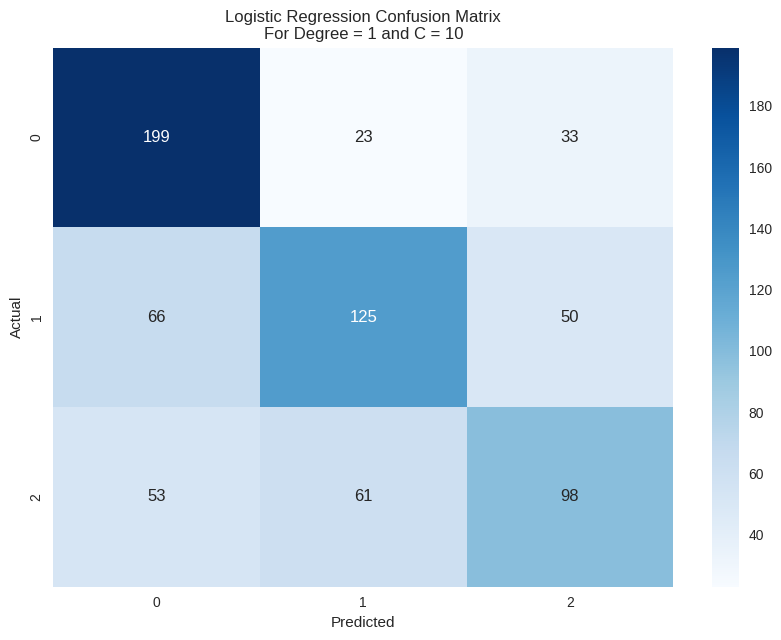

 Logistic Regression
 For Degree =  1
 For C =  100
 Confusion Matrix - 
 [[199  22  34]
 [ 64 126  51]
 [ 52  61  99]]
 Train accuracy score:  0.6425035360678925
 Test accuracy score:  0.5988700564971752
 F1 Score =  0.5918257508177223
 Mean Squared Error =  0.7655367231638418
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.78      0.70       255
           1       0.60      0.52      0.56       241
           2       0.54      0.47      0.50       212

    accuracy                           0.60       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.60      0.59       708





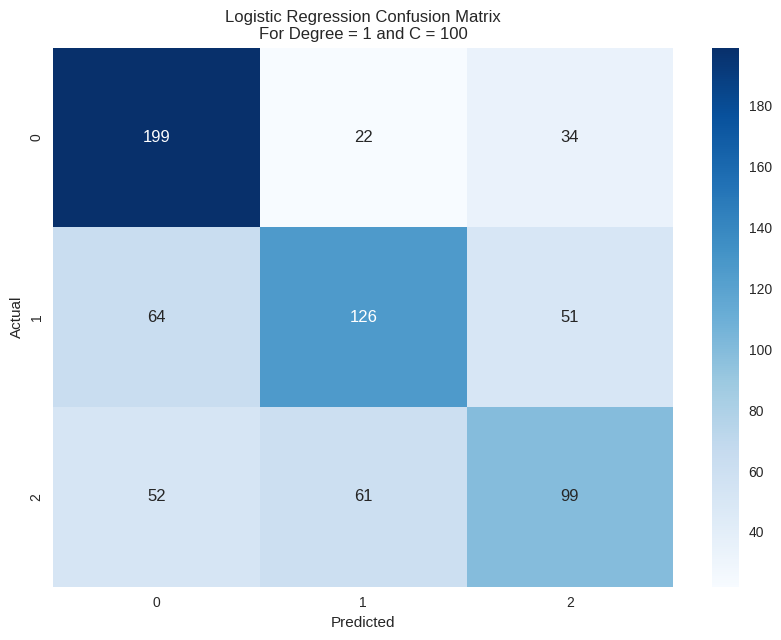

 Logistic Regression
 For Degree =  1
 For C =  1000
 Confusion Matrix - 
 [[199  22  34]
 [ 64 126  51]
 [ 52  61  99]]
 Train accuracy score:  0.6425035360678925
 Test accuracy score:  0.5988700564971752
 F1 Score =  0.5918257508177223
 Mean Squared Error =  0.7655367231638418
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.78      0.70       255
           1       0.60      0.52      0.56       241
           2       0.54      0.47      0.50       212

    accuracy                           0.60       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.60      0.59       708





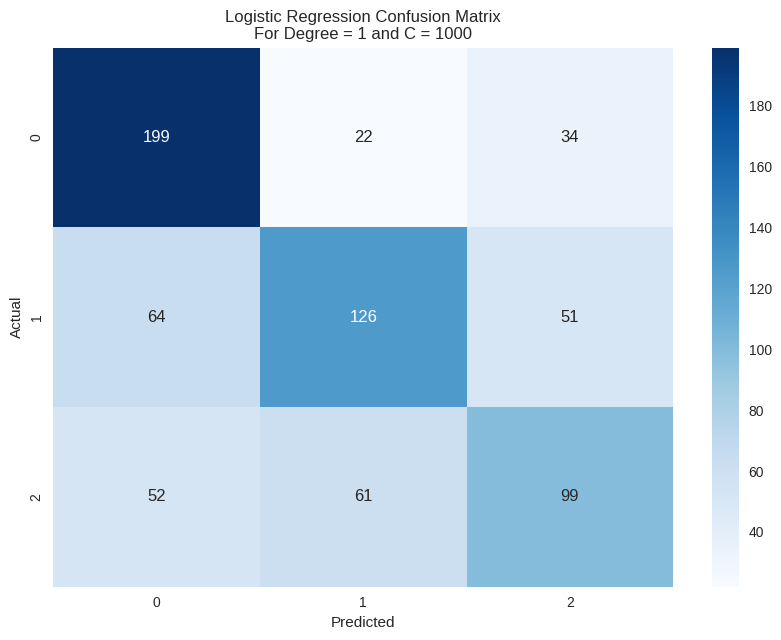

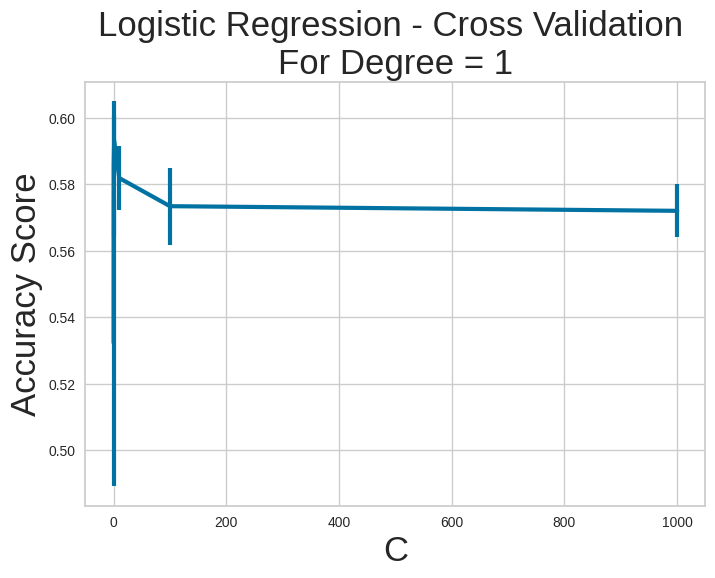

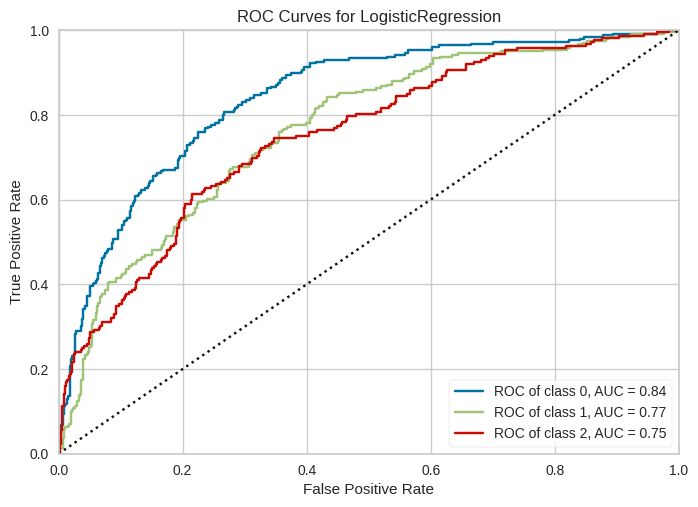

 Logistic Regression
 For Degree =  2
 For C =  0.001
 Confusion Matrix - 
 [[183  32  40]
 [ 53 128  60]
 [ 45  53 114]]
 Train accuracy score:  0.7001414427157001
 Test accuracy score:  0.6002824858757062
 F1 Score =  0.5981386951815054
 Mean Squared Error =  0.7598870056497176
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.72      0.68       255
           1       0.60      0.53      0.56       241
           2       0.53      0.54      0.54       212

    accuracy                           0.60       708
   macro avg       0.59      0.60      0.59       708
weighted avg       0.60      0.60      0.60       708





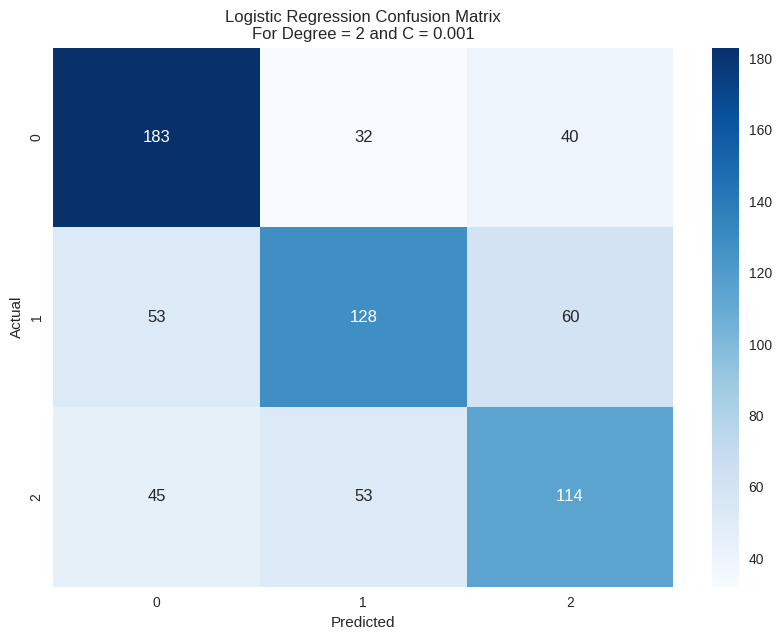

 Logistic Regression
 For Degree =  2
 For C =  0.1
 Confusion Matrix - 
 [[182  32  41]
 [ 53 127  61]
 [ 46  53 113]]
 Train accuracy score:  0.6990806223479491
 Test accuracy score:  0.596045197740113
 F1 Score =  0.5939378158328052
 Mean Squared Error =  0.7725988700564972
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.71      0.68       255
           1       0.60      0.53      0.56       241
           2       0.53      0.53      0.53       212

    accuracy                           0.60       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.60      0.59       708





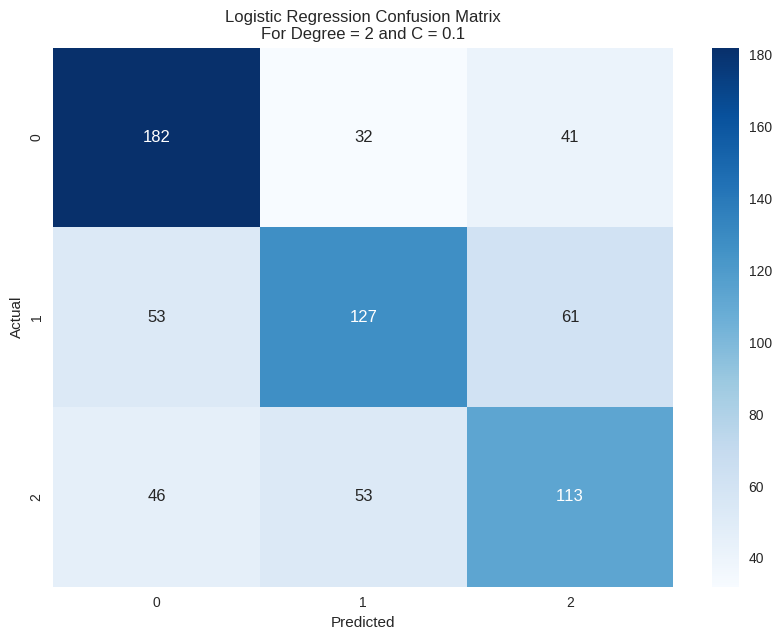

 Logistic Regression
 For Degree =  2
 For C =  1
 Confusion Matrix - 
 [[182  32  41]
 [ 53 127  61]
 [ 46  54 112]]
 Train accuracy score:  0.698019801980198
 Test accuracy score:  0.594632768361582
 F1 Score =  0.5924836430985075
 Mean Squared Error =  0.7740112994350282
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.71      0.68       255
           1       0.60      0.53      0.56       241
           2       0.52      0.53      0.53       212

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.59      0.59       708





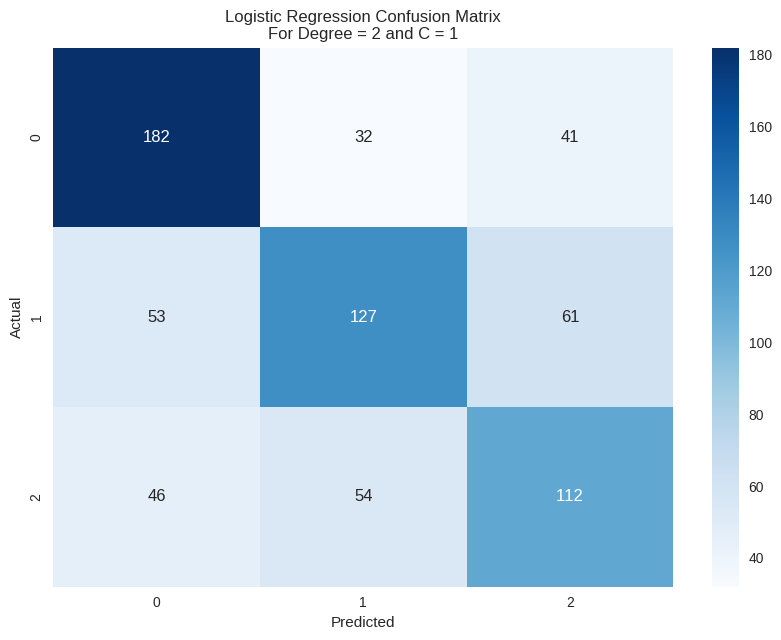

 Logistic Regression
 For Degree =  2
 For C =  10
 Confusion Matrix - 
 [[183  32  40]
 [ 53 126  62]
 [ 45  51 116]]
 Train accuracy score:  0.6976661951909476
 Test accuracy score:  0.6002824858757062
 F1 Score =  0.5981137424819144
 Mean Squared Error =  0.7598870056497176
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.72      0.68       255
           1       0.60      0.52      0.56       241
           2       0.53      0.55      0.54       212

    accuracy                           0.60       708
   macro avg       0.60      0.60      0.59       708
weighted avg       0.60      0.60      0.60       708





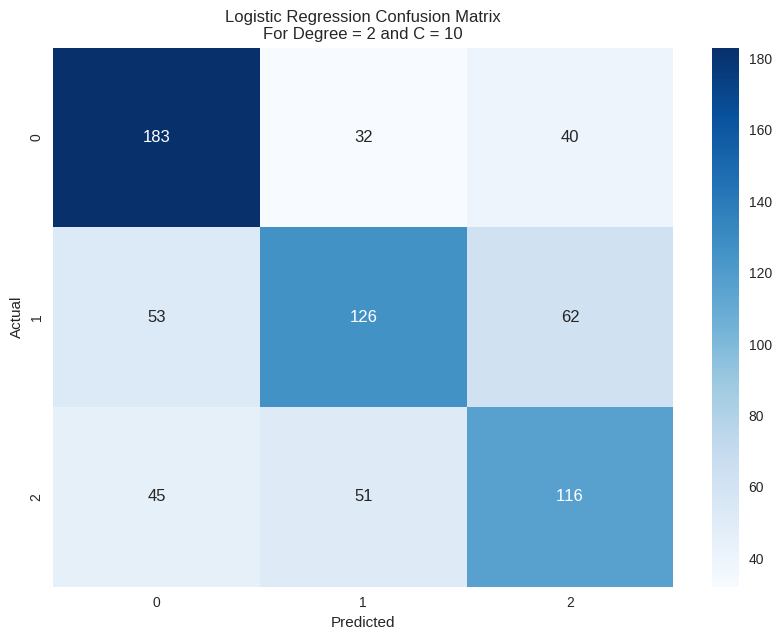

 Logistic Regression
 For Degree =  2
 For C =  100
 Confusion Matrix - 
 [[183  32  40]
 [ 53 126  62]
 [ 46  50 116]]
 Train accuracy score:  0.7001414427157001
 Test accuracy score:  0.6002824858757062
 F1 Score =  0.598080306631341
 Mean Squared Error =  0.7641242937853108
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.72      0.68       255
           1       0.61      0.52      0.56       241
           2       0.53      0.55      0.54       212

    accuracy                           0.60       708
   macro avg       0.60      0.60      0.59       708
weighted avg       0.60      0.60      0.60       708





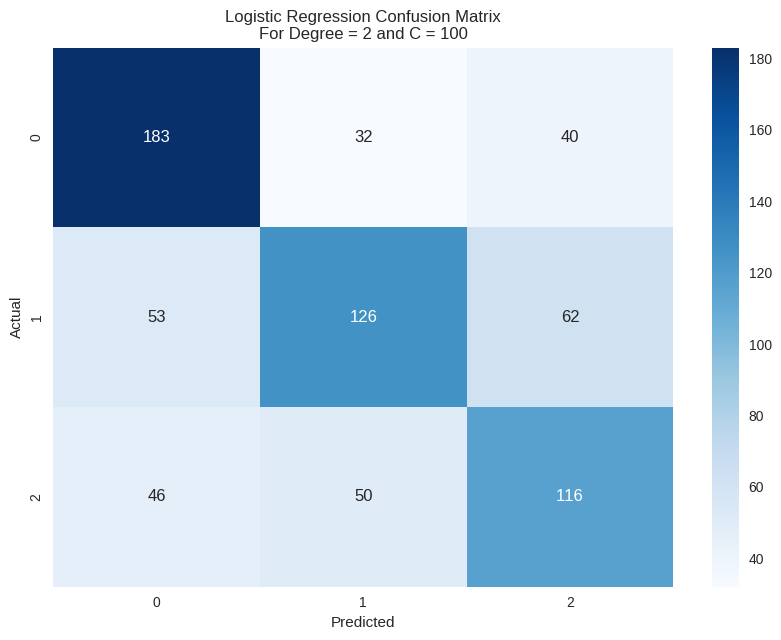

 Logistic Regression
 For Degree =  2
 For C =  1000
 Confusion Matrix - 
 [[184  32  39]
 [ 52 127  62]
 [ 45  53 114]]
 Train accuracy score:  0.6990806223479491
 Test accuracy score:  0.6002824858757062
 F1 Score =  0.5980281538462272
 Mean Squared Error =  0.7556497175141242
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.72      0.69       255
           1       0.60      0.53      0.56       241
           2       0.53      0.54      0.53       212

    accuracy                           0.60       708
   macro avg       0.59      0.60      0.59       708
weighted avg       0.60      0.60      0.60       708





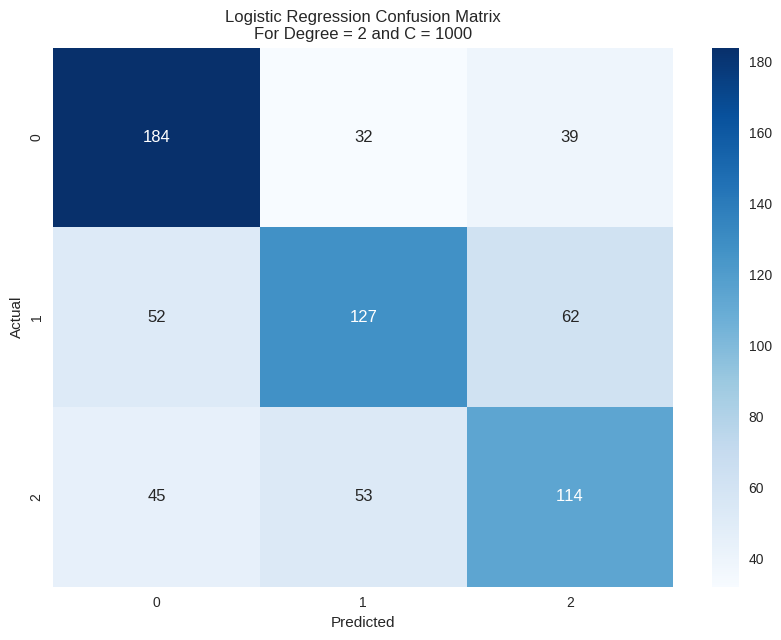

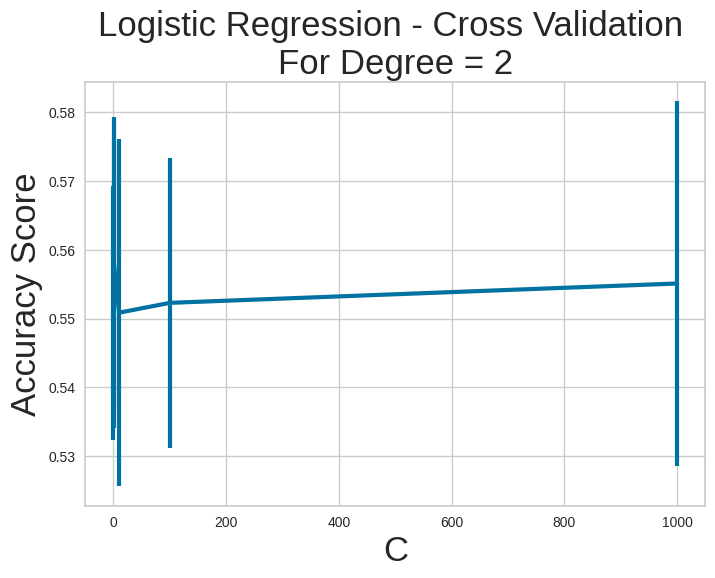

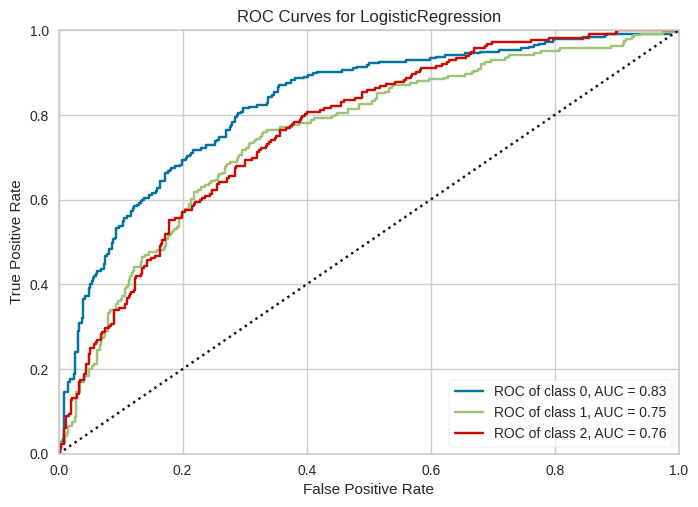

In [ ]:
evaluate_logistic_regression(X, y, c_range, degree_range, 3)

 K Neighbors Classifier
 For NN =  1
 Confusion Matrix - 
 [[120  63  72]
 [ 64 102  75]
 [ 52  61  99]]
 Train accuracy score:  1.0
 Test accuracy score:  0.4533898305084746
 F1 Score =  0.454195580235314
 Mean Squared Error =  1.0720338983050848
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.47      0.49       255
           1       0.45      0.42      0.44       241
           2       0.40      0.47      0.43       212

    accuracy                           0.45       708
   macro avg       0.45      0.45      0.45       708
weighted avg       0.46      0.45      0.45       708





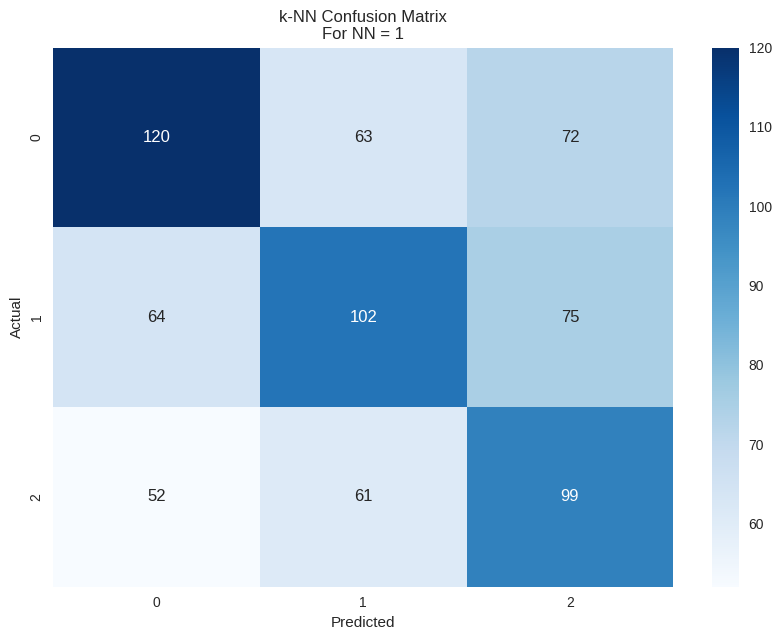

 K Neighbors Classifier
 For NN =  3
 Confusion Matrix - 
 [[148  51  56]
 [ 89  97  55]
 [ 66  54  92]]
 Train accuracy score:  0.7068599717114569
 Test accuracy score:  0.4759887005649718
 F1 Score =  0.4728863012898265
 Mean Squared Error =  1.0409604519774012
 Classification Report
               precision    recall  f1-score   support

           0       0.49      0.58      0.53       255
           1       0.48      0.40      0.44       241
           2       0.45      0.43      0.44       212

    accuracy                           0.48       708
   macro avg       0.47      0.47      0.47       708
weighted avg       0.48      0.48      0.47       708





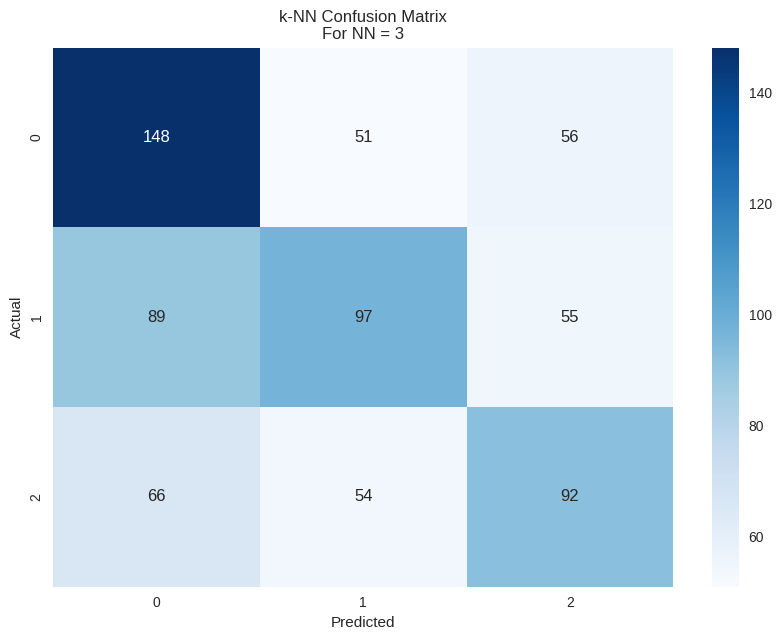

 K Neighbors Classifier
 For NN =  5
 Confusion Matrix - 
 [[138  63  54]
 [ 85 110  46]
 [ 68  59  85]]
 Train accuracy score:  0.6548797736916548
 Test accuracy score:  0.4703389830508475
 F1 Score =  0.468608726808032
 Mean Squared Error =  1.0466101694915255
 Classification Report
               precision    recall  f1-score   support

           0       0.47      0.54      0.51       255
           1       0.47      0.46      0.47       241
           2       0.46      0.40      0.43       212

    accuracy                           0.47       708
   macro avg       0.47      0.47      0.47       708
weighted avg       0.47      0.47      0.47       708





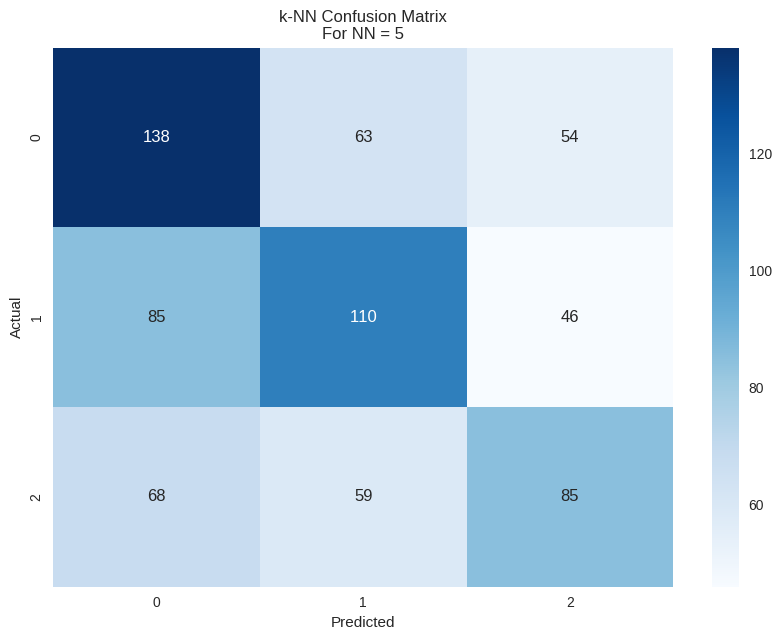

 K Neighbors Classifier
 For NN =  7
 Confusion Matrix - 
 [[132  60  63]
 [ 67 116  58]
 [ 57  52 103]]
 Train accuracy score:  0.6368458274398868
 Test accuracy score:  0.4957627118644068
 F1 Score =  0.49593527175367985
 Mean Squared Error =  1.0127118644067796
 Classification Report
               precision    recall  f1-score   support

           0       0.52      0.52      0.52       255
           1       0.51      0.48      0.49       241
           2       0.46      0.49      0.47       212

    accuracy                           0.50       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.50      0.50      0.50       708





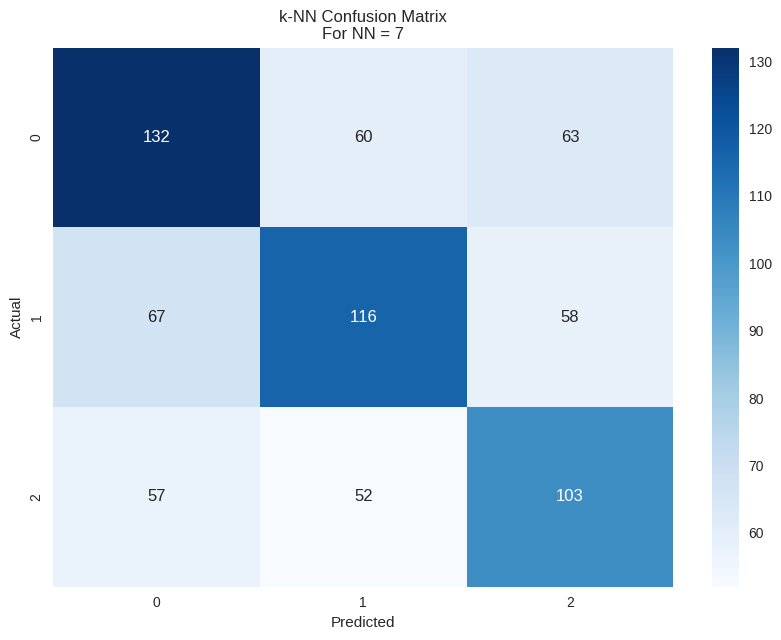

 K Neighbors Classifier
 For NN =  9
 Confusion Matrix - 
 [[133  57  65]
 [ 67 111  63]
 [ 65  49  98]]
 Train accuracy score:  0.614922206506365
 Test accuracy score:  0.4830508474576271
 F1 Score =  0.4832294936263366
 Mean Squared Error =  1.0677966101694916
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.52      0.51       255
           1       0.51      0.46      0.48       241
           2       0.43      0.46      0.45       212

    accuracy                           0.48       708
   macro avg       0.48      0.48      0.48       708
weighted avg       0.48      0.48      0.48       708





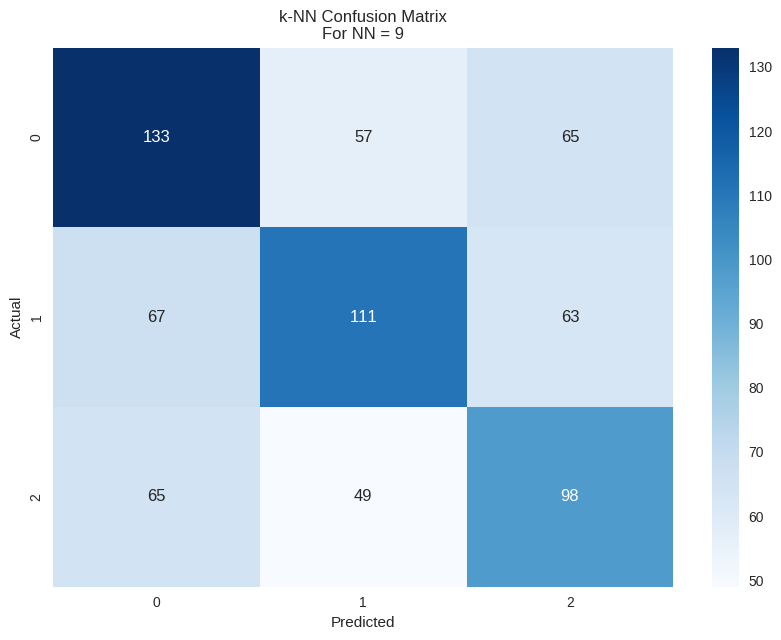

 K Neighbors Classifier
 For NN =  11
 Confusion Matrix - 
 [[124  63  68]
 [ 62 120  59]
 [ 59  51 102]]
 Train accuracy score:  0.5997171145685997
 Test accuracy score:  0.4887005649717514
 F1 Score =  0.48914752579592646
 Mean Squared Error =  1.0494350282485876
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.49      0.50       255
           1       0.51      0.50      0.51       241
           2       0.45      0.48      0.46       212

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





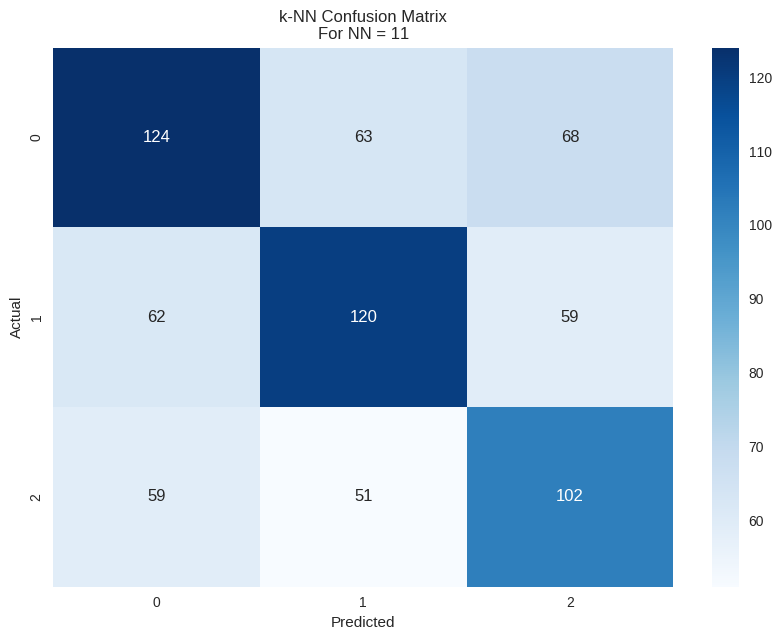

 K Neighbors Classifier
 For NN =  13
 Confusion Matrix - 
 [[125  61  69]
 [ 59 121  61]
 [ 61  52  99]]
 Train accuracy score:  0.5975954738330976
 Test accuracy score:  0.4872881355932203
 F1 Score =  0.4879475019267297
 Mean Squared Error =  1.0635593220338984
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.49      0.50       255
           1       0.52      0.50      0.51       241
           2       0.43      0.47      0.45       212

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





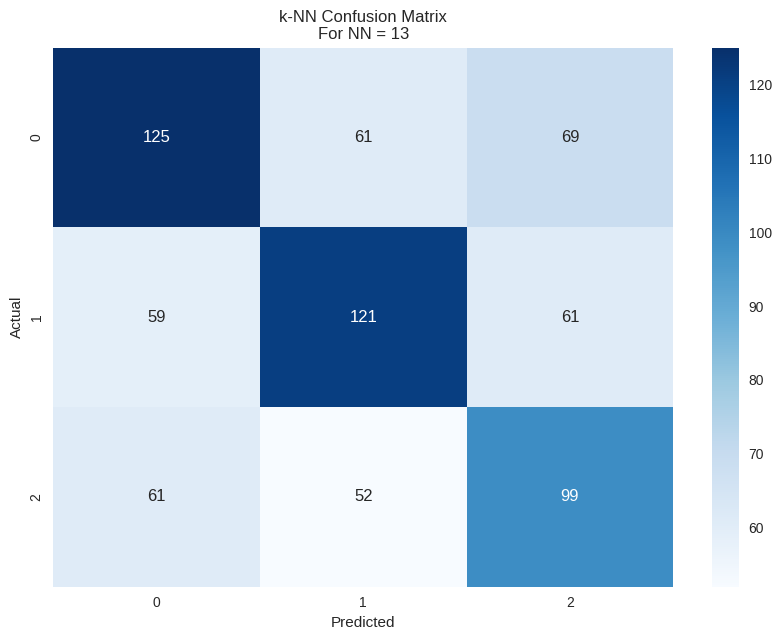

 K Neighbors Classifier
 For NN =  15
 Confusion Matrix - 
 [[124  63  68]
 [ 64 114  63]
 [ 56  55 101]]
 Train accuracy score:  0.5873408769448374
 Test accuracy score:  0.4788135593220339
 F1 Score =  0.47931221832868254
 Mean Squared Error =  1.0466101694915255
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.49      0.50       255
           1       0.49      0.47      0.48       241
           2       0.44      0.48      0.45       212

    accuracy                           0.48       708
   macro avg       0.48      0.48      0.48       708
weighted avg       0.48      0.48      0.48       708





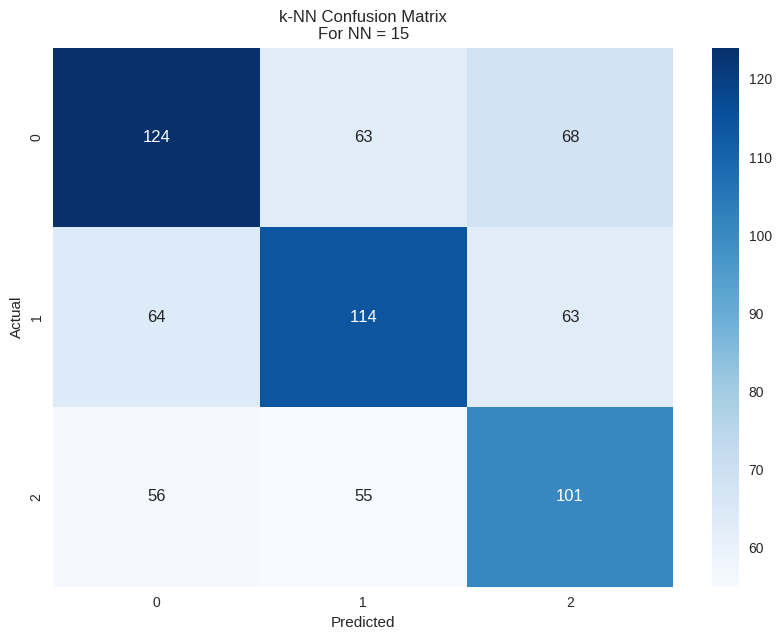

 K Neighbors Classifier
 For NN =  17
 Confusion Matrix - 
 [[122  64  69]
 [ 66 107  68]
 [ 55  51 106]]
 Train accuracy score:  0.580975954738331
 Test accuracy score:  0.4731638418079096
 F1 Score =  0.47331738663823236
 Mean Squared Error =  1.0522598870056497
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.48      0.49       255
           1       0.48      0.44      0.46       241
           2       0.44      0.50      0.47       212

    accuracy                           0.47       708
   macro avg       0.47      0.47      0.47       708
weighted avg       0.48      0.47      0.47       708





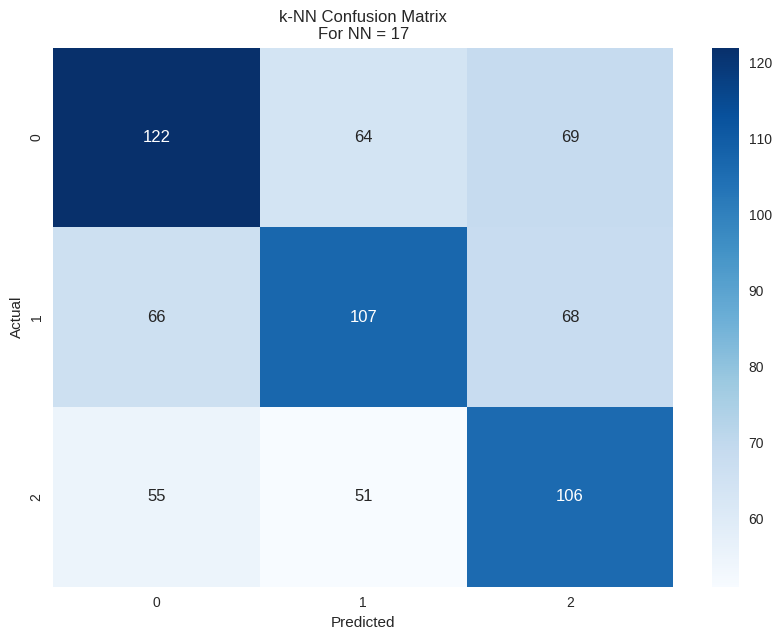

 K Neighbors Classifier
 For NN =  19
 Confusion Matrix - 
 [[124  64  67]
 [ 66 115  60]
 [ 54  49 109]]
 Train accuracy score:  0.5770862800565771
 Test accuracy score:  0.4915254237288136
 F1 Score =  0.4916409809065567
 Mean Squared Error =  1.021186440677966
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.49      0.50       255
           1       0.50      0.48      0.49       241
           2       0.46      0.51      0.49       212

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





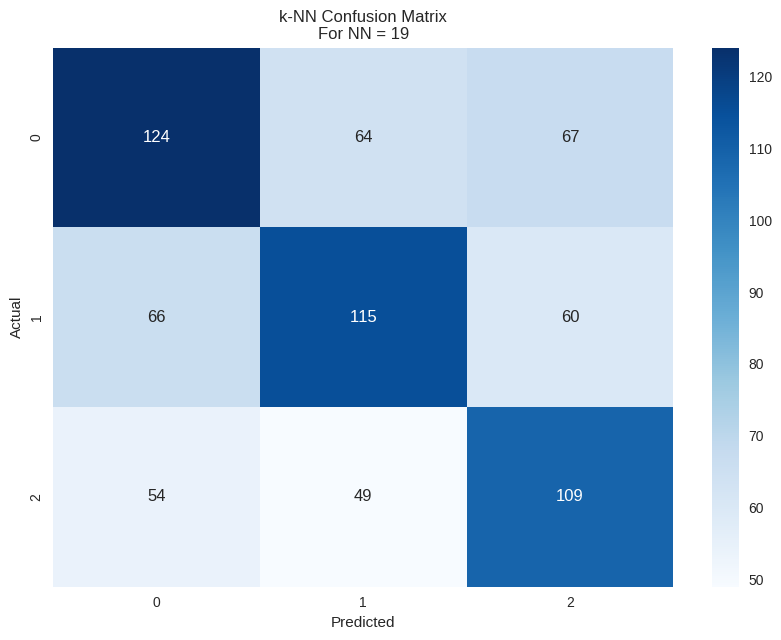

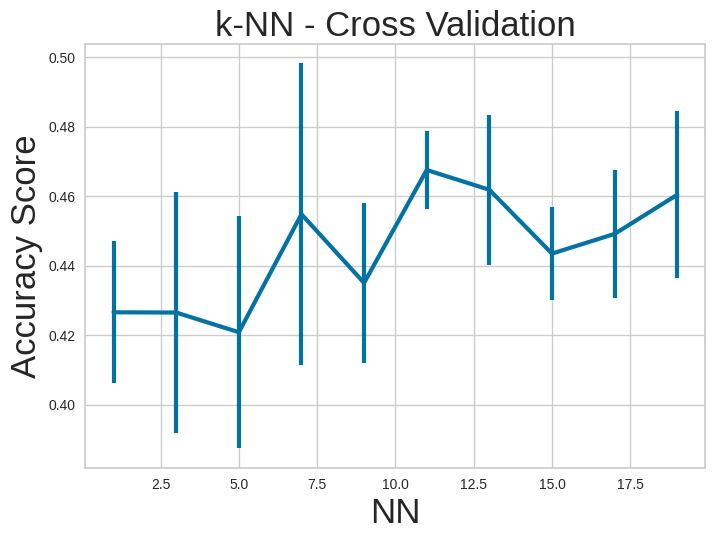

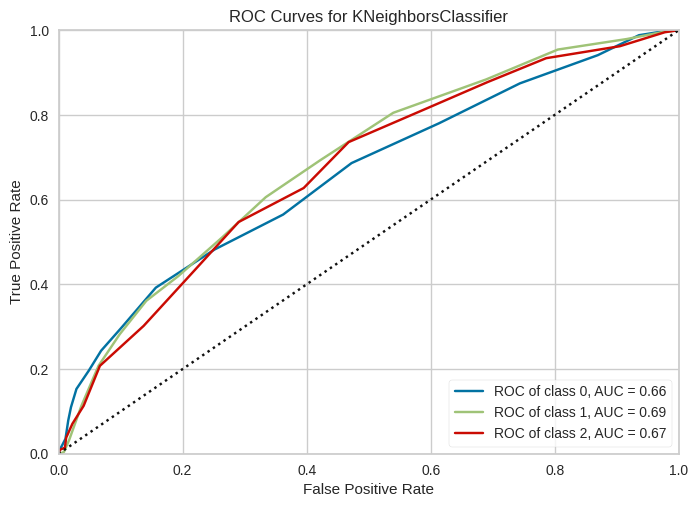

In [ ]:
evaluate_knn(X, y, nn_range, 3)

 Decision Tree Classifier
 For Depth =  3
 Confusion Matrix - 
 [[194  34  27]
 [ 63 139  39]
 [ 52  71  89]]
 Train accuracy score:  0.632956152758133
 Test accuracy score:  0.596045197740113
 F1 Score =  0.5881195287907336
 Mean Squared Error =  0.7387005649717514
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.76      0.69       255
           1       0.57      0.58      0.57       241
           2       0.57      0.42      0.49       212

    accuracy                           0.60       708
   macro avg       0.59      0.59      0.58       708
weighted avg       0.59      0.60      0.59       708





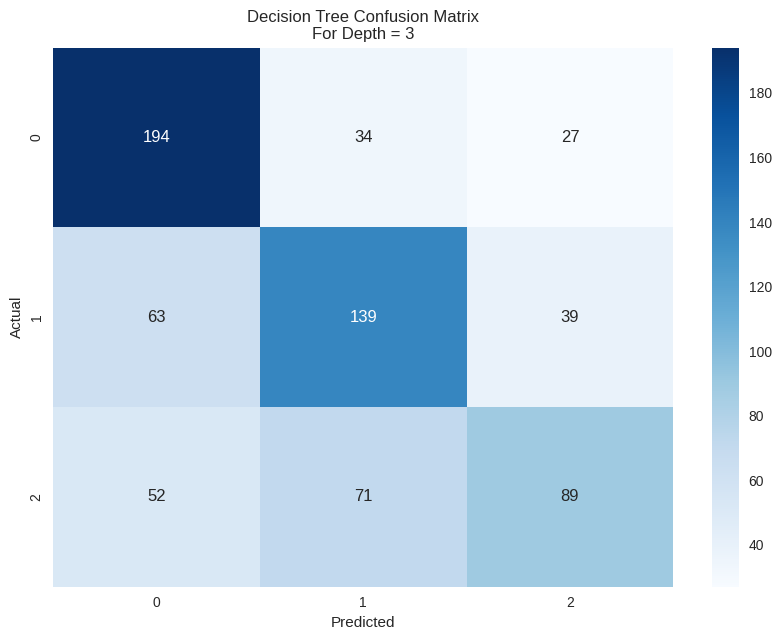

 Decision Tree Classifier
 For Depth =  5
 Confusion Matrix - 
 [[164  54  37]
 [ 41 161  39]
 [ 41  69 102]]
 Train accuracy score:  0.6877652050919377
 Test accuracy score:  0.6031073446327684
 F1 Score =  0.6012030350424747
 Mean Squared Error =  0.7274011299435028
 Classification Report
               precision    recall  f1-score   support

           0       0.67      0.64      0.65       255
           1       0.57      0.67      0.61       241
           2       0.57      0.48      0.52       212

    accuracy                           0.60       708
   macro avg       0.60      0.60      0.60       708
weighted avg       0.60      0.60      0.60       708





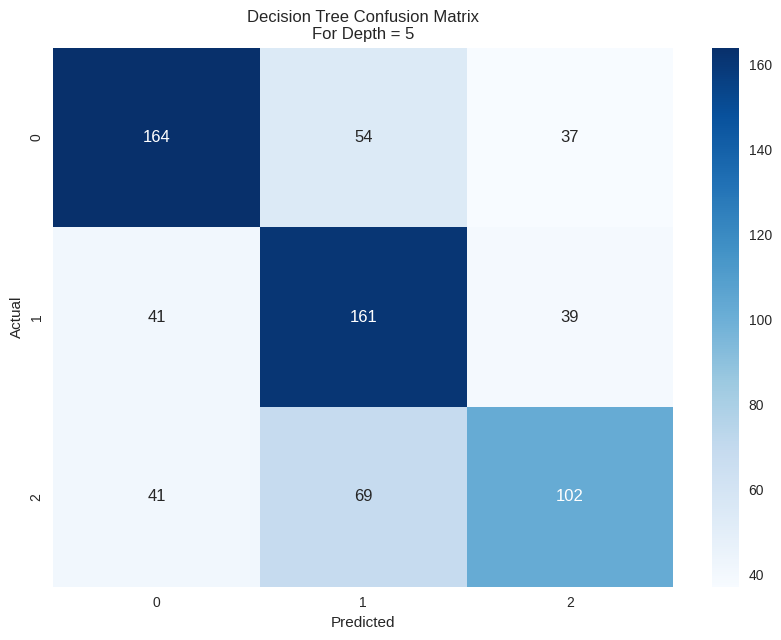

 Decision Tree Classifier
 For Depth =  7
 Confusion Matrix - 
 [[181  33  41]
 [ 57 134  50]
 [ 49  60 103]]
 Train accuracy score:  0.7687411598302687
 Test accuracy score:  0.5903954802259888
 F1 Score =  0.5874134217628991
 Mean Squared Error =  0.7909604519774012
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.71      0.67       255
           1       0.59      0.56      0.57       241
           2       0.53      0.49      0.51       212

    accuracy                           0.59       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.59      0.59      0.59       708





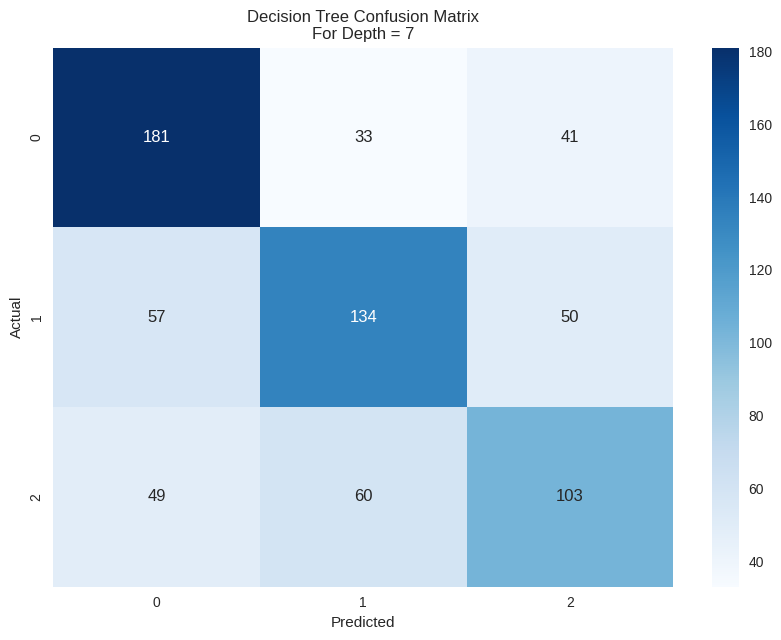

 Decision Tree Classifier
 For Depth =  9
 Confusion Matrix - 
 [[175  40  40]
 [ 58 131  52]
 [ 57  56  99]]
 Train accuracy score:  0.8705799151343706
 Test accuracy score:  0.5720338983050848
 F1 Score =  0.5689817517538336
 Mean Squared Error =  0.8389830508474576
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.69      0.64       255
           1       0.58      0.54      0.56       241
           2       0.52      0.47      0.49       212

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.56       708
weighted avg       0.57      0.57      0.57       708





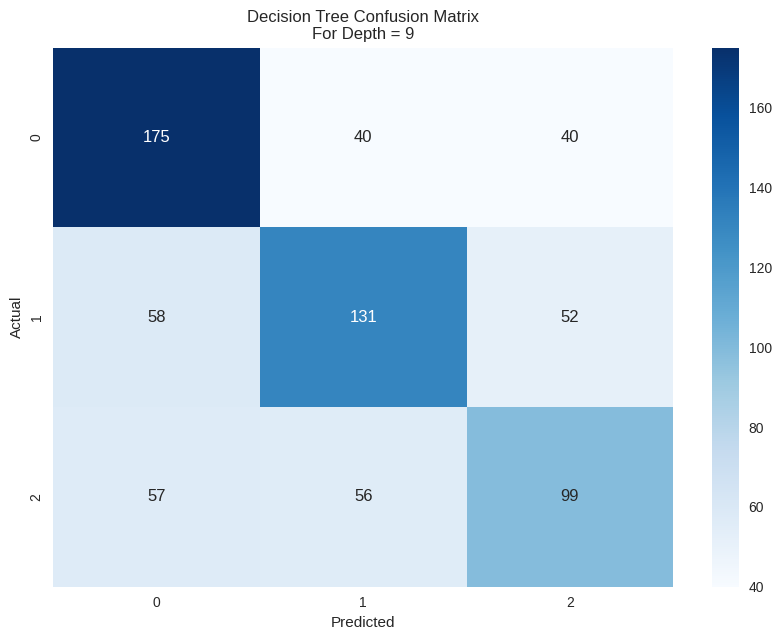

 Decision Tree Classifier
 For Depth =  11
 Confusion Matrix - 
 [[171  46  38]
 [ 60 123  58]
 [ 47  53 112]]
 Train accuracy score:  0.9384724186704385
 Test accuracy score:  0.5734463276836158
 F1 Score =  0.5716598813539251
 Mean Squared Error =  0.786723163841808
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.67      0.64       255
           1       0.55      0.51      0.53       241
           2       0.54      0.53      0.53       212

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.57       708
weighted avg       0.57      0.57      0.57       708





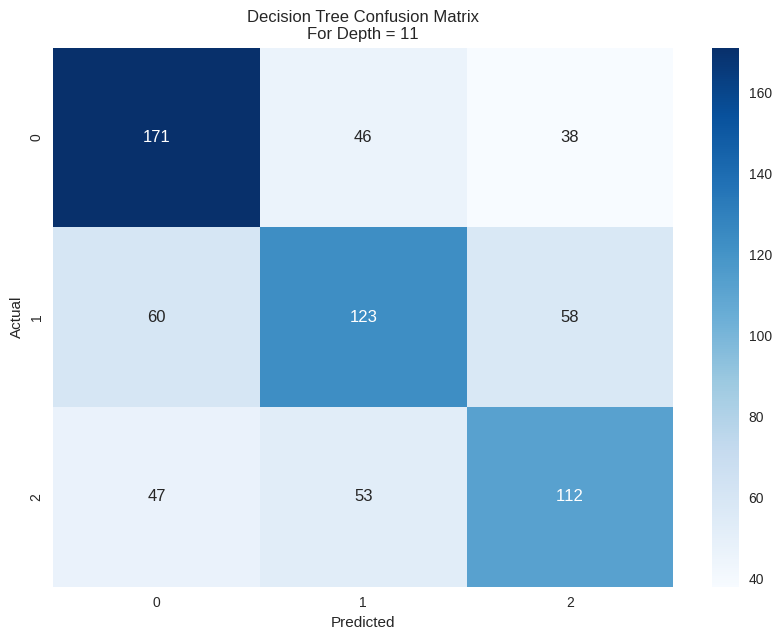

 Decision Tree Classifier
 For Depth =  13
 Confusion Matrix - 
 [[167  43  45]
 [ 55 133  53]
 [ 46  54 112]]
 Train accuracy score:  0.9773691654879774
 Test accuracy score:  0.5819209039548022
 F1 Score =  0.5811947897944794
 Mean Squared Error =  0.8036723163841808
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.65      0.64       255
           1       0.58      0.55      0.56       241
           2       0.53      0.53      0.53       212

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.58      0.58      0.58       708





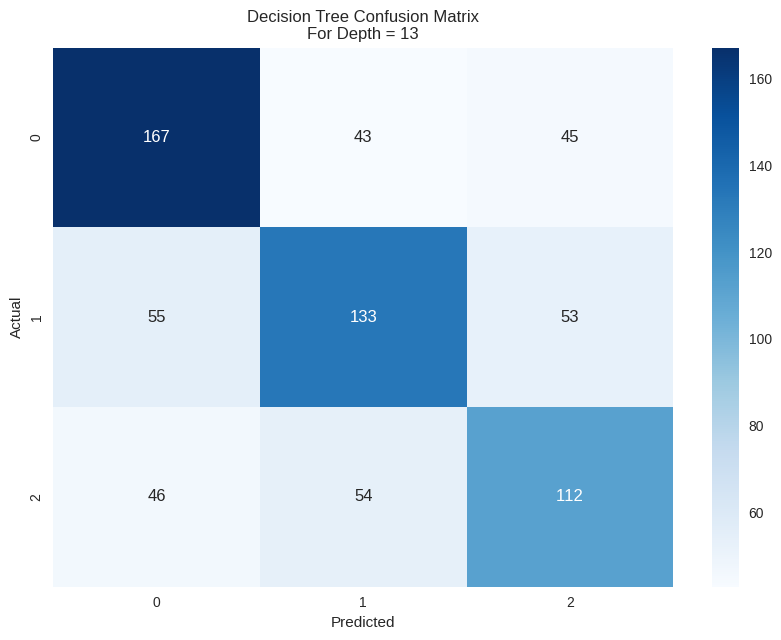

 Decision Tree Classifier
 For Depth =  15
 Confusion Matrix - 
 [[168  39  48]
 [ 57 123  61]
 [ 44  56 112]]
 Train accuracy score:  0.9925742574257426
 Test accuracy score:  0.5692090395480226
 F1 Score =  0.568286588279296
 Mean Squared Error =  0.8206214689265536
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.66      0.64       255
           1       0.56      0.51      0.54       241
           2       0.51      0.53      0.52       212

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.56       708
weighted avg       0.57      0.57      0.57       708





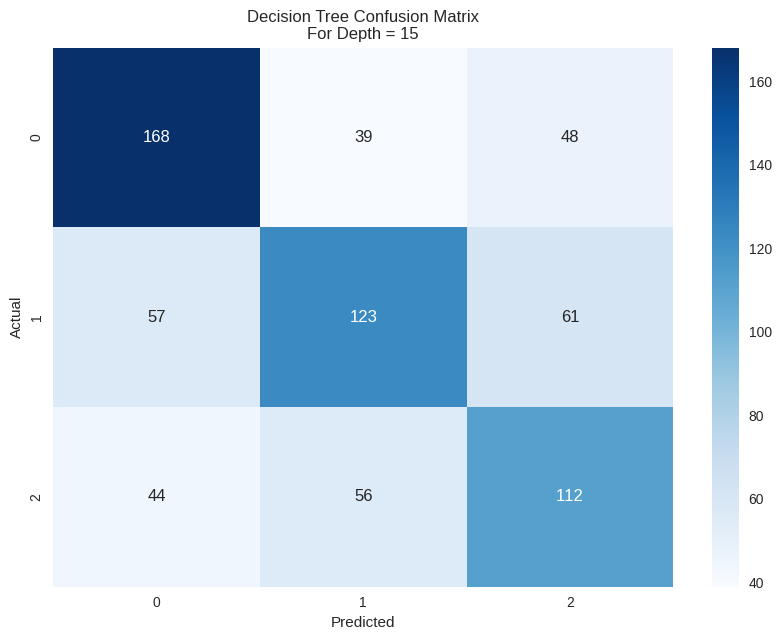

 Decision Tree Classifier
 For Depth =  17
 Confusion Matrix - 
 [[164  48  43]
 [ 59 127  55]
 [ 51  51 110]]
 Train accuracy score:  0.995049504950495
 Test accuracy score:  0.5663841807909604
 F1 Score =  0.5653057754257524
 Mean Squared Error =  0.8319209039548022
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.64      0.62       255
           1       0.56      0.53      0.54       241
           2       0.53      0.52      0.52       212

    accuracy                           0.57       708
   macro avg       0.56      0.56      0.56       708
weighted avg       0.57      0.57      0.57       708





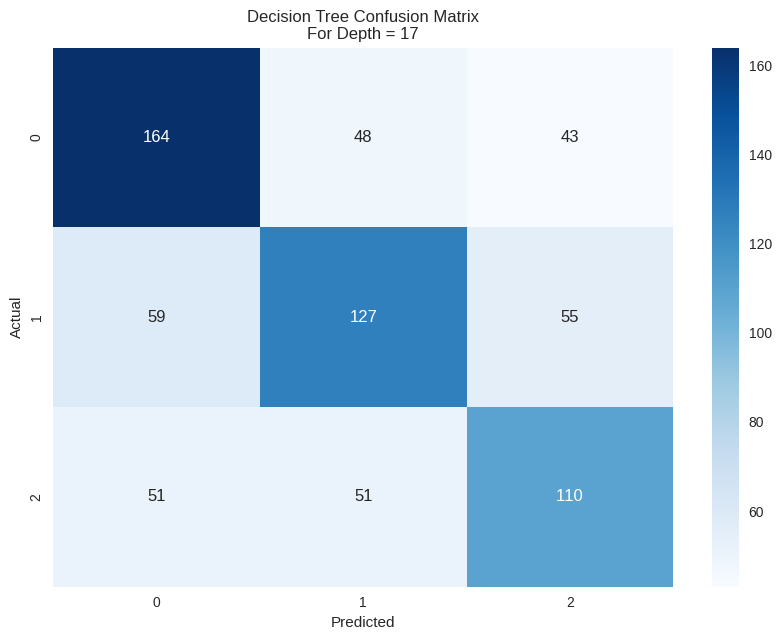

 Decision Tree Classifier
 For Depth =  19
 Confusion Matrix - 
 [[162  45  48]
 [ 62 120  59]
 [ 46  50 116]]
 Train accuracy score:  0.9968175388967468
 Test accuracy score:  0.5621468926553672
 F1 Score =  0.5611302266966852
 Mean Squared Error =  0.8361581920903954
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.64      0.62       255
           1       0.56      0.50      0.53       241
           2       0.52      0.55      0.53       212

    accuracy                           0.56       708
   macro avg       0.56      0.56      0.56       708
weighted avg       0.56      0.56      0.56       708





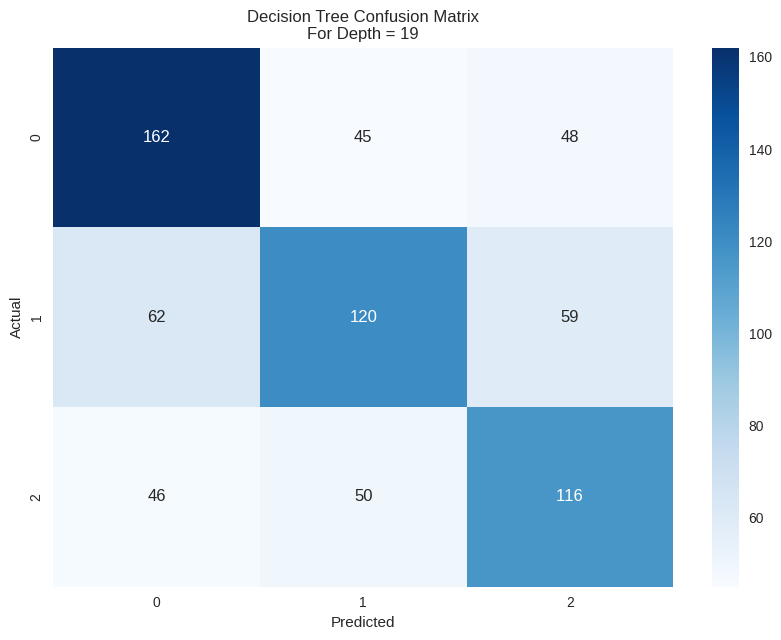

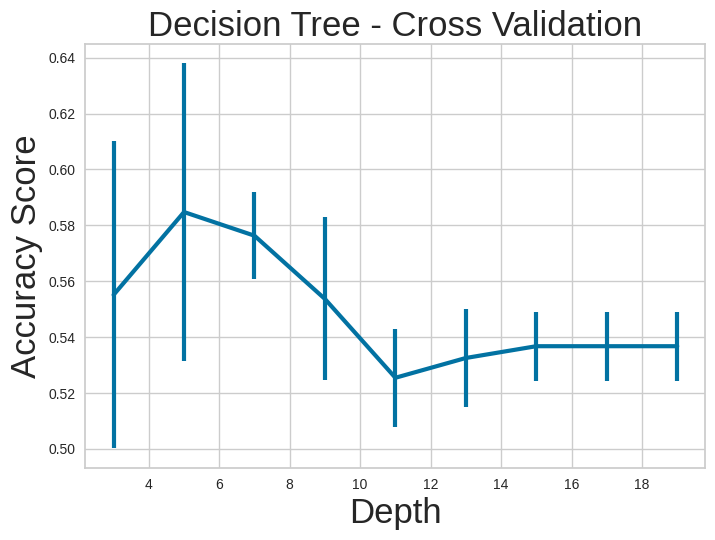

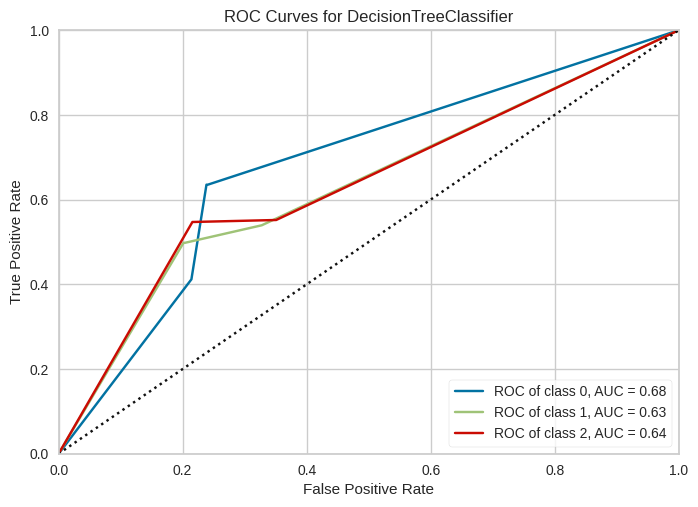

In [ ]:
evaluate_decision_tree(X, y, depth_range, 3)

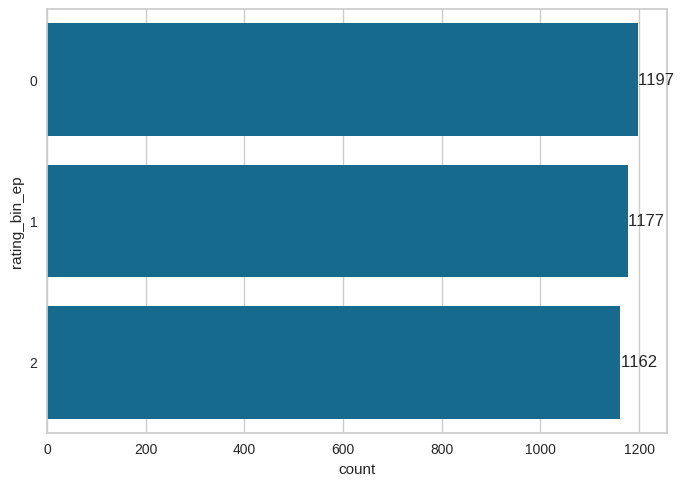

In [43]:
X,y = bin_column(listings, 'review_scores_value', 3)
check_bins(y)

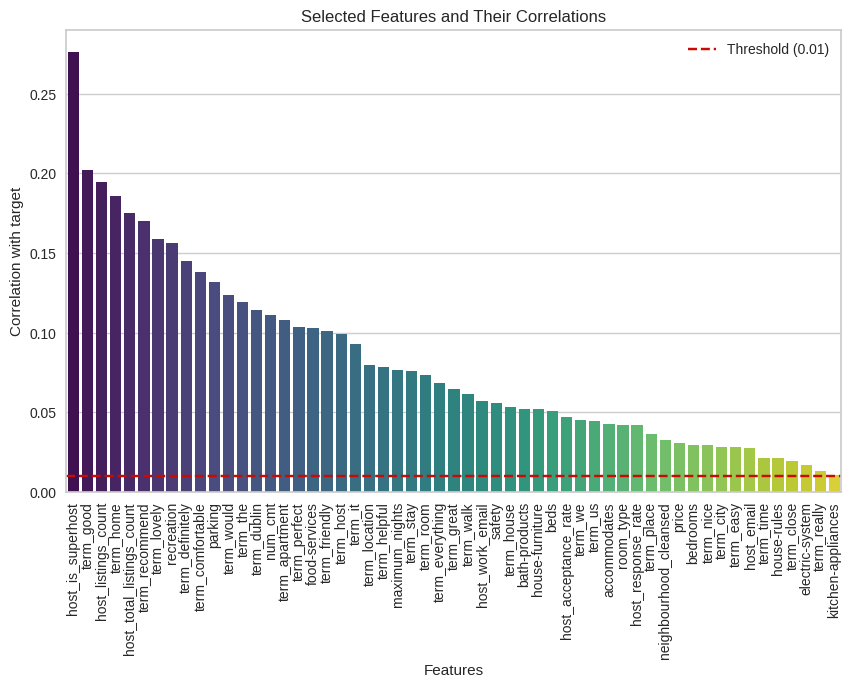

(Index(['host_is_superhost', 'term_good', 'host_listings_count', 'term_home',
        'host_total_listings_count', 'term_recommend', 'term_lovely',
        'recreation', 'term_definitely', 'term_comfortable', 'parking',
        'term_would', 'term_the', 'term_dublin', 'num_cmt', 'term_apartment',
        'term_perfect', 'food-services', 'term_friendly', 'term_host',
        'term_it', 'term_location', 'term_helpful', 'maximum_nights',
        'term_stay', 'term_room', 'term_everything', 'term_great', 'term_walk',
        'host_work_email', 'safety', 'term_house', 'bath-products',
        'house-furniture', 'beds', 'host_acceptance_rate', 'term_we', 'term_us',
        'accommodates', 'room_type', 'host_response_rate', 'term_place',
        'neighbourhood_cleansed', 'price', 'bedrooms', 'term_nice', 'term_city',
        'term_easy', 'host_email', 'term_time', 'house-rules', 'term_close',
        'electric-system', 'term_really', 'kitchen-appliances'],
       dtype='object'),
 host_is_sup

In [44]:
yy = listings['review_scores_value']
select_important_features(X, yy, threshold=0.01)

 Logistic Regression
 For Degree =  1
 For C =  0.001
 Confusion Matrix - 
 [[149  33  66]
 [ 63  93  77]
 [ 58  54 115]]
 Train accuracy score:  0.5240452616690241
 Test accuracy score:  0.5042372881355932
 F1 Score =  0.5017739038209516
 Mean Squared Error =  1.021186440677966
 Classification Report
               precision    recall  f1-score   support

           0       0.55      0.60      0.58       248
           1       0.52      0.40      0.45       233
           2       0.45      0.51      0.47       227

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.51      0.50      0.50       708





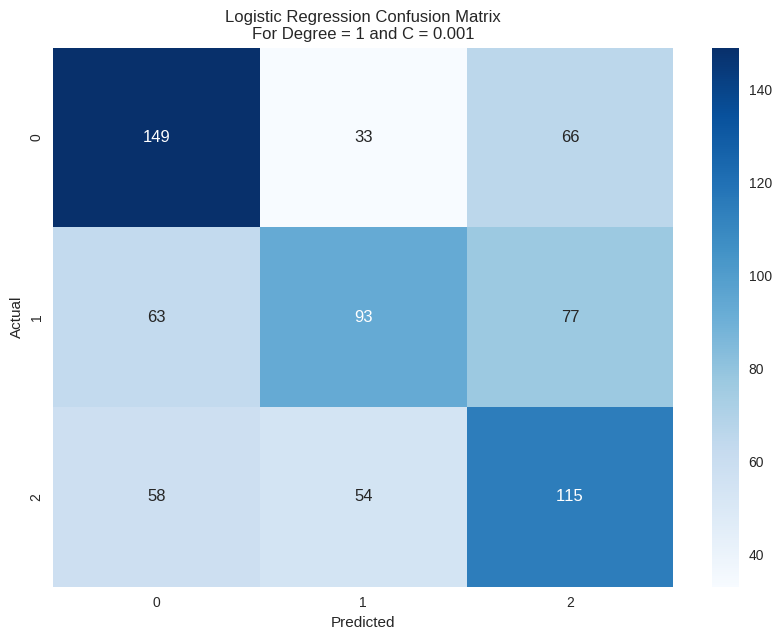

 Logistic Regression
 For Degree =  1
 For C =  0.1
 Confusion Matrix - 
 [[185  26  37]
 [ 73  99  61]
 [ 56  55 116]]
 Train accuracy score:  0.5696605374823197
 Test accuracy score:  0.5649717514124294
 F1 Score =  0.5570594957208495
 Mean Squared Error =  0.8290960451977402
 Classification Report
               precision    recall  f1-score   support

           0       0.59      0.75      0.66       248
           1       0.55      0.42      0.48       233
           2       0.54      0.51      0.53       227

    accuracy                           0.56       708
   macro avg       0.56      0.56      0.55       708
weighted avg       0.56      0.56      0.56       708





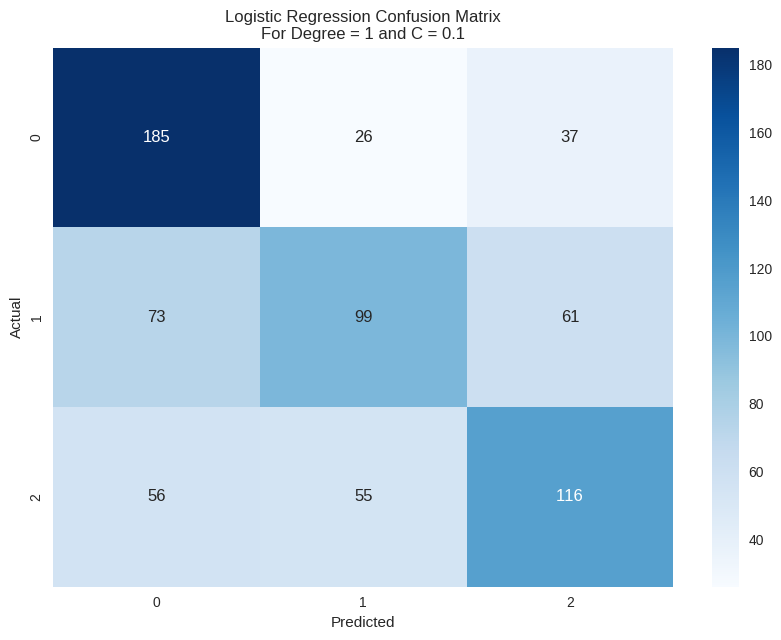

 Logistic Regression
 For Degree =  1
 For C =  1
 Confusion Matrix - 
 [[185  24  39]
 [ 68 115  50]
 [ 56  59 112]]
 Train accuracy score:  0.5937057991513437
 Test accuracy score:  0.5819209039548022
 F1 Score =  0.5761047489516107
 Mean Squared Error =  0.8206214689265536
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.75      0.66       248
           1       0.58      0.49      0.53       233
           2       0.56      0.49      0.52       227

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.57       708
weighted avg       0.58      0.58      0.58       708





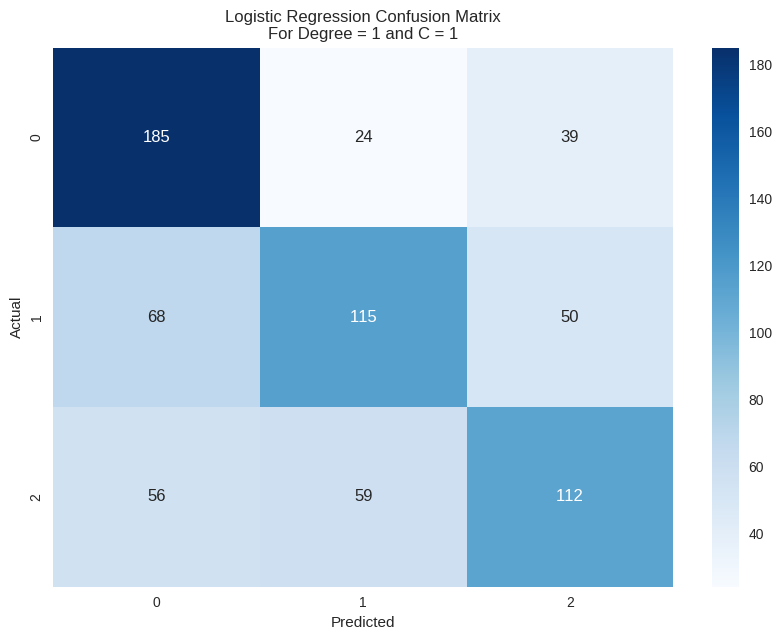

 Logistic Regression
 For Degree =  1
 For C =  10
 Confusion Matrix - 
 [[183  24  41]
 [ 69 116  48]
 [ 55  60 112]]
 Train accuracy score:  0.5986562942008486
 Test accuracy score:  0.5805084745762712
 F1 Score =  0.5751275860380977
 Mean Squared Error =  0.826271186440678
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.74      0.66       248
           1       0.58      0.50      0.54       233
           2       0.56      0.49      0.52       227

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.57       708
weighted avg       0.58      0.58      0.58       708





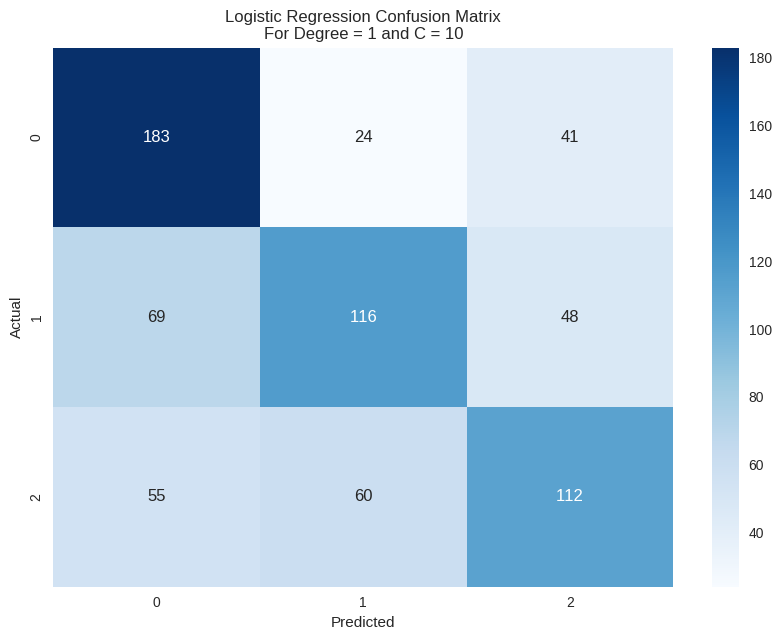

 Logistic Regression
 For Degree =  1
 For C =  100
 Confusion Matrix - 
 [[182  24  42]
 [ 69 116  48]
 [ 54  60 113]]
 Train accuracy score:  0.6004243281471005
 Test accuracy score:  0.5805084745762712
 F1 Score =  0.5754069628878109
 Mean Squared Error =  0.826271186440678
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.73      0.66       248
           1       0.58      0.50      0.54       233
           2       0.56      0.50      0.53       227

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.57       708
weighted avg       0.58      0.58      0.58       708





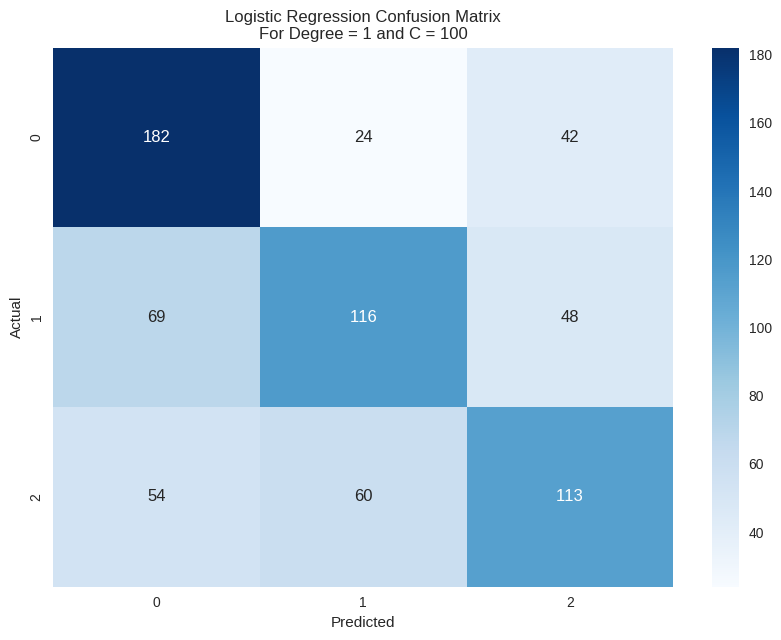

 Logistic Regression
 For Degree =  1
 For C =  1000
 Confusion Matrix - 
 [[183  24  41]
 [ 69 116  48]
 [ 55  61 111]]
 Train accuracy score:  0.6007779349363508
 Test accuracy score:  0.5790960451977402
 F1 Score =  0.5736125377127805
 Mean Squared Error =  0.827683615819209
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.74      0.66       248
           1       0.58      0.50      0.53       233
           2       0.56      0.49      0.52       227

    accuracy                           0.58       708
   macro avg       0.58      0.57      0.57       708
weighted avg       0.58      0.58      0.57       708





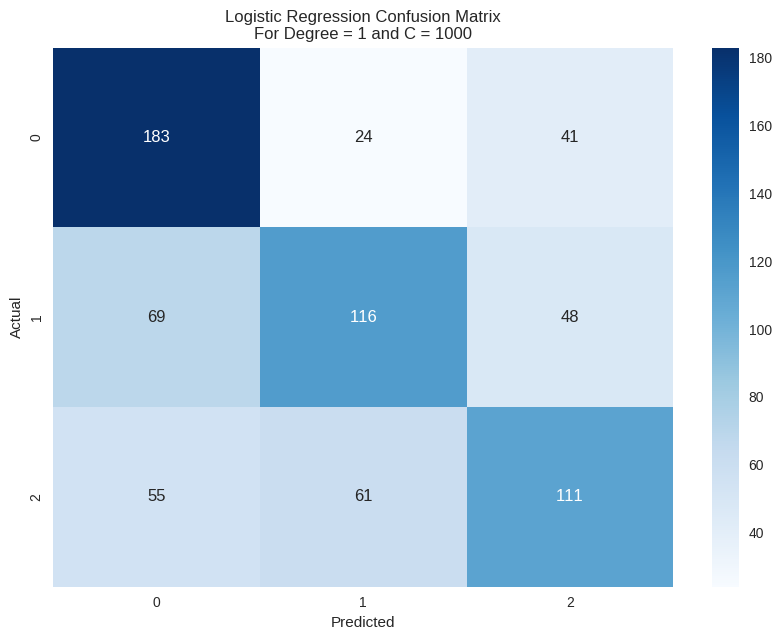

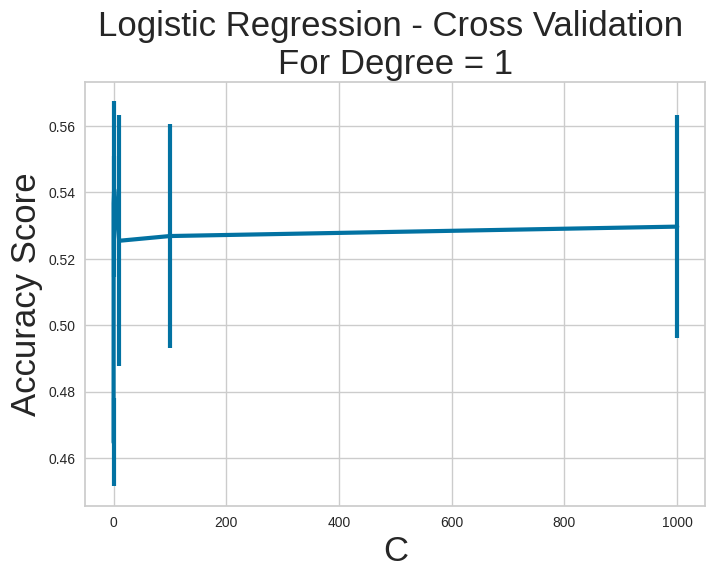

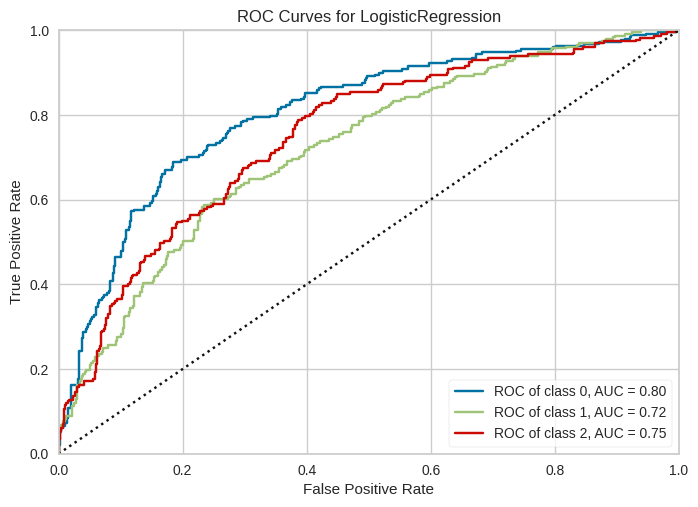

 Logistic Regression
 For Degree =  2
 For C =  0.001
 Confusion Matrix - 
 [[169  37  42]
 [ 53 113  67]
 [ 49  50 128]]
 Train accuracy score:  0.6474540311173974
 Test accuracy score:  0.5790960451977402
 F1 Score =  0.5767852907496114
 Mean Squared Error =  0.806497175141243
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.68      0.65       248
           1       0.56      0.48      0.52       233
           2       0.54      0.56      0.55       227

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.57       708
weighted avg       0.58      0.58      0.58       708





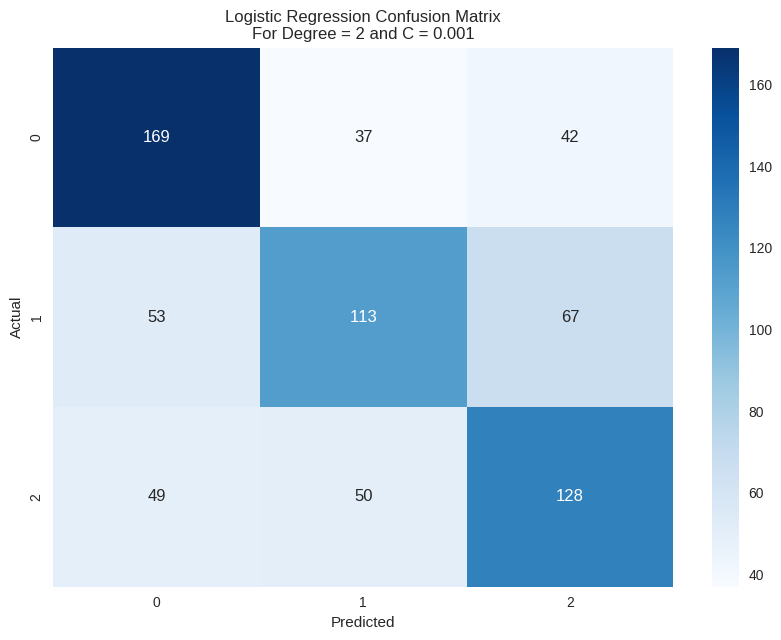

 Logistic Regression
 For Degree =  2
 For C =  0.1
 Confusion Matrix - 
 [[169  37  42]
 [ 55 112  66]
 [ 49  52 126]]
 Train accuracy score:  0.6506364922206507
 Test accuracy score:  0.5748587570621468
 F1 Score =  0.5723664229118708
 Mean Squared Error =  0.8107344632768362
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.68      0.65       248
           1       0.56      0.48      0.52       233
           2       0.54      0.56      0.55       227

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.57       708
weighted avg       0.57      0.57      0.57       708





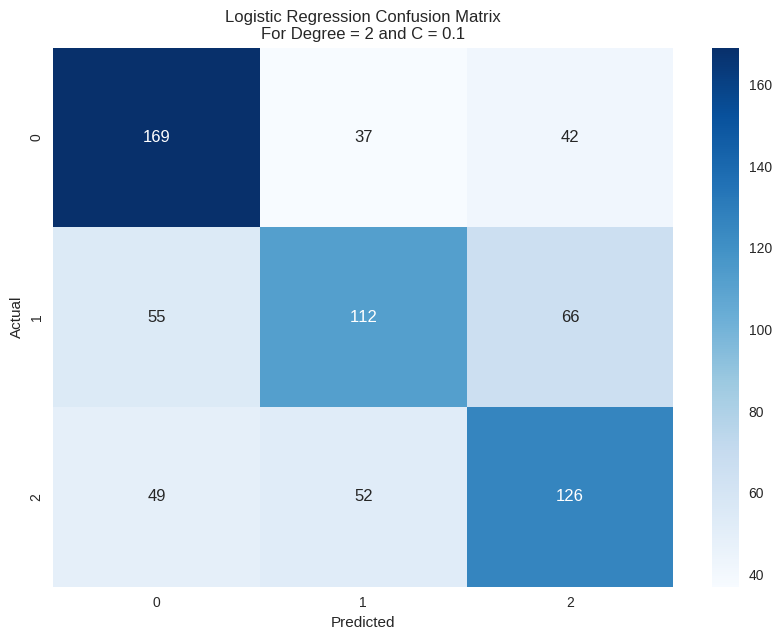

 Logistic Regression
 For Degree =  2
 For C =  1
 Confusion Matrix - 
 [[170  36  42]
 [ 53 113  67]
 [ 48  51 128]]
 Train accuracy score:  0.6467468175388967
 Test accuracy score:  0.5805084745762712
 F1 Score =  0.5781351269186893
 Mean Squared Error =  0.8008474576271186
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.69      0.66       248
           1       0.56      0.48      0.52       233
           2       0.54      0.56      0.55       227

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.58      0.58      0.58       708





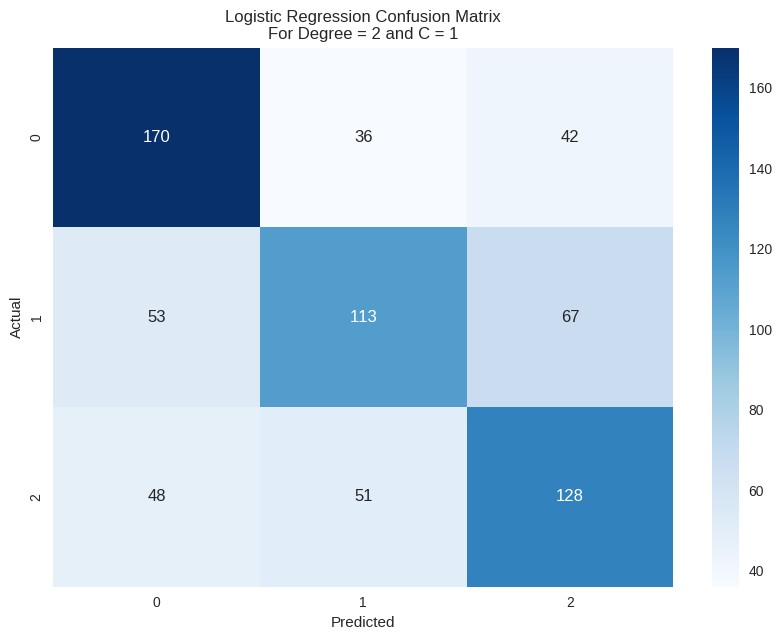

 Logistic Regression
 For Degree =  2
 For C =  10
 Confusion Matrix - 
 [[171  35  42]
 [ 53 113  67]
 [ 49  51 127]]
 Train accuracy score:  0.6488684582743989
 Test accuracy score:  0.5805084745762712
 F1 Score =  0.5779935900182043
 Mean Squared Error =  0.8050847457627118
 Classification Report
               precision    recall  f1-score   support

           0       0.63      0.69      0.66       248
           1       0.57      0.48      0.52       233
           2       0.54      0.56      0.55       227

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.58      0.58      0.58       708





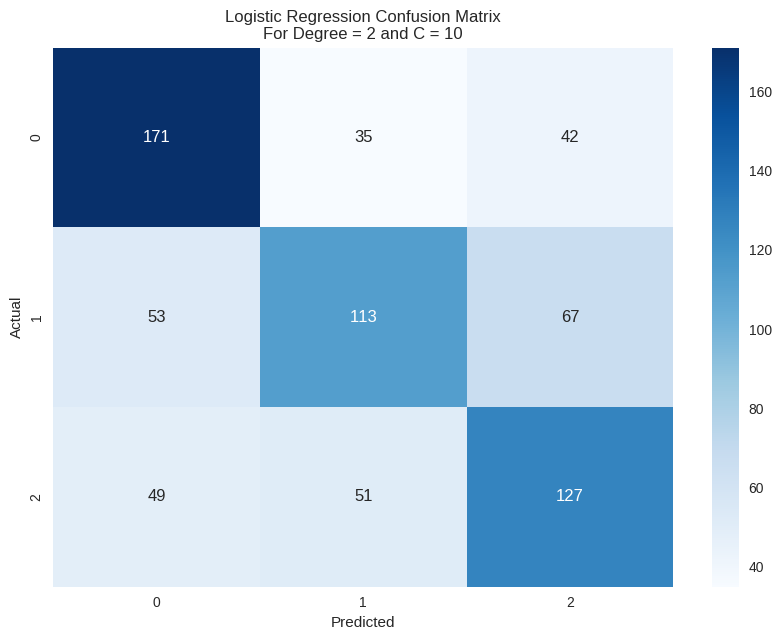

 Logistic Regression
 For Degree =  2
 For C =  100
 Confusion Matrix - 
 [[169  36  43]
 [ 56 111  66]
 [ 47  51 129]]
 Train accuracy score:  0.6492220650636492
 Test accuracy score:  0.577683615819209
 F1 Score =  0.5750880059469821
 Mean Squared Error =  0.8036723163841808
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.68      0.65       248
           1       0.56      0.48      0.52       233
           2       0.54      0.57      0.55       227

    accuracy                           0.58       708
   macro avg       0.57      0.58      0.57       708
weighted avg       0.58      0.58      0.58       708





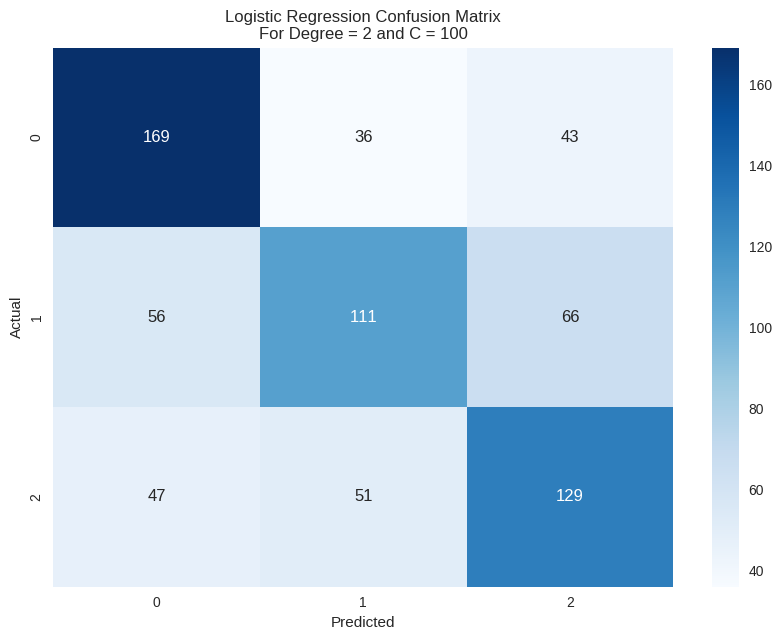

 Logistic Regression
 For Degree =  2
 For C =  1000
 Confusion Matrix - 
 [[170  35  43]
 [ 55 113  65]
 [ 49  52 126]]
 Train accuracy score:  0.6502828854314003
 Test accuracy score:  0.577683615819209
 F1 Score =  0.5751855143835625
 Mean Squared Error =  0.8121468926553672
 Classification Report
               precision    recall  f1-score   support

           0       0.62      0.69      0.65       248
           1       0.56      0.48      0.52       233
           2       0.54      0.56      0.55       227

    accuracy                           0.58       708
   macro avg       0.57      0.58      0.57       708
weighted avg       0.58      0.58      0.58       708





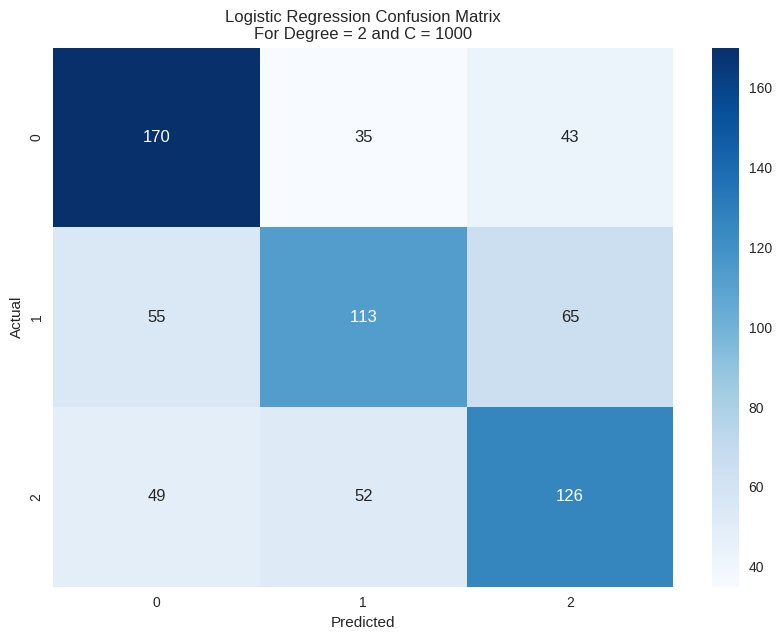

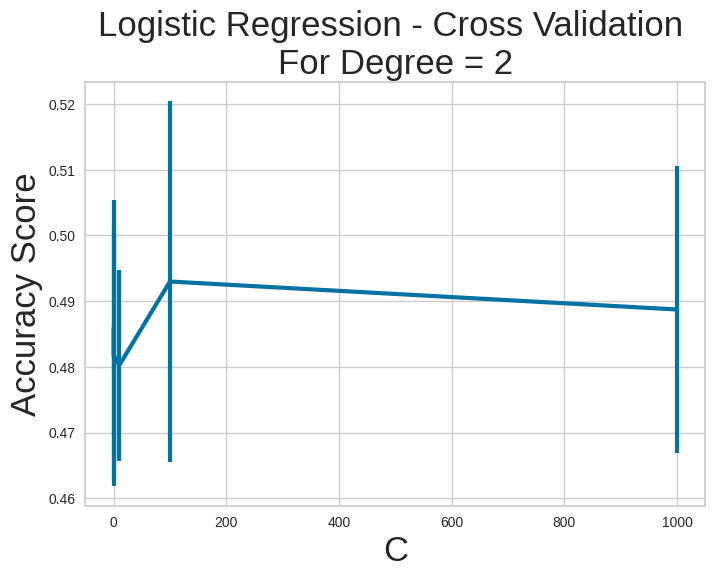

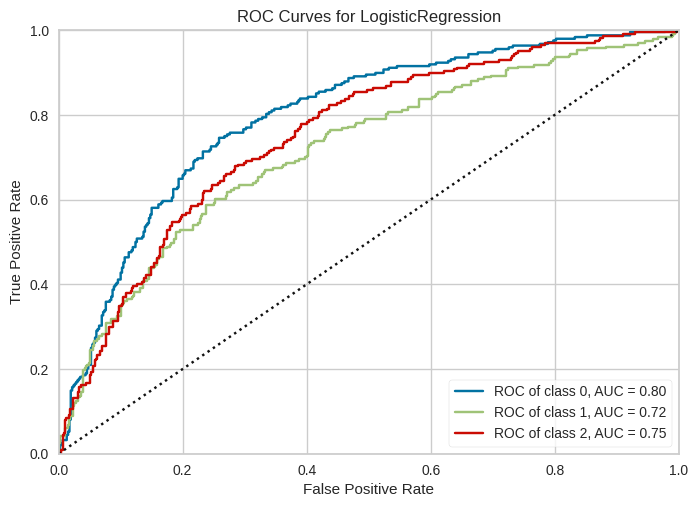

In [ ]:
evaluate_logistic_regression(X, y, c_range, degree_range, 3)

 K Neighbors Classifier
 For NN =  1
 Confusion Matrix - 
 [[103  66  79]
 [ 55 103  75]
 [ 63  72  92]]
 Train accuracy score:  1.0
 Test accuracy score:  0.4209039548022599
 F1 Score =  0.42160406871254247
 Mean Squared Error =  1.1807909604519775
 Classification Report
               precision    recall  f1-score   support

           0       0.47      0.42      0.44       248
           1       0.43      0.44      0.43       233
           2       0.37      0.41      0.39       227

    accuracy                           0.42       708
   macro avg       0.42      0.42      0.42       708
weighted avg       0.42      0.42      0.42       708





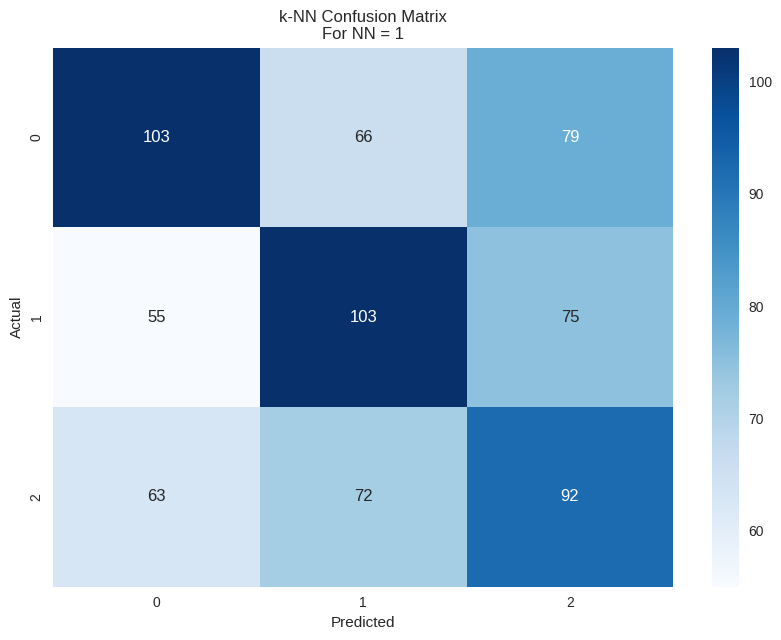

 K Neighbors Classifier
 For NN =  3
 Confusion Matrix - 
 [[143  41  64]
 [ 79  93  61]
 [ 90  53  84]]
 Train accuracy score:  0.6976661951909476
 Test accuracy score:  0.4519774011299435
 F1 Score =  0.4481790212586357
 Mean Squared Error =  1.2005649717514124
 Classification Report
               precision    recall  f1-score   support

           0       0.46      0.58      0.51       248
           1       0.50      0.40      0.44       233
           2       0.40      0.37      0.39       227

    accuracy                           0.45       708
   macro avg       0.45      0.45      0.45       708
weighted avg       0.45      0.45      0.45       708





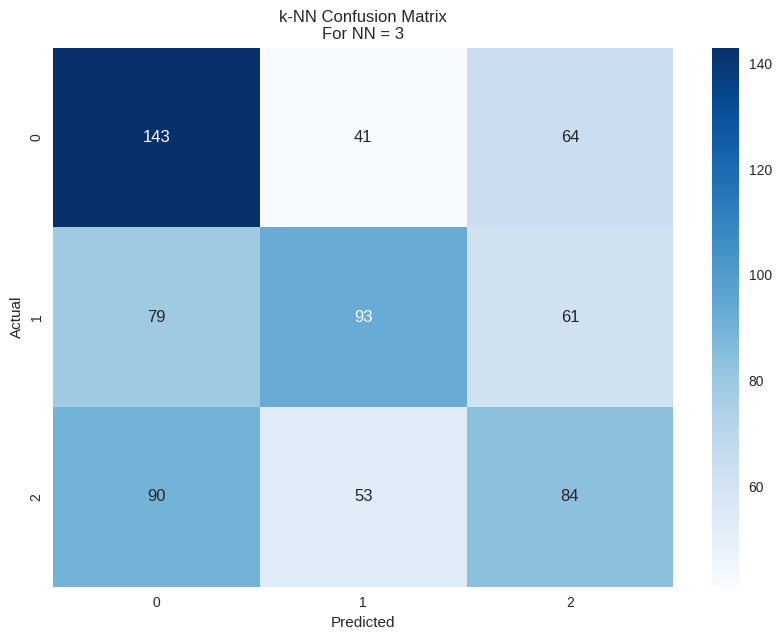

 K Neighbors Classifier
 For NN =  5
 Confusion Matrix - 
 [[141  60  47]
 [ 84 107  42]
 [ 80  68  79]]
 Train accuracy score:  0.6315417256011315
 Test accuracy score:  0.461864406779661
 F1 Score =  0.4573577417441395
 Mean Squared Error =  1.076271186440678
 Classification Report
               precision    recall  f1-score   support

           0       0.46      0.57      0.51       248
           1       0.46      0.46      0.46       233
           2       0.47      0.35      0.40       227

    accuracy                           0.46       708
   macro avg       0.46      0.46      0.46       708
weighted avg       0.46      0.46      0.46       708





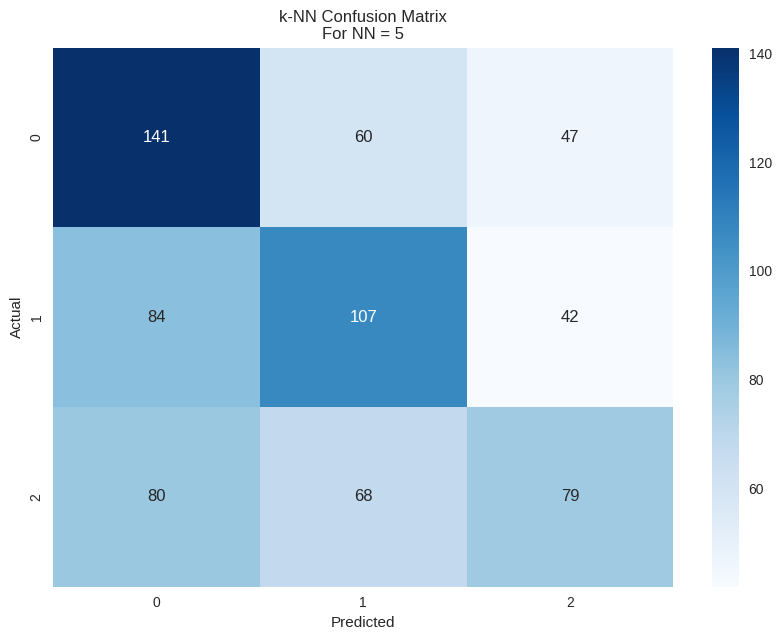

 K Neighbors Classifier
 For NN =  7
 Confusion Matrix - 
 [[123  62  63]
 [ 67 102  64]
 [ 62  77  88]]
 Train accuracy score:  0.6050212164073551
 Test accuracy score:  0.442090395480226
 F1 Score =  0.4416435328872196
 Mean Squared Error =  1.0875706214689265
 Classification Report
               precision    recall  f1-score   support

           0       0.49      0.50      0.49       248
           1       0.42      0.44      0.43       233
           2       0.41      0.39      0.40       227

    accuracy                           0.44       708
   macro avg       0.44      0.44      0.44       708
weighted avg       0.44      0.44      0.44       708





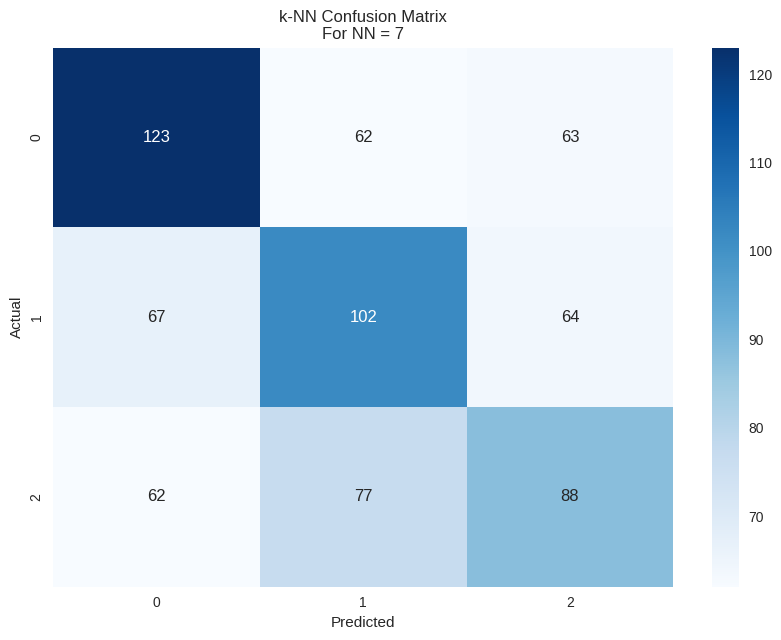

 K Neighbors Classifier
 For NN =  9
 Confusion Matrix - 
 [[120  62  66]
 [ 67 101  65]
 [ 73  75  79]]
 Train accuracy score:  0.5898161244695899
 Test accuracy score:  0.423728813559322
 F1 Score =  0.42255140400962293
 Mean Squared Error =  1.1652542372881356
 Classification Report
               precision    recall  f1-score   support

           0       0.46      0.48      0.47       248
           1       0.42      0.43      0.43       233
           2       0.38      0.35      0.36       227

    accuracy                           0.42       708
   macro avg       0.42      0.42      0.42       708
weighted avg       0.42      0.42      0.42       708





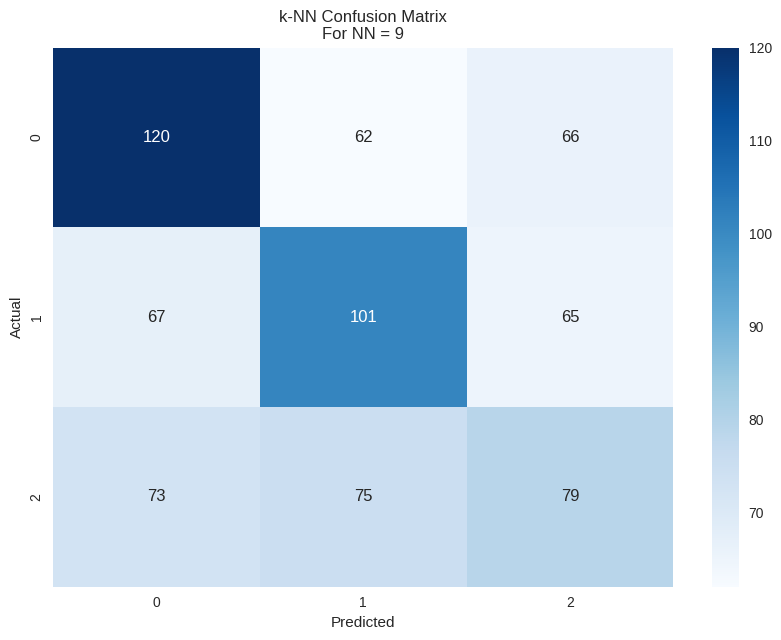

 K Neighbors Classifier
 For NN =  11
 Confusion Matrix - 
 [[132  53  63]
 [ 64 103  66]
 [ 72  65  90]]
 Train accuracy score:  0.5728429985855729
 Test accuracy score:  0.4590395480225989
 F1 Score =  0.4579386125231211
 Mean Squared Error =  1.112994350282486
 Classification Report
               precision    recall  f1-score   support

           0       0.49      0.53      0.51       248
           1       0.47      0.44      0.45       233
           2       0.41      0.40      0.40       227

    accuracy                           0.46       708
   macro avg       0.46      0.46      0.46       708
weighted avg       0.46      0.46      0.46       708





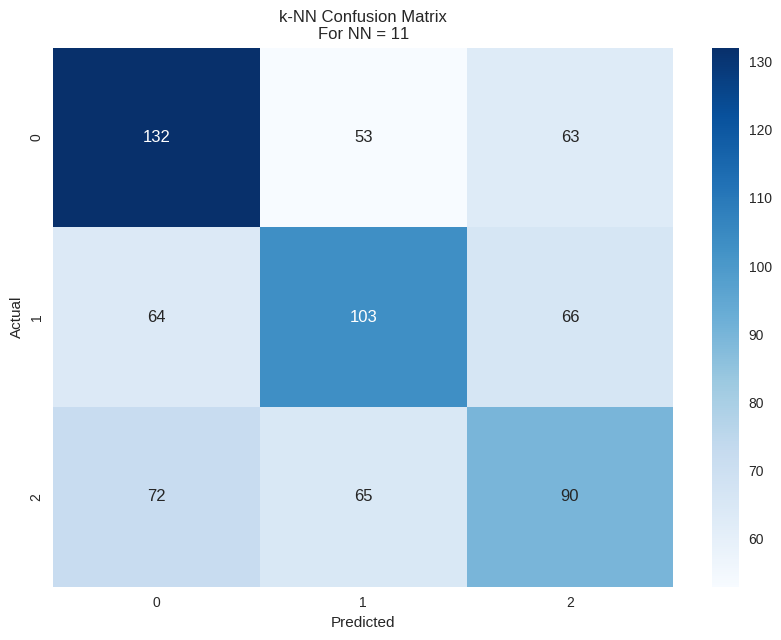

 K Neighbors Classifier
 For NN =  13
 Confusion Matrix - 
 [[125  50  73]
 [ 57 105  71]
 [ 70  72  85]]
 Train accuracy score:  0.5625884016973126
 Test accuracy score:  0.4449152542372881
 F1 Score =  0.44491067542351337
 Mean Squared Error =  1.1610169491525424
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.50      0.50       248
           1       0.46      0.45      0.46       233
           2       0.37      0.37      0.37       227

    accuracy                           0.44       708
   macro avg       0.44      0.44      0.44       708
weighted avg       0.44      0.44      0.44       708





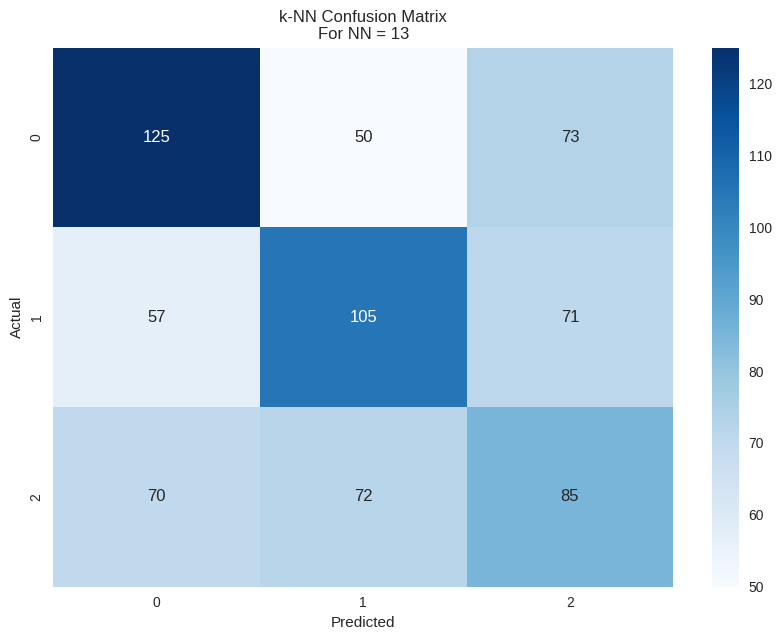

 K Neighbors Classifier
 For NN =  15
 Confusion Matrix - 
 [[127  51  70]
 [ 53 114  66]
 [ 67  74  86]]
 Train accuracy score:  0.559052333804809
 Test accuracy score:  0.461864406779661
 F1 Score =  0.4615326226777414
 Mean Squared Error =  1.11864406779661
 Classification Report
               precision    recall  f1-score   support

           0       0.51      0.51      0.51       248
           1       0.48      0.49      0.48       233
           2       0.39      0.38      0.38       227

    accuracy                           0.46       708
   macro avg       0.46      0.46      0.46       708
weighted avg       0.46      0.46      0.46       708





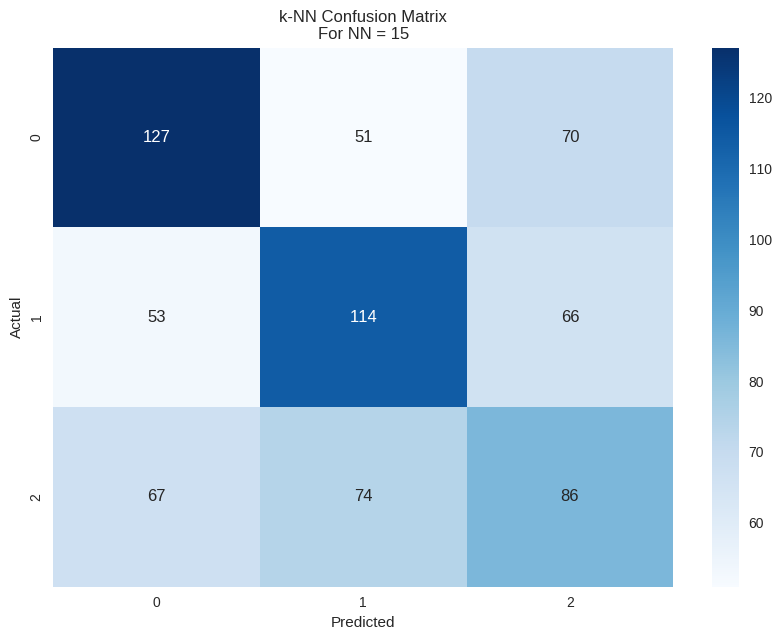

 K Neighbors Classifier
 For NN =  17
 Confusion Matrix - 
 [[120  56  72]
 [ 59 107  67]
 [ 71  76  80]]
 Train accuracy score:  0.5477369165487977
 Test accuracy score:  0.4336158192090395
 F1 Score =  0.43304079149167585
 Mean Squared Error =  1.1723163841807909
 Classification Report
               precision    recall  f1-score   support

           0       0.48      0.48      0.48       248
           1       0.45      0.46      0.45       233
           2       0.37      0.35      0.36       227

    accuracy                           0.43       708
   macro avg       0.43      0.43      0.43       708
weighted avg       0.43      0.43      0.43       708





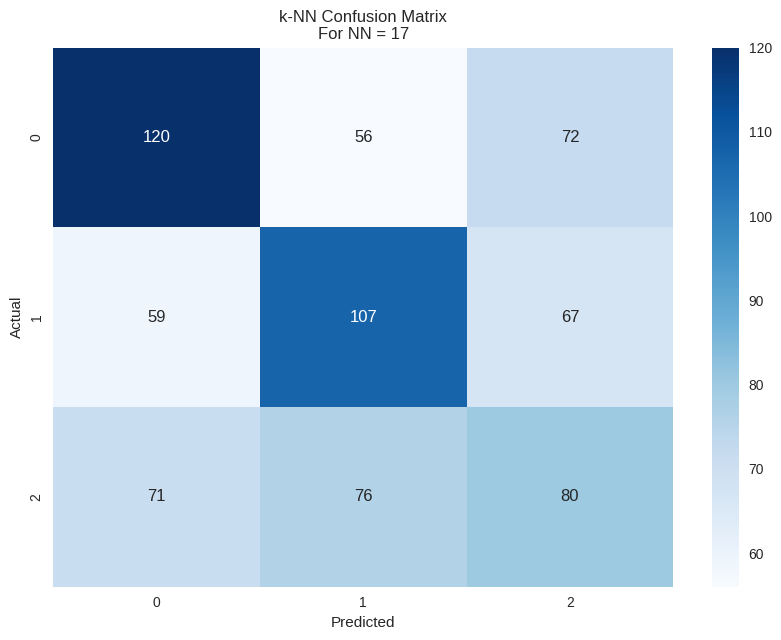

 K Neighbors Classifier
 For NN =  19
 Confusion Matrix - 
 [[122  56  70]
 [ 54 113  66]
 [ 66  73  88]]
 Train accuracy score:  0.5339462517680339
 Test accuracy score:  0.4562146892655367
 F1 Score =  0.4561273880975989
 Mean Squared Error =  1.1200564971751412
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.49      0.50       248
           1       0.47      0.48      0.48       233
           2       0.39      0.39      0.39       227

    accuracy                           0.46       708
   macro avg       0.45      0.45      0.45       708
weighted avg       0.46      0.46      0.46       708





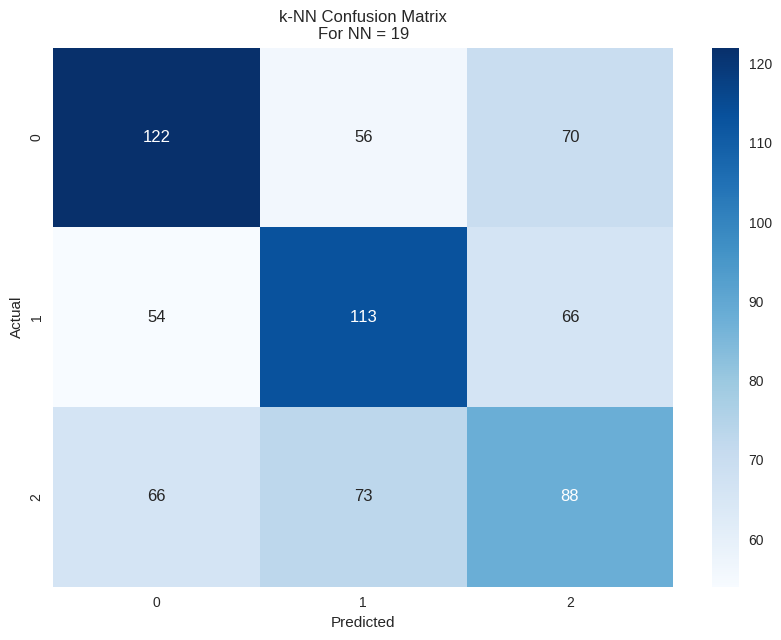

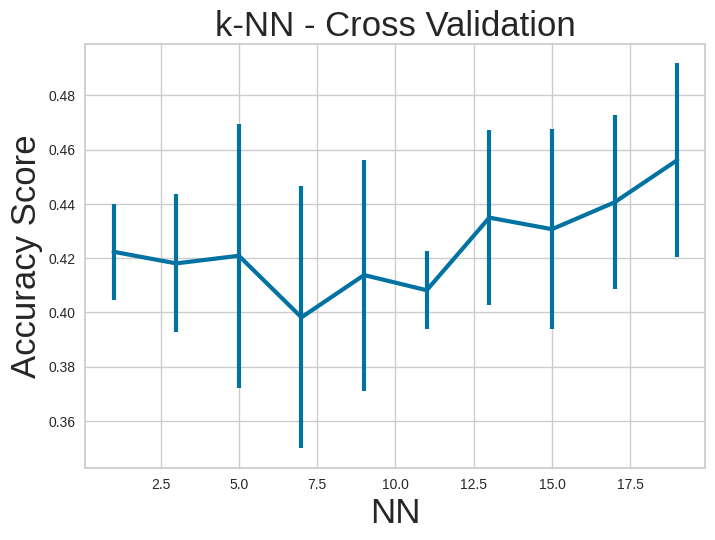

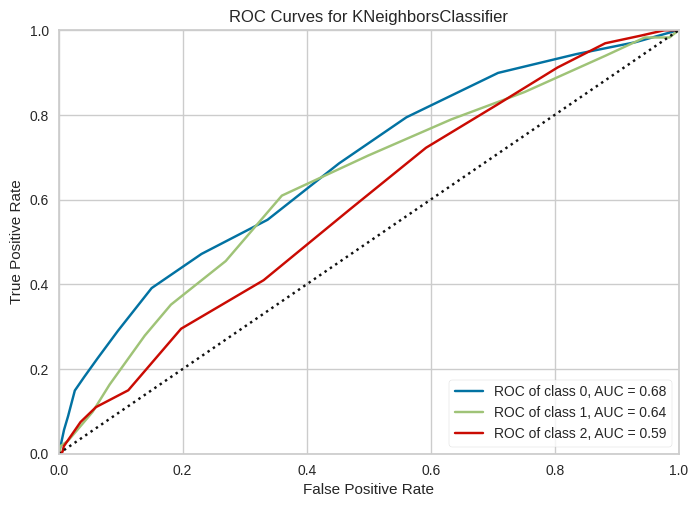

In [ ]:
evaluate_knn(X, y, nn_range, 3)

 Decision Tree Classifier
 For Depth =  3
 Confusion Matrix - 
 [[121  64  63]
 [ 47 148  38]
 [ 31  97  99]]
 Train accuracy score:  0.5611739745403111
 Test accuracy score:  0.519774011299435
 F1 Score =  0.5180383725096406
 Mean Squared Error =  0.8785310734463276
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.49      0.54       248
           1       0.48      0.64      0.55       233
           2       0.49      0.44      0.46       227

    accuracy                           0.52       708
   macro avg       0.53      0.52      0.52       708
weighted avg       0.53      0.52      0.52       708





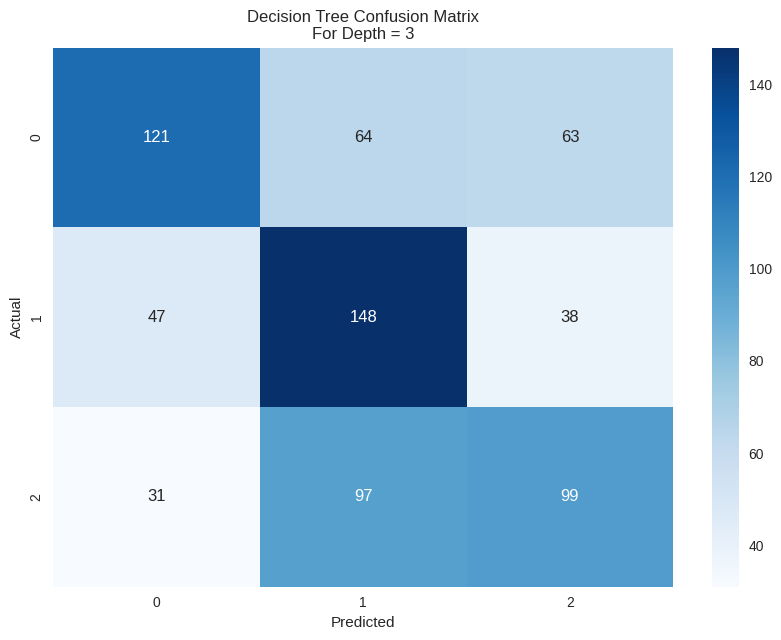

 Decision Tree Classifier
 For Depth =  5
 Confusion Matrix - 
 [[129  45  74]
 [ 43 112  78]
 [ 23  69 135]]
 Train accuracy score:  0.6276520509193777
 Test accuracy score:  0.5310734463276836
 F1 Score =  0.5330264332150332
 Mean Squared Error =  0.8799435028248588
 Classification Report
               precision    recall  f1-score   support

           0       0.66      0.52      0.58       248
           1       0.50      0.48      0.49       233
           2       0.47      0.59      0.53       227

    accuracy                           0.53       708
   macro avg       0.54      0.53      0.53       708
weighted avg       0.55      0.53      0.53       708





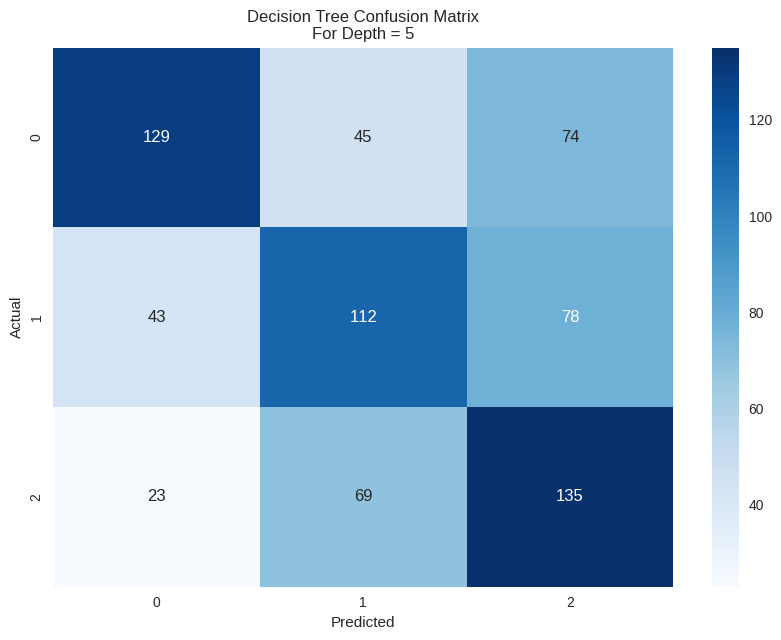

 Decision Tree Classifier
 For Depth =  7
 Confusion Matrix - 
 [[165  39  44]
 [ 68 117  48]
 [ 40  80 107]]
 Train accuracy score:  0.7121640735502122
 Test accuracy score:  0.5494350282485876
 F1 Score =  0.5471285262516077
 Mean Squared Error =  0.806497175141243
 Classification Report
               precision    recall  f1-score   support

           0       0.60      0.67      0.63       248
           1       0.50      0.50      0.50       233
           2       0.54      0.47      0.50       227

    accuracy                           0.55       708
   macro avg       0.55      0.55      0.54       708
weighted avg       0.55      0.55      0.55       708





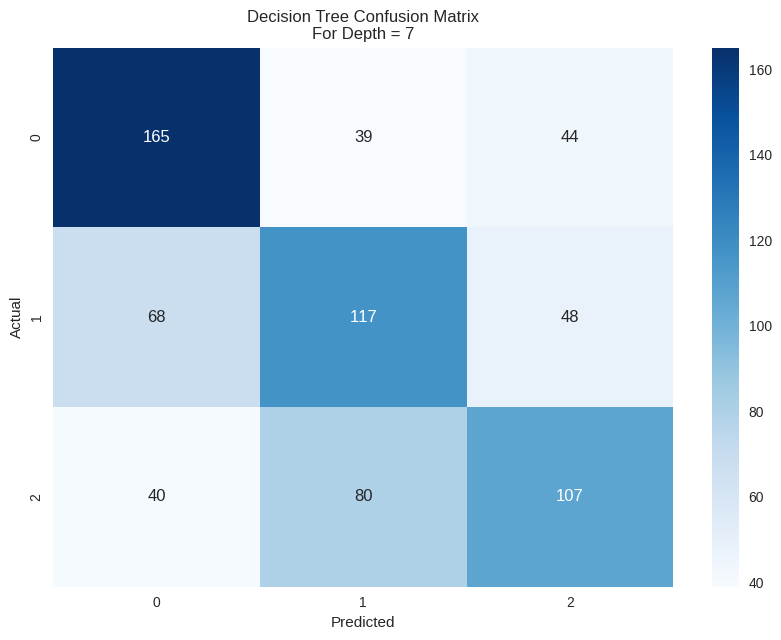

 Decision Tree Classifier
 For Depth =  9
 Confusion Matrix - 
 [[158  36  54]
 [ 75 101  57]
 [ 42  65 120]]
 Train accuracy score:  0.7980905233380481
 Test accuracy score:  0.5353107344632768
 F1 Score =  0.5324758170226288
 Mean Squared Error =  0.8714689265536724
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.64      0.60       248
           1       0.50      0.43      0.46       233
           2       0.52      0.53      0.52       227

    accuracy                           0.54       708
   macro avg       0.53      0.53      0.53       708
weighted avg       0.53      0.54      0.53       708





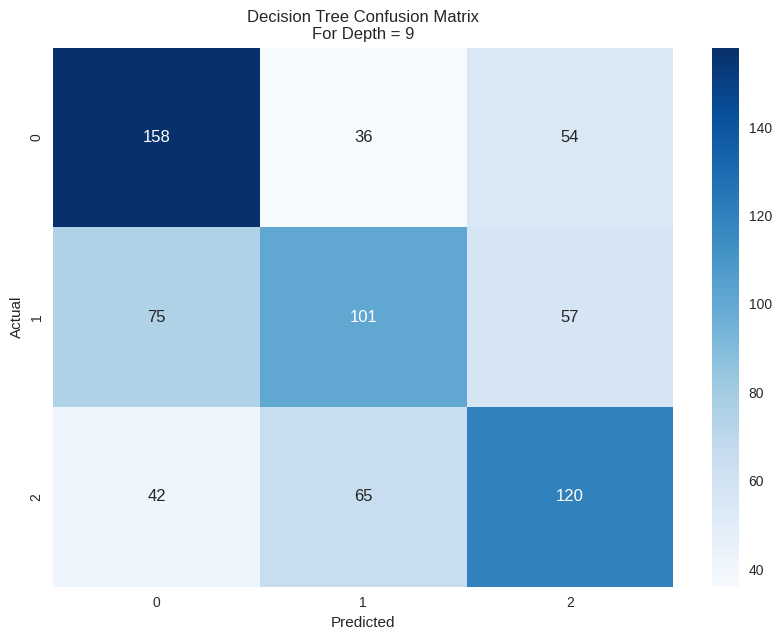

 Decision Tree Classifier
 For Depth =  11
 Confusion Matrix - 
 [[146  48  54]
 [ 67 108  58]
 [ 37  68 122]]
 Train accuracy score:  0.8974540311173974
 Test accuracy score:  0.5310734463276836
 F1 Score =  0.5306328738733035
 Mean Squared Error =  0.8545197740112994
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.59      0.59       248
           1       0.48      0.46      0.47       233
           2       0.52      0.54      0.53       227

    accuracy                           0.53       708
   macro avg       0.53      0.53      0.53       708
weighted avg       0.53      0.53      0.53       708





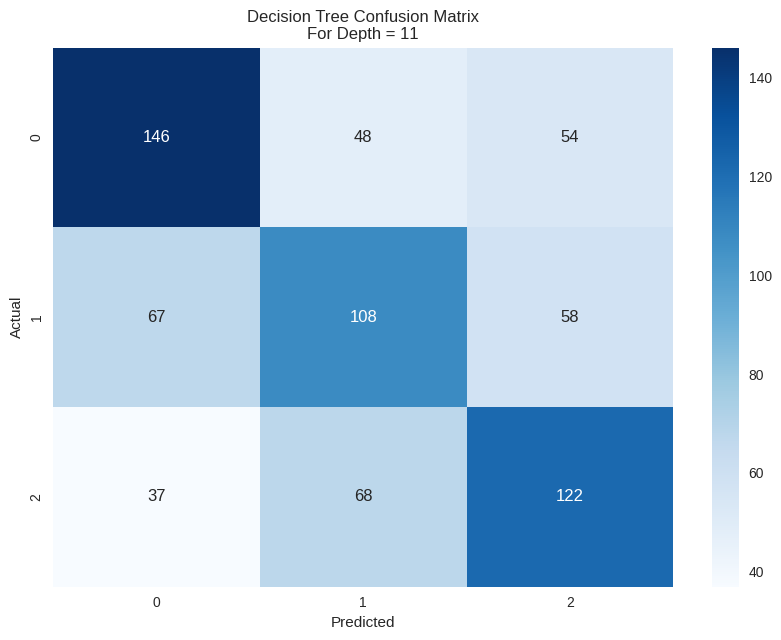

 Decision Tree Classifier
 For Depth =  13
 Confusion Matrix - 
 [[132  49  67]
 [ 59  99  75]
 [ 34  67 126]]
 Train accuracy score:  0.954031117397454
 Test accuracy score:  0.5042372881355932
 F1 Score =  0.5041806773816776
 Mean Squared Error =  0.923728813559322
 Classification Report
               precision    recall  f1-score   support

           0       0.59      0.53      0.56       248
           1       0.46      0.42      0.44       233
           2       0.47      0.56      0.51       227

    accuracy                           0.50       708
   macro avg       0.51      0.50      0.50       708
weighted avg       0.51      0.50      0.50       708





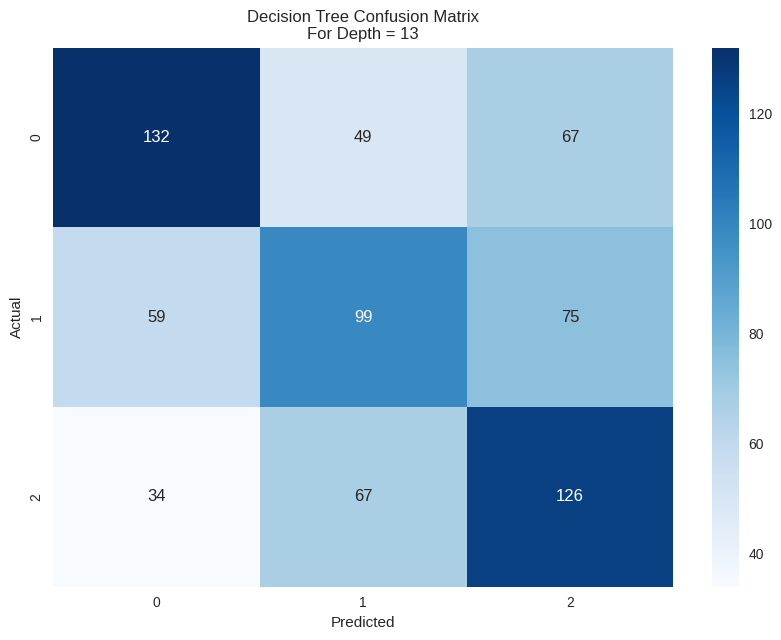

 Decision Tree Classifier
 For Depth =  15
 Confusion Matrix - 
 [[131  56  61]
 [ 58 109  66]
 [ 35  72 120]]
 Train accuracy score:  0.9823196605374823
 Test accuracy score:  0.5084745762711864
 F1 Score =  0.5094209975076892
 Mean Squared Error =  0.8983050847457628
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.53      0.56       248
           1       0.46      0.47      0.46       233
           2       0.49      0.53      0.51       227

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





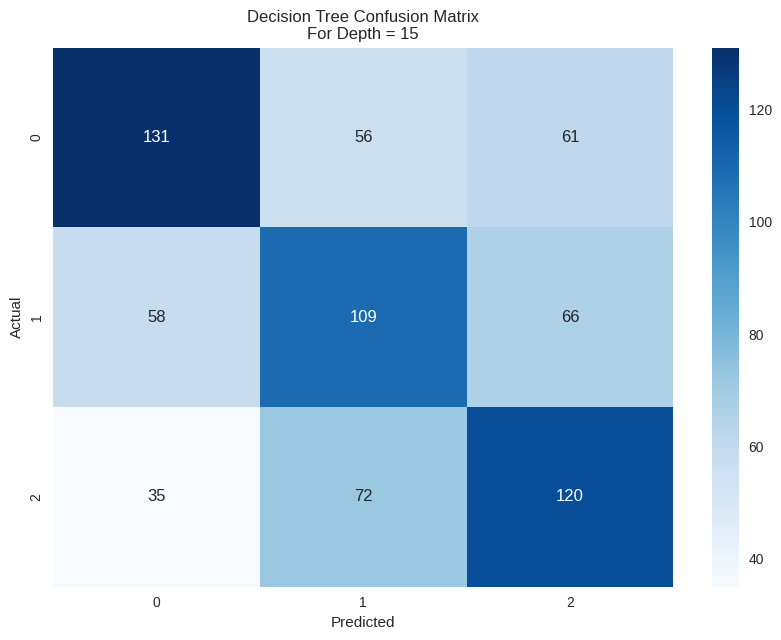

 Decision Tree Classifier
 For Depth =  17
 Confusion Matrix - 
 [[138  53  57]
 [ 63 107  63]
 [ 41  68 118]]
 Train accuracy score:  0.9900990099009901
 Test accuracy score:  0.5127118644067796
 F1 Score =  0.5127950828761021
 Mean Squared Error =  0.902542372881356
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.56      0.56       248
           1       0.47      0.46      0.46       233
           2       0.50      0.52      0.51       227

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





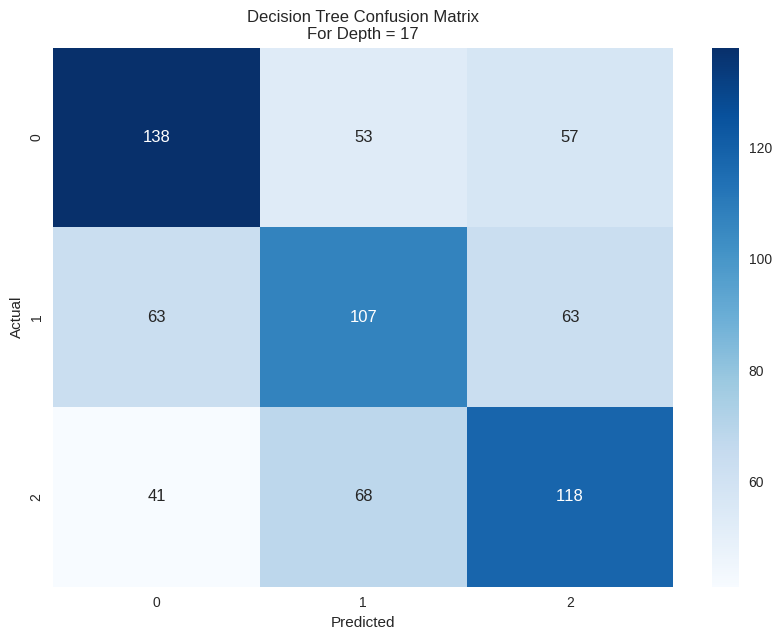

 Decision Tree Classifier
 For Depth =  19
 Confusion Matrix - 
 [[137  47  64]
 [ 60  98  75]
 [ 40  70 117]]
 Train accuracy score:  0.9964639321074965
 Test accuracy score:  0.4971751412429379
 F1 Score =  0.4972032087208311
 Mean Squared Error =  0.943502824858757
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.55      0.56       248
           1       0.46      0.42      0.44       233
           2       0.46      0.52      0.48       227

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.50      0.50      0.50       708





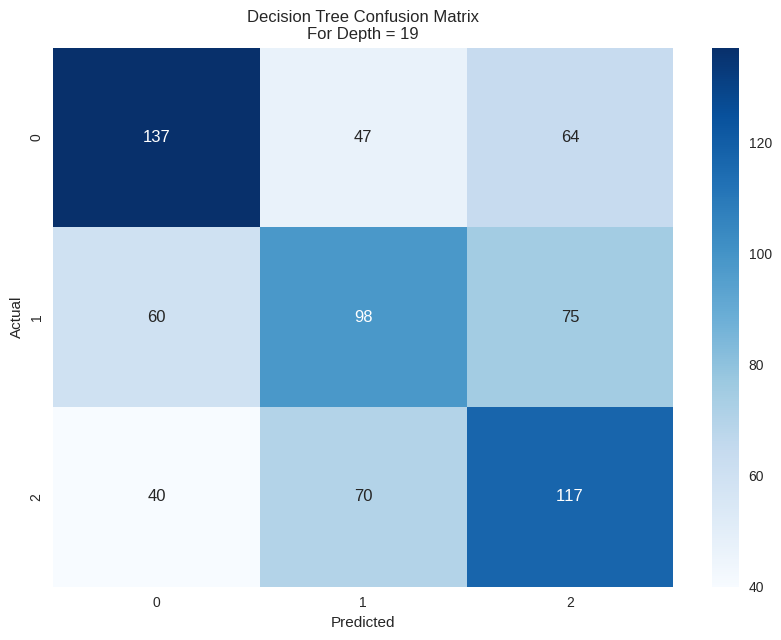

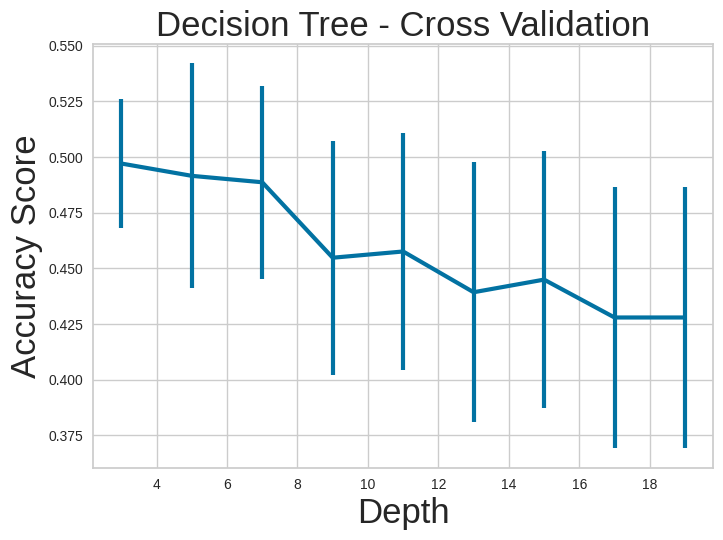

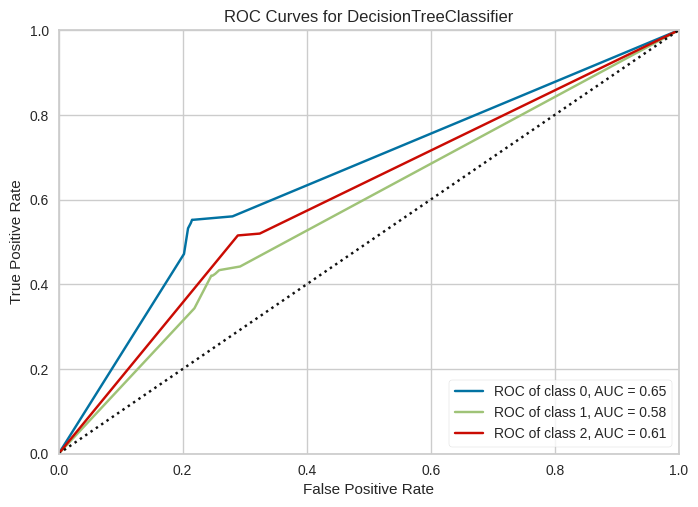

In [ ]:
evaluate_decision_tree(X, y, depth_range, 3)

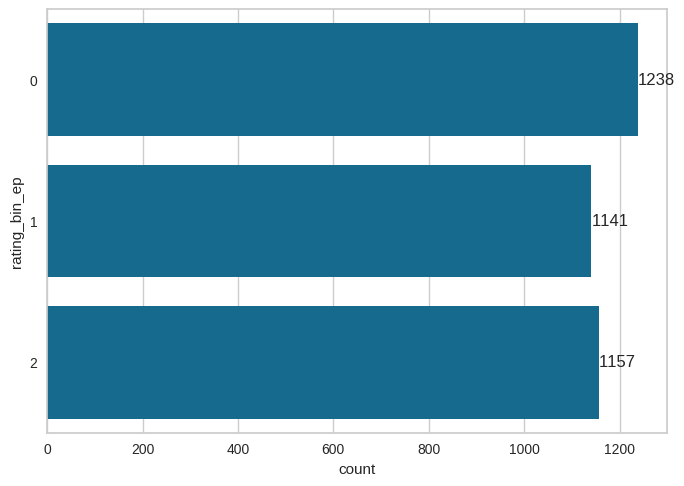

In [45]:
X,y = bin_column(listings, 'review_scores_accuracy', 3)
check_bins(y)

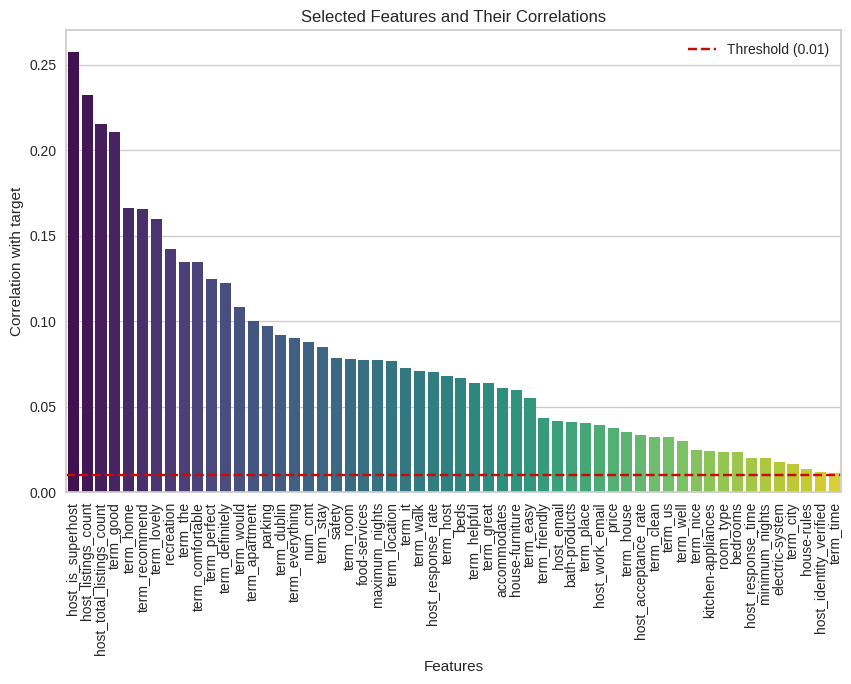

(Index(['host_is_superhost', 'host_listings_count', 'host_total_listings_count',
        'term_good', 'term_home', 'term_recommend', 'term_lovely', 'recreation',
        'term_the', 'term_comfortable', 'term_perfect', 'term_definitely',
        'term_would', 'term_apartment', 'parking', 'term_dublin',
        'term_everything', 'num_cmt', 'term_stay', 'safety', 'term_room',
        'food-services', 'maximum_nights', 'term_location', 'term_it',
        'term_walk', 'host_response_rate', 'term_host', 'beds', 'term_helpful',
        'term_great', 'accommodates', 'house-furniture', 'term_easy',
        'term_friendly', 'host_email', 'bath-products', 'term_place',
        'host_work_email', 'price', 'term_house', 'host_acceptance_rate',
        'term_clean', 'term_us', 'term_well', 'term_nice', 'kitchen-appliances',
        'room_type', 'bedrooms', 'host_response_time', 'minimum_nights',
        'electric-system', 'term_city', 'house-rules', 'host_identity_verified',
        'term_time'],
 

In [46]:
yy = listings['review_scores_accuracy']
select_important_features(X, yy, threshold=0.01)

 Logistic Regression
 For Degree =  1
 For C =  0.001
 Confusion Matrix - 
 [[147  22  81]
 [ 64  92  85]
 [ 49  33 135]]
 Train accuracy score:  0.553041018387553
 Test accuracy score:  0.5282485875706214
 F1 Score =  0.524737874238342
 Mean Squared Error =  1.0225988700564972
 Classification Report
               precision    recall  f1-score   support

           0       0.57      0.59      0.58       250
           1       0.63      0.38      0.47       241
           2       0.45      0.62      0.52       217

    accuracy                           0.53       708
   macro avg       0.55      0.53      0.52       708
weighted avg       0.55      0.53      0.52       708





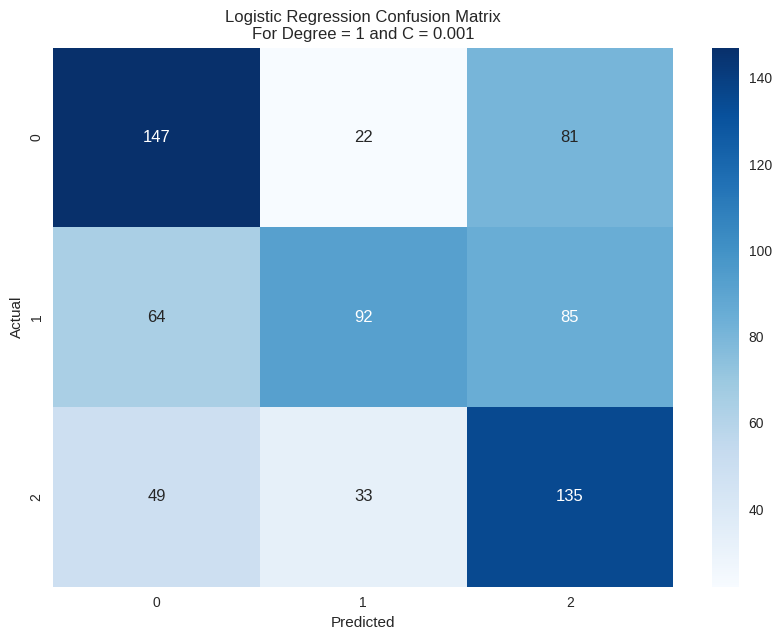

 Logistic Regression
 For Degree =  1
 For C =  0.1
 Confusion Matrix - 
 [[189  22  39]
 [ 75 108  58]
 [ 58  50 109]]
 Train accuracy score:  0.5792079207920792
 Test accuracy score:  0.5734463276836158
 F1 Score =  0.5659502282955192
 Mean Squared Error =  0.8375706214689266
 Classification Report
               precision    recall  f1-score   support

           0       0.59      0.76      0.66       250
           1       0.60      0.45      0.51       241
           2       0.53      0.50      0.52       217

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.56       708
weighted avg       0.57      0.57      0.57       708





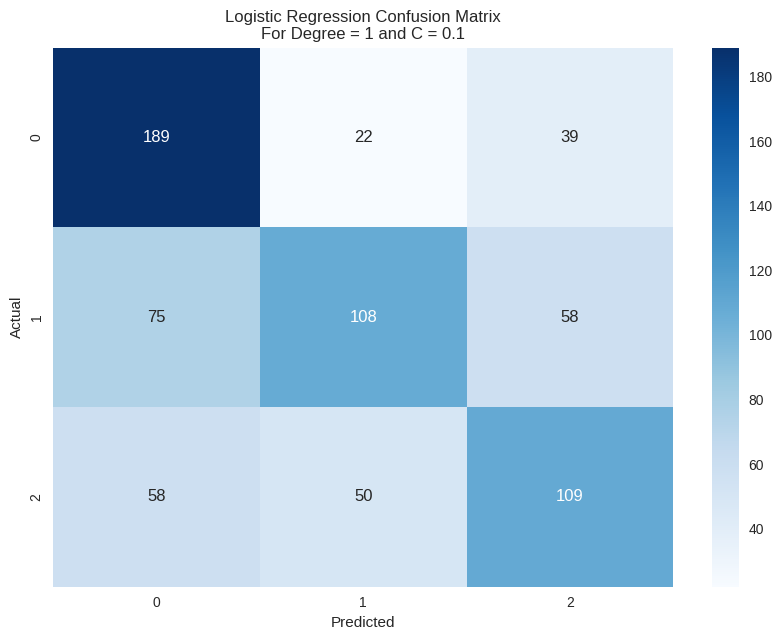

 Logistic Regression
 For Degree =  1
 For C =  1
 Confusion Matrix - 
 [[189  22  39]
 [ 70 116  55]
 [ 53  55 109]]
 Train accuracy score:  0.5933521923620934
 Test accuracy score:  0.5847457627118644
 F1 Score =  0.578548435894155
 Mean Squared Error =  0.8050847457627118
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.76      0.67       250
           1       0.60      0.48      0.53       241
           2       0.54      0.50      0.52       217

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.58       708
weighted avg       0.58      0.58      0.58       708





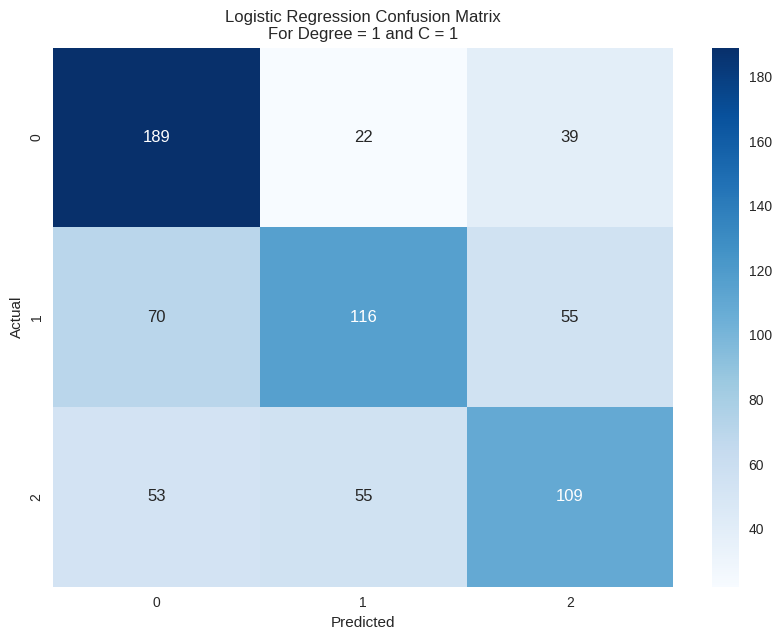

 Logistic Regression
 For Degree =  1
 For C =  10
 Confusion Matrix - 
 [[186  23  41]
 [ 71 120  50]
 [ 49  56 112]]
 Train accuracy score:  0.5986562942008486
 Test accuracy score:  0.5903954802259888
 F1 Score =  0.5853870986415799
 Mean Squared Error =  0.7909604519774012
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.74      0.67       250
           1       0.60      0.50      0.55       241
           2       0.55      0.52      0.53       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.58       708
weighted avg       0.59      0.59      0.59       708





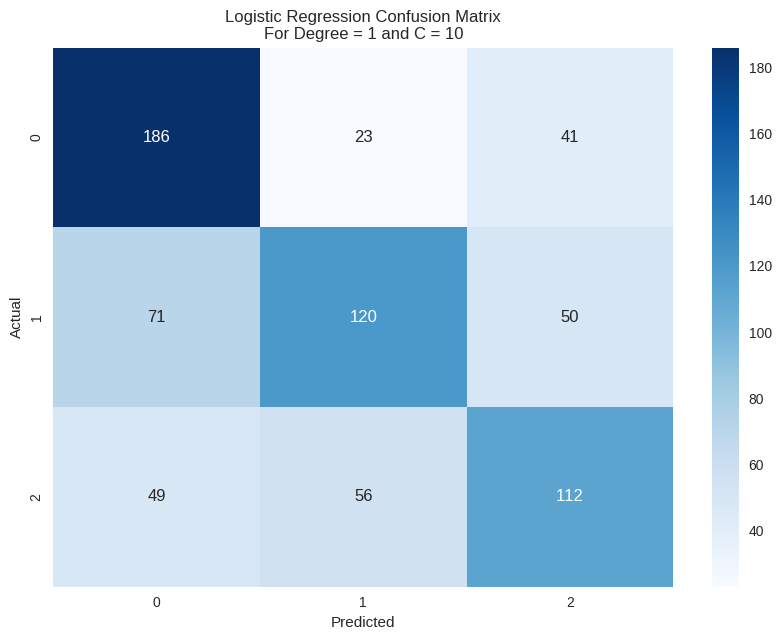

 Logistic Regression
 For Degree =  1
 For C =  100
 Confusion Matrix - 
 [[186  23  41]
 [ 71 120  50]
 [ 49  56 112]]
 Train accuracy score:  0.5983026874115983
 Test accuracy score:  0.5903954802259888
 F1 Score =  0.5853870986415799
 Mean Squared Error =  0.7909604519774012
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.74      0.67       250
           1       0.60      0.50      0.55       241
           2       0.55      0.52      0.53       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.58       708
weighted avg       0.59      0.59      0.59       708





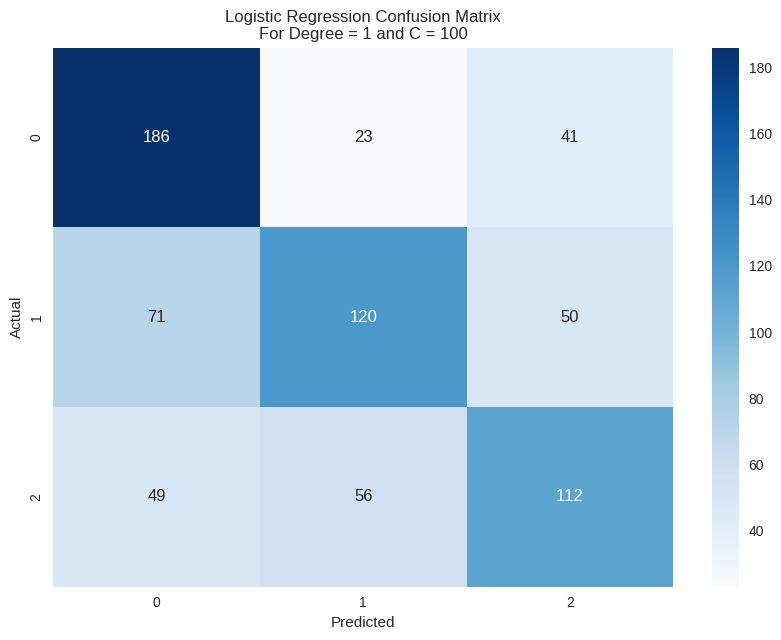

 Logistic Regression
 For Degree =  1
 For C =  1000
 Confusion Matrix - 
 [[186  23  41]
 [ 71 120  50]
 [ 49  56 112]]
 Train accuracy score:  0.5983026874115983
 Test accuracy score:  0.5903954802259888
 F1 Score =  0.5853870986415799
 Mean Squared Error =  0.7909604519774012
 Classification Report
               precision    recall  f1-score   support

           0       0.61      0.74      0.67       250
           1       0.60      0.50      0.55       241
           2       0.55      0.52      0.53       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.58       708
weighted avg       0.59      0.59      0.59       708





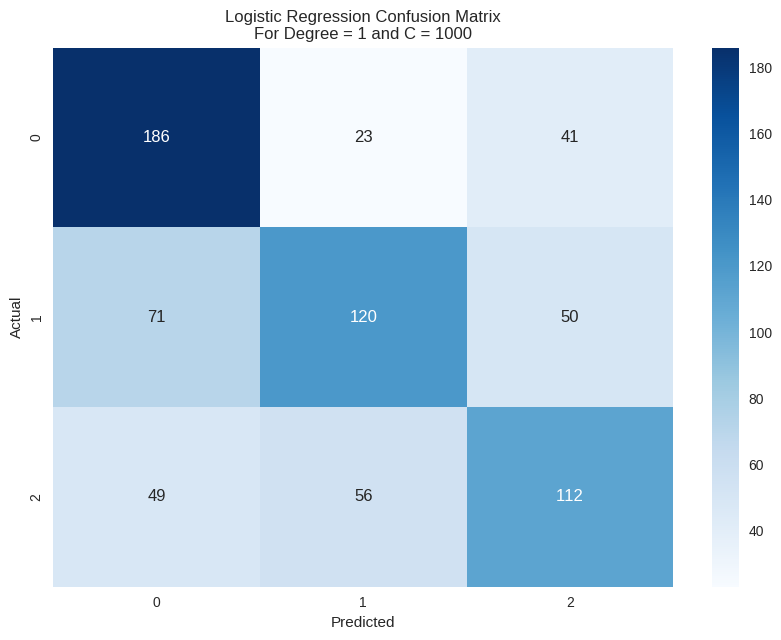

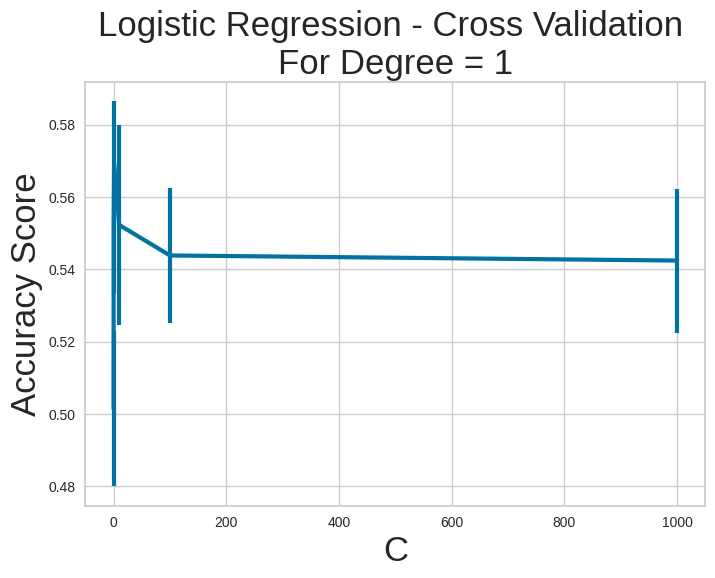

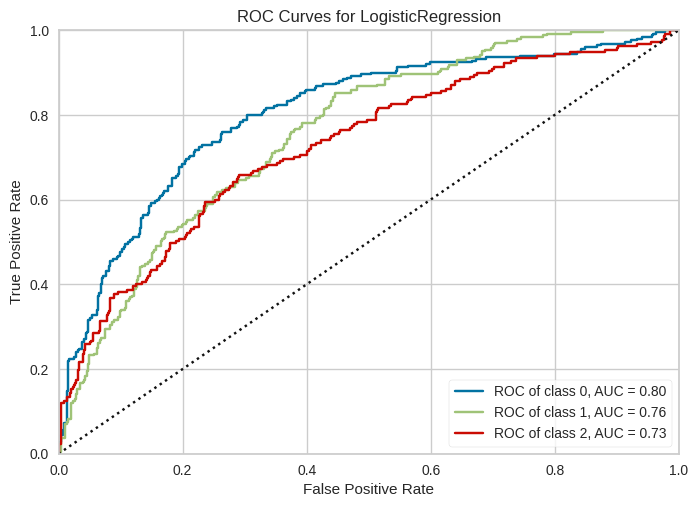

 Logistic Regression
 For Degree =  2
 For C =  0.001
 Confusion Matrix - 
 [[173  26  51]
 [ 55 121  65]
 [ 41  54 122]]
 Train accuracy score:  0.6545261669024045
 Test accuracy score:  0.5875706214689266
 F1 Score =  0.5861385927687025
 Mean Squared Error =  0.8022598870056498
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.69      0.67       250
           1       0.60      0.50      0.55       241
           2       0.51      0.56      0.54       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.58       708
weighted avg       0.59      0.59      0.59       708





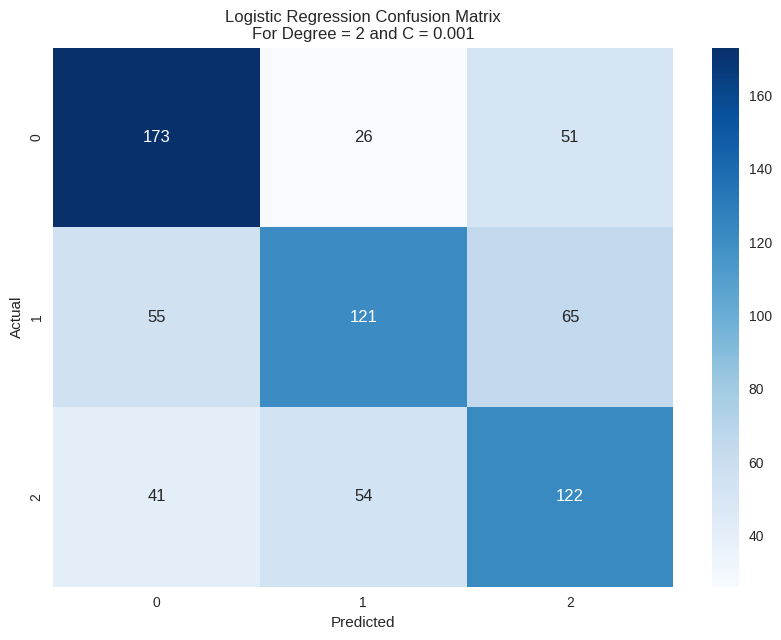

 Logistic Regression
 For Degree =  2
 For C =  0.1
 Confusion Matrix - 
 [[173  28  49]
 [ 55 122  64]
 [ 39  53 125]]
 Train accuracy score:  0.6545261669024045
 Test accuracy score:  0.5932203389830508
 F1 Score =  0.5917847777746803
 Mean Squared Error =  0.7796610169491526
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.69      0.67       250
           1       0.60      0.51      0.55       241
           2       0.53      0.58      0.55       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.59      0.59       708





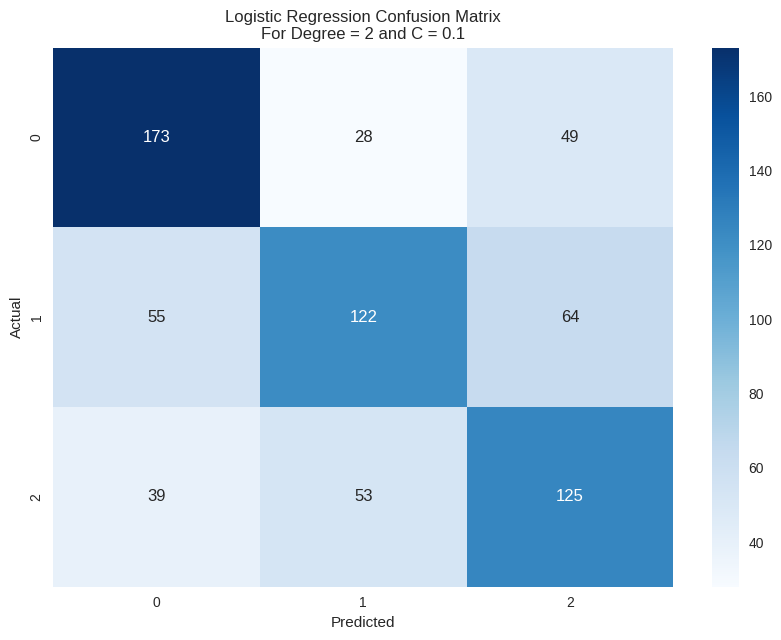

 Logistic Regression
 For Degree =  2
 For C =  1
 Confusion Matrix - 
 [[173  26  51]
 [ 55 121  65]
 [ 40  52 125]]
 Train accuracy score:  0.6545261669024045
 Test accuracy score:  0.5918079096045198
 F1 Score =  0.5903788116494431
 Mean Squared Error =  0.7937853107344632
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.69      0.67       250
           1       0.61      0.50      0.55       241
           2       0.52      0.58      0.55       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.59      0.59       708





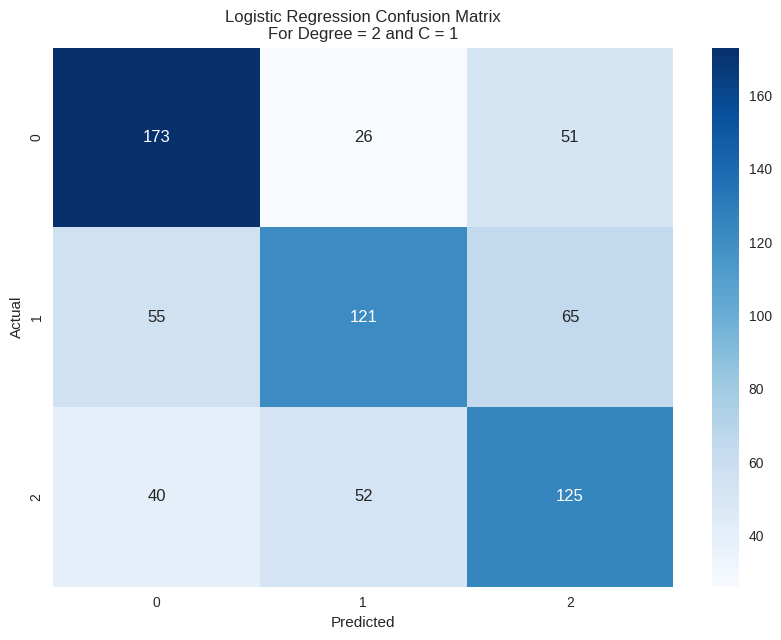

 Logistic Regression
 For Degree =  2
 For C =  10
 Confusion Matrix - 
 [[173  27  50]
 [ 54 122  65]
 [ 39  53 125]]
 Train accuracy score:  0.6541725601131542
 Test accuracy score:  0.5932203389830508
 F1 Score =  0.5919280180633911
 Mean Squared Error =  0.7838983050847458
 Classification Report
               precision    recall  f1-score   support

           0       0.65      0.69      0.67       250
           1       0.60      0.51      0.55       241
           2       0.52      0.58      0.55       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.59      0.59       708





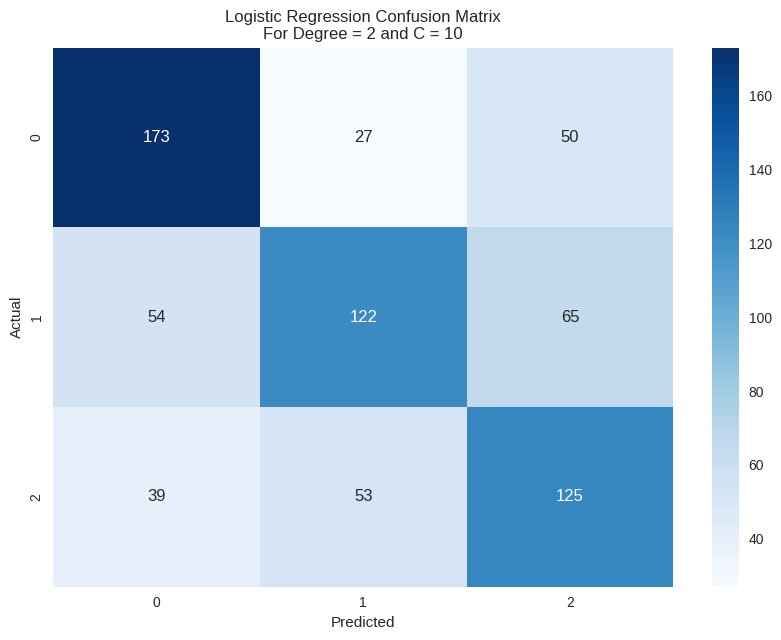

 Logistic Regression
 For Degree =  2
 For C =  100
 Confusion Matrix - 
 [[173  26  51]
 [ 55 121  65]
 [ 41  53 123]]
 Train accuracy score:  0.655940594059406
 Test accuracy score:  0.5889830508474576
 F1 Score =  0.5875450413092187
 Mean Squared Error =  0.8008474576271186
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.69      0.67       250
           1       0.60      0.50      0.55       241
           2       0.51      0.57      0.54       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.58       708
weighted avg       0.59      0.59      0.59       708





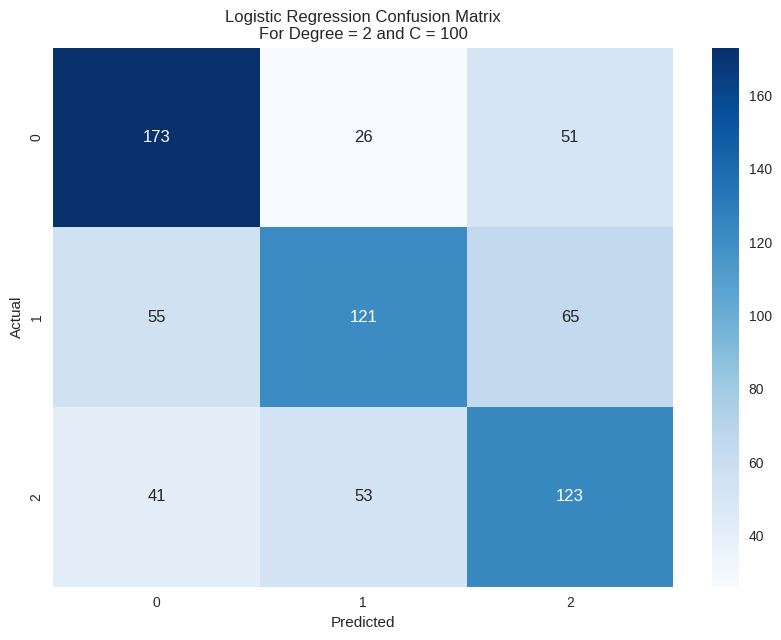

 Logistic Regression
 For Degree =  2
 For C =  1000
 Confusion Matrix - 
 [[173  26  51]
 [ 55 121  65]
 [ 41  52 124]]
 Train accuracy score:  0.6513437057991514
 Test accuracy score:  0.5903954802259888
 F1 Score =  0.5889491051523281
 Mean Squared Error =  0.7994350282485876
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.69      0.67       250
           1       0.61      0.50      0.55       241
           2       0.52      0.57      0.54       217

    accuracy                           0.59       708
   macro avg       0.59      0.59      0.59       708
weighted avg       0.59      0.59      0.59       708





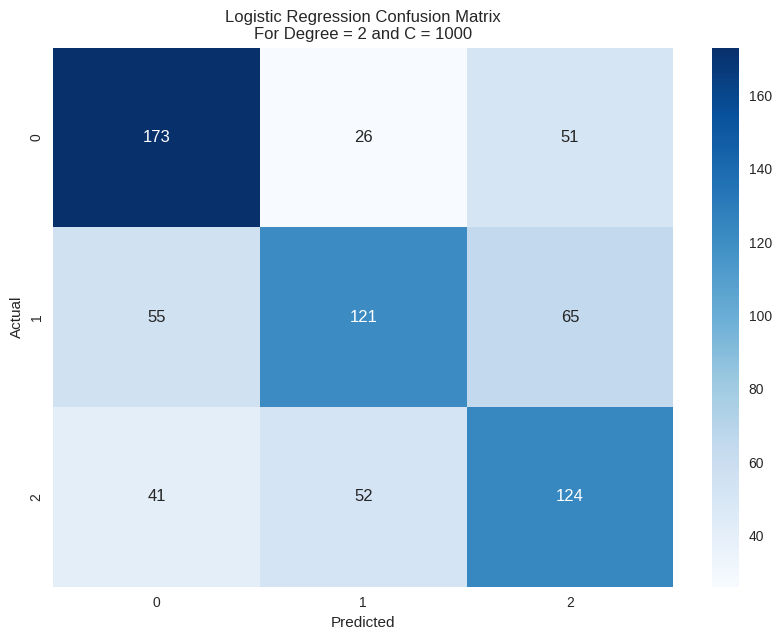

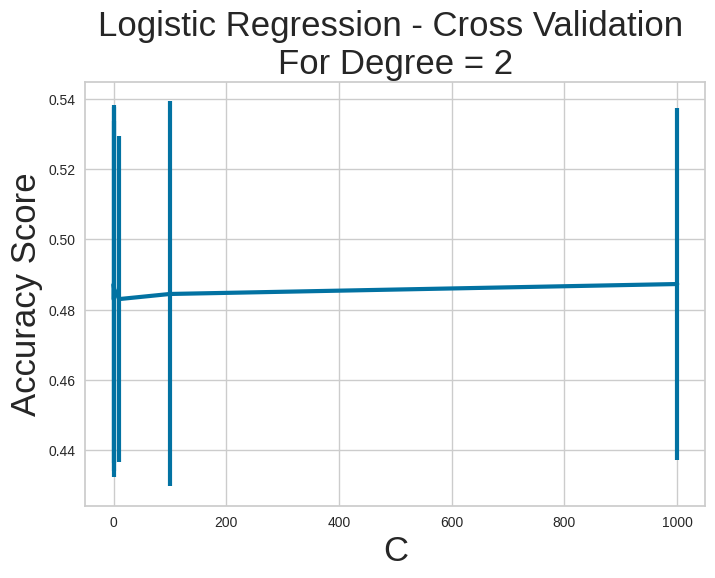

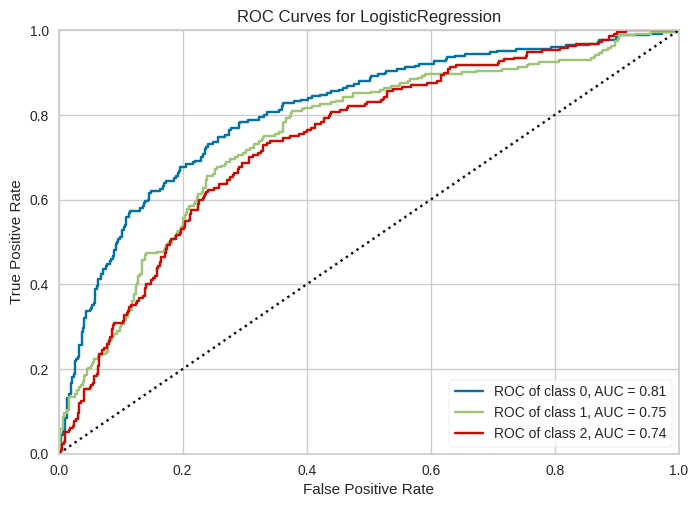

In [ ]:
evaluate_logistic_regression(X, y, c_range, degree_range, 3)

 K Neighbors Classifier
 For NN =  1
 Confusion Matrix - 
 [[111  75  64]
 [ 55 115  71]
 [ 55  54 108]]
 Train accuracy score:  1.0
 Test accuracy score:  0.4717514124293785
 F1 Score =  0.4717778345652346
 Mean Squared Error =  1.0324858757062148
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.44      0.47       250
           1       0.47      0.48      0.47       241
           2       0.44      0.50      0.47       217

    accuracy                           0.47       708
   macro avg       0.47      0.47      0.47       708
weighted avg       0.47      0.47      0.47       708





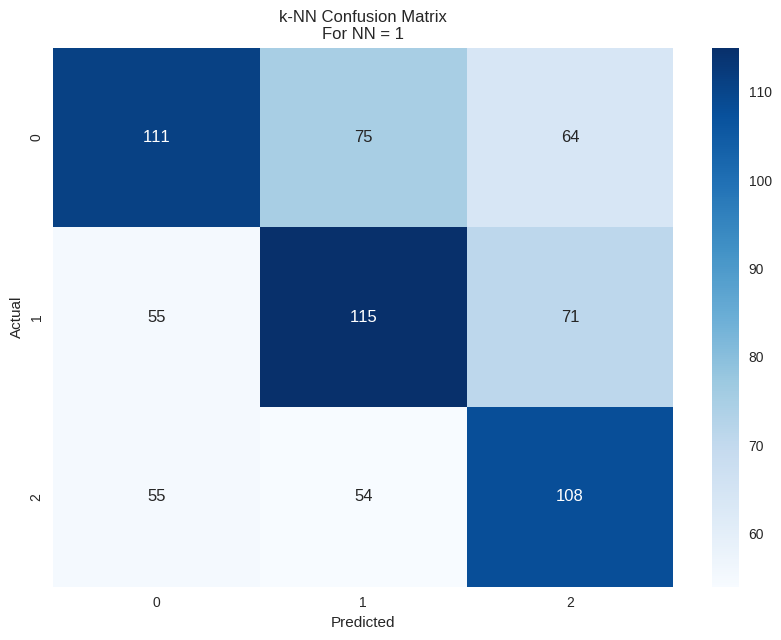

 K Neighbors Classifier
 For NN =  3
 Confusion Matrix - 
 [[134  53  63]
 [ 89  92  60]
 [ 81  42  94]]
 Train accuracy score:  0.7022630834512023
 Test accuracy score:  0.4519774011299435
 F1 Score =  0.44992387682819035
 Mean Squared Error =  1.1581920903954803
 Classification Report
               precision    recall  f1-score   support

           0       0.44      0.54      0.48       250
           1       0.49      0.38      0.43       241
           2       0.43      0.43      0.43       217

    accuracy                           0.45       708
   macro avg       0.46      0.45      0.45       708
weighted avg       0.46      0.45      0.45       708





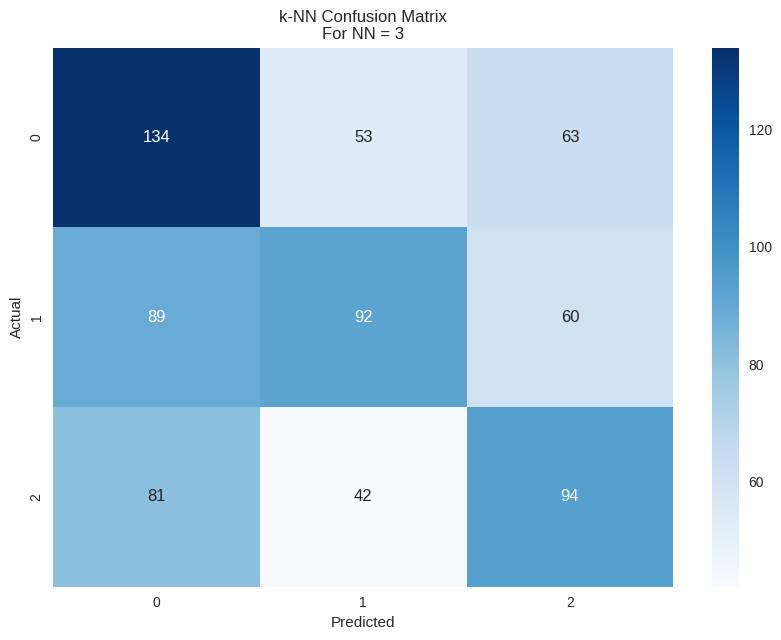

 K Neighbors Classifier
 For NN =  5
 Confusion Matrix - 
 [[130  60  60]
 [ 80 105  56]
 [ 76  55  86]]
 Train accuracy score:  0.6548797736916548
 Test accuracy score:  0.4533898305084746
 F1 Score =  0.45216171741045524
 Mean Squared Error =  1.1228813559322033
 Classification Report
               precision    recall  f1-score   support

           0       0.45      0.52      0.49       250
           1       0.48      0.44      0.46       241
           2       0.43      0.40      0.41       217

    accuracy                           0.45       708
   macro avg       0.45      0.45      0.45       708
weighted avg       0.45      0.45      0.45       708





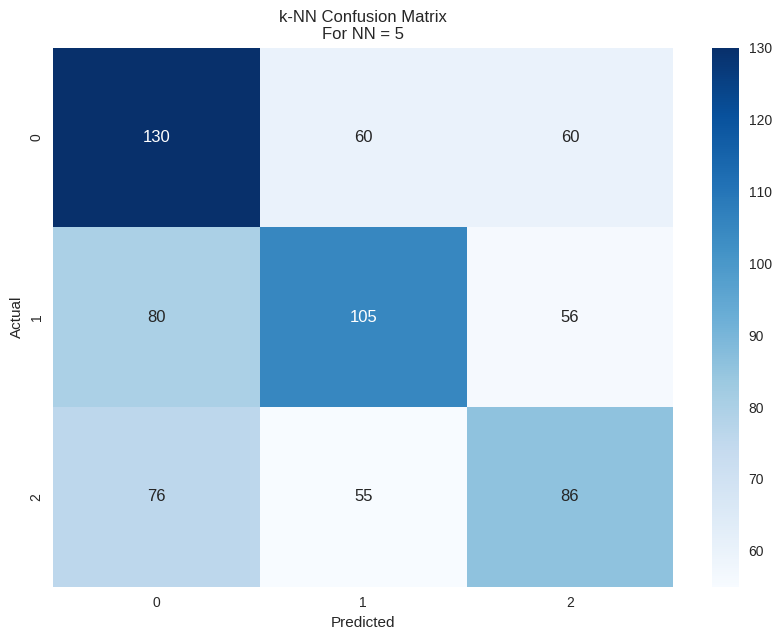

 K Neighbors Classifier
 For NN =  7
 Confusion Matrix - 
 [[125  54  71]
 [ 65 117  59]
 [ 67  53  97]]
 Train accuracy score:  0.6297736916548797
 Test accuracy score:  0.4788135593220339
 F1 Score =  0.47933177458453985
 Mean Squared Error =  1.1059322033898304
 Classification Report
               precision    recall  f1-score   support

           0       0.49      0.50      0.49       250
           1       0.52      0.49      0.50       241
           2       0.43      0.45      0.44       217

    accuracy                           0.48       708
   macro avg       0.48      0.48      0.48       708
weighted avg       0.48      0.48      0.48       708





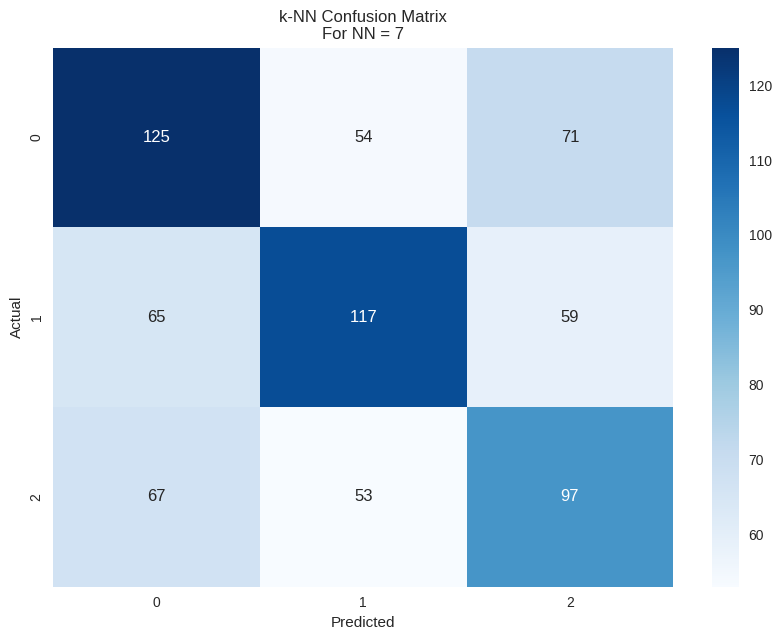

 K Neighbors Classifier
 For NN =  9
 Confusion Matrix - 
 [[127  58  65]
 [ 76 113  52]
 [ 71  53  93]]
 Train accuracy score:  0.6152758132956153
 Test accuracy score:  0.4703389830508475
 F1 Score =  0.4701115523538186
 Mean Squared Error =  1.1059322033898304
 Classification Report
               precision    recall  f1-score   support

           0       0.46      0.51      0.48       250
           1       0.50      0.47      0.49       241
           2       0.44      0.43      0.44       217

    accuracy                           0.47       708
   macro avg       0.47      0.47      0.47       708
weighted avg       0.47      0.47      0.47       708





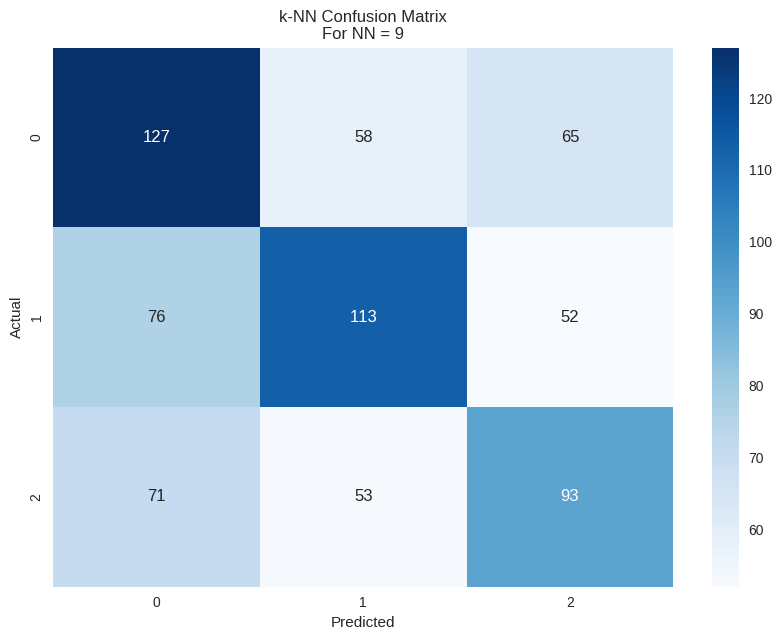

 K Neighbors Classifier
 For NN =  11
 Confusion Matrix - 
 [[128  61  61]
 [ 65 124  52]
 [ 63  57  97]]
 Train accuracy score:  0.5965346534653465
 Test accuracy score:  0.4929378531073446
 F1 Score =  0.4926774697665162
 Mean Squared Error =  1.0324858757062148
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.51      0.51       250
           1       0.51      0.51      0.51       241
           2       0.46      0.45      0.45       217

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





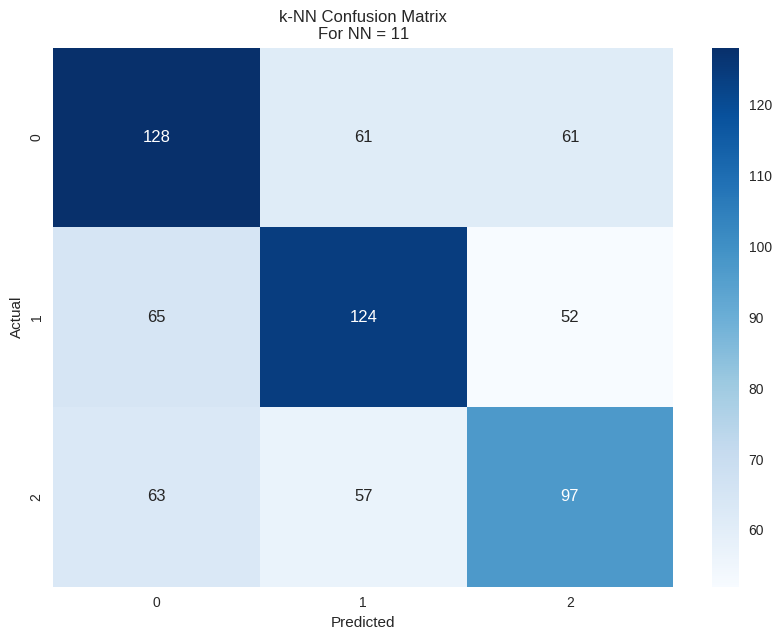

 K Neighbors Classifier
 For NN =  13
 Confusion Matrix - 
 [[126  59  65]
 [ 63 124  54]
 [ 63  57  97]]
 Train accuracy score:  0.592998585572843
 Test accuracy score:  0.4901129943502825
 F1 Score =  0.4900844953413479
 Mean Squared Error =  1.0522598870056497
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.50      0.50       250
           1       0.52      0.51      0.52       241
           2       0.45      0.45      0.45       217

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





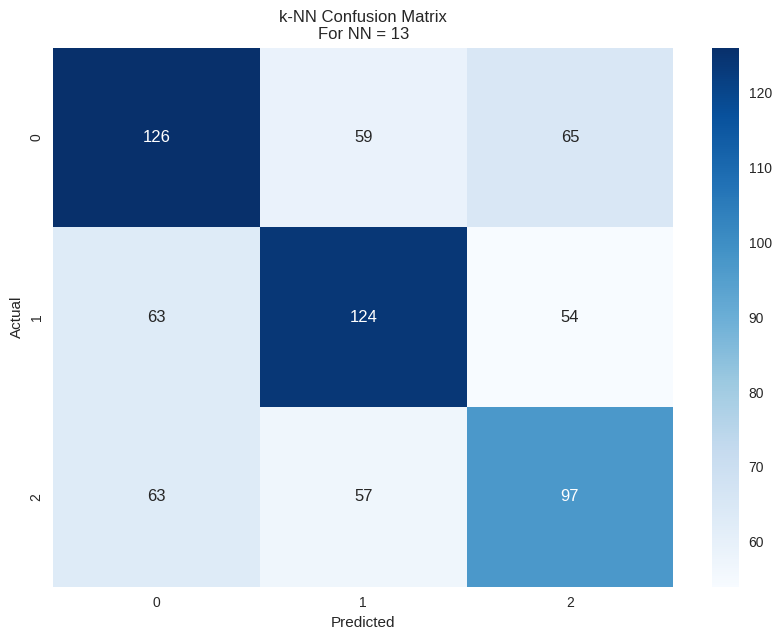

 K Neighbors Classifier
 For NN =  15
 Confusion Matrix - 
 [[120  58  72]
 [ 56 127  58]
 [ 56  61 100]]
 Train accuracy score:  0.5845120226308345
 Test accuracy score:  0.4901129943502825
 F1 Score =  0.49049314824652046
 Mean Squared Error =  1.0522598870056497
 Classification Report
               precision    recall  f1-score   support

           0       0.52      0.48      0.50       250
           1       0.52      0.53      0.52       241
           2       0.43      0.46      0.45       217

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





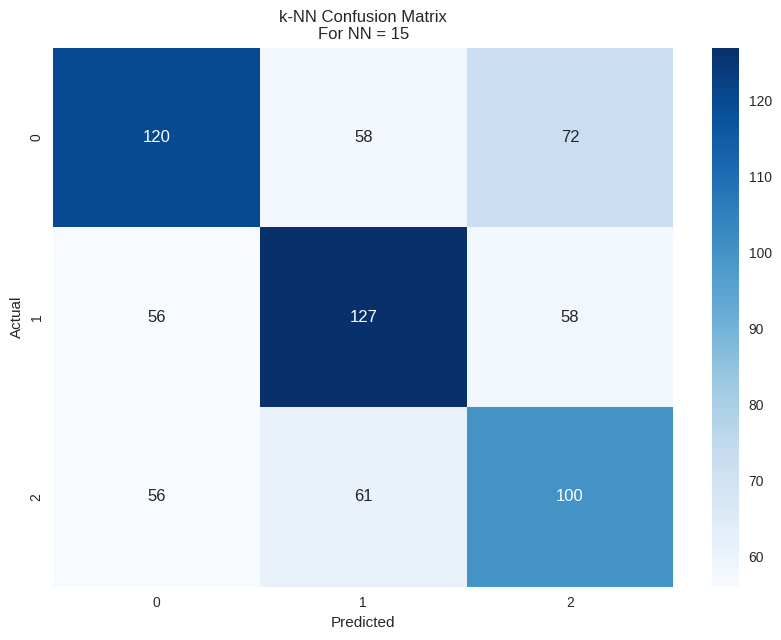

 K Neighbors Classifier
 For NN =  17
 Confusion Matrix - 
 [[120  56  74]
 [ 61 126  54]
 [ 57  63  97]]
 Train accuracy score:  0.5763790664780764
 Test accuracy score:  0.4844632768361582
 F1 Score =  0.48468661938770735
 Mean Squared Error =  1.0706214689265536
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.48      0.49       250
           1       0.51      0.52      0.52       241
           2       0.43      0.45      0.44       217

    accuracy                           0.48       708
   macro avg       0.48      0.48      0.48       708
weighted avg       0.49      0.48      0.48       708





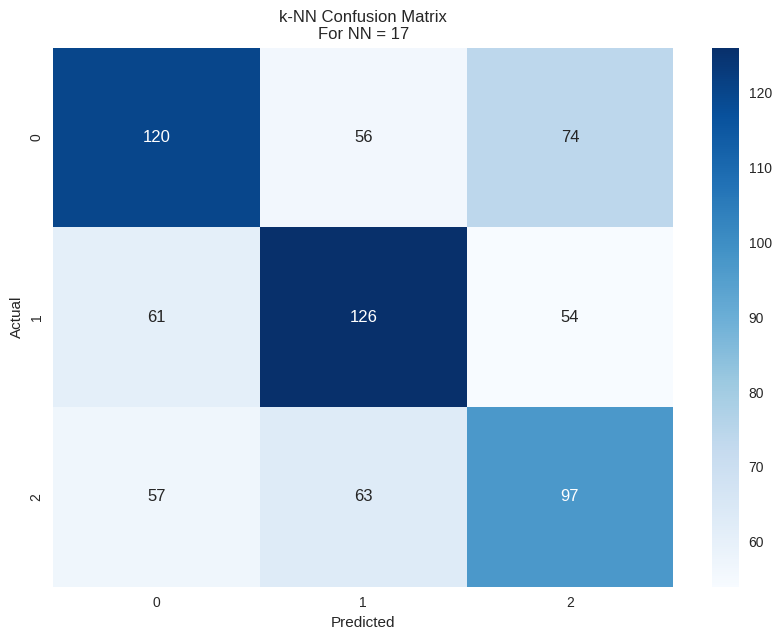

 K Neighbors Classifier
 For NN =  19
 Confusion Matrix - 
 [[124  51  75]
 [ 66 124  51]
 [ 58  56 103]]
 Train accuracy score:  0.5643564356435643
 Test accuracy score:  0.4957627118644068
 F1 Score =  0.49626244373376943
 Mean Squared Error =  1.0677966101694916
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.50      0.50       250
           1       0.54      0.51      0.53       241
           2       0.45      0.47      0.46       217

    accuracy                           0.50       708
   macro avg       0.50      0.50      0.50       708
weighted avg       0.50      0.50      0.50       708





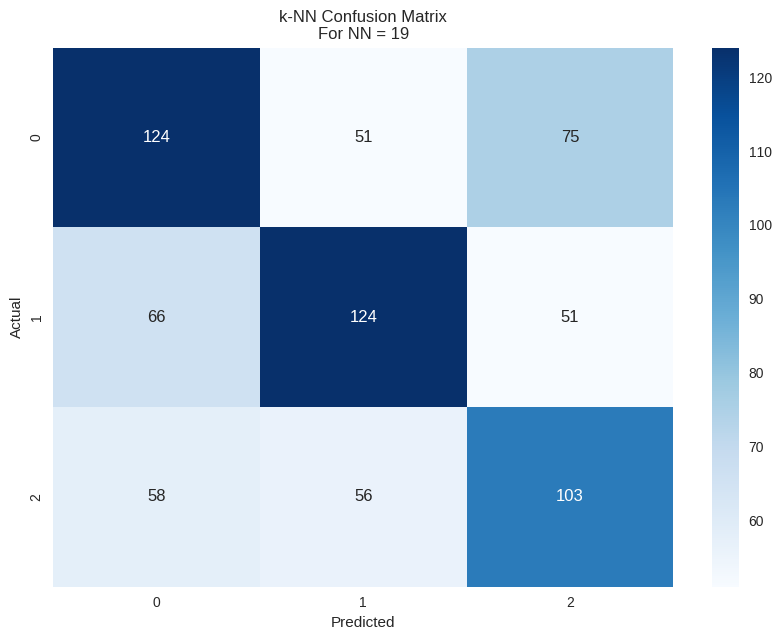

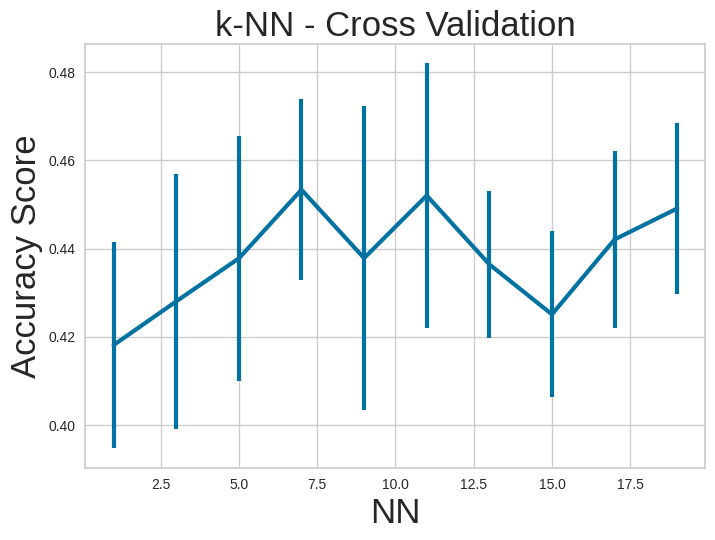

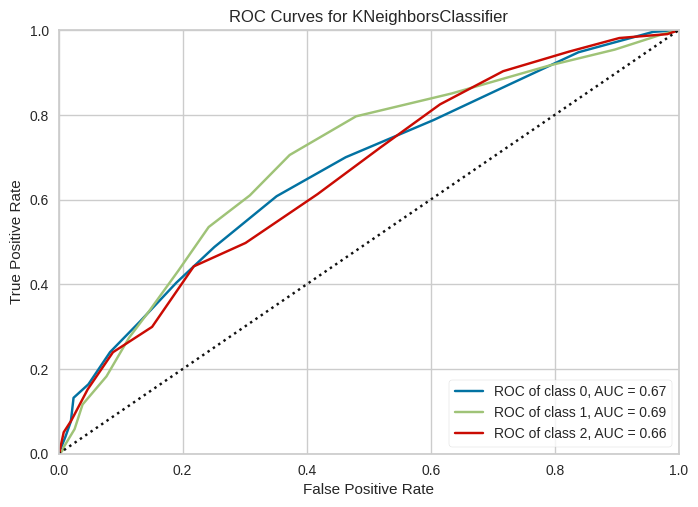

In [ ]:
evaluate_knn(X, y, nn_range, 3)

 Decision Tree Classifier
 For Depth =  3
 Confusion Matrix - 
 [[113  56  81]
 [ 47 166  28]
 [ 17  70 130]]
 Train accuracy score:  0.6113861386138614
 Test accuracy score:  0.577683615819209
 F1 Score =  0.5736764040227222
 Mean Squared Error =  0.8375706214689266
 Classification Report
               precision    recall  f1-score   support

           0       0.64      0.45      0.53       250
           1       0.57      0.69      0.62       241
           2       0.54      0.60      0.57       217

    accuracy                           0.58       708
   macro avg       0.58      0.58      0.57       708
weighted avg       0.59      0.58      0.57       708





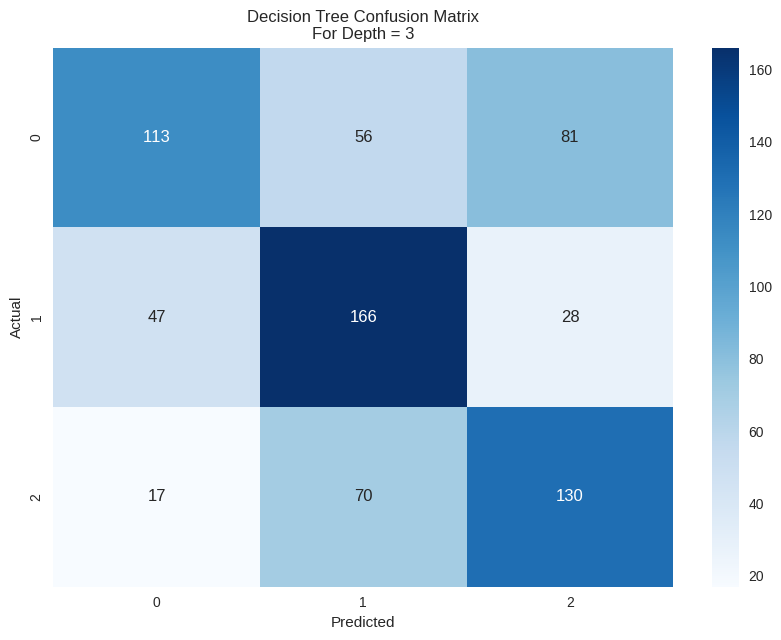

 Decision Tree Classifier
 For Depth =  5
 Confusion Matrix - 
 [[154  36  60]
 [ 70 136  35]
 [ 43  60 114]]
 Train accuracy score:  0.6619519094766619
 Test accuracy score:  0.5706214689265536
 F1 Score =  0.570147956393701
 Mean Squared Error =  0.865819209039548
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.62      0.60       250
           1       0.59      0.56      0.58       241
           2       0.55      0.53      0.54       217

    accuracy                           0.57       708
   macro avg       0.57      0.57      0.57       708
weighted avg       0.57      0.57      0.57       708





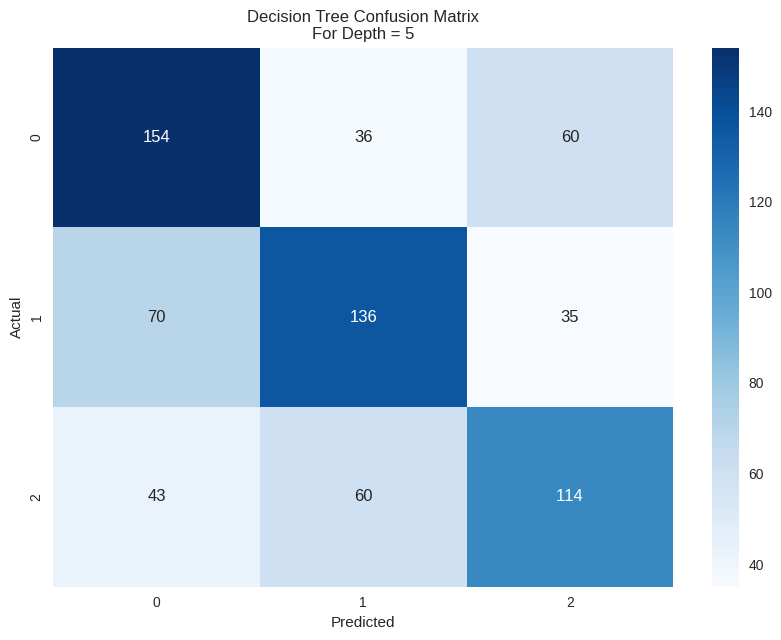

 Decision Tree Classifier
 For Depth =  7
 Confusion Matrix - 
 [[145  42  63]
 [ 52 136  53]
 [ 49  50 118]]
 Train accuracy score:  0.7443422913719944
 Test accuracy score:  0.5635593220338984
 F1 Score =  0.5642530848635082
 Mean Squared Error =  0.9110169491525424
 Classification Report
               precision    recall  f1-score   support

           0       0.59      0.58      0.58       250
           1       0.60      0.56      0.58       241
           2       0.50      0.54      0.52       217

    accuracy                           0.56       708
   macro avg       0.56      0.56      0.56       708
weighted avg       0.57      0.56      0.56       708





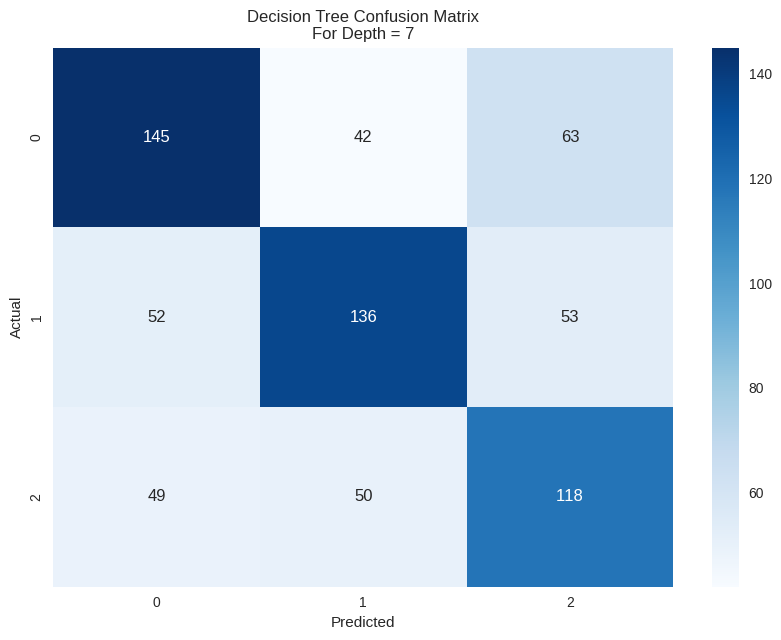

 Decision Tree Classifier
 For Depth =  9
 Confusion Matrix - 
 [[131  57  62]
 [ 48 147  46]
 [ 47  66 104]]
 Train accuracy score:  0.8412305516265912
 Test accuracy score:  0.53954802259887
 F1 Score =  0.5388060698806543
 Mean Squared Error =  0.922316384180791
 Classification Report
               precision    recall  f1-score   support

           0       0.58      0.52      0.55       250
           1       0.54      0.61      0.58       241
           2       0.49      0.48      0.48       217

    accuracy                           0.54       708
   macro avg       0.54      0.54      0.54       708
weighted avg       0.54      0.54      0.54       708





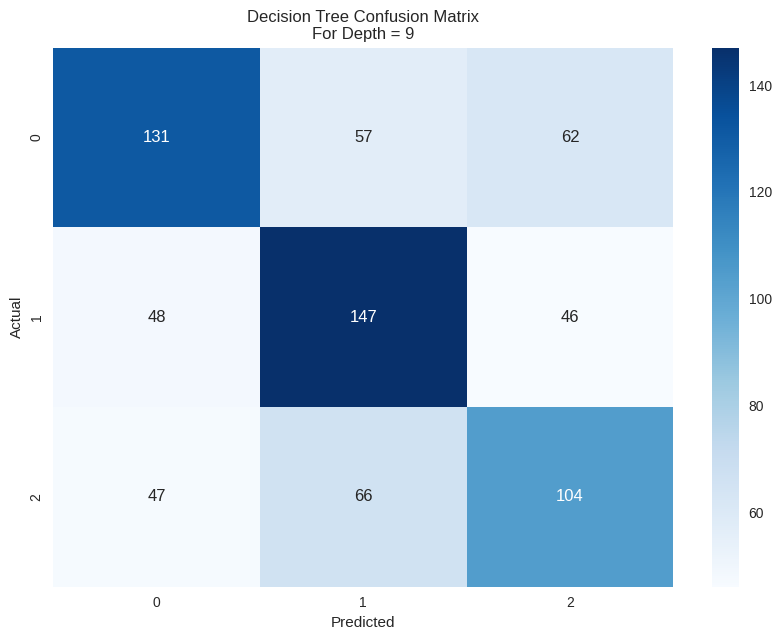

 Decision Tree Classifier
 For Depth =  11
 Confusion Matrix - 
 [[128  56  66]
 [ 53 136  52]
 [ 54  59 104]]
 Train accuracy score:  0.9335219236209336
 Test accuracy score:  0.519774011299435
 F1 Score =  0.5197881708951301
 Mean Squared Error =  0.9887005649717514
 Classification Report
               precision    recall  f1-score   support

           0       0.54      0.51      0.53       250
           1       0.54      0.56      0.55       241
           2       0.47      0.48      0.47       217

    accuracy                           0.52       708
   macro avg       0.52      0.52      0.52       708
weighted avg       0.52      0.52      0.52       708





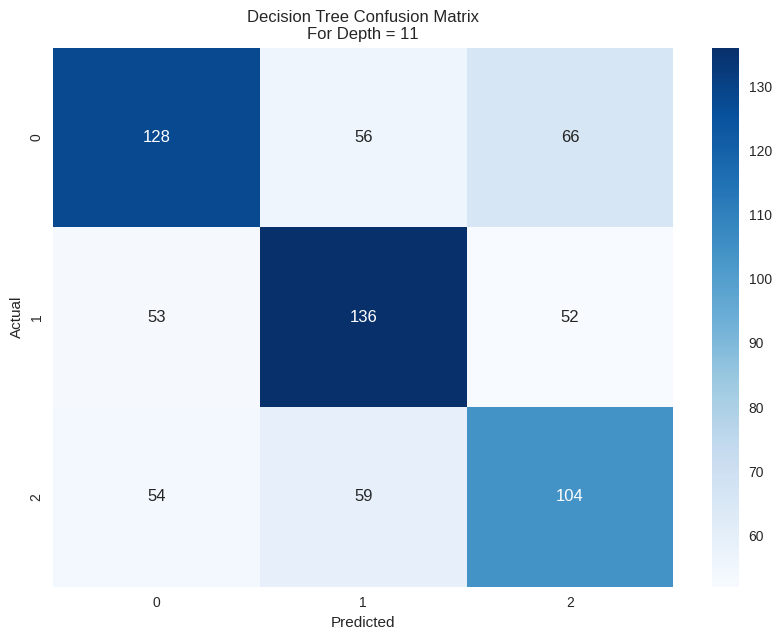

 Decision Tree Classifier
 For Depth =  13
 Confusion Matrix - 
 [[128  62  60]
 [ 58 131  52]
 [ 59  58 100]]
 Train accuracy score:  0.9692362093352193
 Test accuracy score:  0.5070621468926554
 F1 Score =  0.5067737695373082
 Mean Squared Error =  0.9971751412429378
 Classification Report
               precision    recall  f1-score   support

           0       0.52      0.51      0.52       250
           1       0.52      0.54      0.53       241
           2       0.47      0.46      0.47       217

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





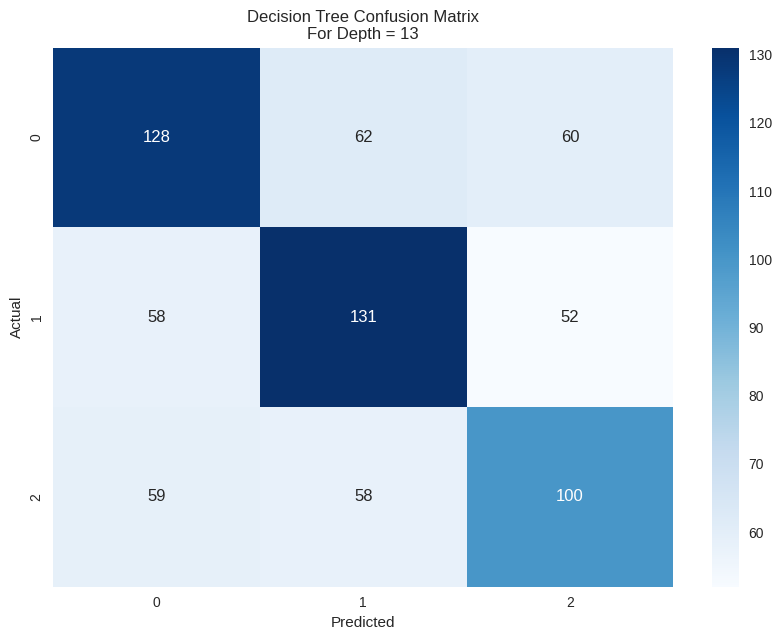

 Decision Tree Classifier
 For Depth =  15
 Confusion Matrix - 
 [[124  64  62]
 [ 57 137  47]
 [ 59  55 103]]
 Train accuracy score:  0.9890381895332391
 Test accuracy score:  0.5141242937853108
 F1 Score =  0.5135540530963919
 Mean Squared Error =  0.998587570621469
 Classification Report
               precision    recall  f1-score   support

           0       0.52      0.50      0.51       250
           1       0.54      0.57      0.55       241
           2       0.49      0.47      0.48       217

    accuracy                           0.51       708
   macro avg       0.51      0.51      0.51       708
weighted avg       0.51      0.51      0.51       708





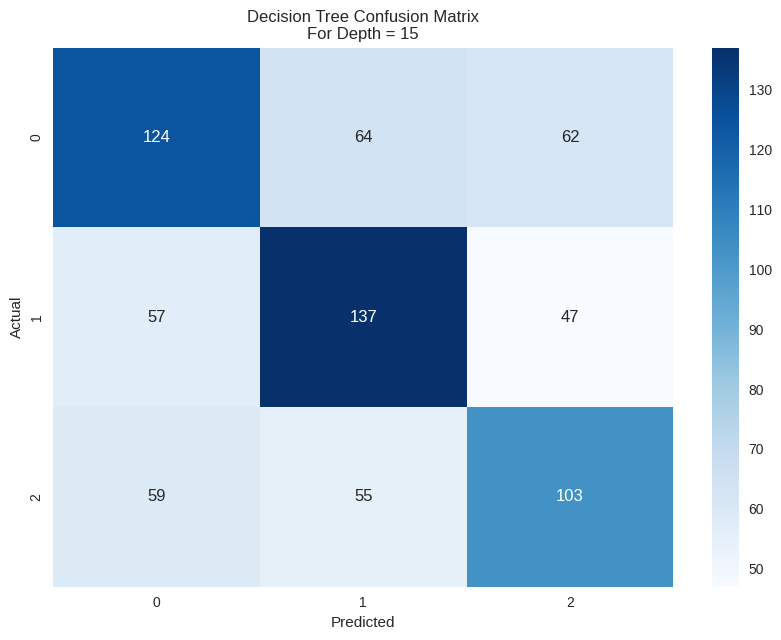

 Decision Tree Classifier
 For Depth =  17
 Confusion Matrix - 
 [[119  59  72]
 [ 59 129  53]
 [ 58  57 102]]
 Train accuracy score:  0.9964639321074965
 Test accuracy score:  0.4943502824858757
 F1 Score =  0.4944476805744853
 Mean Squared Error =  1.0564971751412429
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.48      0.49       250
           1       0.53      0.54      0.53       241
           2       0.45      0.47      0.46       217

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





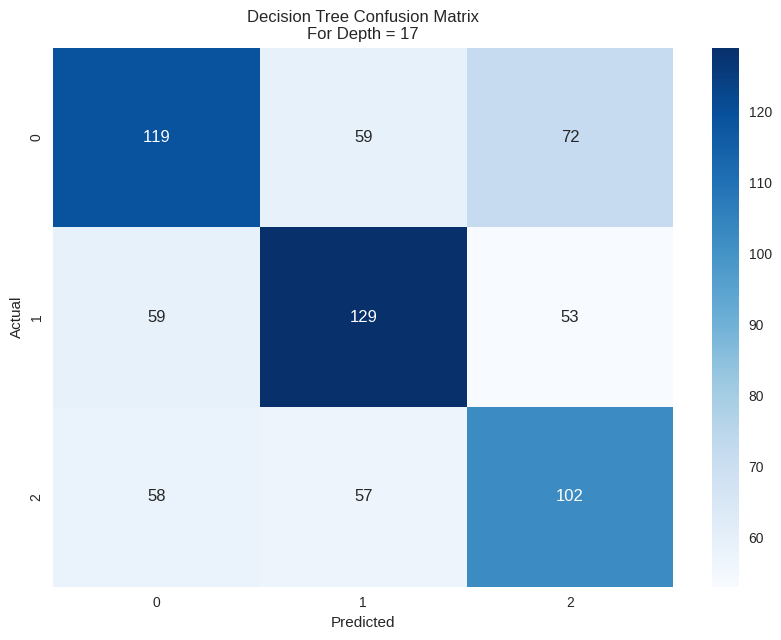

 Decision Tree Classifier
 For Depth =  19
 Confusion Matrix - 
 [[119  59  72]
 [ 60 130  51]
 [ 59  58 100]]
 Train accuracy score:  0.9975247524752475
 Test accuracy score:  0.4929378531073446
 F1 Score =  0.4928873340237608
 Mean Squared Error =  1.0621468926553672
 Classification Report
               precision    recall  f1-score   support

           0       0.50      0.48      0.49       250
           1       0.53      0.54      0.53       241
           2       0.45      0.46      0.45       217

    accuracy                           0.49       708
   macro avg       0.49      0.49      0.49       708
weighted avg       0.49      0.49      0.49       708





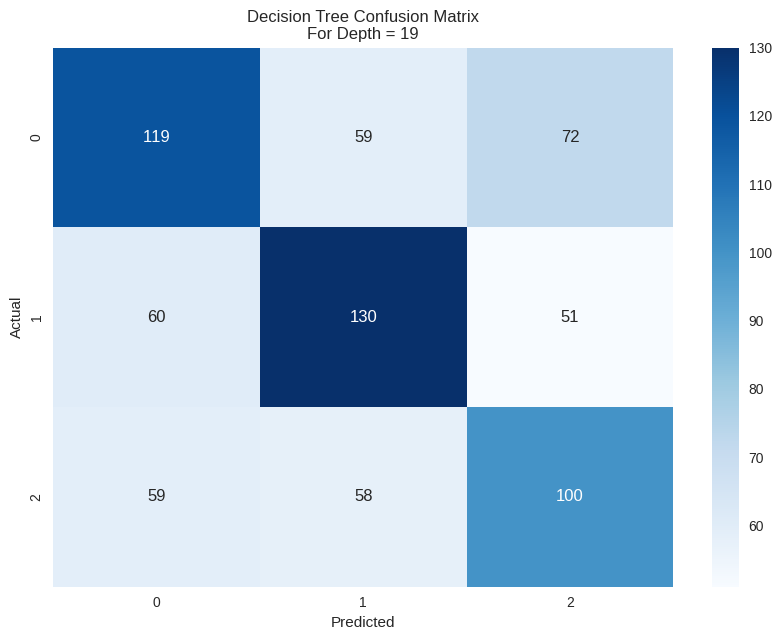

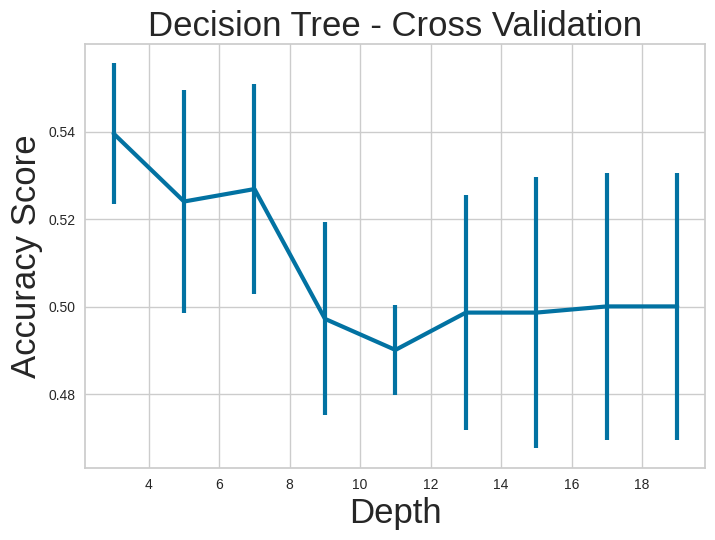

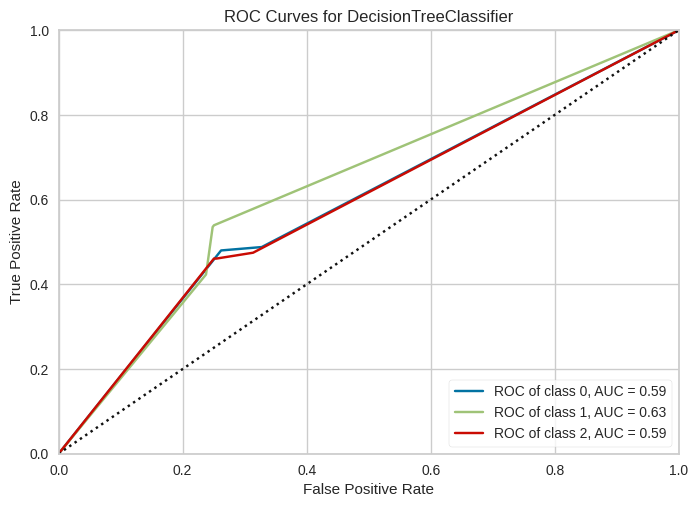

In [ ]:
evaluate_decision_tree(X, y, depth_range, 3)

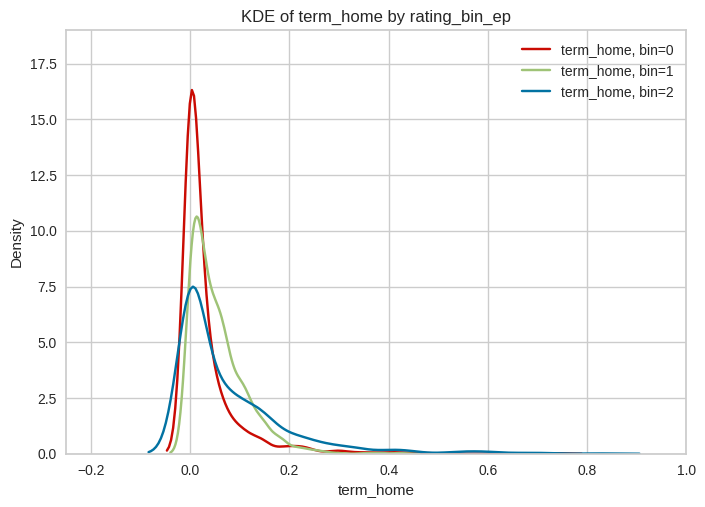

In [ ]:
plot_kde_by_bin(X, y, 'term_home', 'rating_bin_ep', bins=3, ylim=(0, 19), xlim=(-0.25, 1))

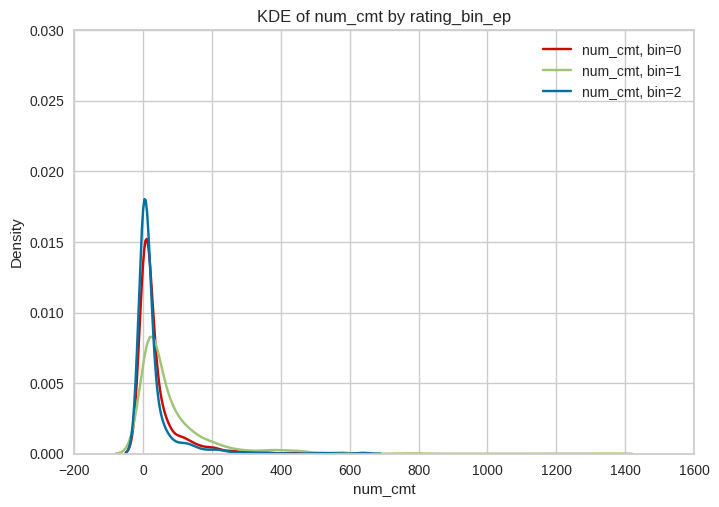

In [ ]:
plot_kde_by_bin(X, y, 'num_cmt', 'rating_bin_ep', bins=3, ylim=(0, 0.03), xlim=(-200, 1600))

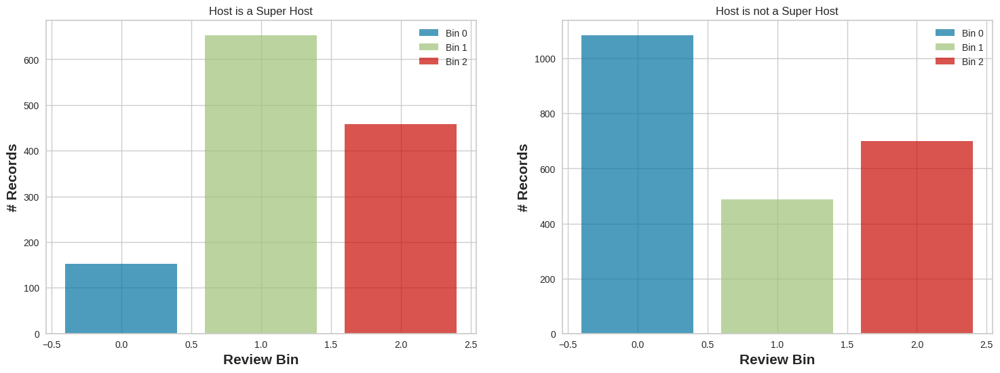

In [47]:
plot_super_host(X, y)